# Usign NLP to classify PDF docs (Three labels - Nota, DOC and Recibos)

# Merging labels and text into only one file

In [1]:
import nltk
import numpy as np
import random
import string

import bs4 as bs
import urllib.request
import re

import pandas, numpy
import pandas as pd 
import numpy as np

from nltk.corpus import webtext 
from nltk.collocations import BigramCollocationFinder 
from nltk.metrics import BigramAssocMeasures 
from random import random
from collections           import defaultdict
from gensim.models.phrases import Phrases, Phraser

df = pd.read_csv("C:/AI/krypton-01/csv-doc/revisado6.csv") 
##df =df.head(10000) 
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4448 entries, 0 to 4447
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   name    4448 non-null   object
 1   label   4443 non-null   object
dtypes: object(2)
memory usage: 69.6+ KB


In [2]:
from os import listdir
from os.path import isfile, join
mypath = 'C:/AI/krypton-01/texto'
onlyfile1 = [f for f in listdir(mypath) if isfile(join(mypath, f))]
print(len(onlyfile1))

4569


In [3]:
df1 = pd.DataFrame (columns = ['body','label','name','label1'])

In [4]:
for file1 in onlyfile1:
    #print(file1[-3:])
    #print(file1)
    #print(file1[:-4])
    if file1[-3:]=="txt":
        print(file1)
        text1 = open('C:/AI/krypton-01/texto/'+file1, "r+",encoding = 'utf-8-sig').read()
        df2 = pd.DataFrame([[text1, "",file1[:-4],""]], columns = ['body','label','name','label1'])
        df1=df1.append(df2)
        df1.reset_index(inplace = True, drop = True)

2017-06-27_08-47_2081291.txt
2017-06-27_08-47_2328549.txt
2017-06-27_08-47_2762289.txt
2017-06-27_08-47_5632222.txt
2017-06-27_08-47_5736801.txt
2017-06-27_08-47_6630378.txt
2017-06-27_08-47_6945680.txt
2017-06-27_08-47_8612042.txt
2017-06-27_08-47_9038559.txt
2017-06-27_08-47_9573012.txt
2017-06-27_10-14_1881821.txt
2017-06-27_10-14_6049154.txt
2017-06-27_10-14_9150233.txt
2017-06-28_09-47_1035992.txt
2017-06-29_08-03_8994805.txt
2017-06-29_09-12_9030590.txt
2017-06-29_09-34_6433716.txt
2017-06-29_11-32_2407431.txt
2017-06-29_11-36_1627262.txt
2017-06-30_09-35_6552132.txt
2017-06-30_13-21_5267056.txt
2017-06-30_14-09_1190062.txt
2017-06-30_14-09_7223992.txt
2017-06-30_14-09_8651457.txt
2017-07-03_09-41_7282193.txt
2017-07-03_13-46_1323416.txt
2017-07-05_10-36_6215036.txt
2017-07-12_13-22_1686331.txt
2017-07-12_13-29_3005962.txt
2017-07-12_13-33_4405247.txt
2017-07-12_13-42_2901228.txt
2017-07-12_13-45_5733409.txt
2017-07-12_13-49_2763458.txt
2017-07-12_13-56_9712107.txt
2017-07-12_13-

2017-08-14_11-20_8265989.txt
2017-08-14_11-36_7786595.txt
2017-08-14_12-53_1891260.txt
2017-08-14_14-25_7164964.txt
2017-08-17_09-23_1402845.txt
2017-08-17_09-23_1865537.txt
2017-08-17_09-23_2290642.txt
2017-08-17_09-23_3248925.txt
2017-08-17_09-23_3363832.txt
2017-08-17_09-23_3646265.txt
2017-08-17_09-23_4029503.txt
2017-08-17_09-23_4174915.txt
2017-08-17_09-23_4652796.txt
2017-08-17_09-23_5332603.txt
2017-08-17_09-23_5651511.txt
2017-08-17_09-23_5731908.txt
2017-08-17_09-23_6162653.txt
2017-08-17_09-23_6205083.txt
2017-08-17_09-23_6342030.txt
2017-08-17_09-23_6889790.txt
2017-08-17_09-23_8059294.txt
2017-08-17_09-23_8104498.txt
2017-08-17_09-23_8587902.txt
2017-08-17_09-23_8916714.txt
2017-08-17_09-23_9350187.txt
2017-08-17_09-23_9795015.txt
2017-08-17_10-39_9054711.txt
2017-08-17_11-21_1139345.txt
2017-08-17_11-21_3071362.txt
2017-08-17_11-21_3822007.txt
2017-08-17_11-21_5934989.txt
2017-08-17_11-21_6970096.txt
2017-08-17_11-21_7315926.txt
2017-08-17_11-21_9688036.txt
2017-08-17_13-

2017-09-21_14-30_8409386.txt
2017-09-21_14-30_9069316.txt
2017-09-21_14-30_9158759.txt
2017-09-21_14-30_9434758.txt
2017-09-21_14-30_9694817.txt
2017-09-21_15-01_4812970.txt
2017-09-21_16-09_7901415.txt
2017-09-21_16-09_8223148.txt
2017-09-21_16-09_8332740.txt
2017-09-21_16-09_9219526.txt
2017-09-22_14-00_6266107.txt
2017-09-25_10-06_1195703.txt
2017-09-26_16-33_9200509.txt
2017-09-26_16-41_3864645.txt
2017-09-28_10-18_3641421.txt
2017-09-28_11-15_4866991.txt
2017-09-28_13-32_5500238.txt
2017-09-28_13-57_9647705.txt
2017-09-28_14-06_9458237.txt
2017-09-28_14-09_3727508.txt
2017-09-29_13-35_4094402.txt
2017-09-29_13-35_4794075.txt
2017-09-29_13-35_4949490.txt
2017-09-29_13-35_6049644.txt
2017-09-29_13-35_6751939.txt
2017-09-29_13-35_7628287.txt
2017-09-29_13-35_8192768.txt
2017-09-29_15-36_3577337.txt
2017-09-29_15-43_8761293.txt
2017-09-29_15-43_9439754.txt
2017-09-29_15-51_8652417.txt
2017-09-29_15-53_3719202.txt
2017-09-29_15-54_1433232.txt
2017-09-29_16-00_5811245.txt
2017-09-29_17-

2017-10-24_07-18_6164654.txt
2017-10-24_07-18_6326884.txt
2017-10-24_07-18_6514869.txt
2017-10-24_07-18_6864734.txt
2017-10-24_07-18_6869848.txt
2017-10-24_07-18_7017438.txt
2017-10-24_07-18_7199356.txt
2017-10-24_07-18_7358097.txt
2017-10-24_07-18_7471325.txt
2017-10-24_07-18_7697747.txt
2017-10-24_07-18_7802028.txt
2017-10-24_07-18_7940209.txt
2017-10-24_07-18_8235928.txt
2017-10-24_07-18_8238611.txt
2017-10-24_07-18_8314582.txt
2017-10-24_07-18_8324335.txt
2017-10-24_07-18_8452851.txt
2017-10-24_07-18_8477095.txt
2017-10-24_07-18_8624206.txt
2017-10-24_07-18_8724268.txt
2017-10-24_07-18_9099204.txt
2017-10-24_07-18_9528449.txt
2017-10-24_07-18_9570120.txt
2017-10-24_07-18_9624234.txt
2017-10-24_07-18_9661830.txt
2017-10-24_07-18_9736104.txt
2017-10-24_07-18_9746186.txt
2017-10-24_10-11_5292835.txt
2017-10-24_11-20_1196459.txt
2017-10-24_11-20_2769157.txt
2017-10-24_12-00_6509121.txt
2017-10-24_14-35_1642712.txt
2017-10-25_17-45_4953366.txt
2017-10-25_17-47_9027512.txt
2017-10-25_18-

2017-11-20_15-13_5498718.txt
2017-11-20_16-54_3533295.txt
2017-11-21_09-09_3407796.txt
2017-11-21_10-49_4000807-0.txt
2017-11-21_10-49_4000807-1.txt
2017-11-21_10-49_8978355-0.txt
2017-11-21_10-49_8978355-1.txt
2017-11-21_10-49_9069899-0.txt
2017-11-21_10-49_9069899-1.txt
2017-11-22_13-09_1651443.txt
2017-11-22_16-41_1191249-0.txt
2017-11-22_16-41_1191249-1.txt
2017-11-22_16-41_1191249-2.txt
2017-11-22_16-41_1191249-3.txt
2017-11-22_16-43_5964767-0.txt
2017-11-22_16-43_5964767-1.txt
2017-11-22_16-43_5964767-2.txt
2017-11-22_16-43_5964767-3.txt
2017-11-22_16-44_1418184-0.txt
2017-11-22_16-44_1418184-1.txt
2017-11-22_16-44_1418184-2.txt
2017-11-22_16-44_1418184-3.txt
2017-11-22_16-45_1681824-0.txt
2017-11-22_16-45_1681824-1.txt
2017-11-22_16-45_1681824-2.txt
2017-11-22_16-45_1681824-3.txt
2017-11-23_10-55_7283079.txt
2017-11-23_14-37_2665511.txt
2017-11-23_15-05_1954768.txt
2017-11-23_15-05_2681060.txt
2017-11-23_15-05_3300970.txt
2017-11-23_15-05_3466461.txt
2017-11-23_15-05_3776068.txt

2017-12-22_08-36_8004179.txt
2017-12-22_08-36_8981557.txt
2017-12-22_08-36_9458893.txt
2017-12-22_08-38_6898471.txt
2017-12-22_08-43_1557841.txt
2017-12-22_09-36_3518072.txt
2017-12-22_10-36_2361306.txt
2017-12-22_10-36_2388820.txt
2017-12-22_10-36_3031086.txt
2017-12-22_10-36_3440249.txt
2017-12-22_10-36_4815352.txt
2017-12-22_10-36_5058001.txt
2017-12-22_10-36_5170713.txt
2017-12-22_10-36_5174521.txt
2017-12-22_10-36_6251525.txt
2017-12-22_10-36_7047708.txt
2017-12-22_10-36_8957232.txt
2017-12-22_10-36_9232549.txt
2017-12-22_10-36_9388923.txt
2017-12-22_10-36_9422651.txt
2017-12-22_10-36_9440025.txt
2017-12-22_10-36_9494012.txt
2017-12-22_14-41_9269552.txt
2017-12-22_14-43_1953109.txt
2017-12-22_14-57_6937400.txt
2017-12-22_15-00_9113293.txt
2017-12-22_15-37_5278398.txt
2017-12-22_16-11_6908438.txt
2017-12-22_17-50_8521075.txt
2017-12-22_20-08_1093188.txt
2017-12-22_20-08_2298901.txt
2017-12-22_20-08_6626132.txt
2017-12-22_20-08_6626647.txt
2017-12-22_20-08_6677257.txt
2017-12-22_20-

2018-01-19_10-08_1343296.txt
2018-01-19_10-08_2070535.txt
2018-01-19_10-08_2899478.txt
2018-01-19_10-08_3322327.txt
2018-01-19_10-08_3406454.txt
2018-01-19_10-08_3793766.txt
2018-01-19_10-08_4212545.txt
2018-01-19_10-08_4965316.txt
2018-01-19_10-08_5147594.txt
2018-01-19_10-08_6496172.txt
2018-01-19_10-08_7997330.txt
2018-01-19_10-08_8504519.txt
2018-01-19_10-08_9996788.txt
2018-01-19_11-11_4808386.txt
2018-01-19_11-15_8873451.txt
2018-01-19_13-28_5472258.txt
2018-01-19_13-35_4938647.txt
2018-01-19_15-16_9827151.txt
2018-01-19_15-22_7395065.txt
2018-01-19_15-23_2129730.txt
2018-01-22_16-13_8897785.txt
2018-01-22_17-11_2835202-0.txt
2018-01-22_17-11_2835202-1.txt
2018-01-23_14-54_1511837-0.txt
2018-01-23_14-54_1511837-1.txt
2018-01-23_14-54_1511837-2.txt
2018-01-23_14-54_1511837-3.txt
2018-01-23_14-54_1511837-4.txt
2018-01-23_14-54_1511837-5.txt
2018-01-23_16-05_1261769.txt
2018-01-23_16-05_1343793.txt
2018-01-23_16-05_3380885.txt
2018-01-23_16-05_3866472.txt
2018-01-23_16-05_5731993.tx

2018-02-20_16-25_8307002.txt
2018-02-20_16-25_8312479.txt
2018-02-20_16-25_8582595.txt
2018-02-20_16-25_9098573.txt
2018-02-20_16-25_9298829.txt
2018-02-20_16-25_9653800.txt
2018-02-21_14-40_4130289.txt
2018-02-21_14-53_3192982.txt
2018-02-21_14-59_9074143.txt
2018-02-22_11-01_1303050.txt
2018-02-22_11-01_2005109.txt
2018-02-22_11-01_2352538.txt
2018-02-22_11-01_8753302.txt
2018-02-22_16-18_5546981.txt
2018-02-22_16-18_7045343.txt
2018-02-22_16-25_1576024.txt
2018-02-22_16-25_2048991.txt
2018-02-22_16-25_4355893.txt
2018-02-22_16-27_8292600.txt
2018-02-22_16-29_6616660.txt
2018-02-23_08-58_4089838.txt
2018-02-23_09-01_2787002.txt
2018-02-23_09-01_4278256.txt
2018-02-23_09-02_5103420.txt
2018-02-23_13-29_5788310-0.txt
2018-02-23_13-29_5788310-1.txt
2018-02-23_15-15_1717317.txt
2018-02-23_15-16_4922332.txt
2018-02-26_08-27_3182725.txt
2018-02-26_08-27_3928640.txt
2018-02-26_08-48_7626635.txt
2018-02-26_08-51_2361417.txt
2018-02-27_07-48_7199236.txt
2018-02-27_13-20_4749073.txt
2018-02-28

2018-03-28_08-41_3298692.txt
2018-03-28_08-41_4941931.txt
2018-03-28_08-41_5015746.txt
2018-03-28_08-41_5191086.txt
2018-03-28_08-41_5245406.txt
2018-03-28_08-41_5339730.txt
2018-03-28_08-41_6056060.txt
2018-03-28_08-41_6156932.txt
2018-03-28_08-41_6388725.txt
2018-03-28_08-41_7086811.txt
2018-03-28_08-41_7364788.txt
2018-03-28_08-41_8394962.txt
2018-03-28_08-41_8398435.txt
2018-03-28_08-41_9260544.txt
2018-03-28_08-41_9992323.txt
2018-03-28_09-07_2434796.txt
2018-03-28_09-20_3565020.txt
2018-03-28_09-29_6403473.txt
2018-03-28_09-35_4912689.txt
2018-03-28_09-35_5957207.txt
2018-03-28_09-43_3031930.txt
2018-03-28_09-45_7845988.txt
2018-03-28_09-47_9407600.txt
2018-03-28_09-50_1830163.txt
2018-03-28_09-50_2838080.txt
2018-03-28_09-53_3919461.txt
2018-03-28_09-55_2682821.txt
2018-03-28_09-55_5714631.txt
2018-03-28_09-55_8373166.txt
2018-03-28_14-31_8622216.txt
2018-03-28_14-38_7547926-0.txt
2018-03-28_14-38_7547926-1.txt
2018-03-28_14-50_1741506.txt
2018-03-28_15-07_7419138.txt
2018-03-28

2018-04-16_11-33_5546618.txt
2018-04-16_11-33_5772976.txt
2018-04-16_11-33_5881956.txt
2018-04-16_11-33_6102847.txt
2018-04-16_11-33_6166478.txt
2018-04-16_11-33_6181259.txt
2018-04-16_11-33_6520459.txt
2018-04-16_11-33_7159161.txt
2018-04-16_11-33_8240838.txt
2018-04-16_11-33_8443813.txt
2018-04-16_11-33_8634998.txt
2018-04-16_11-33_9021420.txt
2018-04-16_11-33_9596932.txt
2018-04-16_11-33_9693044.txt
2018-04-16_11-33_9808317.txt
2018-04-16_11-33_9852207.txt
2018-04-16_13-42_9015569-0.txt
2018-04-16_13-42_9015569-1.txt
2018-04-17_11-29_1084384.txt
2018-04-17_11-29_2110507.txt
2018-04-17_11-29_4400856.txt
2018-04-17_11-29_6070747.txt
2018-04-17_11-29_6164018.txt
2018-04-17_11-29_6280934.txt
2018-04-17_11-29_9031534.txt
2018-04-17_11-29_9787382.txt
2018-04-17_11-29_9992810.txt
2018-04-18_09-31_1058435-0.txt
2018-04-18_09-31_1058435-1.txt
2018-04-18_11-26_3284970-0.txt
2018-04-18_11-26_3284970-1.txt
2018-04-18_12-46_4244708.txt
2018-04-18_16-33_9148637.txt
2018-04-19_08-32_1701595.txt
20

2018-05-04_11-26_3882765.txt
2018-05-04_11-26_6264873.txt
2018-05-04_11-27_4384330.txt
2018-05-04_11-33_2387320.txt
2018-05-04_13-07_3936783.txt
2018-05-04_13-07_4558284.txt
2018-05-04_16-38_1109907.txt
2018-05-07_08-19_9794052.txt
2018-05-07_10-59_2212538.txt
2018-05-07_10-59_3761524.txt
2018-05-07_10-59_4185591.txt
2018-05-07_10-59_6569050.txt
2018-05-07_10-59_7147172.txt
2018-05-07_10-59_7509629.txt
2018-05-07_10-59_8361475.txt
2018-05-07_10-59_8452870.txt
2018-05-07_10-59_9640481.txt
2018-05-07_10-59_9785365.txt
2018-05-07_14-02_4142644.txt
2018-05-09_10-28_1049494.txt
2018-05-09_10-28_4291361.txt
2018-05-09_10-28_9817001.txt
2018-05-09_11-39_1522322.txt
2018-05-09_11-39_1605486.txt
2018-05-09_11-39_1733096.txt
2018-05-09_11-39_1961075.txt
2018-05-09_11-39_2721521.txt
2018-05-09_11-39_2850468.txt
2018-05-09_11-39_2994910.txt
2018-05-09_11-39_3585706.txt
2018-05-09_11-39_3592537.txt
2018-05-09_11-39_3800024.txt
2018-05-09_11-39_4236874.txt
2018-05-09_11-39_5109860.txt
2018-05-09_11-

2018-06-04_10-12_7209321.txt
2018-06-04_10-12_7506192.txt
2018-06-04_10-12_7648320.txt
2018-06-04_10-12_7816502.txt
2018-06-04_10-12_8234489.txt
2018-06-04_10-12_8328676.txt
2018-06-04_10-12_8431259.txt
2018-06-04_10-12_8480931.txt
2018-06-04_10-12_8749060.txt
2018-06-04_10-12_8861941.txt
2018-06-04_10-12_9130861.txt
2018-06-04_10-12_9651332.txt
2018-06-04_11-14_9901601.txt
2018-06-04_11-19_4988938.txt
2018-06-04_11-34_8032607.txt
2018-06-04_11-36_8031664.txt
2018-06-04_11-44_9518840.txt
2018-06-04_11-48_1001229.txt
2018-06-04_13-21_3244372.txt
2018-06-04_13-21_7413341.txt
2018-06-05_11-24_1700988.txt
2018-06-05_11-24_2428165.txt
2018-06-05_11-24_2792960.txt
2018-06-05_11-24_2812522.txt
2018-06-05_11-24_2954587.txt
2018-06-05_11-24_3167025.txt
2018-06-05_11-24_3683131.txt
2018-06-05_11-24_3765397.txt
2018-06-05_11-24_3832564.txt
2018-06-05_11-24_4163814.txt
2018-06-05_11-24_4335771.txt
2018-06-05_11-24_5034450.txt
2018-06-05_11-24_5081592.txt
2018-06-05_11-24_5197785.txt
2018-06-05_11-

2018-06-29_11-00_3345328.txt
2018-06-29_11-00_4630026.txt
2018-06-29_11-00_5999507.txt
2018-06-29_11-00_6508752.txt
2018-06-29_11-00_7103530.txt
2018-06-29_11-00_7359238.txt
2018-06-29_11-00_7547654.txt
2018-06-29_11-18_1987392.txt
2018-06-29_11-18_6764365.txt
2018-06-29_11-18_7384564.txt
2018-06-29_11-18_7756425.txt
2018-06-29_11-18_8226359.txt
2018-06-29_11-18_9758126.txt
2018-06-29_11-23_2820968.txt
2018-06-29_11-23_3234868.txt
2018-06-29_11-23_3652691.txt
2018-06-29_11-23_4317074.txt
2018-06-29_11-23_5525115.txt
2018-06-29_11-23_6060978.txt
2018-06-29_11-23_6079489.txt
2018-06-29_11-23_6304042.txt
2018-06-29_11-23_6545380.txt
2018-06-29_11-23_6648751.txt
2018-06-29_11-23_8372103.txt
2018-06-29_11-23_9081860.txt
2018-06-29_11-23_9576489.txt
2018-06-29_15-31_7581868.txt
2018-06-29_16-40_9109817.txt
2018-06-29_16-43_4026105.txt
2018-06-29_16-52_8655706.txt
2018-06-29_16-52_8827747.txt
2018-06-29_16-52_9463005.txt
2018-07-02_14-34_1880885.txt
2018-07-02_14-34_1908210.txt
2018-07-02_14-

2018-07-27_14-16_E_1616_8357691.txt
2018-07-30_09-56_E_1616_9103671.txt
2018-07-30_13-24_E_1616_1423037.txt
2018-07-30_16-42_E_235_5146884.txt
2018-07-30_16-42_E_235_7975414.txt
2018-07-30_16-42_E_235_8522186.txt
2018-07-30_17-16_E_235_2422222.txt
2018-07-30_17-16_E_235_3197109.txt
2018-07-30_17-16_E_235_3203551.txt
2018-07-30_17-18_E_235_9594611.txt
2018-07-31_13-09_E_1616_2666745.txt
2018-07-31_13-09_E_1616_2773393.txt
2018-07-31_13-09_E_1616_8596196.txt
2018-07-31_13-12_E_1616_4065545.txt
2018-07-31_13-21_E_1616_8075605.txt
2018-07-31_13-28_E_1616_8742359.txt
2018-07-31_13-32_E_1616_1817277.txt
2018-07-31_13-35_E_1616_4754838.txt
2018-07-31_13-35_E_1616_7869027.txt
2018-07-31_13-40_E_1616_8745069.txt
2018-07-31_13-45_E_1616_7819017.txt
2018-07-31_13-46_E_1616_9496624.txt
2018-07-31_13-48_E_1616_5756095.txt
2018-07-31_14-56_E_1616_2878713.txt
2018-07-31_15-00_E_235_2662726.txt
2018-07-31_15-00_E_235_3405982.txt
2018-07-31_15-00_E_235_6134660.txt
2018-07-31_15-00_E_235_7918831.txt
201

2018-08-17_10-05_E_235_6303415.txt
2018-08-17_10-05_E_235_6803311.txt
2018-08-17_10-05_E_235_7895863.txt
2018-08-17_10-05_E_235_8336719.txt
2018-08-17_11-12_E_1125_2559119-0.txt
2018-08-17_11-12_E_1125_2559119-1.txt
2018-08-17_11-12_E_1125_3633309-0.txt
2018-08-17_11-12_E_1125_3633309-1.txt
2018-08-17_11-12_E_1125_7389598-0.txt
2018-08-17_11-12_E_1125_7389598-1.txt
2018-08-17_11-12_E_1125_8244024.txt
2018-08-17_11-12_E_1125_9108812.txt
2018-08-17_11-18_E_1125_7235624.txt
2018-08-17_11-20_E_1125_1873782.txt
2018-08-17_11-20_E_1125_9221405.txt
2018-08-17_11-24_E_1125_5508779.txt
2018-08-17_11-24_E_1125_9170126.txt
2018-08-17_11-31_E_1125_3722222.txt
2018-08-17_11-32_E_1125_7867687.txt
2018-08-17_11-32_E_1125_8980783.txt
2018-08-17_11-32_E_1125_9330989.txt
2018-08-17_11-35_E_1125_4431122.txt
2018-08-17_11-35_E_1125_5604823.txt
2018-08-17_11-35_E_1125_9232290.txt
2018-08-17_11-38_E_1125_4104952.txt
2018-08-17_11-38_E_1125_7428802.txt
2018-08-17_11-40_E_1125_2903606.txt
2018-08-17_11-40_E_1

2018-09-05_13-30_E_235_3394330.txt
2018-09-05_13-30_E_235_3617062.txt
2018-09-05_13-30_E_235_6138539.txt
2018-09-05_13-30_E_235_6398358.txt
2018-09-05_13-30_E_235_6836335.txt
2018-09-05_13-30_E_235_7037835.txt
2018-09-05_13-30_E_235_7865434.txt
2018-09-05_13-30_E_235_8447865.txt
2018-09-05_13-30_E_235_8798229.txt
2018-09-05_13-30_E_235_9208381.txt
2018-09-05_13-30_E_235_9812921.txt
2018-09-05_14-21_E_235_2837000.txt
2018-09-05_14-21_E_235_3846320.txt
2018-09-05_14-21_E_235_3929509.txt
2018-09-05_14-21_E_235_4098280.txt
2018-09-05_14-21_E_235_4768511.txt
2018-09-05_14-21_E_235_7058528.txt
2018-09-05_14-21_E_235_7868488.txt
2018-09-05_14-21_E_235_8770582.txt
2018-09-05_14-21_E_235_9761513.txt
2018-09-05_14-25_E_235_7476358.txt
2018-09-05_16-21_E_1616_9341979-0.txt
2018-09-05_16-21_E_1616_9341979-1.txt
2018-09-06_11-02_E_235_1197841.txt
2018-09-06_11-02_E_235_1317343.txt
2018-09-06_11-02_E_235_1724625.txt
2018-09-06_11-02_E_235_3162953.txt
2018-09-06_11-02_E_235_3314444.txt
2018-09-06_11-

2020-11-10_11-04-12-1605017052_E_1958_4937228.txt
2020-11-10_11-04-33-1605017073_E_1958_4588512.txt
2020-11-10_11-04-34-1605017074_E_1958_1741936.txt
2020-11-10_11-04-34-1605017074_E_1958_2294369.txt
2020-11-10_11-05-54-1605017154_E_1958_8507898.txt
2020-11-10_12-29-34-1605022174_E_1958_7143449.txt
2020-11-10_12-29-37-1605022177_E_1958_8592147.txt
2020-11-10_12-29-38-1605022178_E_1958_9026040.txt
2020-11-10_12-29-47-1605022187_E_1958_5968575.txt
2020-11-10_12-29-47-1605022187_E_1958_5972591.txt
2020-11-10_12-30-09-1605022209_E_1958_9384635.txt
2020-11-10_12-30-11-1605022211_E_1958_6193201.txt
2020-11-10_12-35-03-1605022503_E_1958_3366131.txt
2020-11-10_12-35-05-1605022505_E_1958_1191709-0.txt
2020-11-10_12-35-05-1605022505_E_1958_1191709-1.txt
2020-11-10_12-35-05-1605022505_E_1958_1191709-2.txt
2020-11-10_12-35-05-1605022505_E_1958_1191709-3.txt
2020-11-10_12-35-05-1605022505_E_1958_1191709-4.txt
2020-11-10_12-35-05-1605022505_E_1958_1191709-5.txt
2020-11-10_12-35-15-1605022515_E_1958_

In [5]:
df1

,body,label,name,label1
0,2017-6-26 :: NFS-e - Nota Fiscal de Serviços e...,,2017-06-27_08-47_2081291,
1,6/222017 :: NFS-e - Nota Fiscal de Serviços el...,,2017-06-27_08-47_2328549,
2,\n \n \n \n \n\n \n\...,,2017-06-27_08-47_2762289,
3,"-il""ilit=i'E"" i'ﬂif'ﬁ'f'i” PREFEITURA MUNICIPA...",,2017-06-27_08-47_5632222,
4,-Hf-'ilitii'ﬂi' Eir'if'iämi” PREFEITURA MUNICI...,,2017-06-27_08-47_5736801,
...,...,...,...,...
4564,16/11/2020 Usuário: 07.775.025/0001-06 - NFS-e...,,2020-11-17_14-05-28-1605632728_E_1958_9325365,
4565,PREFEITURA MUNICIPAL DE ARAXÁ\n\nSECRETARIA MU...,,2020-11-17_16-57-23-1605643043_E_1958_4706368,
4566,:: NFS-e - Nota Fiscal de Serviços eletrônica ...,,2020-11-17_16-57-23-1605643043_E_1958_8191504,
4567,Prefeitura Municipal de Formiga\n\n1 ¡Noçm 202...,,2020-11-17_16-57-23-1605643043_E_1958_8491587,


In [6]:
len1=len(df)
len2=len(df1)
for i in range(len1):
    label1x=df['label'][i]
    file1x=df['name'][i]
    
    for i1 in range(len2):
        file2x=df1['name'][i1]
    
        if file1x==file2x:
            print(file1x)
            print(file2x)
            df1['label'][i1]=label1x
            if df1['label'][i1]=='NOTA':
                df1['label1'][i1]=0
            if df1['label'][i1]=='DOC':
                df1['label1'][i1]=1
            if df1['label'][i1]=='RECIBO':
                df1['label1'][i1]=2
            if df1['label'][i1]=='BOLETO':
                df1['label1'][i1]=3
            if df1['label'][i1]=='RPA':
                df1['label1'][i1]=4
            if df1['label'][i1]=='OUTROS':
                df1['label1'][i1]=5

2017-06-27_08-47_2081291
2017-06-27_08-47_2081291
2017-06-27_08-47_2328549
2017-06-27_08-47_2328549
2017-06-27_08-47_2762289
2017-06-27_08-47_2762289
2017-06-27_08-47_5632222
2017-06-27_08-47_5632222
2017-06-27_08-47_5736801
2017-06-27_08-47_5736801
2017-06-27_08-47_6630378
2017-06-27_08-47_6630378
2017-06-27_08-47_6945680
2017-06-27_08-47_6945680
2017-06-27_08-47_8612042
2017-06-27_08-47_8612042
2017-06-27_08-47_9038559
2017-06-27_08-47_9038559
2017-06-27_08-47_9573012
2017-06-27_08-47_9573012
2017-06-27_10-14_1881821
2017-06-27_10-14_1881821
2017-06-27_10-14_6049154
2017-06-27_10-14_6049154
2017-06-27_10-14_9150233
2017-06-27_10-14_9150233
2017-06-28_09-47_1035992
2017-06-28_09-47_1035992
2017-06-29_08-03_8994805
2017-06-29_08-03_8994805
2017-06-29_09-12_9030590
2017-06-29_09-12_9030590
2017-06-29_09-34_6433716
2017-06-29_09-34_6433716
2017-06-29_11-32_2407431
2017-06-29_11-32_2407431
2017-06-29_11-36_1627262
2017-06-29_11-36_1627262
2017-06-30_09-35_6552132
2017-06-30_09-35_6552132


2017-07-27_17-14_9557361
2017-07-27_17-14_9557361
2017-07-27_17-14_9899401
2017-07-27_17-14_9899401
2017-07-27_17-14_9927074
2017-07-27_17-14_9927074
2017-07-27_17-15_1024609
2017-07-27_17-15_1024609
2017-07-27_17-15_1780529
2017-07-27_17-15_1780529
2017-07-27_17-15_3439017
2017-07-27_17-15_3439017
2017-07-27_17-15_4507161
2017-07-27_17-15_4507161
2017-07-27_17-15_6364542
2017-07-27_17-15_6364542
2017-07-27_17-15_8810591
2017-07-27_17-15_8810591
2017-07-27_17-15_8920231
2017-07-27_17-15_8920231
2017-07-31_08-52_3712389
2017-07-31_08-52_3712389
2017-07-31_09-31_7781276
2017-07-31_09-31_7781276
2017-07-31_10-10_5806390
2017-07-31_10-10_5806390
2017-07-31_10-25_9549581
2017-07-31_10-25_9549581
2017-08-01_08-24_1833610
2017-08-01_08-24_1833610
2017-08-01_09-01_4143627
2017-08-01_09-01_4143627
2017-08-01_09-13_1098691
2017-08-01_09-13_1098691
2017-08-01_10-43_2894899
2017-08-01_10-43_2894899
2017-08-02_11-48_1384710
2017-08-02_11-48_1384710
2017-08-02_11-48_1755538
2017-08-02_11-48_1755538


2017-08-25_13-37_1573429
2017-08-25_13-37_1573429
2017-08-28_10-01_3037059
2017-08-28_10-01_3037059
2017-08-28_10-27_6162517-0
2017-08-28_10-27_6162517-0
2017-08-28_10-27_6162517-1
2017-08-28_10-27_6162517-1
2017-08-28_10-32_7848684
2017-08-28_10-32_7848684
2017-08-28_12-12_1021296
2017-08-28_12-12_1021296
2017-08-28_12-13_5855887
2017-08-28_12-13_5855887
2017-08-28_12-25_3065092
2017-08-28_12-25_3065092
2017-08-28_15-01_4774568
2017-08-28_15-01_4774568
2017-08-28_15-28_4714180
2017-08-28_15-28_4714180
2017-08-28_15-30_8274373
2017-08-28_15-30_8274373
2017-08-29_12-51_8965202
2017-08-29_12-51_8965202
2017-08-29_12-53_4193273
2017-08-29_12-53_4193273
2017-08-30_09-33_1268002
2017-08-30_09-33_1268002
2017-08-30_09-33_1718206
2017-08-30_09-33_1718206
2017-08-30_09-33_1772334
2017-08-30_09-33_1772334
2017-08-30_09-33_2152370
2017-08-30_09-33_2152370
2017-08-30_09-33_2212236
2017-08-30_09-33_2212236
2017-08-30_09-33_2432598
2017-08-30_09-33_2432598
2017-08-30_09-33_2442259
2017-08-30_09-33_

2017-09-21_14-30_1374594
2017-09-21_14-30_1374594
2017-09-21_14-30_1472544
2017-09-21_14-30_1472544
2017-09-21_14-30_1512442
2017-09-21_14-30_1512442
2017-09-21_14-30_1839118
2017-09-21_14-30_1839118
2017-09-21_14-30_1843069
2017-09-21_14-30_1843069
2017-09-21_14-30_2127188
2017-09-21_14-30_2127188
2017-09-21_14-30_2214054
2017-09-21_14-30_2214054
2017-09-21_14-30_3695399
2017-09-21_14-30_3695399
2017-09-21_14-30_4189610
2017-09-21_14-30_4189610
2017-09-21_14-30_4211128
2017-09-21_14-30_4211128
2017-09-21_14-30_4733069
2017-09-21_14-30_4733069
2017-09-21_14-30_4942555
2017-09-21_14-30_4942555
2017-09-21_14-30_5560674
2017-09-21_14-30_5560674
2017-09-21_14-30_5815944
2017-09-21_14-30_5815944
2017-09-21_14-30_5826182
2017-09-21_14-30_5826182
2017-09-21_14-30_6428085
2017-09-21_14-30_6428085
2017-09-21_14-30_6549976
2017-09-21_14-30_6549976
2017-09-21_14-30_6853091
2017-09-21_14-30_6853091
2017-09-21_14-30_7168195
2017-09-21_14-30_7168195
2017-09-21_14-30_7275355
2017-09-21_14-30_7275355


2017-10-03_16-07_8303324
2017-10-03_16-07_8303324
2017-10-03_16-07_9293286
2017-10-03_16-07_9293286
2017-10-04_13-32_5230792
2017-10-04_13-32_5230792
2017-10-04_15-02_3036867
2017-10-04_15-02_3036867
2017-10-04_15-02_3314844
2017-10-04_15-02_3314844
2017-10-04_15-19_4034290
2017-10-04_15-19_4034290
2017-10-04_15-19_4753714
2017-10-04_15-19_4753714
2017-10-04_15-25_5059416
2017-10-04_15-25_5059416
2017-10-04_15-27_4380597
2017-10-04_15-27_4380597
2017-10-04_15-30_8832213
2017-10-04_15-30_8832213
2017-10-04_16-01_1680466
2017-10-04_16-01_1680466
2017-10-04_16-01_3230420
2017-10-04_16-01_3230420
2017-10-04_16-01_4462291
2017-10-04_16-01_4462291
2017-10-04_16-01_5181443
2017-10-04_16-01_5181443
2017-10-04_16-01_5883155
2017-10-04_16-01_5883155
2017-10-04_16-01_6645442
2017-10-04_16-01_6645442
2017-10-04_16-55_7734072
2017-10-04_16-55_7734072
2017-10-05_10-20_2416749
2017-10-05_10-20_2416749
2017-10-05_13-10_4359841
2017-10-05_13-10_4359841
2017-10-05_13-27_9812075
2017-10-05_13-27_9812075


2017-10-24_07-18_9746186
2017-10-24_07-18_9746186
2017-10-24_10-11_5292835
2017-10-24_10-11_5292835
2017-10-24_11-20_1196459
2017-10-24_11-20_1196459
2017-10-24_11-20_2769157
2017-10-24_11-20_2769157
2017-10-24_12-00_6509121
2017-10-24_12-00_6509121
2017-10-24_14-35_1642712
2017-10-24_14-35_1642712
2017-10-26_11-28_1186900
2017-10-26_11-28_1186900
2017-10-27_15-06_8319631
2017-10-27_15-06_8319631
2017-10-30_08-56_3102698
2017-10-30_08-56_3102698
2017-10-30_08-56_4717560
2017-10-30_08-56_4717560
2017-10-30_08-56_9836358
2017-10-30_08-56_9836358
2017-10-30_08-58_6644843
2017-10-30_08-58_6644843
2017-10-30_09-14_2156280
2017-10-30_09-14_2156280
2017-10-30_09-45_3288381
2017-10-30_09-45_3288381
2017-10-30_10-22_5183156
2017-10-30_10-22_5183156
2017-10-30_10-23_1096865
2017-10-30_10-23_1096865
2017-10-30_10-23_1304232
2017-10-30_10-23_1304232
2017-10-30_10-23_1318525
2017-10-30_10-23_1318525
2017-10-30_10-23_2198676
2017-10-30_10-23_2198676
2017-10-30_10-23_2431230
2017-10-30_10-23_2431230


2017-11-10_14-24_8765219
2017-11-10_14-24_8765219
2017-11-10_14-27_1535757
2017-11-10_14-27_1535757
2017-11-10_14-27_5846569-0
2017-11-10_14-27_5846569-0
2017-11-10_14-27_5846569-1
2017-11-10_14-27_5846569-1
2017-11-10_14-27_6281339
2017-11-10_14-27_6281339
2017-11-10_14-27_6722974
2017-11-10_14-27_6722974
2017-11-10_14-27_6847555
2017-11-10_14-27_6847555
2017-11-10_14-27_8414642
2017-11-10_14-27_8414642
2017-11-10_14-27_9858778
2017-11-10_14-27_9858778
2017-11-10_17-16_1199972
2017-11-10_17-16_1199972
2017-11-13_08-33_1460279
2017-11-13_08-33_1460279
2017-11-13_08-33_2749995
2017-11-13_08-33_2749995
2017-11-13_08-33_3622230
2017-11-13_08-33_3622230
2017-11-13_08-33_4340676
2017-11-13_08-33_4340676
2017-11-13_08-33_4818851
2017-11-13_08-33_4818851
2017-11-13_08-33_6138019
2017-11-13_08-33_6138019
2017-11-13_08-33_6748270
2017-11-13_08-33_6748270
2017-11-13_08-33_6859431
2017-11-13_08-33_6859431
2017-11-13_08-33_7143753
2017-11-13_08-33_7143753
2017-11-13_08-33_7516729
2017-11-13_08-33_

2017-12-04_09-57_1438903-1
2017-12-04_09-57_1438903-1
2017-12-04_09-57_1727817
2017-12-04_09-57_1727817
2017-12-04_09-57_4434343
2017-12-04_09-57_4434343
2017-12-05_10-29_4536657
2017-12-05_10-29_4536657
2017-12-05_13-05_7920818
2017-12-05_13-05_7920818
2017-12-05_13-11_8051311
2017-12-05_13-11_8051311
2017-12-07_14-40_1175742
2017-12-07_14-40_1175742
2017-12-07_14-40_1313220
2017-12-07_14-40_1313220
2017-12-07_14-40_1672609
2017-12-07_14-40_1672609
2017-12-07_14-40_2022967
2017-12-07_14-40_2022967
2017-12-07_14-40_2343291
2017-12-07_14-40_2343291
2017-12-07_14-40_2622160
2017-12-07_14-40_2622160
2017-12-07_14-40_3018965
2017-12-07_14-40_3018965
2017-12-07_14-40_3200901
2017-12-07_14-40_3200901
2017-12-07_14-40_3930152
2017-12-07_14-40_3930152
2017-12-07_14-40_4717623
2017-12-07_14-40_4717623
2017-12-07_14-40_4747237
2017-12-07_14-40_4747237
2017-12-07_14-40_5621889
2017-12-07_14-40_5621889
2017-12-07_14-40_5634881
2017-12-07_14-40_5634881
2017-12-07_14-40_5754137
2017-12-07_14-40_5754

2017-12-22_20-08_2298901
2017-12-22_20-08_2298901
2017-12-22_20-08_6626132
2017-12-22_20-08_6626132
2017-12-22_20-08_6626647
2017-12-22_20-08_6626647
2017-12-22_20-08_6677257
2017-12-22_20-08_6677257
2017-12-22_20-08_8843690
2017-12-22_20-08_8843690
2017-12-22_20-08_9591630
2017-12-22_20-08_9591630
2017-12-22_20-09_2311013
2017-12-22_20-09_2311013
2017-12-22_20-09_2330624
2017-12-22_20-09_2330624
2017-12-22_20-09_4345136
2017-12-22_20-09_4345136
2017-12-22_20-09_4353173
2017-12-22_20-09_4353173
2017-12-22_20-09_5069143
2017-12-22_20-09_5069143
2017-12-22_20-09_5108420
2017-12-22_20-09_5108420
2017-12-22_20-09_5433357
2017-12-22_20-09_5433357
2017-12-22_20-09_5623176
2017-12-22_20-09_5623176
2017-12-22_20-09_6947657
2017-12-22_20-09_6947657
2017-12-22_20-09_6976219
2017-12-22_20-09_6976219
2017-12-22_20-09_9360900
2017-12-22_20-09_9360900
2017-12-26_16-34_3368968
2017-12-26_16-34_3368968
2017-12-26_16-34_5454517
2017-12-26_16-34_5454517
2017-12-26_16-34_6323837
2017-12-26_16-34_6323837


2018-01-10_17-44_7396474-5
2018-01-10_17-44_7396474-5
2018-01-11_15-05_2250309
2018-01-11_15-05_2250309
2018-01-11_16-41_9775908
2018-01-11_16-41_9775908
2018-01-11_16-53_9508462
2018-01-11_16-53_9508462
2018-01-11_16-54_6504067
2018-01-11_16-54_6504067
2018-01-12_13-38_2647915
2018-01-12_13-38_2647915
2018-01-12_13-38_4917974
2018-01-12_13-38_4917974
2018-01-12_13-45_7190419
2018-01-12_13-45_7190419
2018-01-15_10-22_1235938
2018-01-15_10-22_1235938
2018-01-15_10-22_2243078
2018-01-15_10-22_2243078
2018-01-15_10-22_2339865
2018-01-15_10-22_2339865
2018-01-15_10-22_2377448
2018-01-15_10-22_2377448
2018-01-15_10-22_2530314
2018-01-15_10-22_2530314
2018-01-15_10-22_2902050
2018-01-15_10-22_2902050
2018-01-15_10-22_3030930
2018-01-15_10-22_3030930
2018-01-15_10-22_3309534
2018-01-15_10-22_3309534
2018-01-15_10-22_3364871
2018-01-15_10-22_3364871
2018-01-15_10-22_3371708
2018-01-15_10-22_3371708
2018-01-15_10-22_3624345
2018-01-15_10-22_3624345
2018-01-15_10-22_3668724
2018-01-15_10-22_3668

2018-02-01_11-10_2676619
2018-02-01_11-10_2676619
2018-02-01_11-10_3062477
2018-02-01_11-10_3062477
2018-02-01_11-10_3501961
2018-02-01_11-10_3501961
2018-02-01_11-10_3780670
2018-02-01_11-10_3780670
2018-02-01_11-10_3878027
2018-02-01_11-10_3878027
2018-02-01_11-10_4148709
2018-02-01_11-10_4148709
2018-02-01_11-10_4154414
2018-02-01_11-10_4154414
2018-02-01_11-10_4426334
2018-02-01_11-10_4426334
2018-02-01_11-10_4725067
2018-02-01_11-10_4725067
2018-02-01_11-10_5121457
2018-02-01_11-10_5121457
2018-02-01_11-10_5286975
2018-02-01_11-10_5286975
2018-02-01_11-10_5555374
2018-02-01_11-10_5555374
2018-02-01_11-10_5708178
2018-02-01_11-10_5708178
2018-02-01_11-10_6257534
2018-02-01_11-10_6257534
2018-02-01_11-10_6401885
2018-02-01_11-10_6401885
2018-02-01_11-10_6658534
2018-02-01_11-10_6658534
2018-02-01_11-10_6688168
2018-02-01_11-10_6688168
2018-02-01_11-10_6857018
2018-02-01_11-10_6857018
2018-02-01_11-10_6939937
2018-02-01_11-10_6939937
2018-02-01_11-10_7010716
2018-02-01_11-10_7010716


2018-02-20_16-25_2852959
2018-02-20_16-25_2852959
2018-02-20_16-25_3418636
2018-02-20_16-25_3418636
2018-02-20_16-25_5044013
2018-02-20_16-25_5044013
2018-02-20_16-25_5095284
2018-02-20_16-25_5095284
2018-02-20_16-25_5448377
2018-02-20_16-25_5448377
2018-02-20_16-25_5743703
2018-02-20_16-25_5743703
2018-02-20_16-25_6014001
2018-02-20_16-25_6014001
2018-02-20_16-25_6829867
2018-02-20_16-25_6829867
2018-02-20_16-25_6899602
2018-02-20_16-25_6899602
2018-02-20_16-25_7325062
2018-02-20_16-25_7325062
2018-02-20_16-25_7884121
2018-02-20_16-25_7884121
2018-02-20_16-25_8142516
2018-02-20_16-25_8142516
2018-02-20_16-25_8307002
2018-02-20_16-25_8307002
2018-02-20_16-25_8312479
2018-02-20_16-25_8312479
2018-02-20_16-25_8582595
2018-02-20_16-25_8582595
2018-02-20_16-25_9098573
2018-02-20_16-25_9098573
2018-02-20_16-25_9298829
2018-02-20_16-25_9298829
2018-02-20_16-25_9653800
2018-02-20_16-25_9653800
2018-02-21_14-40_4130289
2018-02-21_14-40_4130289
2018-02-21_14-53_3192982
2018-02-21_14-53_3192982


2018-03-13_15-57_1855406
2018-03-13_15-57_1855406
2018-03-14_09-13_5003312
2018-03-14_09-13_5003312
2018-03-14_09-29_9220564
2018-03-14_09-29_9220564
2018-03-14_09-33_3868952
2018-03-14_09-33_3868952
2018-03-14_09-36_3185265
2018-03-14_09-36_3185265
2018-03-14_09-36_5180585
2018-03-14_09-36_5180585
2018-03-14_09-37_7959704
2018-03-14_09-37_7959704
2018-03-14_09-42_5166795
2018-03-14_09-42_5166795
2018-03-14_12-55_7148572-0
2018-03-14_12-55_7148572-0
2018-03-14_12-55_7148572-1
2018-03-14_12-55_7148572-1
2018-03-14_13-00_9371999
2018-03-14_13-00_9371999
2018-03-14_16-13_9096730-0
2018-03-14_16-13_9096730-0
2018-03-14_16-13_9096730-1
2018-03-14_16-13_9096730-1
2018-03-15_10-43_1313546
2018-03-15_10-43_1313546
2018-03-15_10-43_1673528
2018-03-15_10-43_1673528
2018-03-15_10-43_1746777
2018-03-15_10-43_1746777
2018-03-15_10-43_1931417
2018-03-15_10-43_1931417
2018-03-15_10-43_2125927
2018-03-15_10-43_2125927
2018-03-15_10-43_2134308
2018-03-15_10-43_2134308
2018-03-15_10-43_2208831
2018-03-1

2018-03-29_13-25_4487498
2018-03-29_13-25_4487498
2018-03-29_13-25_6980505
2018-03-29_13-25_6980505
2018-03-31_16-58_1129352
2018-03-31_16-58_1129352
2018-03-31_16-58_1198844
2018-03-31_16-58_1198844
2018-03-31_16-58_1865613
2018-03-31_16-58_1865613
2018-03-31_16-58_2774148
2018-03-31_16-58_2774148
2018-03-31_16-58_3294658
2018-03-31_16-58_3294658
2018-03-31_16-58_4696568
2018-03-31_16-58_4696568
2018-03-31_16-58_5051557
2018-03-31_16-58_5051557
2018-03-31_16-58_5411047
2018-03-31_16-58_5411047
2018-03-31_16-58_6851206
2018-03-31_16-58_6851206
2018-03-31_16-58_9087655
2018-03-31_16-58_9087655
2018-03-31_16-59_1298600
2018-03-31_16-59_1298600
2018-03-31_16-59_1920110
2018-03-31_16-59_1920110
2018-03-31_16-59_2872499
2018-03-31_16-59_2872499
2018-03-31_16-59_2979293
2018-03-31_16-59_2979293
2018-03-31_16-59_3481050
2018-03-31_16-59_3481050
2018-03-31_16-59_5459750
2018-03-31_16-59_5459750
2018-03-31_16-59_7031410
2018-03-31_16-59_7031410
2018-03-31_16-59_7330306
2018-03-31_16-59_7330306


2018-04-10_14-02_5479158
2018-04-10_14-02_5479158
2018-04-10_14-22_1393483
2018-04-10_14-22_1393483
2018-04-10_14-22_3006301
2018-04-10_14-22_3006301
2018-04-10_14-28_8270258
2018-04-10_14-28_8270258
2018-04-10_14-37_5250932
2018-04-10_14-37_5250932
2018-04-10_14-40_2541622
2018-04-10_14-40_2541622
2018-04-10_14-42_5093874
2018-04-10_14-42_5093874
2018-04-10_14-42_6670234
2018-04-10_14-42_6670234
2018-04-10_14-42_8507394
2018-04-10_14-42_8507394
2018-04-10_14-59_8514641
2018-04-10_14-59_8514641
2018-04-10_16-10_1317880
2018-04-10_16-10_1317880
2018-04-11_08-51_6151442
2018-04-11_08-51_6151442
2018-04-11_10-45_2630432
2018-04-11_10-45_2630432
2018-04-11_11-09_1053652
2018-04-11_11-09_1053652
2018-04-11_11-09_4616088
2018-04-11_11-09_4616088
2018-04-11_11-17_9952880
2018-04-11_11-17_9952880
2018-04-11_14-09_8810245
2018-04-11_14-09_8810245
2018-04-11_14-19_2620660
2018-04-11_14-19_2620660
2018-04-11_14-19_6802798
2018-04-11_14-19_6802798
2018-04-11_14-19_6884693
2018-04-11_14-19_6884693


2018-04-24_11-30_9702478
2018-04-24_11-30_9702478
2018-04-24_11-30_9835623
2018-04-24_11-30_9835623
2018-04-24_11-32_4080552
2018-04-24_11-32_4080552
2018-04-24_15-26_1797657-0
2018-04-24_15-26_1797657-0
2018-04-24_15-26_1797657-1
2018-04-24_15-26_1797657-1
2018-04-24_16-29_2718623
2018-04-24_16-29_2718623
2018-04-24_16-29_4025783
2018-04-24_16-29_4025783
2018-04-24_16-29_4923761-0
2018-04-24_16-29_4923761-0
2018-04-24_16-29_4923761-1
2018-04-24_16-29_4923761-1
2018-04-24_16-29_6225563-0
2018-04-24_16-29_6225563-0
2018-04-24_16-29_6225563-1
2018-04-24_16-29_6225563-1
2018-04-24_16-29_7732517-0
2018-04-24_16-29_7732517-0
2018-04-24_16-29_7732517-1
2018-04-24_16-29_7732517-1
2018-04-24_16-32_1954647
2018-04-24_16-32_1954647
2018-04-24_16-32_3576455
2018-04-24_16-32_3576455
2018-04-24_16-32_6851734
2018-04-24_16-32_6851734
2018-04-24_16-32_9679420
2018-04-24_16-32_9679420
2018-04-24_16-38_1379075
2018-04-24_16-38_1379075
2018-04-24_16-38_3177444
2018-04-24_16-38_3177444
2018-04-24_16-38_3

2018-05-07_10-59_7509629
2018-05-07_10-59_7509629
2018-05-07_10-59_8361475
2018-05-07_10-59_8361475
2018-05-07_10-59_8452870
2018-05-07_10-59_8452870
2018-05-07_10-59_9640481
2018-05-07_10-59_9640481
2018-05-07_10-59_9785365
2018-05-07_10-59_9785365
2018-05-07_14-02_4142644
2018-05-07_14-02_4142644
2018-05-09_10-28_1049494
2018-05-09_10-28_1049494
2018-05-09_10-28_4291361
2018-05-09_10-28_4291361
2018-05-09_10-28_9817001
2018-05-09_10-28_9817001
2018-05-09_11-39_1522322
2018-05-09_11-39_1522322
2018-05-09_11-39_1605486
2018-05-09_11-39_1605486
2018-05-09_11-39_1733096
2018-05-09_11-39_1733096
2018-05-09_11-39_1961075
2018-05-09_11-39_1961075
2018-05-09_11-39_2721521
2018-05-09_11-39_2721521
2018-05-09_11-39_2850468
2018-05-09_11-39_2850468
2018-05-09_11-39_2994910
2018-05-09_11-39_2994910
2018-05-09_11-39_3585706
2018-05-09_11-39_3585706
2018-05-09_11-39_3592537
2018-05-09_11-39_3592537
2018-05-09_11-39_3800024
2018-05-09_11-39_3800024
2018-05-09_11-39_4236874
2018-05-09_11-39_4236874


2018-05-25_14-26_7022559
2018-05-25_14-26_7022559
2018-05-25_14-26_7591358
2018-05-25_14-26_7591358
2018-05-25_14-26_9626397
2018-05-25_14-26_9626397
2018-05-25_14-27_5745202
2018-05-25_14-27_5745202
2018-05-27_10-28_7341850
2018-05-27_10-28_7341850
2018-05-27_10-30_1035036
2018-05-27_10-30_1035036
2018-05-27_10-30_1597975
2018-05-27_10-30_1597975
2018-05-27_10-30_1821393
2018-05-27_10-30_1821393
2018-05-27_10-30_2102821
2018-05-27_10-30_2102821
2018-05-27_10-30_2445035
2018-05-27_10-30_2445035
2018-05-27_10-30_3525115
2018-05-27_10-30_3525115
2018-05-27_10-30_3754888
2018-05-27_10-30_3754888
2018-05-27_10-30_3857758
2018-05-27_10-30_3857758
2018-05-27_10-30_4156032
2018-05-27_10-30_4156032
2018-05-27_10-30_5891200
2018-05-27_10-30_5891200
2018-05-27_10-30_6177438
2018-05-27_10-30_6177438
2018-05-27_10-30_6325349
2018-05-27_10-30_6325349
2018-05-27_10-30_7048586
2018-05-27_10-30_7048586
2018-05-27_10-30_7365670
2018-05-27_10-30_7365670
2018-05-27_10-30_8615437
2018-05-27_10-30_8615437


2018-06-18_12-03_2316614
2018-06-18_12-03_2316614
2018-06-18_12-06_5268244
2018-06-18_12-06_5268244
2018-06-18_12-06_6657596
2018-06-18_12-06_6657596
2018-06-18_12-20_6669373
2018-06-18_12-20_6669373
2018-06-18_12-20_8513928
2018-06-18_12-20_8513928
2018-06-18_12-20_8906979
2018-06-18_12-20_8906979
2018-06-18_12-29_1761607
2018-06-18_12-29_1761607
2018-06-18_12-29_1843894
2018-06-18_12-29_1843894
2018-06-18_12-29_6796620
2018-06-18_12-29_6796620
2018-06-19_11-37_2870851
2018-06-19_11-37_2870851
2018-06-19_11-37_3427692
2018-06-19_11-37_3427692
2018-06-19_11-37_3897358
2018-06-19_11-37_3897358
2018-06-19_11-46_1484294
2018-06-19_11-46_1484294
2018-06-19_11-46_1820860
2018-06-19_11-46_1820860
2018-06-19_11-46_4906755
2018-06-19_11-46_4906755
2018-06-19_11-46_7666598
2018-06-19_11-46_7666598
2018-06-19_11-49_2535786
2018-06-19_11-49_2535786
2018-06-19_11-50_4804928
2018-06-19_11-50_4804928
2018-06-19_11-50_8350770
2018-06-19_11-50_8350770
2018-06-19_11-50_9074209
2018-06-19_11-50_9074209


2018-06-27_10-23_6029890
2018-06-27_10-23_6029890
2018-06-27_10-23_6157364
2018-06-27_10-23_6157364
2018-06-27_10-23_6198317
2018-06-27_10-23_6198317
2018-06-27_10-23_6217054
2018-06-27_10-23_6217054
2018-06-27_10-23_6237430
2018-06-27_10-23_6237430
2018-06-27_10-23_8845994
2018-06-27_10-23_8845994
2018-06-27_10-23_9542587
2018-06-27_10-23_9542587
2018-06-27_10-23_9957546
2018-06-27_10-23_9957546
2018-06-27_11-15_1622213-0
2018-06-27_11-15_1622213-0
2018-06-27_11-15_1622213-1
2018-06-27_11-15_1622213-1
2018-06-27_14-07_8195022
2018-06-27_14-07_8195022
2018-06-27_14-51_3056224
2018-06-27_14-51_3056224
2018-06-28_08-41_4266727
2018-06-28_08-41_4266727
2018-06-28_09-18_7982935
2018-06-28_09-18_7982935
2018-06-28_09-21_1681453
2018-06-28_09-21_1681453
2018-06-28_09-29_6974804
2018-06-28_09-29_6974804
2018-06-28_11-17_7298595
2018-06-28_11-17_7298595
2018-06-28_11-20_4455073
2018-06-28_11-20_4455073
2018-06-28_11-34_8908692
2018-06-28_11-34_8908692
2018-06-28_13-39_9357490
2018-06-28_13-39_

2018-07-16_08-53_4428369
2018-07-16_08-53_4428369
2018-07-16_08-53_6963243
2018-07-16_08-53_6963243
2018-07-16_08-53_7038590
2018-07-16_08-53_7038590
2018-07-16_08-53_7181065
2018-07-16_08-53_7181065
2018-07-16_08-53_7214387
2018-07-16_08-53_7214387
2018-07-16_08-53_8381625
2018-07-16_08-53_8381625
2018-07-16_08-53_9633588
2018-07-16_08-53_9633588
2018-07-16_08-53_9750036
2018-07-16_08-53_9750036
2018-07-16_08-53_9952985
2018-07-16_08-53_9952985
2018-07-16_08-54_1311295
2018-07-16_08-54_1311295
2018-07-16_08-54_2136789
2018-07-16_08-54_2136789
2018-07-16_08-54_5278856
2018-07-16_08-54_5278856
2018-07-16_08-54_6100108
2018-07-16_08-54_6100108
2018-07-16_08-54_6317608
2018-07-16_08-54_6317608
2018-07-16_08-54_7898133
2018-07-16_08-54_7898133
2018-07-16_08-54_8351402
2018-07-16_08-54_8351402
2018-07-16_08-54_8719772
2018-07-16_08-54_8719772
2018-07-16_08-54_9459308
2018-07-16_08-54_9459308
2018-07-16_08-54_9527701
2018-07-16_08-54_9527701
2018-07-16_08-54_9843958
2018-07-16_08-54_9843958


2018-08-01_11-52_E_1125_1174849
2018-08-01_11-52_E_1125_1174849
2018-08-01_11-52_E_1125_9316897
2018-08-01_11-52_E_1125_9316897
2018-08-01_11-55_E_1125_1780305
2018-08-01_11-55_E_1125_1780305
2018-08-01_11-55_E_1125_4682508
2018-08-01_11-55_E_1125_4682508
2018-08-01_11-55_E_1125_5368213
2018-08-01_11-55_E_1125_5368213
2018-08-01_11-55_E_1125_5503070
2018-08-01_11-55_E_1125_5503070
2018-08-01_11-55_E_1125_9800800
2018-08-01_11-55_E_1125_9800800
2018-08-01_13-38_E_1125_5780473
2018-08-01_13-38_E_1125_5780473
2018-08-01_13-41_E_1125_1916266
2018-08-01_13-41_E_1125_1916266
2018-08-01_13-41_E_1125_3128529
2018-08-01_13-41_E_1125_3128529
2018-08-01_13-43_E_1125_2630087-0
2018-08-01_13-43_E_1125_2630087-0
2018-08-01_13-43_E_1125_2630087-1
2018-08-01_13-43_E_1125_2630087-1
2018-08-01_13-43_E_1125_2630087-2
2018-08-01_13-43_E_1125_2630087-2
2018-08-01_13-43_E_1125_7725341
2018-08-01_13-43_E_1125_7725341
2018-08-01_13-45_E_1125_3814290
2018-08-01_13-45_E_1125_3814290
2018-08-01_13-45_E_1125_4163

2018-08-14_15-08_E_1616_6976144
2018-08-14_15-08_E_1616_6976144
2018-08-14_15-12_E_1616_6621647
2018-08-14_15-12_E_1616_6621647
2018-08-14_15-17_E_1616_9648243
2018-08-14_15-17_E_1616_9648243
2018-08-14_15-19_E_1616_7340690
2018-08-14_15-19_E_1616_7340690
2018-08-14_15-22_E_1616_5689148
2018-08-14_15-22_E_1616_5689148
2018-08-14_15-31_E_1616_9720959
2018-08-14_15-31_E_1616_9720959
2018-08-14_15-33_E_1616_3575282
2018-08-14_15-33_E_1616_3575282
2018-08-14_15-46_E_1616_1929707
2018-08-14_15-46_E_1616_1929707
2018-08-14_15-46_E_1616_3079012
2018-08-14_15-46_E_1616_3079012
2018-08-14_15-46_E_1616_3650005
2018-08-14_15-46_E_1616_3650005
2018-08-14_15-46_E_1616_4017045
2018-08-14_15-46_E_1616_4017045
2018-08-14_15-46_E_1616_6870287
2018-08-14_15-46_E_1616_6870287
2018-08-16_10-59_E_235_1119606
2018-08-16_10-59_E_235_1119606
2018-08-16_10-59_E_235_1669644
2018-08-16_10-59_E_235_1669644
2018-08-16_10-59_E_235_2118809
2018-08-16_10-59_E_235_2118809
2018-08-16_10-59_E_235_2503608
2018-08-16_10-5

2018-08-21_15-34_E_235_5020377
2018-08-21_15-34_E_235_5020377
2018-08-21_15-34_E_235_5089874
2018-08-21_15-34_E_235_5089874
2018-08-21_15-34_E_235_5094116
2018-08-21_15-34_E_235_5094116
2018-08-21_15-34_E_235_5529631
2018-08-21_15-34_E_235_5529631
2018-08-21_15-34_E_235_6371708
2018-08-21_15-34_E_235_6371708
2018-08-21_15-34_E_235_6930991
2018-08-21_15-34_E_235_6930991
2018-08-21_15-34_E_235_7478710
2018-08-21_15-34_E_235_7478710
2018-08-21_15-34_E_235_7904611
2018-08-21_15-34_E_235_7904611
2018-08-21_15-34_E_235_7939918
2018-08-21_15-34_E_235_7939918
2018-08-21_15-34_E_235_8727879
2018-08-21_15-34_E_235_8727879
2018-08-21_15-34_E_235_9204217
2018-08-21_15-34_E_235_9204217
2018-08-21_15-34_E_235_9775359
2018-08-21_15-34_E_235_9775359
2018-08-21_15-39_E_1125_3479326
2018-08-21_15-39_E_1125_3479326
2018-08-22_14-44_E_1125_4251113
2018-08-22_14-44_E_1125_4251113
2018-08-22_14-44_E_1125_6388533
2018-08-22_14-44_E_1125_6388533
2018-08-22_14-47_E_1125_6669683
2018-08-22_14-47_E_1125_6669683


2018-09-05_13-30_E_235_8798229
2018-09-05_13-30_E_235_8798229
2018-09-05_13-30_E_235_9208381
2018-09-05_13-30_E_235_9208381
2018-09-05_13-30_E_235_9812921
2018-09-05_13-30_E_235_9812921
2018-09-05_14-21_E_235_2837000
2018-09-05_14-21_E_235_2837000
2018-09-05_14-21_E_235_3846320
2018-09-05_14-21_E_235_3846320
2018-09-05_14-21_E_235_3929509
2018-09-05_14-21_E_235_3929509
2018-09-05_14-21_E_235_4098280
2018-09-05_14-21_E_235_4098280
2018-09-05_14-21_E_235_4768511
2018-09-05_14-21_E_235_4768511
2018-09-05_14-21_E_235_7058528
2018-09-05_14-21_E_235_7058528
2018-09-05_14-21_E_235_7868488
2018-09-05_14-21_E_235_7868488
2018-09-05_14-21_E_235_8770582
2018-09-05_14-21_E_235_8770582
2018-09-05_14-21_E_235_9761513
2018-09-05_14-21_E_235_9761513
2018-09-05_14-25_E_235_7476358
2018-09-05_14-25_E_235_7476358
2018-09-05_16-21_E_1616_9341979-0
2018-09-05_16-21_E_1616_9341979-0
2018-09-05_16-21_E_1616_9341979-1
2018-09-05_16-21_E_1616_9341979-1
2018-09-06_11-02_E_235_1197841
2018-09-06_11-02_E_235_1197

2018-09-25_12-21_E_235_4617811
2018-09-25_12-21_E_235_4617811
2018-09-25_12-21_E_235_5057159
2018-09-25_12-21_E_235_5057159
2018-09-25_12-21_E_235_6142052
2018-09-25_12-21_E_235_6142052
2018-09-25_12-21_E_235_6367024
2018-09-25_12-21_E_235_6367024
2018-09-25_12-21_E_235_8666746
2018-09-25_12-21_E_235_8666746
2018-09-26_14-31_E_235_1894637
2018-09-26_14-31_E_235_1894637
2018-09-26_14-31_E_235_3657490
2018-09-26_14-31_E_235_3657490
2018-09-26_14-31_E_235_3889136
2018-09-26_14-31_E_235_3889136
2018-09-26_14-31_E_235_4930127
2018-09-26_14-31_E_235_4930127
2018-09-26_14-31_E_235_4991523
2018-09-26_14-31_E_235_4991523
2018-09-26_14-31_E_235_5141808
2018-09-26_14-31_E_235_5141808
2018-09-26_14-31_E_235_5182330
2018-09-26_14-31_E_235_5182330
2018-09-26_14-31_E_235_6656607
2018-09-26_14-31_E_235_6656607
2018-09-26_14-31_E_235_6706381
2018-09-26_14-31_E_235_6706381
2018-09-26_14-31_E_235_6857769
2018-09-26_14-31_E_235_6857769
2018-09-26_14-31_E_235_7273396
2018-09-26_14-31_E_235_7273396
2018-09-

In [7]:
df1['label'].value_counts()[:50]

NOTA      3693
           578
RECIBO     125
DOC         53
RPA         49
BOLETO      36
OUTROS      31
Name: label, dtype: int64

In [8]:
df1=df1[df1['label']!=""]
df1.reset_index(inplace = True, drop = True)

In [9]:
df1

,body,label,name,label1
0,2017-6-26 :: NFS-e - Nota Fiscal de Serviços e...,NOTA,2017-06-27_08-47_2081291,0
1,6/222017 :: NFS-e - Nota Fiscal de Serviços el...,NOTA,2017-06-27_08-47_2328549,0
2,\n \n \n \n \n\n \n\...,RECIBO,2017-06-27_08-47_2762289,2
3,"-il""ilit=i'E"" i'ﬂif'ﬁ'f'i” PREFEITURA MUNICIPA...",NOTA,2017-06-27_08-47_5632222,0
4,-Hf-'ilitii'ﬂi' Eir'if'iämi” PREFEITURA MUNICI...,NOTA,2017-06-27_08-47_5736801,0
...,...,...,...,...
3986,27/09/2018 :: NFS-e - Nota Fiscal de Serviços ...,NOTA,2018-09-27_14-42_E_1882_4207922,0
3987,27/09/2018 :: NFS-e - Nota Fiscal de Serviços ...,NOTA,2018-09-27_14-42_E_1882_4586920,0
3988,27/09/2018 :: NFS-e - Nota Fiscal de Serviços ...,NOTA,2018-09-27_14-42_E_1882_5229043,0
3989,27/09/2018 :: NFS-e - Nota Fiscal de Serviços ...,NOTA,2018-09-27_14-42_E_1882_6086090,0


# Cleaning the text

In [10]:
df3=df1

In [11]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3991 entries, 0 to 3990
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   body    3991 non-null   object
 1   label   3987 non-null   object
 2   name    3991 non-null   object
 3   label1  3991 non-null   object
dtypes: object(4)
memory usage: 124.8+ KB


In [12]:
# create function for removing special caracters 0
import html
import re
def clean(s):
    s = html.unescape(s)
    s = s.replace("\\n"," ")
    s = s.replace("_NEG","")
    s = s.replace("_NEGFIRST", "")
    s = re.sub(r"_", "", s)
    s = re.sub(r"#", "", s)
    s = re.sub(r"\*", "", s)
    s = re.sub(r"\'s", "", s)
    s = re.sub(r"\'m", " am", s)
    s = re.sub(r"\'ve", " have", s)
    s = re.sub(r"n\'t", " not", s)
    s = re.sub(r"\'re", " are", s)
    s = re.sub(r"\'d", " would", s)
    s = re.sub(r"\'ll", " will", s)
    s = re.sub(r",", "", s)
    s = re.sub(r"!", " !", s)
    s = re.sub(r"\(", "", s)
    s = re.sub(r"\)", "", s)
    s = re.sub(r"\?", " ?", s)
    s = re.sub(r'[^\x00-\x7F]',' ', s)
    s = re.sub(r'[^\w\s]',' ',s)
    s = re.sub("\d+", " ", s)
    s = re.sub(r"\s{2,}", " ", s)
    s = s.rstrip(',|.|;|:|\'|\"')
    s = s.lstrip('\'|\"')
    s = s.upper()
    return str(s)

In [13]:
# create function for removing special caracters 1
import html
import re
def clean1(s):
    stopwords=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','X','Z','W','Y','0','1','2','3','4','5','6','7','8','9']
    #len7=len(y1)
    words = re.split(r'\W+', s)
    body1=""
    for i1 in words:
        for i in stopwords:
            if str(i1)==i:
                    #print(y1['column1'][i],i1)
                    i1=""
        body1 = body1+' '+i1
        #print(y1['column1'][i],y1['column2'][i],'Tamanho = 1',s)
        #s = s.replace(y1['column1'][i], "")
        #print('removi tamanho =1',s)
    s=body1
    return str(s)


In [14]:
# apply clean function to body
for i in range(len(df3)):
      df3["body"][i]= clean(str(df3["body"][i]))
      print(i,df3['name'][i])

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


0 2017-06-27_08-47_2081291
1 2017-06-27_08-47_2328549
2 2017-06-27_08-47_2762289
3 2017-06-27_08-47_5632222
4 2017-06-27_08-47_5736801
5 2017-06-27_08-47_6630378
6 2017-06-27_08-47_6945680
7 2017-06-27_08-47_8612042
8 2017-06-27_08-47_9038559
9 2017-06-27_08-47_9573012
10 2017-06-27_10-14_1881821
11 2017-06-27_10-14_6049154
12 2017-06-27_10-14_9150233
13 2017-06-28_09-47_1035992
14 2017-06-29_08-03_8994805
15 2017-06-29_09-12_9030590
16 2017-06-29_09-34_6433716
17 2017-06-29_11-32_2407431
18 2017-06-29_11-36_1627262
19 2017-06-30_09-35_6552132
20 2017-06-30_13-21_5267056
21 2017-06-30_14-09_1190062
22 2017-06-30_14-09_7223992
23 2017-06-30_14-09_8651457
24 2017-07-03_09-41_7282193
25 2017-07-03_13-46_1323416
26 2017-07-05_10-36_6215036
27 2017-07-12_13-22_1686331
28 2017-07-12_13-29_3005962
29 2017-07-12_13-33_4405247
30 2017-07-12_13-42_2901228
31 2017-07-12_13-45_5733409
32 2017-07-12_13-49_2763458
33 2017-07-12_13-56_9712107
34 2017-07-12_13-58_8499946
35 2017-07-13_08-31_5786745
36

335 2017-08-28_12-13_5855887
336 2017-08-28_12-25_3065092
337 2017-08-28_15-01_4774568
338 2017-08-28_15-28_4714180
339 2017-08-28_15-30_8274373
340 2017-08-29_12-51_8965202
341 2017-08-29_12-53_4193273
342 2017-08-30_09-33_1268002
343 2017-08-30_09-33_1718206
344 2017-08-30_09-33_1772334
345 2017-08-30_09-33_2152370
346 2017-08-30_09-33_2212236
347 2017-08-30_09-33_2432598
348 2017-08-30_09-33_2442259
349 2017-08-30_09-33_3979889
350 2017-08-30_09-33_5581989
351 2017-08-30_09-33_5693411
352 2017-08-30_09-33_6451852
353 2017-08-30_09-33_6921253
354 2017-08-30_09-33_7285427
355 2017-08-30_09-33_7745489
356 2017-08-30_09-33_9171354
357 2017-08-30_09-33_9379840
358 2017-08-30_09-33_9926258
359 2017-08-31_08-37_3849399
360 2017-08-31_08-37_5420090
361 2017-08-31_08-37_7741886
362 2017-08-31_08-42_4170567
363 2017-08-31_09-23_1016447
364 2017-08-31_09-23_1026244
365 2017-08-31_09-23_1491938
366 2017-08-31_09-23_1864933
367 2017-08-31_09-23_3676073
368 2017-08-31_09-23_3737696
369 2017-08-31

715 2017-10-09_10-28_6456183
716 2017-10-09_10-30_6630596
717 2017-10-09_10-33_2830900
718 2017-10-09_10-34_6002461
719 2017-10-09_10-36_5497441
720 2017-10-09_11-43_1508113
721 2017-10-09_11-50_9918536
722 2017-10-10_16-20_9678202
723 2017-10-11_09-10_6021986
724 2017-10-11_09-10_6041846
725 2017-10-11_09-28_6690498
726 2017-10-13_17-24_1362349
727 2017-10-13_17-24_1884595
728 2017-10-13_17-24_1909636
729 2017-10-13_17-24_2264739
730 2017-10-13_17-24_2603402
731 2017-10-13_17-24_3894859
732 2017-10-13_17-24_6240896
733 2017-10-13_17-24_7305810
734 2017-10-13_17-24_7436479
735 2017-10-13_17-24_7500752
736 2017-10-13_17-24_8004030
737 2017-10-13_17-24_8996785
738 2017-10-13_17-24_9408047
739 2017-10-13_17-36_2849650
740 2017-10-13_17-36_3244180
741 2017-10-13_17-36_8793030
742 2017-10-13_18-49_2345324
743 2017-10-13_18-49_3381700
744 2017-10-13_18-49_3925555
745 2017-10-16_15-39_5167893
746 2017-10-16_15-39_6209702-0
747 2017-10-16_15-39_6209702-1
748 2017-10-16_15-39_6209702-2
749 2017

1021 2017-11-17_16-28_4104053
1022 2017-11-17_16-28_4697354
1023 2017-11-17_16-28_4755964
1024 2017-11-17_16-28_7540649
1025 2017-11-20_14-11_1031827
1026 2017-11-20_14-11_1818374
1027 2017-11-20_14-11_2132334
1028 2017-11-20_14-11_2295737
1029 2017-11-20_14-11_2807422
1030 2017-11-20_14-11_2819039
1031 2017-11-20_14-11_3386782
1032 2017-11-20_14-11_3476519
1033 2017-11-20_14-11_4866479
1034 2017-11-20_14-11_5106115
1035 2017-11-20_14-11_5876551
1036 2017-11-20_14-11_5900698
1037 2017-11-20_14-11_6202136
1038 2017-11-20_14-11_6255416
1039 2017-11-20_14-11_6322047
1040 2017-11-20_14-11_6950244
1041 2017-11-20_14-11_7281350
1042 2017-11-20_14-11_7482941
1043 2017-11-20_14-11_7543240
1044 2017-11-20_14-11_7890644
1045 2017-11-20_14-11_7968519
1046 2017-11-20_14-11_8090427
1047 2017-11-20_14-11_8136417
1048 2017-11-20_14-11_8253665
1049 2017-11-20_14-11_8283520
1050 2017-11-20_14-11_8568199
1051 2017-11-20_14-11_8690104
1052 2017-11-20_14-11_9761135
1053 2017-11-20_14-50_2578780
1054 2017-

1340 2017-12-28_13-19_1056489
1341 2017-12-28_16-17_1320664
1342 2017-12-28_16-27_7642604
1343 2017-12-29_08-42_7422448
1344 2017-12-29_08-53_1051579
1345 2017-12-29_08-53_1181221
1346 2017-12-29_08-53_1282487
1347 2017-12-29_08-53_1731095
1348 2017-12-29_08-53_2366796
1349 2017-12-29_08-53_2640818
1350 2017-12-29_08-53_3257631
1351 2017-12-29_08-53_3475505
1352 2017-12-29_08-53_3748786
1353 2017-12-29_08-53_3864835
1354 2017-12-29_08-53_3911241
1355 2017-12-29_08-53_3984937
1356 2017-12-29_08-53_4410945
1357 2017-12-29_08-53_4469346
1358 2017-12-29_08-53_4508275
1359 2017-12-29_08-53_5229684
1360 2017-12-29_08-53_5335563
1361 2017-12-29_08-53_5686810
1362 2017-12-29_08-53_5930746
1363 2017-12-29_08-53_6189504
1364 2017-12-29_08-53_6376959
1365 2017-12-29_08-53_6560748
1366 2017-12-29_08-53_6954316
1367 2017-12-29_08-53_7221550
1368 2017-12-29_08-53_7231109
1369 2017-12-29_08-53_7451100
1370 2017-12-29_08-53_7964611
1371 2017-12-29_08-53_8211363
1372 2017-12-29_08-53_8708962
1373 2017-

1623 2018-01-31_14-01_2012944
1624 2018-01-31_14-01_3696485
1625 2018-01-31_14-01_3872499
1626 2018-01-31_14-01_4501709
1627 2018-01-31_14-01_4896512
1628 2018-01-31_14-01_6676983
1629 2018-01-31_14-01_9551716
1630 2018-01-31_14-01_9854593
1631 2018-02-01_11-05_4714046
1632 2018-02-01_11-05_5148771
1633 2018-02-01_11-05_6712516
1634 2018-02-01_11-05_8302151
1635 2018-02-01_11-05_9205560
1636 2018-02-01_11-10_1199427
1637 2018-02-01_11-10_1414721
1638 2018-02-01_11-10_1648348
1639 2018-02-01_11-10_1828103
1640 2018-02-01_11-10_2367157
1641 2018-02-01_11-10_2535962
1642 2018-02-01_11-10_2676619
1643 2018-02-01_11-10_3062477
1644 2018-02-01_11-10_3501961
1645 2018-02-01_11-10_3780670
1646 2018-02-01_11-10_3878027
1647 2018-02-01_11-10_4148709
1648 2018-02-01_11-10_4154414
1649 2018-02-01_11-10_4426334
1650 2018-02-01_11-10_4725067
1651 2018-02-01_11-10_5121457
1652 2018-02-01_11-10_5286975
1653 2018-02-01_11-10_5555374
1654 2018-02-01_11-10_5708178
1655 2018-02-01_11-10_6257534
1656 2018-

2000 2018-03-15_10-43_4208783
2001 2018-03-15_10-43_4244894
2002 2018-03-15_10-43_4254652
2003 2018-03-15_10-43_4456932
2004 2018-03-15_10-43_4531973
2005 2018-03-15_10-43_4549432
2006 2018-03-15_10-43_4970628
2007 2018-03-15_10-43_5118070
2008 2018-03-15_10-43_5293203
2009 2018-03-15_10-43_5321517
2010 2018-03-15_10-43_5324750
2011 2018-03-15_10-43_5640760
2012 2018-03-15_10-43_5661230
2013 2018-03-15_10-43_5706338
2014 2018-03-15_10-43_5744376
2015 2018-03-15_10-43_6336724
2016 2018-03-15_10-43_6486520
2017 2018-03-15_10-43_6731060
2018 2018-03-15_10-43_6982320
2019 2018-03-15_10-43_7095461
2020 2018-03-15_10-43_7273672
2021 2018-03-15_10-43_7408197
2022 2018-03-15_10-43_7418061
2023 2018-03-15_10-43_7472322
2024 2018-03-15_10-43_7748978
2025 2018-03-15_10-43_7776726
2026 2018-03-15_10-43_8052497
2027 2018-03-15_10-43_8172808
2028 2018-03-15_10-43_8425822
2029 2018-03-15_10-43_8496813
2030 2018-03-15_10-43_8759137
2031 2018-03-15_10-43_8828042
2032 2018-03-15_10-43_9069052
2033 2018-

2274 2018-04-09_14-23_5368018
2275 2018-04-09_14-30_1463580
2276 2018-04-09_14-30_4719343
2277 2018-04-10_09-20_7038392
2278 2018-04-10_09-20_7054457
2279 2018-04-10_10-48_3746519
2280 2018-04-10_10-55_4542888
2281 2018-04-10_11-23_2892485
2282 2018-04-10_11-23_2926912
2283 2018-04-10_11-23_4075982
2284 2018-04-10_11-23_4492705
2285 2018-04-10_11-27_5430877
2286 2018-04-10_11-31_6140641-0
2287 2018-04-10_11-31_6140641-1
2288 2018-04-10_12-58_7850811
2289 2018-04-10_13-02_3187477
2290 2018-04-10_13-02_4473507
2291 2018-04-10_13-02_5736502
2292 2018-04-10_13-02_8536508
2293 2018-04-10_13-16_6210061
2294 2018-04-10_13-19_6347715
2295 2018-04-10_13-25_1356593
2296 2018-04-10_13-45_2642147
2297 2018-04-10_14-02_5479158
2298 2018-04-10_14-22_1393483
2299 2018-04-10_14-22_3006301
2300 2018-04-10_14-28_8270258
2301 2018-04-10_14-37_5250932
2302 2018-04-10_14-40_2541622
2303 2018-04-10_14-42_5093874
2304 2018-04-10_14-42_6670234
2305 2018-04-10_14-42_8507394
2306 2018-04-10_14-59_8514641
2307 2

2549 2018-04-27_10-14_9068296
2550 2018-04-27_14-17_1833405
2551 2018-04-27_14-17_6034621
2552 2018-04-27_14-17_6848698
2553 2018-04-27_15-41_2352764
2554 2018-04-27_15-41_4061759
2555 2018-04-30_15-35_2921528
2556 2018-04-30_17-01_1797878-0
2557 2018-04-30_17-01_1797878-1
2558 2018-05-02_09-24_2079090
2559 2018-05-02_09-24_8355572
2560 2018-05-02_09-56_5095791
2561 2018-05-02_09-56_9373915
2562 2018-05-02_09-56_9832467
2563 2018-05-02_10-09_7888780
2564 2018-05-02_11-20_6293310
2565 2018-05-03_07-16_2110696
2566 2018-05-03_07-16_4248629
2567 2018-05-03_07-16_4547640
2568 2018-05-03_07-16_4950750
2569 2018-05-03_07-16_5368070
2570 2018-05-03_07-16_5622073
2571 2018-05-03_07-16_5775285
2572 2018-05-03_07-16_5798227
2573 2018-05-03_07-16_8543894
2574 2018-05-03_07-16_9168957
2575 2018-05-03_07-16_9696024
2576 2018-05-03_08-01_2961217
2577 2018-05-03_10-56_4727988
2578 2018-05-03_10-56_8322730
2579 2018-05-03_15-05_4529333
2580 2018-05-03_15-53_7632005
2581 2018-05-04_10-31_8455937
2582 2

2848 2018-05-30_09-25_8563959
2849 2018-05-30_09-25_9935757
2850 2018-05-30_10-21_2634518
2851 2018-05-30_10-38_2858641
2852 2018-05-30_10-38_3780045
2853 2018-05-30_10-38_5266003
2854 2018-05-30_10-38_9066535
2855 2018-05-30_12-33_6546747
2856 2018-05-30_14-33_8195584
2857 2018-06-01_10-38_3216703
2858 2018-06-01_10-41_4555919
2859 2018-06-01_10-41_4664403
2860 2018-06-01_16-17_8205264
2861 2018-06-04_09-47_2668200
2862 2018-06-04_09-47_3974754
2863 2018-06-04_09-47_5519117
2864 2018-06-04_09-47_6072685
2865 2018-06-04_09-47_7127849
2866 2018-06-04_09-47_7552535
2867 2018-06-04_09-47_7946475
2868 2018-06-04_09-47_9504067
2869 2018-06-04_11-14_9901601
2870 2018-06-04_11-19_4988938
2871 2018-06-04_11-34_8032607
2872 2018-06-04_11-36_8031664
2873 2018-06-04_11-44_9518840
2874 2018-06-04_11-48_1001229
2875 2018-06-04_13-21_3244372
2876 2018-06-04_13-21_7413341
2877 2018-06-05_11-24_1700988
2878 2018-06-05_11-24_2428165
2879 2018-06-05_11-24_2792960
2880 2018-06-05_11-24_2812522
2881 2018-

3129 2018-06-27_14-07_8195022
3130 2018-06-27_14-51_3056224
3131 2018-06-28_08-41_4266727
3132 2018-06-28_09-18_7982935
3133 2018-06-28_09-21_1681453
3134 2018-06-28_09-29_6974804
3135 2018-06-28_11-17_7298595
3136 2018-06-28_11-20_4455073
3137 2018-06-28_11-34_8908692
3138 2018-06-28_13-39_9357490
3139 2018-06-29_07-42_2322070
3140 2018-06-29_07-42_2377834
3141 2018-06-29_07-42_2761772
3142 2018-06-29_07-42_4061209
3143 2018-06-29_07-42_9260032
3144 2018-06-29_09-47_4009986
3145 2018-06-29_09-48_3720423
3146 2018-06-29_11-00_1079524
3147 2018-06-29_11-00_1842287
3148 2018-06-29_11-00_2174900
3149 2018-06-29_11-00_3345328
3150 2018-06-29_11-00_4630026
3151 2018-06-29_11-00_5999507
3152 2018-06-29_11-00_6508752
3153 2018-06-29_11-00_7103530
3154 2018-06-29_11-00_7359238
3155 2018-06-29_11-00_7547654
3156 2018-06-29_11-18_1987392
3157 2018-06-29_11-18_6764365
3158 2018-06-29_11-18_7384564
3159 2018-06-29_11-18_7756425
3160 2018-06-29_11-18_8226359
3161 2018-06-29_11-18_9758126
3162 2018-

3425 2018-07-31_13-32_E_1616_1817277
3426 2018-07-31_13-35_E_1616_4754838
3427 2018-07-31_13-35_E_1616_7869027
3428 2018-07-31_13-40_E_1616_8745069
3429 2018-07-31_13-45_E_1616_7819017
3430 2018-07-31_13-46_E_1616_9496624
3431 2018-07-31_13-48_E_1616_5756095
3432 2018-07-31_14-56_E_1616_2878713
3433 2018-07-31_15-00_E_235_2662726
3434 2018-07-31_15-00_E_235_3405982
3435 2018-07-31_15-00_E_235_6134660
3436 2018-07-31_15-00_E_235_7918831
3437 2018-07-31_16-02_E_1616_3233323
3438 2018-08-01_11-52_E_1125_1174849
3439 2018-08-01_11-52_E_1125_9316897
3440 2018-08-01_11-55_E_1125_1780305
3441 2018-08-01_11-55_E_1125_4682508
3442 2018-08-01_11-55_E_1125_5368213
3443 2018-08-01_11-55_E_1125_5503070
3444 2018-08-01_11-55_E_1125_9800800
3445 2018-08-01_13-38_E_1125_5780473
3446 2018-08-01_13-41_E_1125_1916266
3447 2018-08-01_13-41_E_1125_3128529
3448 2018-08-01_13-43_E_1125_2630087-0
3449 2018-08-01_13-43_E_1125_2630087-1
3450 2018-08-01_13-43_E_1125_2630087-2
3451 2018-08-01_13-43_E_1125_7725341

3749 2018-08-27_09-17_E_1616_2078333
3750 2018-08-27_09-17_E_1616_3963684
3751 2018-08-27_13-00_E_1616_4879434
3752 2018-08-27_13-00_E_1616_5549135
3753 2018-08-27_13-00_E_1616_8984495
3754 2018-08-27_13-00_E_1616_8998539
3755 2018-08-27_13-05_E_1616_3092127
3756 2018-08-27_13-06_E_1616_1018683
3757 2018-08-27_13-07_E_1616_6564778
3758 2018-08-27_13-07_E_1616_9223174
3759 2018-08-27_13-20_E_1616_9034074
3760 2018-08-27_14-40_E_1616_9571512
3761 2018-08-27_16-48_E_1314_2994433
3762 2018-08-28_10-25_E_1616_7991817
3763 2018-08-28_11-48_E_1616_9022201
3764 2018-08-28_13-45_E_235_8777169
3765 2018-08-28_13-48_E_235_6831750
3766 2018-08-28_13-50_E_235_9307003
3767 2018-08-28_13-58_E_235_1934447
3768 2018-08-28_14-00_E_235_3212350
3769 2018-08-28_14-06_E_235_9845243
3770 2018-08-28_14-46_E_235_2453261
3771 2018-08-28_17-15_E_1616_3271443
3772 2018-08-29_09-23_E_1125_4911959
3773 2018-08-29_09-23_E_1125_8355418
3774 2018-08-29_09-23_E_1125_9870822
3775 2018-08-29_10-07_E_1616_8553305
3776 201

In [15]:
# apply clean function to body
len5 = len(df3)
for i in range(len5):
    print(i)
    #zz= clean1(str(df3["body"][i]))
    df3["body"][i]= clean1(str(df3["body"][i]))
    #print(i,df3['name'][i])
    #print(i,zz)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087


3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740


In [16]:
df3

,body,label,name,label1
0,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS ...,NOTA,2017-06-27_08-47_2081291,0
1,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS ...,NOTA,2017-06-27_08-47_2328549,0
2,FATU RA QMR DE SERVI OS ASSOCIA PROFISSIO...,RECIBO,2017-06-27_08-47_2762289,2
3,IL ILIT IF PREFEITURA MUNICIPAL DE BARU...,NOTA,2017-06-27_08-47_5632222,0
4,HF ILITII EIR IF MI PREFEITURA MUNICIPAL D...,NOTA,2017-06-27_08-47_5736801,0
...,...,...,...,...
3986,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS ...,NOTA,2018-09-27_14-42_E_1882_4207922,0
3987,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS ...,NOTA,2018-09-27_14-42_E_1882_4586920,0
3988,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS ...,NOTA,2018-09-27_14-42_E_1882_5229043,0
3989,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS ...,NOTA,2018-09-27_14-42_E_1882_6086090,0


In [17]:
# Convert list into String
def listToString(s):  
    
    # initialize an empty string 
    str1 = " " 
    
    # return string   
    return (str1.join(s))   



In [18]:
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize

# apply clean function to body
len5 = len(df3)
for i in range(len5):
    print(i)
    #zz= clean1(str(df3["body"][i]))
    text = df3["body"][i]
    text_tokens = word_tokenize(text)
    textx = [word for word in text_tokens if not word in stopwords.words('portuguese')]
    df3["body"][i]=listToString(textx)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ziulc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0


C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


In [19]:
df3['body'][74]

'PREFEITURA MUNICIPAL DE FORTALEZA MERO DA SECRETARIA MUNICIPAL DAS FINAN AS NFS NOTA FISCAL ELETR NICA DE SERVI NFS DAI HORA DO EMISS DIGO OO VERIFICA MERO DO RPS NO NFS SUBSTITU DA LOCAL DA PRESTA RECIFE PE RAZ SOCIAL NOME HAPVIDA ASSISTENCIA MEDICA LTDA CPF CNPJ INGO MUNICIPAI FORTALEZA CE ENDERE CEP AV HERACLITO GRACA CENTRO CEP AX RMV DADOS DO TO MADOR DESERV OS RAZ SOCIAL NOME IHM ENGENHARIA SISTEMA DE AUTOMACAO LTDA ENDERE CEP AVDEPUTADO CRISTOVAM CHIARADIA BURITIS CEP IJ DISCRIMINACAC DCS SERVICOS ESTE PAGAMENTO REFERE SE AO CONTRATO FIRMADO COM EMPRESA REFERENTE COMPETENCIA FICANDO MENCIONADO PAGAMENTO VINCULADO VIGENCIA DO CITADO CONTRATO COLETIVOCOPARTICIPACAO CENTRMDEENTRADA SEM OS CONTROLERIBUT RIO ATEJLI EZ DESCONTO CONDICIONADO ISS ROIIOO VALOR DO ISS VALOR QUIDO AVISOS UMA VIA DESTA NOTA FISCAL SER ENVIADA ATRAV DO MAIL FORNECIDO PELO TOMADOR DOS SERVI OS NO TIO HTTP ISS FOR ALEZA CE GOV BR AUTENTICIDADE DESTA NOTA FISCAL PODER SER VALIDADA NO SITE COM UTILIZA DO DIGO D

In [20]:
# Create syntetic variables
df3['sint1']=0
df3['sint2']=0
df3['sint3']=0
df3['sint4']=0
df3['sint5']=0
df3['sint6']=0
from nltk.tokenize import word_tokenize
len5 = len(df3)
for i in range(len5):
    #print(i)
    #zz= clean1(str(df3["body"][i]))
    text = df3["body"][i]
    stopwords1=['BANCO','FATURA','PROVANTE','VENCIMENTO','DEBIADA']
    stopwords2=['NFS','NOTA','FISCAL','PREFEITURA','MUNICIPAL']
    stopwords3=['RECIBO','RECEBEMOS','RECEBI','ALUGUEL']
    stopwords4=['RPA','NOMO','AUT','EMITENTE']
    stopwords5=['BANCO','PROVANTE','BOT','DEBIADA','VENCIMENTO']
    stopwords6=['CONTRATO','AUXILIAR','DOCUMENTO','DANFPS']
    words = re.split(r'\W+', text)
    body1=""
    for i1 in words:
        
        for ix1 in stopwords1:
            if str(i1)==ix1:
                print(i1)
                df3['sint1'][i]=df3['sint3'][i]+1
        for ix2 in stopwords2:
            if str(i1)==ix2:
                print(i1)
                df3['sint2'][i]=df3['sint3'][i]+1
        for ix3 in stopwords3:
            if str(i1)==ix3:
                print(i1)
                df3['sint3'][i]=df3['sint3'][i]+1
        for ix3 in stopwords4:
            if str(i1)==ix3:
                print(i1)
                df3['sint4'][i]=df3['sint4'][i]+1
        for ix3 in stopwords5:
            if str(i1)==ix3:
                print(i1)
                df3['sint5'][i]=df3['sint5'][i]+1
        for ix3 in stopwords6:
            if str(i1)==ix3:
                print(i1)
                df3['sint6'][i]=df3['sint6'][i]+1
#for i in range(len5):
#    ttotal=df3['sint1'][i]+df3['sint2'][i]+df3['sint3'][i]
#    if ttotal!=0:
#        df3['sint1'][i]=df3['sint1'][i]/ttotal
#        df3['sint2'][i]=df3['sint2'][i]/ttotal
#        df3['sint3'][i]=df3['sint3'][i]/ttotal                    
       
 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = v

NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A valu


NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIP

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



MUNICIPAL
EMITENTE
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
VENCIMENTO
VENCIMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL


FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
EMITENTE
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
EMITENTE
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
VENCIMENTO
VENCIMENTO
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
NOTA
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
NFS
NOTA
NFS
DO

RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
FATURA
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
PR

NOTA
FISCAL
NFS
NOTA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
FISCAL
BANCO
BANCO
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
NFS
PREFEITURA
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
RECIBO
DOCUMENTO
AUXILIAR
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
RECIBO
NOTA
MUNICIPAL
NOTA
FISCAL
AUT
NOTA
FISCAL
NFS
NOTA
FISCAL
FATURA
VENCIMENTO
VENCIMENTO
MUNICIPAL
DOCUMENTO
NFS
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
NOTA
VENCIMENTO
VENCIMENTO
DOCUMENTO
VENCIMENTO
VENCIMENTO
MUNICIPAL
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
FISCAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNIC

PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
RECEBI
NOTA
FISCAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NFS
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
FISCAL
BANCO
BANCO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
PREFEITURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
CONTRATO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PRE

NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
FATURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
NOTA
FISCAL
RECEBEMOS
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
VENCIMENTO
VENCIMENTO
BANCO
BANCO
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
FISCAL
MUNICIPAL
CONTRATO
VENCIMENTO
VENCIMENTO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
FATURA
NOTA
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICI

VENCIMENTO
VENCIMENTO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
ALUGUEL
CONTRATO
CONTRATO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
RECEBI
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
RECEBI
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
EMITENTE
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEIT

MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
RECIBO
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
RECEBI
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
NOTA
RECEBI
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
MUNICIPAL
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
RECEBI
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
RECEBI
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
RECEBI
NOTA
FISCAL
NFS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
RECIBO
NOTA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEI

NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
RECEBI
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITUR

FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
MUNICIPAL
NFS
RECIBO
DOCUMENTO
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NFS
NOTA
FIS

PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
VENCIMENTO
VENCIMENTO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA

MUNICIPAL
NOTA
FISCAL
PREFEITURA
RECEBI
NOTA
FISCAL
NOTA
FISCAL
NFS
MUNICIPAL
NFS
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
RECIBO
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
NFS
DOCUMENTO
AUXILIAR
NFS
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
DOCUMENTO
RECEBEMOS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
FATURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
NOTA
NFS
DOCUMENTO
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
NOTA
PREFEITURA
NOTA
FISCAL
PREFEITURA
NOTA
NFS
NOTA
NOTA
NFS
NOTA
RECEBI

FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
PREFEITURA
NOTA
FISCAL
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
NFS
NOTA
NOTA
NFS
RECEBI
NOTA
FISCAL
NFS
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
NOTA
NOTA
NOTA
RECEBI
NOTA
FISCAL
FISCAL
NOTA
PREFEITURA
MUNICIPAL

CONTRATO
CONTRATO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
NOTA
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
ALUGUEL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
RECEBI
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
NOTA
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
NFS
NOTA
NFS
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
FATURA
NOTA
NFS
VENCIMENTO
VENCIMENTO
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
NOTA
DOCUMENTO
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
N

NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MU

FISCAL
MUNICIPAL
FISCAL
MUNICIPAL
FATURA
VENCIMENTO
VENCIMENTO
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA

NOTA
FISCAL
NOTA
NOTA
NOTA
NOTA
NOTA
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
NFS
NOTA
NFS
DOCUMENTO
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
MUNICIPAL
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
BANCO
BANCO
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL

DOCUMENTO
NOTA
FISCAL
PREFEITURA
RECIBO
RECEBEMOS
ALUGUEL
RECIBO
RECEBEMOS
ALUGUEL
DANFPS
DOCUMENTO
NOTA
DOCUMENTO
FISCAL
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
EMITENTE
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA


NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
DOCUMENTO
NOTA
NOTA
CONTRATO
BANCO
BANCO
VENCIMENTO
VENCIMENTO
NOTA
FISCAL
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
CONTRATO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL


NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
NOTA
NFS
NOTA
NOTA
NFS
RECEBI
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
BANCO
BANCO
VENCIMENTO
VENCIMENTO
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNIC

MUNICIPAL
NOTA
FISCAL
NOTA
FATURA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MU

PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NOTA
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
FISCAL
NOTA
FISCAL
NOTA
NOTA
RECEBI
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
AUT
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEIT

FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
VENCIMENTO
VENCIMENTO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
VENCIMENTO
VENCIMENTO
FATURA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
VENCIMENTO
VENCIMENTO
FATURA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
VENCIMENTO
VENCIMENTO
FATURA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
RECIBO
DOCUMENTO
VENCIMENTO
VENCIMENTO
DOCUMENTO
ALUGUEL
VENCIMENTO
VENCIMENTO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
VENCIMENTO
VENCIMENTO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
BANCO
BANCO
VENCIMENTO
VENCIMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
EMITENTE
FATURA
FATURA
NOTA
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PRE

NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA


NOTA
FISCAL
AUT
NOTA
FISCAL
PREFEITURA
DOCUMENTO
MUNICIPAL
RECIBO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
EMITENTE
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
EMITENTE
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
EMITENTE
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
VENCIMENTO
VENCIMEN

FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
FATURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
PREFEITURA
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
VENCIMENTO
VENCIMENTO
NFS
NFS
NFS
RECEBEMOS
NOTA
FISCAL
NFS
NFS
NOTA
MUNICIPAL
FISCAL
MUNICIPAL
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
VENCIMENTO
VENCIMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FI

FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
VENCIMENTO
VENCIMENTO
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS


PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
FISCAL
MUNICIPAL
FATURA
MUNICIPAL
CONTRATO
BANCO
BANCO
NOTA
NOTA
RECEBI
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
VENCIMENTO
VENCIMENTO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
FISCAL
NOTA
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
DOCUMEN

NOTA
NOTA
NFS
RECEBI
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NFS
DOCUMENTO
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
FISCAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
FISCAL
MUNICIPAL
CONTRATO
VENCIMENTO
VENCIMENTO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS

MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
FISCAL
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
EMITENTE
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
BANCO
BANCO
NF

NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
PREFEITURA
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
CONTRATO
BANCO
BANCO
FISCAL
DOCUMENTO
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
BANCO
BANCO
DOCUMENTO
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
NOTA
FISCAL
MUNICIPAL
DOCUMENT

MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNI

NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NOTA
NFS
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
RECEBEMOS
NOTA
FISCAL
EMITENTE
DOCUMENTO
AUXILIAR
NOTA
FISCAL
FATURA
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
PREFEITURA
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
CONTRATO
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOT

FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
MUNICIPAL
NFS
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOT

NFS
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
VENCIMENTO
VENCIMENTO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
PREFEITURA
NFS
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
VENCIMENTO
VENCIMENTO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
VENCIMENTO
VENCIMENTO
NFS
NFS
NFS
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NFS
VENCIMENTO
VENCIMENTO
NFS
NFS
NFS
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEIT

NOTA
RECEBEMOS
NOTA
FISCAL
FATURA
MUNICIPAL
DOCUMENTO
NFS
NOTA
FISCAL
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
VENCIMENTO
VENCIMENTO
NFS
NFS
NFS
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
VENCIMENTO
VENCIMENTO
NFS
PREFEITURA
FATURA
BANCO
BANCO
BANCO
BANCO
VENCIMENTO
VENCIMENTO
DOCUMENTO
DOCUMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
NOTA
FISCAL
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
RECIBO
RECIBO
RECIBO
BANCO
BANCO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
NOTA
FISCAL
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
AUT
DANFPS
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
EMITENTE
MUNICIPAL
PREF

NFS
NFS
NFS
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
FISCAL
NFS
MUNICIPAL
PREFEITURA
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
EMITENTE
VENCIMENTO
VENCIMENTO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
EMITENTE
VENCI

NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
BANCO
BANCO
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
NFS
FISCAL
DOCUMENTO
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
PREFEITURA
NFS
PREFEITURA
MUNICIPAL
NOTA
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FI

MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
BANCO
BANCO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
FATURA
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEI

NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NFS
PREFEITURA
NOTA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
DOCUMENTO
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
RECIBO
BANCO
BANCO
VENCIMENTO
VENCIMENTO
DOCUMENTO
DOCUMENTO
DOCUMENTO
RECIBO
BANCO
BANCO
DOCUMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
BANCO
BANCO
VENCIMENTO
VENCIMENTO
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
RECEBI
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
RECIBO
BANCO
BANCO
V

NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
FATURA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA

NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
RECEBEMOS
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
VENCIMENTO
NFS
NFS
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
VENCIMENTO
VENCIMENTO
NFS
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
NFS
MUNICIPAL
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
NOTA
FISCAL
VENCIMENTO
VENCIMENTO
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
RECEBI
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MU

In [21]:
df3.to_csv('C:/AI/krypton-01/csv-doc/df4-clean.csv')

In [22]:
df3 = pd.read_csv("C:/AI/krypton-01/csv-doc/df4-clean.csv")

In [23]:
df3

,Unnamed: 0,body,label,name,label1,sint1,sint2,sint3,sint4,sint5,sint6
0,0,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2017-06-27_08-47_2081291,0.0,0,1,0,0,0,0
1,1,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2017-06-27_08-47_2328549,0.0,0,1,0,0,0,0
2,2,FATU RA QMR DE SERVI OS ASSOCIA PROFISSIONALIZ...,RECIBO,2017-06-27_08-47_2762289,2.0,1,0,0,0,1,0
3,3,IL ILIT IF PREFEITURA MUNICIPAL DE BARUERI BAR...,NOTA,2017-06-27_08-47_5632222,0.0,1,2,1,1,1,0
4,4,HF ILITII EIR IF MI PREFEITURA MUNICIPAL DE BA...,NOTA,2017-06-27_08-47_5736801,0.0,1,2,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
3986,3986,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_4207922,0.0,0,1,0,0,0,0
3987,3987,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_4586920,0.0,0,1,0,0,0,0
3988,3988,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_5229043,0.0,0,1,0,0,0,0
3989,3989,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_6086090,0.0,0,1,0,0,0,0


In [24]:
df3.dropna(subset=['label'],inplace=True)
df3.dropna(subset=['body'], inplace=True)
df3.reset_index(inplace = True, drop = True)

In [25]:
df3['label'].value_counts()[:50]

NOTA      3685
RECIBO      81
DOC         53
RPA         44
BOLETO      36
OUTROS      31
Name: label, dtype: int64

In [26]:
len5=len(df3)
df3.info()
for i in range(len5):
    text = str(df3['body'][i])
    textx = str(df3['label'][i])
    text1 = text.encode('utf-8')
    text2 = textx.encode('utf-8')
    df3['body'][i] = text
    #df3['label'][i]= textx

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3930 entries, 0 to 3929
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  3930 non-null   int64  
 1   body        3930 non-null   object 
 2   label       3930 non-null   object 
 3   name        3930 non-null   object 
 4   label1      3930 non-null   float64
 5   sint1       3930 non-null   int64  
 6   sint2       3930 non-null   int64  
 7   sint3       3930 non-null   int64  
 8   sint4       3930 non-null   int64  
 9   sint5       3930 non-null   int64  
 10  sint6       3930 non-null   int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 337.9+ KB


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [27]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3930 entries, 0 to 3929
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  3930 non-null   int64  
 1   body        3930 non-null   object 
 2   label       3930 non-null   object 
 3   name        3930 non-null   object 
 4   label1      3930 non-null   float64
 5   sint1       3930 non-null   int64  
 6   sint2       3930 non-null   int64  
 7   sint3       3930 non-null   int64  
 8   sint4       3930 non-null   int64  
 9   sint5       3930 non-null   int64  
 10  sint6       3930 non-null   int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 337.9+ KB


In [28]:
df3

,Unnamed: 0,body,label,name,label1,sint1,sint2,sint3,sint4,sint5,sint6
0,0,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2017-06-27_08-47_2081291,0.0,0,1,0,0,0,0
1,1,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2017-06-27_08-47_2328549,0.0,0,1,0,0,0,0
2,2,FATU RA QMR DE SERVI OS ASSOCIA PROFISSIONALIZ...,RECIBO,2017-06-27_08-47_2762289,2.0,1,0,0,0,1,0
3,3,IL ILIT IF PREFEITURA MUNICIPAL DE BARUERI BAR...,NOTA,2017-06-27_08-47_5632222,0.0,1,2,1,1,1,0
4,4,HF ILITII EIR IF MI PREFEITURA MUNICIPAL DE BA...,NOTA,2017-06-27_08-47_5736801,0.0,1,2,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
3925,3986,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_4207922,0.0,0,1,0,0,0,0
3926,3987,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_4586920,0.0,0,1,0,0,0,0
3927,3988,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_5229043,0.0,0,1,0,0,0,0
3928,3989,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_6086090,0.0,0,1,0,0,0,0


# Converting text to vector

In [29]:
def algo_cv(splits, X, Y, pipeline, average_method):
    
    kfold = StratifiedKFold(n_splits=splits, shuffle=True, random_state=777)
    accuracy = []
    precision = []
    recall = []
    f1 = []
    for train, test in kfold.split(X, Y):
        algo_fit = pipeline.fit(X[train], Y[train])
        prediction = algo_fit.predict(X[test])
        scores = algo_fit.score(X[test],Y[test])
        
        accuracy.append(scores * 100)
        precision.append(precision_score(Y[test], prediction, average=average_method)*100)
        print('              Nota     Doc   Recibo')
        print('precision:',precision_score(Y[test],    prediction,    average=None))
        recall.append(recall_score(Y[test],    prediction,    average=average_method)*100)
        print('recall:   ',recall_score(Y[test], prediction, average=None))
        f1.append(f1_score(Y[test], prediction, average=average_method)*100)
        print('f1 score: ',f1_score(Y[test], prediction, average=None))
        print('-'*50)

    print("accuracy: %.2f%% (+/- %.2f%%)" % (np.mean(accuracy), np.std(accuracy)))
    print("precision: %.2f%% (+/- %.2f%%)" % (np.mean(precision), np.std(precision)))
    print("recall: %.2f%% (+/- %.2f%%)" % (np.mean(recall), np.std(recall)))
    print("f1 score: %.2f%% (+/- %.2f%%)" % (np.mean(f1), np.std(f1)))

In [30]:
df3
#df3['label1'].value_counts()[:50]

,Unnamed: 0,body,label,name,label1,sint1,sint2,sint3,sint4,sint5,sint6
0,0,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2017-06-27_08-47_2081291,0.0,0,1,0,0,0,0
1,1,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2017-06-27_08-47_2328549,0.0,0,1,0,0,0,0
2,2,FATU RA QMR DE SERVI OS ASSOCIA PROFISSIONALIZ...,RECIBO,2017-06-27_08-47_2762289,2.0,1,0,0,0,1,0
3,3,IL ILIT IF PREFEITURA MUNICIPAL DE BARUERI BAR...,NOTA,2017-06-27_08-47_5632222,0.0,1,2,1,1,1,0
4,4,HF ILITII EIR IF MI PREFEITURA MUNICIPAL DE BA...,NOTA,2017-06-27_08-47_5736801,0.0,1,2,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
3925,3986,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_4207922,0.0,0,1,0,0,0,0
3926,3987,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_4586920,0.0,0,1,0,0,0,0
3927,3988,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_5229043,0.0,0,1,0,0,0,0
3928,3989,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2018-09-27_14-42_E_1882_6086090,0.0,0,1,0,0,0,0


In [31]:
#Versao melhorada
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from nltk.corpus import stopwords
import scipy.sparse as sp
from scipy.sparse import coo_matrix
tfidfconverter = TfidfVectorizer(max_features=200, min_df=5,max_df=0.7,stop_words=stopwords.words('portuguese'))

var0 = coo_matrix((df3['sint1']))
var1 = coo_matrix((df3['sint2']))
var2 = coo_matrix((df3['sint3']))
var3 = coo_matrix((df3['sint4']))
var4 = coo_matrix((df3['sint5']))
var5 = coo_matrix((df3['sint6']))


X = tfidfconverter.fit_transform(df3['body']).toarray()


combined_X = sp.hstack([var0.T,var1.T,var2.T,var3.T,var4.T,var5.T,X], format='csr')
combined_Xz = sp.hstack([var0.T,var1.T,var2.T,var3.T,var4.T,var5.T], format='csr')
X_train,X_test,y_train,y_test = train_test_split(combined_X,df3['label'], test_size=0.2, random_state=0)


In [32]:
#Linear regression
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(solver="lbfgs", max_iter=150, random_state=12345)
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
lr_pipeline = make_pipeline(RandomOverSampler(random_state=777),lr)
lr_model  = lr_pipeline.fit(X_train, y_train)

C:\Users\ziulc\AppData\Roaming\Python\Python37\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [33]:
lr_results = lr_model.predict(X_test)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
mat = confusion_matrix(lr_results,y_test)

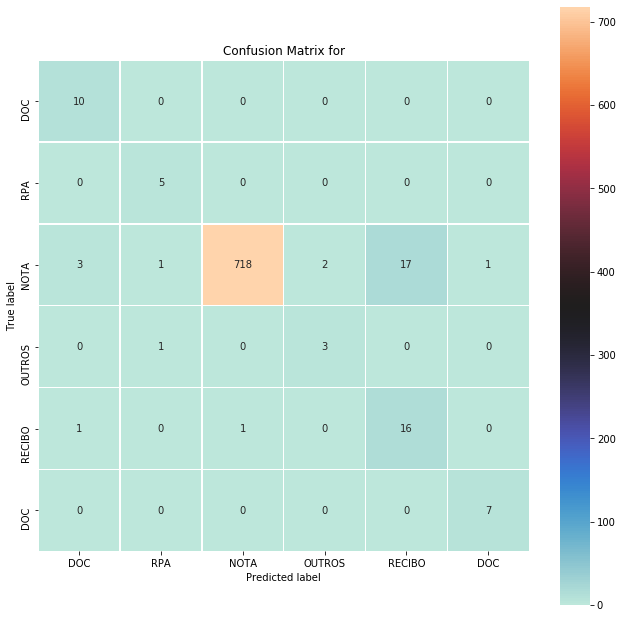

In [34]:
import matplotlib.pyplot as plt
import numpy as np

classes = ['DOC', 'RPA','NOTA','OUTROS','RECIBO','DOC']


import seaborn as sns
fig, ax = plt.subplots(figsize=(11,11))  
ax.set_title("Confusion Matrix for")
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,cmap="icefire",
xticklabels=classes,yticklabels=classes,linewidths=.3, ax=ax)
plt.xlabel('Predicted label')
plt.ylabel('True label');

In [35]:
from sklearn.ensemble     import ExtraTreesClassifier
et = ExtraTreesClassifier(n_estimators=20, random_state=12345)
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
et_pipeline = make_pipeline(RandomOverSampler(random_state=777),et)
et_model  = et_pipeline.fit(X_train, y_train)

In [36]:
et_results = et_model.predict(X_test)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
mat = confusion_matrix(et_results,y_test)

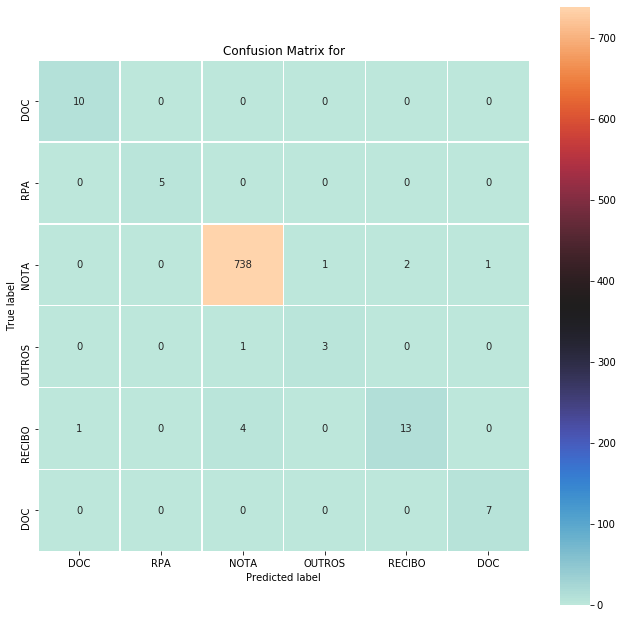

In [37]:
import matplotlib.pyplot as plt
import numpy as np

classes = ['DOC', 'RPA','NOTA','OUTROS','RECIBO','DOC']


import seaborn as sns
fig, ax = plt.subplots(figsize=(11,11))  
ax.set_title("Confusion Matrix for")
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,cmap="icefire",
xticklabels=classes,yticklabels=classes,linewidths=.3, ax=ax)
plt.xlabel('Predicted label')
plt.ylabel('True label');

In [38]:
from sklearn.linear_model import RidgeClassifier
rc = RidgeClassifier(random_state=12345)
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
rc_pipeline = make_pipeline(RandomOverSampler(random_state=777),rc)
rc_model  = rc_pipeline.fit(X_train, y_train)

In [39]:
rc_results = et_model.predict(X_test)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
mat = confusion_matrix(rc_results,y_test)

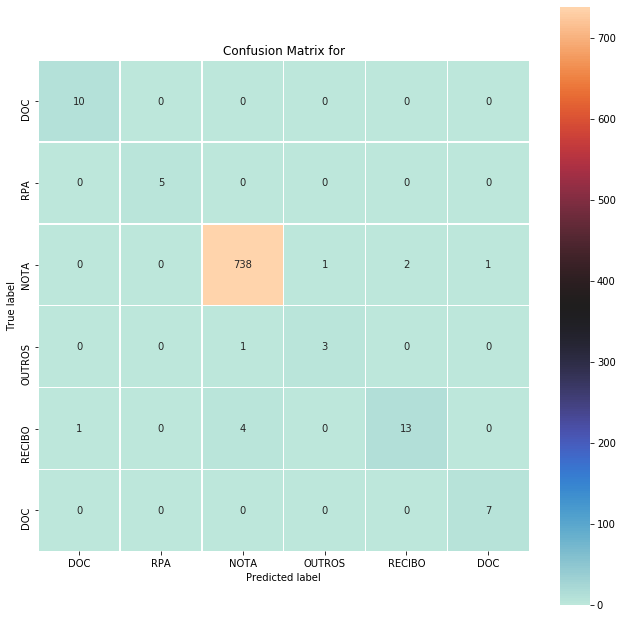

In [40]:
import matplotlib.pyplot as plt
import numpy as np

classes = ['DOC', 'RPA','NOTA','OUTROS','RECIBO','DOC']


import seaborn as sns
fig, ax = plt.subplots(figsize=(11,11))  
ax.set_title("Confusion Matrix for")
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,cmap="icefire",
xticklabels=classes,yticklabels=classes,linewidths=.3, ax=ax)
plt.xlabel('Predicted label')
plt.ylabel('True label');

In [41]:
#Refined decision tree - Extra features
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
dt = DecisionTreeClassifier(random_state=12345)
dt.get_params().keys()
param_grid = {'criterion':['gini','entropy'],'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]}

##grid = GridSearchCV(dt, param_grid, cv=5)
##grid.fit(combined_train, train.out)
##print(grid.best_estimator_)

DT_best = DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=40, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=12345, splitter='best')

from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
dt_pipeline = make_pipeline(RandomOverSampler(random_state=777),DT_best)

dt_model  = dt_pipeline.fit(X_train, y_train)

In [42]:
dt_results = dt_model.predict(X_test)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
mat = confusion_matrix(dt_results,y_test)

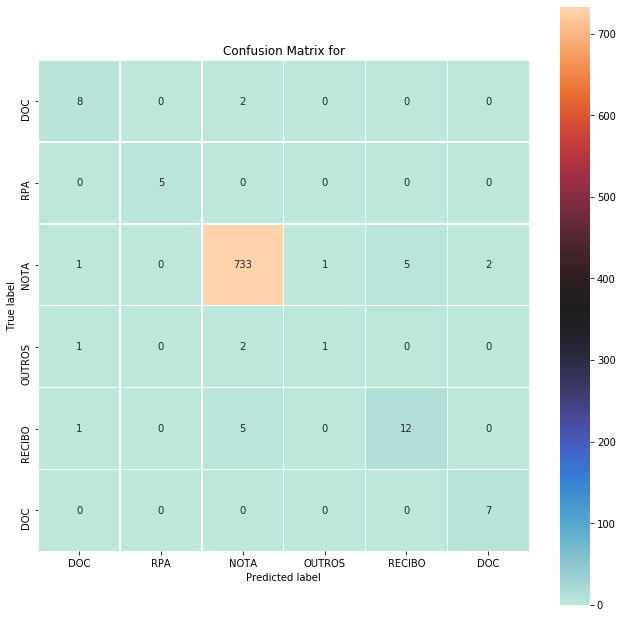

In [43]:
import matplotlib.pyplot as plt
import numpy as np

classes = ['DOC', 'RPA','NOTA','OUTROS','RECIBO','DOC']


import seaborn as sns
fig, ax = plt.subplots(figsize=(11,11))  
ax.set_title("Confusion Matrix for")
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,cmap="icefire",
xticklabels=classes,yticklabels=classes,linewidths=.3, ax=ax)
plt.xlabel('Predicted label')
plt.ylabel('True label');

In [44]:
#Random forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=10, random_state=12345)

from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
rf_pipeline = make_pipeline(RandomOverSampler(random_state=777),rf)
rf_model  = rf_pipeline.fit(X_train, y_train)

In [45]:
rf_results = rf_model.predict(X_test)
rf_results_prob = rf_model.predict_proba(X_test)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
mat = confusion_matrix(rf_results,y_test)

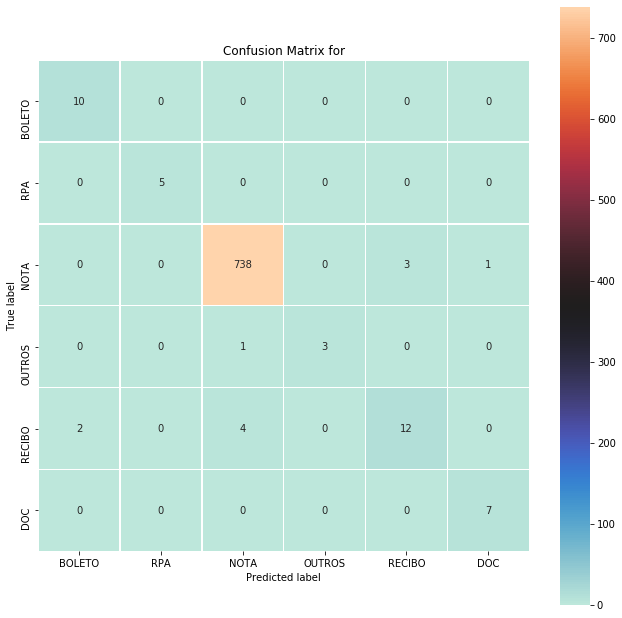

In [46]:
import matplotlib.pyplot as plt
import numpy as np

classes = ['BOLETO', 'RPA','NOTA','OUTROS','RECIBO','DOC']


import seaborn as sns
fig, ax = plt.subplots(figsize=(11,11))  
ax.set_title("Confusion Matrix for")
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,cmap="icefire",
xticklabels=classes,yticklabels=classes,linewidths=.3, ax=ax)
plt.xlabel('Predicted label')
plt.ylabel('True label');

In [47]:
print(rf_results_prob)

[[0.  0.  1.  0.  0.  0. ]
 [0.  0.  1.  0.  0.  0. ]
 [0.  0.  0.9 0.  0.1 0. ]
 ...
 [0.  0.  1.  0.  0.  0. ]
 [0.  0.  1.  0.  0.  0. ]
 [0.  0.  1.  0.  0.  0. ]]


# Ensembling the models

In [48]:
from sklearn.ensemble import VotingClassifier

In [49]:
#eclf = VotingClassifier(estimators=[('Decision Tree', dt_model), ('Random Forests', rf_model), ('Linear Regression', lr_model), ('Extra tree', et_model),('Ridge Classifier', rc_model),('Naive Bayes', nb_model)], voting='hard')
eclf = VotingClassifier(estimators=[('Linear Regression', lr),('Decision Tree', dt), ('Random Forests', rf), ('Extra Trees', et), ('Ridge Classifier', rc)], voting='hard')

In [50]:
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
eclf_pipeline = make_pipeline(RandomOverSampler(random_state=777), eclf)
eclf_model =  eclf_pipeline.fit(X_test, y_test)

In [51]:
eclf_results = eclf_model.predict(X_test)
#eclf_results_prob = eclf_model.predict_proba(X_test)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
mat = confusion_matrix(eclf_results,y_test)

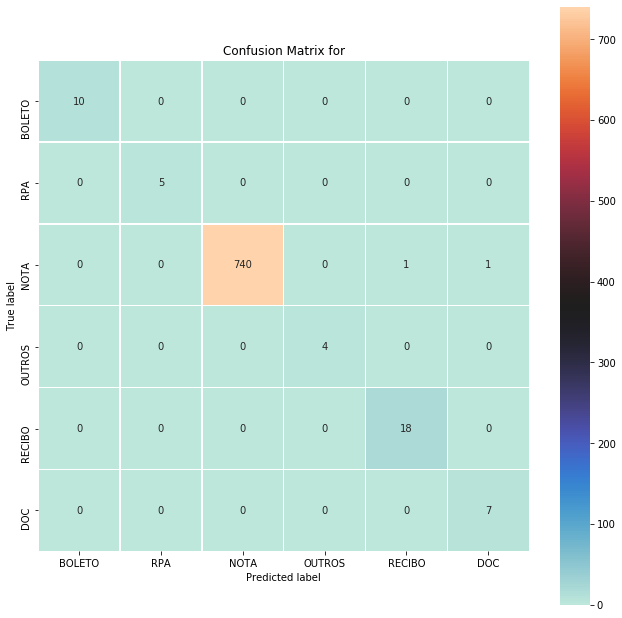

In [52]:
import matplotlib.pyplot as plt
import numpy as np

classes = ['BOLETO', 'RPA','NOTA','OUTROS','RECIBO','DOC']


import seaborn as sns
fig, ax = plt.subplots(figsize=(11,11))  
ax.set_title("Confusion Matrix for")
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=True,cmap="icefire",
xticklabels=classes,yticklabels=classes,linewidths=.3, ax=ax)
plt.xlabel('Predicted label')
plt.ylabel('True label');

In [53]:
import pickle
filename = 'C:/AI/krypton-01/csv-doc/finalized_model.sav'
pickle.dump(eclf_model, open(filename, 'wb'))

In [55]:
filename = 'C:/AI/krypton-01/csv-doc/finalized_model.sav'
eclf_model = pickle.load(open(filename, 'rb'))

# Classifying the new file

In [119]:
df4=df3
#df3.info()
df4=df4[df4.label == "ALL"]
df4=df4.reindex()
df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  0 non-null      int64  
 1   body        0 non-null      object 
 2   label       0 non-null      object 
 3   name        0 non-null      object 
 4   label1      0 non-null      float64
 5   sint1       0 non-null      int64  
 6   sint2       0 non-null      int64  
 7   sint3       0 non-null      int64  
 8   sint4       0 non-null      int64  
 9   sint5       0 non-null      int64  
 10  sint6       0 non-null      int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 0.0+ bytes


In [120]:
from os import listdir
from os.path import isfile, join
mypath = 'C:/AI/krypton-01/texto'
onlyfile1 = [f for f in listdir(mypath) if isfile(join(mypath, f))]
print(len(onlyfile1))

16567


In [121]:
for file1 in onlyfile1:
    #print(file1[-3:])
    #print(file1)
    #print(file1[:-4])
    if file1[-3:]=="txt":
        print(file1[:-4])
        text1 = open('C:/AI/krypton-01/texto/'+file1, "r+",encoding = 'utf-8-sig').read()
        #print(text1)
        df2 = pd.DataFrame([[text1, "",file1[:-4],"",""]], columns = ['body','label','name','label1',"array"])
        #print(df2)
        df4=df4.append(df2)
        df4.reset_index(inplace = True, drop = True)
df4['body1']=df4['body']

2017-06-27_08-47_2081291
2017-06-27_08-47_2328549
2017-06-27_08-47_2762289
2017-06-27_08-47_5632222
2017-06-27_08-47_5736801
2017-06-27_08-47_6630378
2017-06-27_08-47_6945680
2017-06-27_08-47_8612042
2017-06-27_08-47_9038559
2017-06-27_08-47_9573012
2017-06-27_10-14_1881821
2017-06-27_10-14_6049154
2017-06-27_10-14_9150233
2017-06-28_09-47_1035992
2017-06-29_08-03_8994805
2017-06-29_09-12_9030590
2017-06-29_09-34_6433716
2017-06-29_11-32_2407431
2017-06-29_11-36_1627262
2017-06-30_09-35_6552132
2017-06-30_13-21_5267056
2017-06-30_14-09_1190062
2017-06-30_14-09_7223992
2017-06-30_14-09_8651457
2017-07-03_09-41_7282193
2017-07-03_13-46_1323416
2017-07-05_10-36_6215036
2017-07-12_13-22_1686331
2017-07-12_13-29_3005962
2017-07-12_13-33_4405247
2017-07-12_13-42_2901228
2017-07-12_13-45_5733409
2017-07-12_13-49_2763458
2017-07-12_13-56_9712107
2017-07-12_13-58_8499946
2017-07-13_08-31_5786745
2017-07-13_08-41_8038290
2017-07-13_09-07_1167508
2017-07-13_09-50_9988548
2017-07-13_09-57_2047266


2017-10-02_14-56_2769370
2017-10-02_14-56_2853322
2017-10-02_14-56_3027727
2017-10-02_14-56_3223002
2017-10-02_14-56_3527796
2017-10-02_14-56_3650306
2017-10-02_14-56_3678991
2017-10-02_14-56_3880577
2017-10-02_14-56_3885899
2017-10-02_14-56_3998067
2017-10-02_14-56_4071591
2017-10-02_14-56_4251646
2017-10-02_14-56_4762112
2017-10-02_14-56_4851063
2017-10-02_14-56_5232207
2017-10-02_14-56_5594159
2017-10-02_14-56_5691782
2017-10-02_14-56_6163049
2017-10-02_14-56_6283275
2017-10-02_14-56_6340764
2017-10-02_14-56_7184524
2017-10-02_14-56_7726344
2017-10-02_14-56_8548645
2017-10-02_14-56_8606488
2017-10-02_14-56_8702635
2017-10-02_14-56_8757742
2017-10-02_14-56_8763674
2017-10-02_14-56_8860669
2017-10-02_14-56_9135239
2017-10-02_14-56_9191742
2017-10-02_14-56_9278852
2017-10-02_14-56_9320544
2017-10-02_14-56_9432065
2017-10-02_14-56_9432476
2017-10-02_14-56_9615685
2017-10-02_14-56_9654041
2017-10-02_14-56_9926445
2017-10-02_14-56_9968559
2017-10-02_14-56_9997066
2017-10-03_09-12_1952473


2017-10-31_14-42_8677382
2017-10-31_14-42_9350409
2017-10-31_14-42_9357197
2017-10-31_14-42_9674249
2017-10-31_15-34_8171011
2017-11-01_09-55_9796983
2017-11-01_11-42_1546864
2017-11-01_11-42_4109931
2017-11-01_11-42_4695599
2017-11-01_11-42_6697900
2017-11-01_11-42_6965553
2017-11-01_11-42_8077384
2017-11-01_11-42_9319813
2017-11-01_13-25_4565931
2017-11-01_17-15_3350726
2017-11-03_08-48_9658961
2017-11-03_10-13_7986812
2017-11-03_10-51_5884079
2017-11-06_09-52_3862338
2017-11-06_14-12_6798347
2017-11-06_14-56_1204535
2017-11-06_14-56_3480922
2017-11-06_14-56_7494306
2017-11-06_14-56_8839547
2017-11-07_14-28_9226447
2017-11-08_10-46_2133442
2017-11-08_11-44_4156880
2017-11-08_14-57_1769887
2017-11-08_14-57_2097230
2017-11-08_14-57_2979416
2017-11-08_14-57_4154948
2017-11-08_14-57_4235839
2017-11-08_14-57_4452564
2017-11-08_14-57_4480855
2017-11-08_14-57_5044632
2017-11-08_14-57_5123398
2017-11-08_14-57_5362029
2017-11-08_14-57_6012198
2017-11-08_14-57_6340529
2017-11-08_14-57_6499849


2017-12-07_14-40_8874871
2017-12-07_14-40_9227373
2017-12-07_14-40_9344699
2017-12-07_14-40_9430649
2017-12-07_14-40_9705922
2017-12-07_14-40_9706865
2017-12-07_14-40_9738039
2017-12-07_14-40_9975963
2017-12-07_14-49_3685179
2017-12-07_14-51_2503461
2017-12-12_13-47_6847473-0
2017-12-12_13-47_6847473-1
2017-12-12_13-47_7280163-0
2017-12-12_13-47_7280163-1
2017-12-13_08-05_3646033
2017-12-13_10-47_1042072
2017-12-13_10-47_1383981
2017-12-13_10-47_2385196
2017-12-13_10-47_3203810
2017-12-13_10-47_3601496
2017-12-13_10-47_3641001
2017-12-13_10-47_3735371
2017-12-13_10-47_3904393
2017-12-13_10-47_4374213
2017-12-13_10-47_4496376
2017-12-13_10-47_5855556
2017-12-13_10-47_6015288
2017-12-13_10-47_6463843
2017-12-13_10-47_6611388
2017-12-13_10-47_6722926
2017-12-13_10-47_7511707
2017-12-13_10-47_7860707
2017-12-13_10-47_9159938
2017-12-13_10-47_9302467
2017-12-13_10-47_9435118
2017-12-14_11-17_8894465
2017-12-14_11-20_1643921
2017-12-14_11-20_3978723
2017-12-14_11-20_4857712
2017-12-14_14-09_

2018-01-10_17-44_7396474-2
2018-01-10_17-44_7396474-3
2018-01-10_17-44_7396474-4
2018-01-10_17-44_7396474-5
2018-01-11_13-52_8697998
2018-01-11_15-05_2250309
2018-01-11_16-41_9775908
2018-01-11_16-53_9508462
2018-01-11_16-54_6504067
2018-01-12_13-38_2647915
2018-01-12_13-38_4917974
2018-01-12_13-45_7190419
2018-01-15_10-22_1235938
2018-01-15_10-22_2243078
2018-01-15_10-22_2339865
2018-01-15_10-22_2377448
2018-01-15_10-22_2530314
2018-01-15_10-22_2902050
2018-01-15_10-22_3030930
2018-01-15_10-22_3309534
2018-01-15_10-22_3364871
2018-01-15_10-22_3371708
2018-01-15_10-22_3624345
2018-01-15_10-22_3668724
2018-01-15_10-22_3924301
2018-01-15_10-22_3983474
2018-01-15_10-22_4689934
2018-01-15_10-22_4761675
2018-01-15_10-22_4861721
2018-01-15_10-22_5100080
2018-01-15_10-22_5132793
2018-01-15_10-22_5275279
2018-01-15_10-22_6027865
2018-01-15_10-22_6074159
2018-01-15_10-22_6261216
2018-01-15_10-22_6485488
2018-01-15_10-22_6973915
2018-01-15_10-22_7643765
2018-01-15_10-22_7683887
2018-01-15_10-22_

2018-02-15_08-17_4414474
2018-02-15_08-35_2310603
2018-02-15_08-55_2533665
2018-02-16_08-12_1624937
2018-02-16_08-42_7950898
2018-02-16_17-32_1112128
2018-02-19_07-55_5822360
2018-02-19_07-55_7502381
2018-02-19_07-55_8903472
2018-02-19_10-23_3684686
2018-02-19_10-25_3717353
2018-02-19_10-25_7973171
2018-02-19_10-55_2791647
2018-02-19_15-04_5296473
2018-02-20_13-11_6305477
2018-02-20_14-41_1456787-0
2018-02-20_14-41_1456787-1
2018-02-20_16-17_2552524
2018-02-20_16-25_1492990
2018-02-20_16-25_1520868
2018-02-20_16-25_1751842
2018-02-20_16-25_1816438
2018-02-20_16-25_1829252
2018-02-20_16-25_2422343
2018-02-20_16-25_2803727
2018-02-20_16-25_2852959
2018-02-20_16-25_3418636
2018-02-20_16-25_5044013
2018-02-20_16-25_5095284
2018-02-20_16-25_5448377
2018-02-20_16-25_5743703
2018-02-20_16-25_6014001
2018-02-20_16-25_6829867
2018-02-20_16-25_6899602
2018-02-20_16-25_7325062
2018-02-20_16-25_7884121
2018-02-20_16-25_8142516
2018-02-20_16-25_8307002
2018-02-20_16-25_8312479
2018-02-20_16-25_8582

2018-03-28_08-41_2286447
2018-03-28_08-41_3298692
2018-03-28_08-41_4941931
2018-03-28_08-41_5015746
2018-03-28_08-41_5191086
2018-03-28_08-41_5245406
2018-03-28_08-41_5339730
2018-03-28_08-41_6056060
2018-03-28_08-41_6156932
2018-03-28_08-41_6388725
2018-03-28_08-41_7086811
2018-03-28_08-41_7364788
2018-03-28_08-41_8394962
2018-03-28_08-41_8398435
2018-03-28_08-41_9260544
2018-03-28_08-41_9992323
2018-03-28_09-07_2434796
2018-03-28_09-20_3565020
2018-03-28_09-29_6403473
2018-03-28_09-35_4912689
2018-03-28_09-35_5957207
2018-03-28_09-43_3031930
2018-03-28_09-45_7845988
2018-03-28_09-47_9407600
2018-03-28_09-50_1830163
2018-03-28_09-50_2838080
2018-03-28_09-53_3919461
2018-03-28_09-55_2682821
2018-03-28_09-55_5714631
2018-03-28_09-55_8373166
2018-03-28_14-31_8622216
2018-03-28_14-38_7547926-0
2018-03-28_14-38_7547926-1
2018-03-28_14-38_7547926
2018-03-28_14-50_1741506
2018-03-28_15-07_7419138
2018-03-28_15-57_1590226
2018-03-28_16-02_9593978
2018-03-29_10-46_1052388
2018-03-29_10-46_1349

2018-04-19_08-32_6121028
2018-04-19_08-32_8578696
2018-04-19_08-32_9627540
2018-04-19_11-13_2248424
2018-04-19_11-13_7305557
2018-04-19_11-13_9563153
2018-04-19_11-22_3326403
2018-04-19_13-32_2516691
2018-04-19_15-29_3468872
2018-04-20_09-36_2025797
2018-04-20_09-36_5144904
2018-04-20_09-36_9277111
2018-04-20_12-08_1061988
2018-04-20_12-26_7064268
2018-04-20_12-37_2769554
2018-04-20_17-01_9523594
2018-04-23_10-48_5069159
2018-04-23_12-21_1071986
2018-04-23_12-21_1215722
2018-04-23_12-21_1372433
2018-04-23_12-21_1544387
2018-04-23_12-21_1559591
2018-04-23_12-21_1676761
2018-04-23_12-21_2158837
2018-04-23_12-21_3359384
2018-04-23_12-21_3706456
2018-04-23_12-21_4273433
2018-04-23_12-21_4338234
2018-04-23_12-21_4530681
2018-04-23_12-21_4772441
2018-04-23_12-21_5264869
2018-04-23_12-21_5531375
2018-04-23_12-21_6311944
2018-04-23_12-21_6445283
2018-04-23_12-21_6478426
2018-04-23_12-21_6489825
2018-04-23_12-21_6962371
2018-04-23_12-21_6977710
2018-04-23_12-21_7041083
2018-04-23_12-21_7153817


2018-05-14_11-28_7416961
2018-05-14_11-28_7925101
2018-05-14_11-28_9106880
2018-05-14_11-28_9949586
2018-05-14_15-53_5315424
2018-05-14_15-53_5684647
2018-05-14_15-53_8128378
2018-05-14_15-53_8164406
2018-05-14_15-53_8488225
2018-05-14_15-53_8875691
2018-05-14_15-58_3637073
2018-05-15_11-02_2982293
2018-05-15_11-02_4623227
2018-05-15_11-02_6026999
2018-05-15_11-02_6233972
2018-05-15_11-02_6499832
2018-05-15_11-02_6594863
2018-05-15_11-02_8942473
2018-05-15_11-02_9137872
2018-05-15_16-18_3008600
2018-05-15_16-18_6086735
2018-05-15_16-21_1546866
2018-05-16_10-01_4373262
2018-05-16_10-43_2219790
2018-05-16_10-43_3821318
2018-05-16_10-43_4205605
2018-05-16_10-43_4362013
2018-05-16_10-43_4826285
2018-05-16_10-43_5264963
2018-05-16_10-43_7000599
2018-05-16_10-43_7216651
2018-05-16_10-43_7404474
2018-05-16_10-43_8517985
2018-05-16_10-43_8674847
2018-05-16_10-43_9200354
2018-05-16_10-43_9627455
2018-05-16_10-43_9641444
2018-05-16_10-43_9906616
2018-05-16_13-08_1770329
2018-05-16_13-08_3838930


2018-06-19_12-05_5248528
2018-06-19_12-05_6461471
2018-06-19_12-05_7158986
2018-06-19_12-14_2716241
2018-06-19_12-14_9399764
2018-06-19_12-18_4025382
2018-06-19_12-18_4382214
2018-06-19_12-18_9330155
2018-06-19_14-51_2772616
2018-06-19_14-51_8340749
2018-06-19_15-24_7898558
2018-06-20_08-27_9066524
2018-06-20_08-27_9506768
2018-06-20_08-32_3018432
2018-06-20_08-32_6047263
2018-06-20_09-39_4487471
2018-06-20_09-58_9135284
2018-06-20_10-06_3864965
2018-06-20_12-08_1723574
2018-06-20_12-08_7127294
2018-06-20_12-08_9078681
2018-06-20_12-19_5249087
2018-06-20_12-19_9432459
2018-06-20_12-23_1892670
2018-06-20_12-23_5680342
2018-06-20_12-23_6448558
2018-06-20_12-30_1935040
2018-06-20_12-30_8105544
2018-06-20_12-30_8469307
2018-06-20_14-37_5632578
2018-06-20_14-37_6916731
2018-06-21_09-02_1199592
2018-06-21_09-02_1353367
2018-06-21_09-02_2029270
2018-06-21_09-02_2647019
2018-06-21_09-02_3449673
2018-06-21_09-02_3482213
2018-06-21_09-02_3845867
2018-06-21_09-02_4306443
2018-06-21_09-02_4811447


2018-07-16_08-53_8381625
2018-07-16_08-53_9633588
2018-07-16_08-53_9750036
2018-07-16_08-53_9952985
2018-07-16_08-54_1311295
2018-07-16_08-54_2136789
2018-07-16_08-54_5278856
2018-07-16_08-54_6100108
2018-07-16_08-54_6317608
2018-07-16_08-54_7898133
2018-07-16_08-54_8351402
2018-07-16_08-54_8719772
2018-07-16_08-54_9459308
2018-07-16_08-54_9527701
2018-07-16_08-54_9843958
2018-07-16_08-54_9987446
2018-07-16_11-25_7904157
2018-07-16_13-43_3982989
2018-07-16_16-40_1113761
2018-07-16_16-40_1565941
2018-07-16_16-40_3360566
2018-07-16_16-40_3803028
2018-07-16_16-40_4099884
2018-07-16_16-40_4519909
2018-07-16_16-40_4813217
2018-07-16_16-40_6095670
2018-07-16_16-40_7780284
2018-07-16_16-40_9890174
2018-07-16_16-41_4063088
2018-07-16_16-41_5319400
2018-07-16_16-41_7110951
2018-07-16_16-41_9912830
2018-07-17_11-43_5359597
2018-07-17_15-45_8009843
2018-07-17_16-34_3053226
2018-07-18_08-40_1628474
2018-07-19_08-32_7266738
2018-07-19_10-41_1052278
2018-07-19_10-41_1423635
2018-07-19_10-41_1597718


2018-08-13_14-23_E_235_4847504
2018-08-13_14-23_E_235_5353398
2018-08-13_14-23_E_235_5679044
2018-08-13_14-23_E_235_7967505
2018-08-13_15-52_E_235_2465305
2018-08-13_15-52_E_235_3292723
2018-08-13_15-52_E_235_4077118
2018-08-13_15-52_E_235_5734671
2018-08-13_15-52_E_235_5785520
2018-08-13_15-52_E_235_6640641
2018-08-13_15-52_E_235_8402024
2018-08-14_10-42_E_235_4313827
2018-08-14_14-30_E_1616_2308345
2018-08-14_14-30_E_1616_4139315
2018-08-14_14-37_E_1616_2525525
2018-08-14_14-41_E_1616_8756700
2018-08-14_14-59_E_1616_5390013
2018-08-14_15-08_E_1616_2362917
2018-08-14_15-08_E_1616_3142263
2018-08-14_15-08_E_1616_6778034
2018-08-14_15-08_E_1616_6976144
2018-08-14_15-12_E_1616_6621647
2018-08-14_15-17_E_1616_9648243
2018-08-14_15-19_E_1616_7340690
2018-08-14_15-22_E_1616_5689148
2018-08-14_15-31_E_1616_9720959
2018-08-14_15-33_E_1616_3575282
2018-08-14_15-46_E_1616_1929707
2018-08-14_15-46_E_1616_3079012
2018-08-14_15-46_E_1616_3650005
2018-08-14_15-46_E_1616_4017045
2018-08-14_15-46_E_1

2018-08-31_17-16_E_1125_9556841
2018-09-03_16-27_8705581
2018-09-03_16-45_E_1616_4183506
2018-09-04_14-13_E_1734_1364162
2018-09-04_14-13_E_1734_2251768
2018-09-04_14-13_E_1734_2549610
2018-09-04_14-13_E_1734_3263907
2018-09-04_14-13_E_1734_3523850
2018-09-04_14-13_E_1734_3526790
2018-09-04_14-13_E_1734_3624399
2018-09-04_14-13_E_1734_3988873
2018-09-04_14-13_E_1734_4512098
2018-09-04_14-13_E_1734_4685475
2018-09-04_14-13_E_1734_5438682
2018-09-04_14-13_E_1734_5923448
2018-09-04_14-13_E_1734_6039407
2018-09-04_14-13_E_1734_6360985
2018-09-04_14-13_E_1734_7418956
2018-09-04_14-13_E_1734_7596217
2018-09-04_14-13_E_1734_8502890
2018-09-04_14-13_E_1734_9087165
2018-09-04_14-42_E_1734_3705263
2018-09-04_15-09_E_1734_8126323
2018-09-04_16-11_E_235_6847839
2018-09-04_16-11_E_235_8085971
2018-09-04_16-27_E_235_5475887
2018-09-04_16-27_E_235_8981912
2018-09-04_16-27_E_235_9032628
2018-09-04_19-34_E_235_1320818
2018-09-04_19-34_E_235_1540390
2018-09-04_19-34_E_235_6783730
2018-09-04_19-45_E_235_

2018-09-28_11-34_E_1125_9966113
2018-09-28_11-37_E_1125_1408260
2018-09-28_11-37_E_1125_3320927
2018-09-28_11-37_E_1125_3877916
2018-09-28_11-37_E_1125_4901922
2018-09-28_11-37_E_1125_5690727
2018-09-28_11-37_E_1125_5900154
2018-09-28_11-37_E_1125_6478456
2018-09-28_11-37_E_1125_8065807
2018-09-28_11-37_E_1125_9215805
2018-09-28_11-45_E_1125_6004908
2018-09-28_11-52_E_1125_2671162
2018-09-28_11-52_E_1125_7596659
2018-09-28_11-53_E_1125_7203401
2018-09-28_11-54_E_1125_2032574
2018-09-28_11-54_E_1125_4203366
2018-09-28_11-54_E_1125_8025048
2018-09-28_11-54_E_1125_9551335
2018-09-28_11-56_E_1125_2511569
2018-09-28_11-56_E_1125_2945343
2018-09-28_11-58_E_1125_3539408
2018-09-28_11-58_E_1125_4659026
2018-09-28_14-21_E_1125_1504849
2018-09-28_14-21_E_1125_5081301
2018-09-28_14-21_E_1125_5282434
2018-09-28_14-21_E_1125_5512978
2018-09-28_14-21_E_1125_5713360
2018-09-28_14-21_E_1125_6163051
2018-09-28_14-21_E_1125_7903656
2018-09-28_14-21_E_1125_8027935
2018-09-28_14-21_E_1125_8997020
2018-09-

2018-10-24_14-10_E_235_6570271
2018-10-24_14-10_E_235_6917364
2018-10-24_14-11_E_1882_2398654
2018-10-24_14-12_E_1882_8022664
2018-10-24_16-28_E_235_3436468
2018-10-24_16-28_E_235_4839898
2018-10-24_16-28_E_235_6703864
2018-10-24_16-28_E_235_9167657
2018-10-24_16-28_E_235_9448882
2018-10-25_07-40_E_235_1674091
2018-10-25_07-40_E_235_2052858
2018-10-25_07-40_E_235_2549316
2018-10-25_07-40_E_235_2932376
2018-10-25_07-40_E_235_2972548
2018-10-25_07-40_E_235_5629875
2018-10-25_07-40_E_235_8370758
2018-10-25_07-40_E_235_8593174
2018-10-25_09-30_E_1882_3936927
2018-10-25_10-09_E_235_2146596
2018-10-25_10-09_E_235_2695734
2018-10-25_10-09_E_235_2727079
2018-10-25_10-09_E_235_4199621
2018-10-25_10-09_E_235_5554012
2018-10-25_10-09_E_235_6771265
2018-10-25_10-09_E_235_7624088
2018-10-25_10-09_E_235_7720505
2018-10-25_10-09_E_235_8241459
2018-10-25_10-09_E_235_8514746
2018-10-25_10-09_E_235_9924276
2018-10-25_10-10_E_235_1511184
2018-10-25_10-10_E_235_1669161
2018-10-25_10-10_E_235_2192656
2018-

2018-11-09_15-40-43-1541785243_E_1800_3017611
2018-11-09_15-40-43-1541785243_E_1800_4144378
2018-11-09_15-40-43-1541785243_E_1800_9052959
2018-11-09_15-40-43-1541785243_E_1800_9201819
2018-11-12_13-26-09-1542036369_E_1125_3542870
2018-11-12_13-37-37-1542037057_E_1125_2807443
2018-11-12_14-12-20-1542039140_E_1882_1087884
2018-11-12_14-14-22-1542039262_E_1882_3553629
2018-11-12_16-24-34-1542047074_E_1882_9560375
2018-11-14_08-36-00-1542191760_E_235_1289242
2018-11-14_08-36-00-1542191760_E_235_4824260
2018-11-14_08-36-00-1542191760_E_235_6399726
2018-11-14_08-36-00-1542191760_E_235_8767561
2018-11-14_08-36-00-1542191760_E_235_9744111
2018-11-14_08-36-01-1542191761_E_235_3020051
2018-11-14_08-36-01-1542191761_E_235_3086505
2018-11-14_08-36-01-1542191761_E_235_6066150
2018-11-14_08-36-02-1542191762_E_235_1259316
2018-11-14_08-36-02-1542191762_E_235_2459071
2018-11-14_08-36-02-1542191762_E_235_5436067
2018-11-14_08-36-02-1542191762_E_235_5662494
2018-11-14_08-36-02-1542191762_E_235_7028217
2

2018-11-28_14-25-22-1543422322_E_1125_4155832
2018-11-28_14-25-22-1543422322_E_1125_8359581
2018-11-28_14-25-22-1543422322_E_1125_9099884
2018-11-28_14-25-23-1543422323_E_1125_2685079
2018-11-28_14-25-23-1543422323_E_1125_7244167
2018-11-28_14-25-24-1543422324_E_1125_2863015
2018-11-28_14-25-24-1543422324_E_1125_4111493
2018-11-28_14-25-24-1543422324_E_1125_6228488
2018-11-28_14-25-24-1543422324_E_1125_6596757
2018-11-28_14-25-26-1543422326_E_1125_2933455
2018-11-28_14-25-26-1543422326_E_1125_9244618
2018-11-28_14-25-27-1543422327_E_1125_5218917
2018-11-28_14-25-27-1543422327_E_1125_7756677
2018-11-28_14-25-28-1543422328_E_1125_7148529
2018-11-29_09-36-01-1543491361_E_1882_5137885
2018-11-29_11-10-21-1543497021_E_235_2889467
2018-11-29_11-10-21-1543497021_E_235_6605301
2018-11-29_11-10-21-1543497021_E_235_7464519
2018-11-29_11-10-21-1543497021_E_235_9864672
2018-11-29_11-10-22-1543497022_E_235_2564532
2018-11-29_11-10-22-1543497022_E_235_6562626
2018-11-29_11-10-22-1543497022_E_235_695

2018-12-12_11-14-38-1544620478_E_235_8501494
2018-12-12_11-14-39-1544620479_E_235_3138668
2018-12-12_11-14-39-1544620479_E_235_4589000
2018-12-12_11-14-39-1544620479_E_235_5361960
2018-12-12_11-14-39-1544620479_E_235_6193522
2018-12-12_11-14-39-1544620479_E_235_7453611
2018-12-12_11-14-39-1544620479_E_235_7552814
2018-12-12_11-14-39-1544620479_E_235_7731574
2018-12-12_11-14-40-1544620480_E_235_6166500
2018-12-12_11-14-40-1544620480_E_235_7592768
2018-12-12_11-14-40-1544620480_E_235_9086744
2018-12-12_15-19-32-1544635172_E_235_4590252
2018-12-13_16-05-23-1544724323_E_1882_5088896
2018-12-14_16-58-31-1544813911_E_235_3179642
2018-12-14_16-58-31-1544813911_E_235_4551307
2018-12-14_16-58-31-1544813911_E_235_5203301
2018-12-14_16-58-31-1544813911_E_235_5840295
2018-12-14_16-58-31-1544813911_E_235_6493649
2018-12-14_16-58-31-1544813911_E_235_8097761-0
2018-12-14_16-58-31-1544813911_E_235_8097761-1
2018-12-14_16-58-31-1544813911_E_235_8243125
2018-12-14_16-58-32-1544813912_E_235_2863190
2018-

2018-12-21_17-56-13-1545422173_E_1882_6971712
2018-12-21_17-59-53-1545422393_E_1882_9973032
2018-12-21_18-59-21-1545425961_E_1882_1608827
2018-12-21_19-03-42-1545426222_E_1882_3967317
2018-12-21_19-45-44-1545428744_E_1882_6197710
2018-12-21_19-47-20-1545428840_E_1882_8609268
2018-12-26_09-15-17-1545822917_E_1125_6199847
2018-12-26_13-05-33-1545836733_E_1882_3749907
2018-12-26_17-08-26-1545851306_E_1125_5640606
2018-12-26_17-08-26-1545851306_E_1125_8846349
2018-12-26_17-08-26-1545851306_E_1125_9409749
2018-12-26_17-24-49-1545852289_E_1125_2995755
2018-12-26_17-24-49-1545852289_E_1125_3446715
2018-12-26_17-24-49-1545852289_E_1125_5811565
2018-12-26_17-24-49-1545852289_E_1125_6524450
2018-12-26_17-24-49-1545852289_E_1125_9963491
2018-12-26_17-24-50-1545852290_E_1125_2199652
2018-12-26_17-24-50-1545852290_E_1125_3516194
2018-12-26_17-24-50-1545852290_E_1125_4663339
2018-12-26_17-24-50-1545852290_E_1125_5208184
2018-12-26_17-24-50-1545852290_E_1125_7280952
2018-12-26_17-24-50-1545852290_E_1

2019-01-15_10-25-39-1547555139_E_235_8138092
2019-01-15_10-25-40-1547555140_E_235_4171901
2019-01-15_10-25-40-1547555140_E_235_4843154
2019-01-15_10-25-40-1547555140_E_235_6574033
2019-01-15_10-25-40-1547555140_E_235_7198713
2019-01-15_10-25-40-1547555140_E_235_8801591
2019-01-15_10-25-41-1547555141_E_235_1307411
2019-01-15_10-25-41-1547555141_E_235_1622529
2019-01-15_10-25-41-1547555141_E_235_2185071
2019-01-15_10-25-41-1547555141_E_235_4095873
2019-01-15_10-25-41-1547555141_E_235_7688597
2019-01-15_10-25-41-1547555141_E_235_8517286
2019-01-15_10-25-41-1547555141_E_235_9644653
2019-01-15_10-25-41-1547555141_E_235_9655935
2019-01-15_15-16-01-1547572561_E_235_3190146
2019-01-15_17-41-09-1547581269_E_1314_1073001-0
2019-01-15_17-41-09-1547581269_E_1314_1073001-1
2019-01-15_17-41-09-1547581269_E_1314_1073001
2019-01-16_14-09-59-1547654999_E_235_7606801
2019-01-16_14-10-00-1547655000_E_235_1218393
2019-01-16_14-10-00-1547655000_E_235_5267737
2019-01-16_14-10-00-1547655000_E_235_5590313
201

2019-01-25_13-52-21-1548431541_E_235_7602238
2019-01-25_13-55-14-1548431714_E_235_6922388
2019-01-25_17-44-10-1548445450_E_235_9042288
2019-01-25_17-47-27-1548445647_E_235_2600817
2019-01-25_17-50-09-1548445809_E_235_7085013
2019-01-25_18-36-43-1548448603_E_1882_1768525
2019-01-25_19-20-35-1548451235_E_1882_2826928
2019-01-28_08-19-35-1548670775_E_235_9261592
2019-01-28_08-25-39-1548671139_E_235_1955468
2019-01-28_08-29-05-1548671345_E_235_4278385
2019-01-28_09-45-44-1548675944_E_1125_6166867
2019-01-28_16-23-07-1548699787_E_235_7277296
2019-01-28_16-26-09-1548699969_E_235_6865105
2019-01-28_16-29-23-1548700163_E_1882_2990328
2019-01-28_16-29-23-1548700163_E_1882_3051135
2019-01-29_08-39-38-1548758378_E_1882_4043000
2019-01-30_08-13-45-1548843225_E_235_2302106
2019-01-30_08-13-45-1548843225_E_235_5774462
2019-01-30_08-13-45-1548843225_E_235_6501397
2019-01-30_08-13-45-1548843225_E_235_9934552
2019-01-30_09-17-26-1548847046_E_235_4688229
2019-01-30_09-21-18-1548847278_E_235_6106574
2019

2019-02-07_11-58-55-1549547935_E_1958_2340859
2019-02-07_11-58-55-1549547935_E_1958_3751140
2019-02-07_11-58-55-1549547935_E_1958_3755394
2019-02-07_11-58-55-1549547935_E_1958_6733691
2019-02-07_11-58-55-1549547935_E_1958_8601880
2019-02-07_11-58-55-1549547935_E_1958_8651246
2019-02-07_11-58-56-1549547936_E_1958_1809305
2019-02-07_11-58-56-1549547936_E_1958_3829432
2019-02-07_11-58-56-1549547936_E_1958_6338415
2019-02-07_11-58-56-1549547936_E_1958_9027854
2019-02-07_11-58-56-1549547936_E_1958_9469947
2019-02-07_11-58-57-1549547937_E_1958_1622086
2019-02-07_11-58-57-1549547937_E_1958_3095739
2019-02-07_11-58-57-1549547937_E_1958_3155415
2019-02-07_11-58-57-1549547937_E_1958_3700667
2019-02-07_11-58-57-1549547937_E_1958_4449730
2019-02-07_11-58-57-1549547937_E_1958_5471279
2019-02-07_11-58-57-1549547937_E_1958_8634955
2019-02-07_11-58-58-1549547938_E_1958_3806751
2019-02-07_11-58-58-1549547938_E_1958_4345056
2019-02-07_11-58-58-1549547938_E_1958_7263872
2019-02-07_11-58-58-1549547938_E_1

2019-02-22_15-30-52-1550860252_E_1958_8144400
2019-02-22_15-30-52-1550860252_E_1958_8625968
2019-02-22_15-30-52-1550860252_E_1958_8713325
2019-02-22_15-30-52-1550860252_E_1958_9440260
2019-02-22_15-30-53-1550860253_E_1958_3109069
2019-02-22_15-30-53-1550860253_E_1958_8370799
2019-02-22_15-51-53-1550861513_E_1421_5153083
2019-02-22_15-51-54-1550861514_E_1421_2554010
2019-02-22_15-51-54-1550861514_E_1421_6258553
2019-02-22_15-52-35-1550861555_E_1421_3963795
2019-02-22_15-52-35-1550861555_E_1421_7638486
2019-02-22_15-52-35-1550861555_E_1421_7950622
2019-02-22_16-24-58-1550863498_E_1421_2838525
2019-02-22_16-25-18-1550863518_E_1421_6002405
2019-02-22_16-26-52-1550863612_E_1421_8433449
2019-02-22_17-09-10-1550866150_E_1421_2313567
2019-02-25_09-11-49-1551096709_E_1958_1148316
2019-02-25_09-11-49-1551096709_E_1958_2877618
2019-02-25_09-11-49-1551096709_E_1958_3418879
2019-02-25_09-11-49-1551096709_E_1958_6721623
2019-02-25_09-11-49-1551096709_E_1958_9944431
2019-02-25_09-11-50-1551096710_E_1

2019-03-07_07-33-34-1551954814_E_1734_3232200
2019-03-07_07-33-34-1551954814_E_1734_3431738
2019-03-07_07-33-34-1551954814_E_1734_3608412
2019-03-07_07-33-34-1551954814_E_1734_4085115
2019-03-07_07-33-34-1551954814_E_1734_6859992
2019-03-07_07-33-34-1551954814_E_1734_8007010
2019-03-07_07-33-35-1551954815_E_1734_1074688
2019-03-07_07-33-35-1551954815_E_1734_2327583
2019-03-07_07-33-35-1551954815_E_1734_3461104
2019-03-07_07-33-35-1551954815_E_1734_4904954
2019-03-07_07-33-35-1551954815_E_1734_5525222
2019-03-07_07-33-35-1551954815_E_1734_5954622
2019-03-07_07-33-35-1551954815_E_1734_6322769
2019-03-07_07-33-35-1551954815_E_1734_9260730
2019-03-07_07-33-35-1551954815_E_1734_9265532
2019-03-07_07-33-36-1551954816_E_1734_5850158
2019-03-07_07-53-21-1551956001_E_1958_1062271
2019-03-07_07-53-21-1551956001_E_1958_1766156
2019-03-07_07-53-21-1551956001_E_1958_5821367
2019-03-07_07-53-21-1551956001_E_1958_7965966
2019-03-07_07-53-22-1551956002_E_1958_1667397
2019-03-07_07-53-22-1551956002_E_1

2019-03-13_08-18-47-1552475927_E_1958_3673523
2019-03-13_08-18-47-1552475927_E_1958_4613256
2019-03-13_08-18-47-1552475927_E_1958_6888766
2019-03-13_08-18-47-1552475927_E_1958_9226289
2019-03-13_08-18-47-1552475927_E_1958_9996064
2019-03-14_09-19-56-1552565996_E_1958_1017608
2019-03-14_09-19-56-1552565996_E_1958_2686460
2019-03-14_09-19-56-1552565996_E_1958_3780585
2019-03-14_09-19-56-1552565996_E_1958_4173679
2019-03-14_09-19-56-1552565996_E_1958_7082231
2019-03-14_09-19-57-1552565997_E_1958_2433678
2019-03-14_09-19-57-1552565997_E_1958_4260032
2019-03-14_09-19-57-1552565997_E_1958_6100819
2019-03-14_09-19-57-1552565997_E_1958_6959934
2019-03-14_09-19-57-1552565997_E_1958_7105914
2019-03-14_09-19-57-1552565997_E_1958_8067360
2019-03-14_09-19-58-1552565998_E_1958_1285407
2019-03-14_09-19-58-1552565998_E_1958_1393392
2019-03-14_09-19-58-1552565998_E_1958_3841423
2019-03-14_09-19-58-1552565998_E_1958_4336442
2019-03-14_09-19-58-1552565998_E_1958_6593006
2019-03-14_09-19-58-1552565998_E_1

2019-03-29_14-18-55-1553879935_E_1125_8318621
2019-03-29_14-25-37-1553880337_E_1125_3623221
2019-03-29_14-25-37-1553880337_E_1125_4159613
2019-03-29_14-25-37-1553880337_E_1125_7167793
2019-03-29_14-25-37-1553880337_E_1125_7227554
2019-03-29_14-25-37-1553880337_E_1125_9196689
2019-03-29_14-25-37-1553880337_E_1125_9264705
2019-03-29_14-33-08-1553880788_E_1125_4305952
2019-03-29_14-33-08-1553880788_E_1125_5541087
2019-03-29_14-44-00-1553881440_E_1125_2254564
2019-03-29_14-44-01-1553881441_E_1125_9332378
2019-03-29_14-46-26-1553881586_E_1125_3295469
2019-03-29_14-46-26-1553881586_E_1125_3449962
2019-03-29_14-46-26-1553881586_E_1125_3713268
2019-03-29_14-46-26-1553881586_E_1125_6920137
2019-03-29_14-46-27-1553881587_E_1125_3029596
2019-03-29_14-46-27-1553881587_E_1125_7173275
2019-03-29_14-46-27-1553881587_E_1125_8218725
2019-03-29_14-46-27-1553881587_E_1125_8661676
2019-03-29_14-51-01-1553881861_E_1125_4496073
2019-03-29_14-51-01-1553881861_E_1125_7554424
2019-03-29_14-51-01-1553881861_E_1

2019-04-03_16-00-15-1554318015_I_158_5345545
2019-04-03_16-00-15-1554318015_I_158_9570740
2019-04-04_16-06-58-1554404818_E_1882_3437436
2019-04-04_16-06-58-1554404818_E_1882_5106270
2019-04-04_17-27-19-1554409639_E_1958_1153338
2019-04-04_17-27-19-1554409639_E_1958_1990072
2019-04-04_17-27-19-1554409639_E_1958_3880353
2019-04-04_17-27-20-1554409640_E_1958_1096235
2019-04-04_17-27-20-1554409640_E_1958_2054968
2019-04-04_17-27-20-1554409640_E_1958_2448890
2019-04-04_17-27-20-1554409640_E_1958_3275102
2019-04-04_17-27-20-1554409640_E_1958_5013556
2019-04-04_17-27-20-1554409640_E_1958_5895290
2019-04-04_17-27-21-1554409641_E_1958_1410023
2019-04-04_17-27-21-1554409641_E_1958_1431005
2019-04-04_17-27-21-1554409641_E_1958_2846528
2019-04-04_17-27-21-1554409641_E_1958_4633132
2019-04-04_17-27-21-1554409641_E_1958_6482618
2019-04-04_17-27-21-1554409641_E_1958_7583154
2019-04-04_17-27-21-1554409641_E_1958_9391256
2019-04-04_17-27-21-1554409641_E_1958_9633815
2019-04-04_17-27-22-1554409642_E_195

2019-04-15_08-40-28-1555328428_E_1958_8625836
2019-04-15_08-40-28-1555328428_E_1958_8672406
2019-04-15_08-40-29-1555328429_E_1958_1488054
2019-04-15_08-40-29-1555328429_E_1958_4666647
2019-04-15_08-40-31-1555328431_E_1958_7606172
2019-04-15_08-40-34-1555328434_E_1958_6001383
2019-04-15_15-58_CP_I_728__6662446
2019-04-16_08-03-49-1555412629_E_1958_3062682
2019-04-16_08-03-49-1555412629_E_1958_5824946
2019-04-16_08-03-50-1555412630_E_1958_2620714
2019-04-16_08-03-50-1555412630_E_1958_2777372
2019-04-16_08-03-50-1555412630_E_1958_4037260
2019-04-16_08-03-50-1555412630_E_1958_6119353
2019-04-16_08-03-50-1555412630_E_1958_8294239
2019-04-16_15-11-38-1555438298_E_1421_4876589
2019-04-16_15-59-24-1555441164_E_1421_2615572
2019-04-16_17-08-19-1555445299_E_1421_7131587
2019-04-17_07-53-20-1555498400_E_1958_4711137
2019-04-17_07-53-20-1555498400_E_1958_4983368
2019-04-17_07-53-20-1555498400_E_1958_9163637
2019-04-18_08-52-00-1555588320_E_1958_6095886
2019-04-18_08-52-01-1555588321_E_1958_4417509

2019-05-02_15-14-12-1556820852_E_1056_4365058
2019-05-02_15-14-12-1556820852_E_1056_4829953
2019-05-02_15-14-12-1556820852_E_1056_6297921
2019-05-02_15-14-12-1556820852_E_1056_6369934
2019-05-02_15-14-12-1556820852_E_1056_6573280
2019-05-02_15-14-12-1556820852_E_1056_6996650
2019-05-02_15-14-12-1556820852_E_1056_7120026
2019-05-02_15-14-12-1556820852_E_1056_7285809
2019-05-02_15-14-12-1556820852_E_1056_7369917
2019-05-02_15-14-12-1556820852_E_1056_7603717
2019-05-02_15-14-12-1556820852_E_1056_7766352
2019-05-02_15-14-12-1556820852_E_1056_8105281
2019-05-02_15-14-12-1556820852_E_1056_8408447
2019-05-02_15-14-12-1556820852_E_1056_8979809
2019-05-02_15-14-12-1556820852_E_1056_9633546
2019-05-02_15-16-28-1556820988_E_1421_1288288
2019-05-02_15-16-28-1556820988_E_1421_5821598
2019-05-02_15-17-03-1556821023_E_1421_1489774
2019-05-02_15-33-38-1556822018_E_1421_8138521
2019-05-02_15-34-37-1556822077_E_1421_2553097
2019-05-02_15-34-37-1556822077_E_1421_4112820
2019-05-03_09-00-44-1556884844_E_1

2019-05-08_09-29-36-1557318576_E_1958_6856911
2019-05-08_09-29-36-1557318576_E_1958_9318988
2019-05-08_09-29-37-1557318577_E_1958_1821705
2019-05-08_09-29-37-1557318577_E_1958_2153853
2019-05-08_09-29-37-1557318577_E_1958_4417590
2019-05-08_09-29-37-1557318577_E_1958_5010184
2019-05-08_09-29-37-1557318577_E_1958_9849523
2019-05-08_14-51-32-1557337892_E_1958_1633284
2019-05-08_14-51-32-1557337892_E_1958_2554444
2019-05-08_14-51-32-1557337892_E_1958_5464013
2019-05-08_14-51-32-1557337892_E_1958_6738581
2019-05-08_14-51-32-1557337892_E_1958_8804239
2019-05-08_14-51-32-1557337892_E_1958_8839314
2019-05-08_14-51-33-1557337893_E_1958_2328324
2019-05-08_14-51-33-1557337893_E_1958_2949934
2019-05-08_14-51-33-1557337893_E_1958_4699480
2019-05-08_14-51-33-1557337893_E_1958_4707956
2019-05-08_14-51-33-1557337893_E_1958_6356329
2019-05-08_14-51-33-1557337893_E_1958_6493227
2019-05-08_14-51-33-1557337893_E_1958_8771645
2019-05-08_14-51-34-1557337894_E_1958_2309747
2019-05-08_14-51-34-1557337894_E_1

2019-05-15_14-33-04-1557941584_E_1882_3465293
2019-05-15_14-33-04-1557941584_E_1882_4244333
2019-05-15_14-33-04-1557941584_E_1882_5420276
2019-05-15_14-33-04-1557941584_E_1882_6097303
2019-05-15_14-33-04-1557941584_E_1882_6950675
2019-05-15_14-33-04-1557941584_E_1882_8972552
2019-05-15_14-33-04-1557941584_E_1882_9807316
2019-05-15_14-38-19-1557941899_E_1882_9550448
2019-05-15_14-43-44-1557942224_E_1882_1757342
2019-05-15_14-43-44-1557942224_E_1882_2415967
2019-05-15_14-43-44-1557942224_E_1882_4822530
2019-05-15_14-43-44-1557942224_E_1882_9779919
2019-05-15_14-44-27-1557942267_E_1882_3179867
2019-05-15_14-53-23-1557942803_E_2007_3128368
2019-05-15_14-53-23-1557942803_E_2007_4827465
2019-05-15_14-53-23-1557942803_E_2007_8614187
2019-05-15_15-59-45-1557946785_E_1882_3892398
2019-05-15_16-29-15-1557948555_E_1882_2178165
2019-05-15_16-31-30-1557948690_E_1882_8068499
2019-05-16_08-09-51-1558004991_E_2007_3328160
2019-05-16_09-05-20-1558008320_E_1958_2857846
2019-05-16_09-05-21-1558008321_E_1

2019-05-31_14-13-54-1559322834_E_2007_6985602
2019-05-31_15-14-43-1559326483_E_1421_2894623
2019-05-31_15-14-44-1559326484_E_1421_6355218
2019-05-31_15-15-12-1559326512_E_1421_6154534
2019-05-31_15-15-12-1559326512_E_1421_7212151
2019-05-31_15-15-40-1559326540_E_1421_2050743
2019-05-31_15-15-40-1559326540_E_1421_4146861
2019-05-31_15-15-41-1559326541_E_1421_6034163
2019-05-31_15-16-02-1559326562_E_1421_4113341
2019-06-01_12-46-46-1559404006_E_1421_8879172
2019-06-01_12-46-57-1559404017_E_1421_8080005
2019-06-01_13-25-27-1559406327_E_1421_4148928
2019-06-01_13-25-27-1559406327_E_1421_9661568
2019-06-01_13-36-12-1559406972_E_1421_6182249
2019-06-03_09-09-34-1559563774_E_1958_1316861
2019-06-03_09-09-34-1559563774_E_1958_1491593
2019-06-03_09-09-34-1559563774_E_1958_5290002
2019-06-03_09-09-34-1559563774_E_1958_5794338
2019-06-03_09-09-34-1559563774_E_1958_6731555
2019-06-03_09-09-35-1559563775_E_1958_9456311
2019-06-03_10-04-08-1559567048_E_1125_2943473
2019-06-03_10-08-39-1559567319_E_1

2019-06-10_08-12-08-1560165128_E_2007_5644620
2019-06-10_09-07-03-1560168423_E_1882_7764370
2019-06-10_09-16-41-1560169001_E_1958_5411633
2019-06-10_09-16-41-1560169001_E_1958_5821439
2019-06-10_09-16-41-1560169001_E_1958_6260725
2019-06-10_09-16-41-1560169001_E_1958_6357142
2019-06-10_09-16-42-1560169002_E_1958_1856598
2019-06-10_09-16-42-1560169002_E_1958_3106491
2019-06-10_09-16-42-1560169002_E_1958_6530460-0
2019-06-10_09-16-42-1560169002_E_1958_6530460-1
2019-06-10_09-16-42-1560169002_E_1958_9034111
2019-06-10_09-16-42-1560169002_E_1958_9801508
2019-06-10_09-16-43-1560169003_E_1958_1562198
2019-06-10_09-16-43-1560169003_E_1958_4703531
2019-06-10_09-16-43-1560169003_E_1958_7702519
2019-06-10_09-16-43-1560169003_E_1958_8068590
2019-06-10_09-16-43-1560169003_E_1958_8269167
2019-06-10_09-16-44-1560169004_E_1958_1595867
2019-06-10_09-16-44-1560169004_E_1958_1993600
2019-06-10_09-16-44-1560169004_E_1958_4059806
2019-06-10_09-16-44-1560169004_E_1958_4293616
2019-06-10_09-16-44-1560169004

2019-06-26_10-23-35-1561555415_I_158_4278771
2019-06-26_10-23-35-1561555415_I_158_5773936
2019-06-26_10-24-03-1561555443_I_158_8149615
2019-06-26_10-24-03-1561555443_I_158_8587482-0
2019-06-26_10-24-03-1561555443_I_158_8587482-1
2019-06-26_10-24-03-1561555443_I_158_8587482
2019-06-26_10-25-05-1561555505_I_158_7800274
2019-06-26_10-25-05-1561555505_I_158_8299586
2019-06-26_10-25-05-1561555505_I_158_8541391
2019-06-26_10-31-22-1561555882_I_158_2692050
2019-06-26_10-31-22-1561555882_I_158_3924124
2019-06-26_10-31-22-1561555882_I_158_5368545
2019-06-26_10-31-22-1561555882_I_158_9474427
2019-06-26_10-31-54-1561555914_I_158_1752023
2019-06-26_10-31-54-1561555914_I_158_6222222
2019-06-26_10-31-54-1561555914_I_158_6896698
2019-06-26_10-32-34-1561555954_I_158_2049616
2019-06-26_10-32-35-1561555955_I_158_2410231
2019-06-26_10-32-35-1561555955_I_158_7506832
2019-06-26_10-33-12-1561555992_I_158_2442558
2019-06-26_10-33-12-1561555992_I_158_5104116
2019-06-26_10-33-12-1561555992_I_158_6836352
2019-0

2019-07-01_13-23-39-1561998219_E_1734_1465362
2019-07-01_13-23-39-1561998219_E_1734_1707882
2019-07-01_13-23-39-1561998219_E_1734_2128603
2019-07-01_13-23-39-1561998219_E_1734_2769981
2019-07-01_13-23-39-1561998219_E_1734_3140887
2019-07-01_13-23-39-1561998219_E_1734_4187128
2019-07-01_13-23-39-1561998219_E_1734_4503493
2019-07-01_13-23-39-1561998219_E_1734_4793285
2019-07-01_13-23-39-1561998219_E_1734_5409381
2019-07-01_13-23-39-1561998219_E_1734_5555656
2019-07-01_13-23-39-1561998219_E_1734_6305071
2019-07-01_13-23-39-1561998219_E_1734_7033823
2019-07-01_13-23-39-1561998219_E_1734_7046400
2019-07-01_13-23-39-1561998219_E_1734_7142600
2019-07-01_13-23-39-1561998219_E_1734_7987344
2019-07-01_14-08-33-1562000913_E_1421_6164334
2019-07-01_14-08-33-1562000913_E_1421_8608408
2019-07-01_14-08-33-1562000913_E_1421_9128101
2019-07-01_14-40-43-1562002843_E_1125_2225106
2019-07-01_14-40-43-1562002843_E_1125_7736574
2019-07-01_14-40-43-1562002843_E_1125_9097079
2019-07-01_14-40-43-1562002843_E_1

2019-07-08_13-05-22-1562601922_E_1958_7424847
2019-07-08_13-05-22-1562601922_E_1958_7618549
2019-07-08_13-05-22-1562601922_E_1958_9192170
2019-07-08_13-05-22-1562601922_E_1958_9316107
2019-07-08_13-05-22-1562601922_E_1958_9720012
2019-07-08_13-05-22-1562601922_E_1958_9831185
2019-07-08_13-05-23-1562601923_E_1958_1521080
2019-07-08_13-05-23-1562601923_E_1958_1832470
2019-07-08_13-05-23-1562601923_E_1958_1897713
2019-07-08_13-05-23-1562601923_E_1958_2062760
2019-07-08_13-05-23-1562601923_E_1958_2474139
2019-07-08_13-05-23-1562601923_E_1958_4639570
2019-07-08_13-05-23-1562601923_E_1958_5432397
2019-07-08_13-05-23-1562601923_E_1958_6065826
2019-07-08_13-05-23-1562601923_E_1958_6099859
2019-07-08_13-05-23-1562601923_E_1958_6244133
2019-07-08_13-05-23-1562601923_E_1958_6746059
2019-07-08_13-05-23-1562601923_E_1958_7536100
2019-07-08_13-05-23-1562601923_E_1958_8677633
2019-07-08_13-26-01-1562603161_E_1958_2963054
2019-07-08_13-26-01-1562603161_E_1958_5068504
2019-07-08_13-26-01-1562603161_E_1

2019-07-17_16-49-07-1563392947_E_1125_4549896
2019-07-17_16-49-07-1563392947_E_1125_8674755
2019-07-17_16-51-27-1563393087_E_1125_9614369
2019-07-17_16-53-26-1563393206_E_1125_6963714
2019-07-17_16-53-26-1563393206_E_1125_7902503
2019-07-17_16-53-26-1563393206_E_1125_9770520
2019-07-17_16-55-23-1563393323_E_1125_2821902
2019-07-17_16-56-17-1563393377_E_1125_3084469
2019-07-17_16-56-17-1563393377_E_1125_3854668
2019-07-17_16-56-17-1563393377_E_1125_4071910
2019-07-17_16-57-59-1563393479_E_1125_9032250
2019-07-17_16-57-59-1563393479_E_1125_9761837
2019-07-17_17-01-19-1563393679_E_1125_3522469
2019-07-17_17-01-20-1563393680_E_1125_7434723
2019-07-17_17-02-44-1563393764_E_1125_2508010
2019-07-17_17-03-48-1563393828_E_1125_9277616
2019-07-17_17-03-48-1563393828_E_1125_9971313
2019-07-17_17-07-06-1563394026_E_1125_2286342
2019-07-17_17-08-57-1563394137_E_1125_4467265
2019-07-17_17-08-57-1563394137_E_1125_5333678
2019-07-17_17-08-57-1563394137_E_1125_6627673
2019-07-17_17-08-57-1563394137_E_1

2019-08-02_10-01-56-1564750916_E_1734_7894405
2019-08-02_16-46-32-1564775192_E_1882_5576185
2019-08-05_08-17-46-1565003866_E_1882_3906497
2019-08-05_14-47-44-1565027264_E_235_2046501
2019-08-05_14-47-44-1565027264_E_235_3359861
2019-08-05_14-47-44-1565027264_E_235_4771942
2019-08-05_14-47-44-1565027264_E_235_5669689
2019-08-05_14-47-44-1565027264_E_235_7320792
2019-08-05_14-47-44-1565027264_E_235_7415089
2019-08-05_14-47-44-1565027264_E_235_7750085
2019-08-05_14-47-44-1565027264_E_235_7824518
2019-08-05_14-47-44-1565027264_E_235_8661133
2019-08-05_15-06-56-1565028416_E_235_1544713
2019-08-05_17-25-54-1565036754_E_1958_7346203
2019-08-05_17-25-55-1565036755_E_1958_1780382
2019-08-05_17-25-55-1565036755_E_1958_3919878
2019-08-05_17-25-55-1565036755_E_1958_4354804
2019-08-05_17-25-55-1565036755_E_1958_4878695
2019-08-05_17-25-55-1565036755_E_1958_5817497
2019-08-05_17-25-55-1565036755_E_1958_5837689
2019-08-05_17-25-55-1565036755_E_1958_8750580
2019-08-05_17-25-56-1565036756_E_1958_267965

2019-08-14_11-09-19-1565791759_E_1882_2668317
2019-08-14_11-09-19-1565791759_E_1882_4449458
2019-08-14_11-09-19-1565791759_E_1882_4613997
2019-08-14_11-09-19-1565791759_E_1882_5059205
2019-08-14_11-09-19-1565791759_E_1882_5516449
2019-08-14_11-09-19-1565791759_E_1882_5764366
2019-08-14_11-09-19-1565791759_E_1882_6195913
2019-08-14_11-09-19-1565791759_E_1882_9702966
2019-08-14_11-09-19-1565791759_E_1882_9731214
2019-08-14_11-21-28-1565792488_E_1882_6696218
2019-08-16_17-51-46-1565988706_E_235_1269158
2019-08-16_17-51-47-1565988707_E_235_1306714
2019-08-16_17-51-47-1565988707_E_235_7663242
2019-08-16_17-51-47-1565988707_E_235_8923509
2019-08-16_17-51-48-1565988708_E_235_1553323
2019-08-16_17-51-48-1565988708_E_235_1844665
2019-08-16_17-51-48-1565988708_E_235_2226352
2019-08-16_17-51-48-1565988708_E_235_3376251
2019-08-16_17-51-48-1565988708_E_235_5662052
2019-08-16_17-51-48-1565988708_E_235_6125884
2019-08-16_17-51-48-1565988708_E_235_6604155
2019-08-16_17-51-48-1565988708_E_235_6793338


2019-08-29_16-25-17-1567106717_E_1125_7042632
2019-08-29_16-28-26-1567106906_E_1125_1656958
2019-08-29_16-28-26-1567106906_E_1125_1658106
2019-08-29_16-28-26-1567106906_E_1125_2166761
2019-08-29_16-28-26-1567106906_E_1125_6319846
2019-08-29_16-28-26-1567106906_E_1125_7176765
2019-08-29_16-28-26-1567106906_E_1125_7635367
2019-08-29_16-28-26-1567106906_E_1125_7949922
2019-08-29_16-28-26-1567106906_E_1125_8469229
2019-08-29_16-28-26-1567106906_E_1125_8826148
2019-08-29_16-35-23-1567107323_E_1125_3277000
2019-08-29_16-35-23-1567107323_E_1125_5076750
2019-08-29_16-35-23-1567107323_E_1125_6510851
2019-08-29_16-57-31-1567108651_E_2063_1431460
2019-08-29_16-57-31-1567108651_E_2063_5366702
2019-08-29_17-18-49-1567109929_E_2063_8090558
2019-08-30_09-33-27-1567168407_E_1125_5924523
2019-08-30_13-16-15-1567181775_E_2063_9698808
2019-08-30_13-51-44-1567183904_E_1125_2189599
2019-08-30_13-51-44-1567183904_E_1125_2903064
2019-08-30_13-51-44-1567183904_E_1125_6875576
2019-08-30_13-51-44-1567183904_E_1

2019-09-06_11-33-11-1567780391_E_235_7047946
2019-09-06_11-33-11-1567780391_E_235_8827665
2019-09-06_11-33-11-1567780391_E_235_9569781
2019-09-06_11-33-11-1567780391_E_235_9967738
2019-09-06_11-33-12-1567780392_E_235_8883196
2019-09-06_11-33-12-1567780392_E_235_9259930
2019-09-06_14-58-20-1567792700_E_2063_4622752
2019-09-06_15-49-51-1567795791_E_1800_9094556
2019-09-06_15-49-52-1567795792_E_1800_3817102
2019-09-06_15-49-52-1567795792_E_1800_4996026
2019-09-06_15-49-52-1567795792_E_1800_7096593
2019-09-06_15-49-52-1567795792_E_1800_7876121
2019-09-09_10-28-50-1568035730_E_1800_2626833
2019-09-09_10-28-51-1568035731_E_1800_6182242
2019-09-09_10-28-51-1568035731_E_1800_8864098
2019-09-09_16-34-38-1568057678_E_235_3824966
2019-09-09_16-59-15-1568059155_E_235_1606454
2019-09-09_16-59-15-1568059155_E_235_4620976
2019-09-09_16-59-15-1568059155_E_235_6134474
2019-09-09_17-30-25-1568061025_E_1800_1230575
2019-09-09_17-30-25-1568061025_E_1800_1521317
2019-09-09_17-30-25-1568061025_E_1800_163626

2019-09-24_16-47-48-1569354468_E_1125_2514179
2019-09-24_16-47-48-1569354468_E_1125_2833244
2019-09-24_16-47-48-1569354468_E_1125_3726074
2019-09-24_16-47-48-1569354468_E_1125_6666164
2019-09-24_16-49-44-1569354584_E_1125_3464274
2019-09-24_16-49-44-1569354584_E_1125_7413164
2019-09-24_16-51-02-1569354662_E_1125_3375553
2019-09-24_16-51-02-1569354662_E_1125_5794583
2019-09-24_16-51-02-1569354662_E_1125_6382553
2019-09-24_16-53-16-1569354796_E_1125_1095401
2019-09-24_16-53-16-1569354796_E_1125_2272007
2019-09-24_16-53-16-1569354796_E_1125_7670243
2019-09-24_17-19-04-1569356344_E_1800_1287036
2019-09-24_17-19-04-1569356344_E_1800_2927156
2019-09-24_17-19-04-1569356344_E_1800_3123294
2019-09-24_17-19-04-1569356344_E_1800_5983353
2019-09-24_17-19-04-1569356344_E_1800_6926673
2019-09-24_17-19-04-1569356344_E_1800_7272520
2019-09-24_17-19-04-1569356344_E_1800_9224315
2019-09-25_08-56-08-1569412568_E_2063_8792473
2019-09-25_08-56-52-1569412612_E_2063_2719464
2019-09-25_10-11-23-1569417083_E_1

2019-10-07_17-01-06-1570478466_E_1958_6908673
2019-10-07_17-01-06-1570478466_E_1958_7204372
2019-10-07_17-01-06-1570478466_E_1958_7891663
2019-10-07_17-01-06-1570478466_E_1958_8109229
2019-10-07_17-01-06-1570478466_E_1958_8656495
2019-10-07_17-01-06-1570478466_E_1958_8993082
2019-10-07_17-01-07-1570478467_E_1958_2618874
2019-10-07_17-01-07-1570478467_E_1958_6647873
2019-10-07_17-01-07-1570478467_E_1958_8311726
2019-10-07_17-01-07-1570478467_E_1958_8788877
2019-10-07_17-12-09-1570479129_E_2063_2629689
2019-10-07_17-12-09-1570479129_E_2063_6400570
2019-10-07_17-12-09-1570479129_E_2063_6815180
2019-10-08_10-45-47-1570542347_E_2063_8878849
2019-10-08_11-24-32-1570544672_E_1882_5284428
2019-10-08_14-08-19-1570554499_E_2063_1325787
2019-10-08_14-15-20-1570554920_E_2063_2769109
2019-10-08_16-08-07-1570561687_E_2063_2727145
2019-10-08_17-11-29-1570565489_E_235_3960947
2019-10-08_17-14-33-1570565673_E_1958_5144534
2019-10-08_17-14-34-1570565674_E_1958_1812969
2019-10-08_17-14-34-1570565674_E_19

2019-10-21_10-05-13-1571663113_E_1958_4983225
2019-10-21_17-29-21-1571689761_E_1958_1966959
2019-10-21_17-29-22-1571689762_E_1958_2019945
2019-10-21_17-29-22-1571689762_E_1958_3821679
2019-10-21_17-29-22-1571689762_E_1958_4039131
2019-10-21_17-29-22-1571689762_E_1958_4577059
2019-10-21_17-29-22-1571689762_E_1958_5930342
2019-10-21_17-29-23-1571689763_E_1958_1045043
2019-10-21_17-29-23-1571689763_E_1958_1521465
2019-10-21_17-29-23-1571689763_E_1958_2523110
2019-10-21_17-29-23-1571689763_E_1958_3970597
2019-10-21_17-29-23-1571689763_E_1958_7482305
2019-10-21_17-29-23-1571689763_E_1958_9594032
2019-10-22_09-44-37-1571748277_E_2063_4250232
2019-10-22_10-25-12-1571750712_E_2063_8378898
2019-10-22_10-28-01-1571750881_E_2063_7510286
2019-10-22_10-43-04-1571751784_E_2063_5740018
2019-10-22_10-43-04-1571751784_E_2063_9628842
2019-10-22_10-46-37-1571751997_E_2063_9264185
2019-10-22_10-53-57-1571752437_E_2063_6603890
2019-10-22_10-57-24-1571752644_E_2063_8672559
2019-10-22_14-31-14-1571765474_E_2

2019-11-01_11-52-34-1572619954_E_2063_4555478
2019-11-01_11-52-34-1572619954_E_2063_6211212
2019-11-01_11-53-17-1572619997_E_1125_3694794
2019-11-01_11-53-17-1572619997_E_1125_8371554
2019-11-01_11-53-18-1572619998_E_1125_2939073
2019-11-01_13-37-01-1572626221_E_1125_7310557
2019-11-01_13-37-01-1572626221_E_1125_9290499
2019-11-01_13-37-02-1572626222_E_1125_4351398
2019-11-01_13-43-03-1572626583_E_1125_1156967
2019-11-01_13-43-03-1572626583_E_1125_1875382
2019-11-01_13-43-03-1572626583_E_1125_3305520
2019-11-01_13-43-04-1572626584_E_1125_1430005
2019-11-01_13-43-04-1572626584_E_1125_1833626
2019-11-01_13-43-04-1572626584_E_1125_2666017
2019-11-01_13-43-04-1572626584_E_1125_2819046
2019-11-01_13-43-04-1572626584_E_1125_4532642
2019-11-01_13-43-04-1572626584_E_1125_5255732
2019-11-01_13-43-04-1572626584_E_1125_6272065
2019-11-01_13-43-04-1572626584_E_1125_6353558
2019-11-01_13-43-04-1572626584_E_1125_9544714
2019-11-01_13-43-04-1572626584_E_1125_9703307
2019-11-01_13-43-05-1572626585_E_1

2019-11-11_11-07-15-1573481235_E_1958_4559675
2019-11-11_11-07-15-1573481235_E_1958_7166793
2019-11-11_11-07-16-1573481236_E_1958_2460030
2019-11-11_11-07-16-1573481236_E_1958_8034563
2019-11-11_11-07-16-1573481236_E_1958_9222022
2019-11-11_11-07-16-1573481236_E_1958_9969921
2019-11-11_11-07-17-1573481237_E_1958_9373659
2019-11-12_16-20-45-1573586445_E_2063_5406824
2019-11-12_16-20-45-1573586445_E_2063_7801757
2019-11-12_16-20-45-1573586445_E_2063_8818168
2019-11-13_09-24-29-1573647869_E_2063_2605373
2019-11-13_09-24-29-1573647869_E_2063_3315839
2019-11-13_09-24-29-1573647869_E_2063_8428648
2019-11-13_09-24-30-1573647870_E_2063_2308525
2019-11-13_09-24-30-1573647870_E_2063_3850986
2019-11-13_09-24-30-1573647870_E_2063_4081514
2019-11-13_10-30-28-1573651828_E_1958_2080346
2019-11-13_10-30-28-1573651828_E_1958_3092202
2019-11-13_10-30-28-1573651828_E_1958_5716103
2019-11-13_10-30-28-1573651828_E_1958_7623325
2019-11-13_10-30-29-1573651829_E_1958_1029621
2019-11-13_10-30-29-1573651829_E_1

2019-11-29_17-54-44-1575060884_E_1125_7470686
2019-11-29_17-54-44-1575060884_E_1125_7523082
2019-11-29_17-54-44-1575060884_E_1125_8583904
2019-11-29_17-54-45-1575060885_E_1125_1523498
2019-11-29_17-54-45-1575060885_E_1125_3091828
2019-11-29_17-54-45-1575060885_E_1125_3601633
2019-11-29_17-54-45-1575060885_E_1125_3689590
2019-11-29_17-54-45-1575060885_E_1125_3959890
2019-11-29_17-54-45-1575060885_E_1125_5188134
2019-11-29_17-54-45-1575060885_E_1125_5646212
2019-11-29_17-54-45-1575060885_E_1125_6746312
2019-11-29_17-54-45-1575060885_E_1125_6779038
2019-11-29_17-54-45-1575060885_E_1125_6821762
2019-11-29_17-54-45-1575060885_E_1125_7915165
2019-11-29_17-54-45-1575060885_E_1125_8613270
2019-11-29_17-54-46-1575060886_E_1125_1107923
2019-11-29_17-54-46-1575060886_E_1125_1494100
2019-11-29_17-54-46-1575060886_E_1125_3181444
2019-11-29_17-54-46-1575060886_E_1125_3446301
2019-11-29_17-54-46-1575060886_E_1125_3785176
2019-11-29_17-54-46-1575060886_E_1125_4140568
2019-11-29_17-54-46-1575060886_E_1

2019-12-04_17-17-18-1575490638_E_1958_2272672
2019-12-04_17-17-18-1575490638_E_1958_3123469
2019-12-04_17-17-18-1575490638_E_1958_4441289
2019-12-04_17-17-18-1575490638_E_1958_7789837
2019-12-04_17-17-19-1575490639_E_1958_1143526
2019-12-04_17-17-19-1575490639_E_1958_2257373
2019-12-04_17-17-19-1575490639_E_1958_3017983
2019-12-04_17-17-19-1575490639_E_1958_3716301
2019-12-04_17-17-19-1575490639_E_1958_4020961
2019-12-04_17-17-19-1575490639_E_1958_4389902
2019-12-04_17-17-19-1575490639_E_1958_6424409
2019-12-04_17-17-20-1575490640_E_1958_3283538
2019-12-04_17-17-20-1575490640_E_1958_4728471
2019-12-04_17-17-20-1575490640_E_1958_6161912
2019-12-04_17-17-20-1575490640_E_1958_6591664
2019-12-04_17-17-20-1575490640_E_1958_7604312
2019-12-04_17-17-20-1575490640_E_1958_7880696
2019-12-04_17-17-20-1575490640_E_1958_9438390
2019-12-04_17-17-21-1575490641_E_1958_4640776
2019-12-04_17-17-21-1575490641_E_1958_5090253
2019-12-04_17-30-00-1575491400_E_1734_1491992
2019-12-04_17-30-00-1575491400_E_1

2019-12-17_10-59-22-1576591162_E_2063_6527792
2019-12-17_10-59-22-1576591162_E_2063_6833732
2019-12-17_10-59-22-1576591162_E_2063_7357168
2019-12-17_10-59-22-1576591162_E_2063_7641441
2019-12-17_11-35-20-1576593320_E_2063_3926392
2019-12-17_18-38-08-1576618688_E_1958_2465389
2019-12-17_18-38-08-1576618688_E_1958_3002756
2019-12-17_18-38-08-1576618688_E_1958_5175418
2019-12-17_18-38-08-1576618688_E_1958_6696989
2019-12-17_18-38-08-1576618688_E_1958_8328139
2019-12-17_18-38-09-1576618689_E_1958_2075754
2019-12-17_18-38-09-1576618689_E_1958_2086239
2019-12-17_18-38-09-1576618689_E_1958_2181355
2019-12-17_18-38-09-1576618689_E_1958_6795389
2019-12-17_18-38-10-1576618690_E_1958_6403558
2019-12-17_18-38-10-1576618690_E_1958_6786326
2019-12-17_18-38-10-1576618690_E_1958_7579753
2019-12-17_18-38-10-1576618690_E_1958_8376881
2019-12-17_18-38-10-1576618690_E_1958_8578504
2019-12-17_18-38-10-1576618690_E_1958_9638789
2019-12-17_18-38-10-1576618690_E_1958_9741370
2019-12-17_18-38-11-1576618691_E_1

2020-01-09_11-45-36-1578581136_E_1958_3049336
2020-01-09_11-45-36-1578581136_E_1958_4663329
2020-01-09_11-45-36-1578581136_E_1958_5819484
2020-01-09_11-45-36-1578581136_E_1958_7032866
2020-01-09_11-45-36-1578581136_E_1958_7575270
2020-01-09_11-45-37-1578581137_E_1958_6746221
2020-01-09_18-14-29-1578604469_E_1958_6045132
2020-01-09_18-14-29-1578604469_E_1958_6701012
2020-01-09_18-14-30-1578604470_E_1958_2435799
2020-01-09_18-14-30-1578604470_E_1958_8666940
2020-01-14_17-57-28-1579035448_E_1958_2702197
2020-01-14_17-57-29-1579035449_E_1958_1595917
2020-01-14_17-57-29-1579035449_E_1958_2527715
2020-01-14_17-57-29-1579035449_E_1958_7562948
2020-01-14_17-57-29-1579035449_E_1958_9184088
2020-01-14_17-57-29-1579035449_E_1958_9954550
2020-01-14_17-57-30-1579035450_E_1958_2567896
2020-01-15_15-29-29-1579112969_E_2063_2465688
2020-01-15_15-29-29-1579112969_E_2063_2920890
2020-01-15_15-29-29-1579112969_E_2063_3865557
2020-01-15_15-29-29-1579112969_E_2063_6152769
2020-01-15_15-29-29-1579112969_E_2

2020-02-06_13-02-14-1581004934_E_1958_6185865
2020-02-06_13-02-14-1581004934_E_1958_8585850
2020-02-06_13-02-15-1581004935_E_1958_1143825-0
2020-02-06_13-02-15-1581004935_E_1958_1143825-1
2020-02-06_13-02-15-1581004935_E_1958_4573804
2020-02-06_13-02-15-1581004935_E_1958_9335249
2020-02-06_13-02-16-1581004936_E_1958_1112260
2020-02-06_13-02-16-1581004936_E_1958_2668579
2020-02-06_13-02-16-1581004936_E_1958_3426464
2020-02-06_13-02-17-1581004937_E_1958_2387118
2020-02-06_13-02-17-1581004937_E_1958_7405300
2020-02-06_13-02-17-1581004937_E_1958_8144688
2020-02-06_13-02-18-1581004938_E_1958_2766805
2020-02-06_13-02-18-1581004938_E_1958_5473021
2020-02-06_13-02-18-1581004938_E_1958_8707460
2020-02-06_15-42-20-1581014540_I_158_5233176
2020-02-06_15-42-20-1581014540_I_158_5564804
2020-02-06_15-42-20-1581014540_I_158_8010918
2020-02-06_15-42-21-1581014541_I_158_4923722
2020-02-06_15-48-06-1581014886_I_158_8981196
2020-02-06_15-48-07-1581014887_I_158_1272644
2020-02-06_15-48-07-1581014887_I_158

2020-02-20_17-19-32-1582229972_E_1958_5716512
2020-02-20_17-19-32-1582229972_E_1958_8430581
2020-02-20_17-19-32-1582229972_E_1958_8955313
2020-02-21_16-34-07-1582313647_E_1958_1132338
2020-02-21_16-34-07-1582313647_E_1958_1834677
2020-02-21_16-34-07-1582313647_E_1958_4737552
2020-02-21_17-39-15-1582317555_E_1125_1611330
2020-02-21_17-39-15-1582317555_E_1125_5552261
2020-02-21_17-39-15-1582317555_E_1125_8853958
2020-02-21_17-39-15-1582317555_E_1125_9770053
2020-02-21_17-39-16-1582317556_E_1125_1055505
2020-02-21_17-39-16-1582317556_E_1125_1747977
2020-02-21_17-39-16-1582317556_E_1125_3852293
2020-02-21_17-39-16-1582317556_E_1125_4563107
2020-02-21_17-39-16-1582317556_E_1125_5675551
2020-02-21_17-39-16-1582317556_E_1125_5721778
2020-02-21_17-39-16-1582317556_E_1125_5941159
2020-02-21_17-39-16-1582317556_E_1125_7018187
2020-02-21_17-39-16-1582317556_E_1125_8606273
2020-02-21_17-39-16-1582317556_E_1125_9231159
2020-02-21_17-39-17-1582317557_E_1125_2609084
2020-02-21_17-39-17-1582317557_E_1

2020-03-04_17-00-18-1583352018_E_1958_4312013
2020-03-04_17-00-19-1583352019_E_1958_1048947
2020-03-04_17-00-19-1583352019_E_1958_3292233
2020-03-04_17-00-19-1583352019_E_1958_6014099
2020-03-04_17-00-19-1583352019_E_1958_6304040
2020-03-04_17-00-19-1583352019_E_1958_8031054
2020-03-04_17-00-20-1583352020_E_1958_3547398
2020-03-04_17-00-20-1583352020_E_1958_3573860
2020-03-04_17-00-20-1583352020_E_1958_6771539
2020-03-04_17-00-20-1583352020_E_1958_7888109
2020-03-04_17-00-20-1583352020_E_1958_8745353
2020-03-04_17-00-21-1583352021_E_1958_9426215
2020-03-04_17-35-02-1583354102_E_1958_2933496
2020-03-04_17-35-02-1583354102_E_1958_3391350
2020-03-04_17-35-02-1583354102_E_1958_7484919
2020-03-04_17-35-02-1583354102_E_1958_8103427
2020-03-04_17-35-03-1583354103_E_1958_6110197
2020-03-04_17-35-03-1583354103_E_1958_7029596
2020-03-04_17-35-03-1583354103_E_1958_7948766
2020-03-04_17-39-16-1583354356_E_1958_2295723
2020-03-04_17-39-16-1583354356_E_1958_5836837
2020-03-04_17-39-16-1583354356_E_1

2020-03-17_15-22-41-1584469361_E_2063_4614398
2020-03-17_15-22-41-1584469361_E_2063_4770526
2020-03-17_15-22-41-1584469361_E_2063_5157777
2020-03-17_15-22-41-1584469361_E_2063_5585206
2020-03-17_15-22-41-1584469361_E_2063_7006820
2020-03-17_15-22-42-1584469362_E_2063_1509058
2020-03-17_15-22-42-1584469362_E_2063_3126943
2020-03-17_15-22-42-1584469362_E_2063_5229028
2020-03-17_15-22-42-1584469362_E_2063_6529885
2020-03-17_15-22-42-1584469362_E_2063_7824376
2020-03-17_15-22-42-1584469362_E_2063_8390072
2020-03-17_15-22-42-1584469362_E_2063_9043145
2020-03-17_15-22-43-1584469363_E_2063_1091624
2020-03-17_15-22-43-1584469363_E_2063_1681553
2020-03-17_15-22-43-1584469363_E_2063_4279616
2020-03-17_15-22-43-1584469363_E_2063_5112029
2020-03-17_15-22-43-1584469363_E_2063_5528012
2020-03-17_15-22-43-1584469363_E_2063_6194009
2020-03-17_15-22-43-1584469363_E_2063_7596544
2020-03-17_15-22-43-1584469363_E_2063_7731492
2020-03-17_15-22-43-1584469363_E_2063_8306969
2020-03-17_15-22-43-1584469363_E_2

2020-04-02_12-03-40-1585839820_E_1859_2122136
2020-04-02_12-03-40-1585839820_E_1859_2343296
2020-04-02_12-03-40-1585839820_E_1859_2836156
2020-04-02_12-03-40-1585839820_E_1859_4837652
2020-04-02_12-03-40-1585839820_E_1859_6451096
2020-04-02_12-03-40-1585839820_E_1859_8024922
2020-04-02_12-03-40-1585839820_E_1859_9417473
2020-04-02_12-03-40-1585839820_E_1859_9825427
2020-04-02_12-03-41-1585839821_E_1859_1136278
2020-04-02_18-25-55-1585862755_E_2063_1990695
2020-04-02_18-25-55-1585862755_E_2063_9548925
2020-04-02_18-25-56-1585862756_E_2063_7366780
2020-04-02_18-25-56-1585862756_E_2063_8036780
2020-04-03_07-30-26-1585909826_E_1958_8515831
2020-04-03_07-30-29-1585909829_E_1958_6950892
2020-04-03_07-30-29-1585909829_E_1958_9212640
2020-04-03_07-30-38-1585909838_E_1958_7882334
2020-04-03_07-31-05-1585909865_E_1958_1243393
2020-04-03_07-31-07-1585909867_E_1958_3343509
2020-04-03_07-32-10-1585909930_E_1958_9692496
2020-04-03_07-32-27-1585909947_E_1958_1066841
2020-04-03_07-32-28-1585909948_E_1

2020-04-24_15-03-51-1587751431_E_1958_8248482
2020-04-27_07-50-17-1587984617_E_1958_6169918
2020-04-27_13-40-46-1588005646_E_1958_1906466
2020-04-28_07-45-34-1588070734_E_1958_3967498
2020-04-28_12-56-57-1588089417_E_1958_4743116
2020-04-28_12-56-57-1588089417_E_1958_7881363
2020-04-28_12-57-01-1588089421_E_1958_9278926
2020-04-28_15-25-25-1588098325_E_1800_9318503
2020-04-29_16-39-42-1588189182_E_1958_5453539
2020-04-29_16-58-02-1588190282_E_1958_3024476
2020-04-29_16-58-36-1588190316_E_1958_4348981
2020-04-29_17-01-02-1588190462_E_1958_1087659
2020-04-29_17-01-02-1588190462_E_1958_5214457
2020-04-30_07-56-18-1588244178_E_1958_4361381
2020-04-30_07-56-18-1588244178_E_1958_5278873
2020-04-30_07-58-01-1588244281_E_1958_4211843
2020-04-30_10-25-31-1588253131_E_1958_5892693
2020-04-30_11-08-36-1588255716_E_1958_6313286
2020-04-30_14-19-31-1588267171_E_1859_1949177
2020-04-30_14-19-31-1588267171_E_1859_6196944
2020-04-30_14-19-31-1588267171_E_1859_6456860
2020-04-30_14-19-31-1588267171_E_1

2020-06-02_15-29-29-1591122569_E_2198_5736343
2020-06-02_15-29-29-1591122569_E_2198_7816707
2020-06-02_15-29-30-1591122570_E_2198_1078928
2020-06-02_15-29-30-1591122570_E_2198_4234798
2020-06-02_15-29-30-1591122570_E_2198_5748674
2020-06-02_15-29-30-1591122570_E_2198_6426253
2020-06-02_15-29-30-1591122570_E_2198_6599595
2020-06-02_15-29-31-1591122571_E_2198_2321310
2020-06-02_15-29-31-1591122571_E_2198_5524583
2020-06-02_15-29-31-1591122571_E_2198_7282695
2020-06-02_15-29-31-1591122571_E_2198_7809515
2020-06-02_15-29-31-1591122571_E_2198_8319145
2020-06-02_16-41-58-1591126918_E_2198_8146252
2020-06-02_18-02-44-1591131764_E_1958_1115917-0
2020-06-02_18-02-44-1591131764_E_1958_1115917-1
2020-06-03_09-35-05-1591187705_E_1958_7944409
2020-06-03_09-35-07-1591187707_E_1958_5302045
2020-06-03_14-16-27-1591204587_E_1958_9160661
2020-06-03_14-16-35-1591204595_E_1958_8558827
2020-06-03_14-18-04-1591204684_E_1958_7425436
2020-06-03_14-18-28-1591204708_E_1958_9462857
2020-06-03_14-18-46-1591204726

2020-06-08_11-11-04-1591625464_E_1958_1650668
2020-06-08_16-39-39-1591645179_E_1958_2069230
2020-06-08_16-43-30-1591645410_E_1958_2007208
2020-06-08_16-45-44-1591645544_E_1958_8533911
2020-06-08_16-55-58-1591646158_E_1958_2437881
2020-06-08_16-55-58-1591646158_E_1958_7259359
2020-06-09_08-32-06-1591702326_E_1958_3248173
2020-06-09_08-32-07-1591702327_E_1958_1001493
2020-06-09_08-32-07-1591702327_E_1958_9567799
2020-06-09_08-36-15-1591702575_E_1958_7900120
2020-06-09_09-37-49-1591706269_E_1958_2129115
2020-06-09_09-37-49-1591706269_E_1958_2558922
2020-06-09_09-37-49-1591706269_E_1958_2602335
2020-06-09_09-37-49-1591706269_E_1958_5766935
2020-06-09_09-37-49-1591706269_E_1958_9759138
2020-06-09_09-37-50-1591706270_E_1958_6500028
2020-06-09_09-41-57-1591706517_E_1958_6770081
2020-06-09_09-43-33-1591706613_E_1958_6409574
2020-06-10_08-07-15-1591787235_E_1958_5001575
2020-06-10_08-07-20-1591787240_E_1958_5610218
2020-06-10_08-07-28-1591787248_E_1958_7324237
2020-06-10_08-07-33-1591787253_E_1

2020-07-03_15-53-43-1593802423_E_1958_1764804
2020-07-03_16-04-29-1593803069_E_1958_3359818
2020-07-03_16-06-44-1593803204_E_1958_1054401
2020-07-03_16-10-00-1593803400_E_1958_9231596
2020-07-03_16-11-36-1593803496_E_1958_5211361
2020-07-03_16-13-20-1593803600_E_1958_3889374
2020-07-03_16-15-26-1593803726_E_1958_8917377
2020-07-03_16-15-27-1593803727_E_1958_3911050
2020-07-03_16-18-32-1593803912_E_1958_1003502
2020-07-03_16-18-32-1593803912_E_1958_2217039
2020-07-03_16-20-58-1593804058_E_1958_8825421
2020-07-03_16-24-03-1593804243_E_1958_3103171
2020-07-03_16-24-03-1593804243_E_1958_4778873
2020-07-03_16-26-19-1593804379_E_1958_1720170
2020-07-03_16-33-52-1593804832_E_1958_8890481
2020-07-03_16-33-53-1593804833_E_1958_1548715-0
2020-07-03_16-33-53-1593804833_E_1958_1548715-1
2020-07-03_16-34-04-1593804844_E_1958_2999665
2020-07-03_16-37-27-1593805047_E_1958_8964326
2020-07-06_09-08-43-1594037323_E_1958_7451728
2020-07-06_09-08-43-1594037323_E_1958_9181433
2020-07-06_09-08-43-1594037323

2020-07-16_14-31-14-1594920674_E_1958_5970715
2020-07-16_18-42-15-1594935735_E_1958_6856263
2020-07-16_18-42-15-1594935735_E_1958_9828454
2020-07-17_14-26-55-1595006815_E_2198_2087937
2020-07-17_14-26-55-1595006815_E_2198_6405981
2020-07-17_14-26-55-1595006815_E_2198_7280280
2020-07-18_10-36-21-1595079381_E_1958_6860658
2020-07-20_13-16-24-1595261784_E_1958_2179777
2020-07-20_13-27-41-1595262461_E_1958_4621644-0
2020-07-20_13-27-41-1595262461_E_1958_4621644-1
2020-07-20_14-06-29-1595264789_E_2198_6794510
2020-07-20_14-41-31-1595266891_E_1056_6703368
2020-07-20_16-37-37-1595273857_E_2198_2208439
2020-07-20_16-37-37-1595273857_E_2198_2746637
2020-07-20_16-37-37-1595273857_E_2198_7887770
2020-07-20_16-37-38-1595273858_E_2198_1402935
2020-07-20_16-37-38-1595273858_E_2198_6004722
2020-07-21_10-59-16-1595339956_E_1958_3331190
2020-07-21_10-59-16-1595339956_E_1958_3606862
2020-07-21_10-59-33-1595339973_E_1958_1900829
2020-07-21_10-59-33-1595339973_E_1958_6535971
2020-07-21_11-24-22-1595341462

2020-08-11_10-16-15-1597151775_E_1958_5690251
2020-08-11_10-21-18-1597152078_E_1958_5432093
2020-08-11_14-32-48-1597167168_E_266_1271558
2020-08-11_18-42-01-1597182121_E_1958_2261522-0
2020-08-11_18-42-01-1597182121_E_1958_2261522-1
2020-08-11_18-42-02-1597182122_E_1958_1390577-0
2020-08-11_18-42-02-1597182122_E_1958_1390577-1
2020-08-11_18-42-03-1597182123_E_1958_2647043
2020-08-11_18-42-04-1597182124_E_1958_4468951
2020-08-11_18-42-04-1597182124_E_1958_8910102
2020-08-12_10-37-29-1597239449_E_1958_3920398
2020-08-12_10-37-29-1597239449_E_1958_7075737
2020-08-12_10-37-29-1597239449_E_1958_9719936
2020-08-12_11-40-59-1597243259_E_1958_1288752
2020-08-12_11-41-00-1597243260_E_1958_9673301
2020-08-12_11-41-01-1597243261_E_1958_4566169
2020-08-12_11-41-01-1597243261_E_1958_8458247
2020-08-12_11-41-03-1597243263_E_1958_1633438
2020-08-12_11-41-05-1597243265_E_1958_3071700
2020-08-12_11-41-05-1597243265_E_1958_4701228
2020-08-12_11-48-49-1597243729_E_1958_3987658
2020-08-12_11-48-50-1597243

2020-08-25_10-16-39-1598361399_E_1958_8999675
2020-08-25_10-17-13-1598361433_E_1958_5267322
2020-08-25_14-22-06-1598376126_E_1958_2161959
2020-08-25_14-22-07-1598376127_E_1958_8776812
2020-08-25_18-19-10-1598390350_E_1958_4745899-0
2020-08-25_18-19-10-1598390350_E_1958_4745899-1
2020-08-25_18-19-10-1598390350_E_1958_4745899-2
2020-08-25_18-19-10-1598390350_E_1958_4745899-3
2020-08-25_18-19-10-1598390350_E_1958_4745899-4
2020-08-25_18-19-10-1598390350_E_1958_4745899-5
2020-08-25_18-19-10-1598390350_E_1958_4745899-6
2020-08-25_20-19-09-1598397549_E_1958_4015672-0
2020-08-25_20-19-09-1598397549_E_1958_4015672-1
2020-08-25_20-19-09-1598397549_E_1958_5448005-0
2020-08-25_20-19-09-1598397549_E_1958_5448005-1
2020-08-26_15-20-12-1598466012_E_1958_8808524
2020-08-26_15-39-36-1598467176_E_1958_3650614
2020-08-26_15-39-36-1598467176_E_1958_8795041
2020-08-27_15-57-53-1598554673_E_1958_5714463
2020-08-27_15-57-53-1598554673_E_1958_9292067
2020-08-31_08-24-07-1598873047_E_1958_8962228
2020-08-31_0

2020-09-09_09-02-28-1599652948_E_1958_6335182
2020-09-09_09-02-34-1599652954_E_1958_4382962
2020-09-09_09-02-39-1599652959_E_1958_2126198
2020-09-09_09-02-39-1599652959_E_1958_5280565
2020-09-09_09-02-42-1599652962_E_1958_2454944
2020-09-09_09-02-42-1599652962_E_1958_9360641
2020-09-09_09-02-45-1599652965_E_1958_4982932
2020-09-09_09-02-46-1599652966_E_1958_6289758
2020-09-09_09-02-49-1599652969_E_1958_4927671
2020-09-09_09-02-51-1599652971_E_1958_3013142
2020-09-09_09-02-53-1599652973_E_1958_8113554
2020-09-09_09-02-53-1599652973_E_1958_9318180
2020-09-09_09-02-56-1599652976_E_1958_3653187
2020-09-09_09-02-56-1599652976_E_1958_6094489
2020-09-09_09-02-58-1599652978_E_1958_8040289
2020-09-09_09-02-59-1599652979_E_1958_8541328
2020-09-09_10-48-46-1599659326_E_1958_1611991
2020-09-09_10-48-46-1599659326_E_1958_1724635
2020-09-09_10-48-46-1599659326_E_1958_7771643
2020-09-09_13-48-32-1599670112_E_1958_5447366
2020-09-09_13-48-34-1599670114_E_1958_3350587
2020-09-09_13-48-41-1599670121_E_1

2020-09-21_16-27-11-1600716431_E_2307_6786269
2020-09-21_16-27-11-1600716431_E_2307_8269950
2020-09-21_16-27-15-1600716435_E_2307_3657075
2020-09-21_16-27-15-1600716435_E_2307_5995821
2020-09-21_16-27-15-1600716435_E_2307_6050462
2020-09-21_16-52-11-1600717931_E_2307_7352301
2020-09-22_14-38-31-1600796311_E_266_9933777
2020-09-24_10-14-16-1600953256_E_1958_1909756
2020-09-24_10-14-17-1600953257_E_1958_8722438
2020-09-24_10-14-36-1600953276_E_1958_7972994
2020-09-24_10-14-44-1600953284_E_1958_8745727
2020-09-24_10-15-26-1600953326_E_1958_8634801
2020-09-24_10-15-49-1600953349_E_1958_7190901
2020-09-24_10-17-04-1600953424_E_1958_4578185-0
2020-09-24_10-17-04-1600953424_E_1958_4578185-1
2020-09-24_10-17-04-1600953424_E_1958_4578185-2
2020-09-24_10-17-04-1600953424_E_1958_4578185-3
2020-09-24_10-17-04-1600953424_E_1958_4578185-4
2020-09-24_10-17-04-1600953424_E_1958_4578185-5
2020-09-24_10-17-11-1600953431_E_1958_7801534-0
2020-09-24_10-17-11-1600953431_E_1958_7801534-1
2020-09-24_10-17-11

2020-09-30_16-59-32-1601495972_E_1859_7668361
2020-09-30_16-59-32-1601495972_E_1859_9475601
2020-09-30_16-59-33-1601495973_E_1859_1238541
2020-09-30_16-59-33-1601495973_E_1859_7872974
2020-09-30_16-59-33-1601495973_E_1859_8116446
2020-09-30_16-59-33-1601495973_E_1859_9935305
2020-09-30_16-59-43-1601495983_E_1859_2610807
2020-09-30_16-59-46-1601495986_E_1859_1278530
2020-09-30_16-59-46-1601495986_E_1859_3467137
2020-09-30_16-59-46-1601495986_E_1859_4946392
2020-09-30_16-59-46-1601495986_E_1859_7925020
2020-09-30_16-59-47-1601495987_E_1859_3831141
2020-09-30_16-59-47-1601495987_E_1859_4737621
2020-09-30_16-59-50-1601495990_E_1859_9446409
2020-09-30_18-01-34-1601499694_E_1958_5590613
2020-09-30_18-01-34-1601499694_E_1958_9783769
2020-10-02_12-16-16-1601651776_E_1958_5724554-0
2020-10-02_12-16-16-1601651776_E_1958_5724554-1
2020-10-02_12-16-16-1601651776_E_1958_5724554-2
2020-10-02_12-16-16-1601651776_E_1958_5724554-3
2020-10-02_12-16-16-1601651776_E_1958_5724554-4
2020-10-02_12-16-16-1601

2020-10-08_19-11-34-1602195094_E_1958_2096168
2020-10-08_19-11-34-1602195094_E_1958_9780618
2020-10-08_19-11-44-1602195104_E_1958_7425454
2020-10-08_19-11-45-1602195105_E_1958_1697094
2020-10-08_19-11-52-1602195112_E_1958_1750294
2020-10-08_19-11-52-1602195112_E_1958_5526667
2020-10-08_19-11-53-1602195113_E_1958_1046920
2020-10-08_19-12-00-1602195120_E_1958_3401481
2020-10-08_19-12-00-1602195120_E_1958_5422654
2020-10-08_19-12-04-1602195124_E_1958_3882102
2020-10-08_19-12-07-1602195127_E_1958_8713092
2020-10-08_19-12-08-1602195128_E_1958_1413206
2020-10-08_19-12-09-1602195129_E_1958_8013321
2020-10-08_19-12-56-1602195176_E_1958_7903872
2020-10-08_19-14-31-1602195271_E_1958_3485354-0
2020-10-08_19-14-31-1602195271_E_1958_3485354-1
2020-10-08_19-14-31-1602195271_E_1958_3485354-2
2020-10-08_19-14-31-1602195271_E_1958_3485354-3
2020-10-08_19-14-42-1602195282_E_1958_1518911-0
2020-10-08_19-14-42-1602195282_E_1958_1518911-1
2020-10-08_19-14-42-1602195282_E_1958_1518911-2
2020-10-08_19-14-42-

2020-10-21_17-53-07-1603313587_E_1958_3637290-0
2020-10-21_17-53-07-1603313587_E_1958_3637290-1
2020-10-21_17-53-07-1603313587_E_1958_3637290-2
2020-10-21_17-53-07-1603313587_E_1958_3637290-3
2020-10-21_17-53-07-1603313587_E_1958_3637290-4
2020-10-21_17-53-07-1603313587_E_1958_3637290-5
2020-10-21_17-53-07-1603313587_E_1958_6039435
2020-10-21_17-53-08-1603313588_E_1958_2539232
2020-10-21_17-53-08-1603313588_E_1958_2747725-0
2020-10-21_17-53-08-1603313588_E_1958_2747725-1
2020-10-21_17-53-08-1603313588_E_1958_2747725-2
2020-10-21_17-53-08-1603313588_E_1958_2747725-3
2020-10-21_17-53-08-1603313588_E_1958_2747725-4
2020-10-21_17-53-08-1603313588_E_1958_9054135-0
2020-10-21_17-53-08-1603313588_E_1958_9054135-1
2020-10-21_17-53-08-1603313588_E_1958_9054135-2
2020-10-21_17-53-08-1603313588_E_1958_9054135-3
2020-10-21_17-53-08-1603313588_E_1958_9054135-4
2020-10-21_17-53-08-1603313588_E_1958_9971508-0
2020-10-21_17-53-08-1603313588_E_1958_9971508-1
2020-10-21_17-53-08-1603313588_E_1958_997150

2020-10-30_15-55-39-1604084139_E_1859_2146733
2020-10-30_15-55-39-1604084139_E_1859_2626125
2020-10-30_15-55-39-1604084139_E_1859_2770253
2020-10-30_15-55-39-1604084139_E_1859_5501021
2020-10-30_15-55-39-1604084139_E_1859_6337215
2020-10-30_15-55-39-1604084139_E_1859_8429625
2020-10-30_15-55-39-1604084139_E_1859_8652052
2020-10-30_15-55-39-1604084139_E_1859_9021904
2020-10-30_15-55-39-1604084139_E_1859_9057113
2020-10-30_15-55-39-1604084139_E_1859_9269649
2020-10-30_15-55-40-1604084140_E_1859_7412236
2020-10-30_15-55-40-1604084140_E_1859_7422317
2020-10-30_15-55-40-1604084140_E_1859_7555036
2020-10-30_15-55-40-1604084140_E_1859_7956596
2020-10-30_19-21-40-1604096500_E_1958_1211694-0
2020-10-30_19-21-40-1604096500_E_1958_1211694-1
2020-10-30_19-21-40-1604096500_E_1958_1211694-2
2020-10-30_19-21-40-1604096500_E_1958_1211694-3
2020-10-30_19-22-08-1604096528_E_1958_3114878
2020-10-30_19-22-31-1604096551_E_1958_7929104
2020-10-30_19-32-08-1604097128_E_1958_2000006
2020-10-30_19-32-10-160409

2020-11-05_20-22-15-1604618535_E_1958_1416072
2020-11-05_20-22-15-1604618535_E_1958_6312954
2020-11-05_20-22-15-1604618535_E_1958_6770027
2020-11-05_20-22-16-1604618536_E_1958_4562381
2020-11-05_20-22-18-1604618538_E_1958_1708137
2020-11-05_20-22-23-1604618543_E_1958_3696325
2020-11-05_20-22-26-1604618546_E_1958_2669972
2020-11-05_20-22-27-1604618547_E_1958_5555889
2020-11-05_20-22-28-1604618548_E_1958_2350835
2020-11-05_20-22-31-1604618551_E_1958_3669959
2020-11-10_10-52-39-1605016359_E_1958_4806434
2020-11-10_10-53-00-1605016380_E_1958_1773904
2020-11-10_10-53-16-1605016396_E_1958_8624589
2020-11-10_10-53-30-1605016410_E_1958_4051957
2020-11-10_10-53-55-1605016435_E_1958_8521613
2020-11-10_10-54-13-1605016453_E_1958_5947940-0
2020-11-10_10-54-13-1605016453_E_1958_5947940-1
2020-11-10_10-54-13-1605016453_E_1958_5947940-2
2020-11-10_10-54-13-1605016453_E_1958_5947940-3
2020-11-10_10-54-13-1605016453_E_1958_5947940-4
2020-11-10_10-54-13-1605016453_E_1958_5947940-5
2020-11-10_10-54-13-16

2020-11-16_18-44-22-1605563062_E_1958_9718594
2020-11-16_18-44-40-1605563080_E_1958_6783436
2020-11-16_18-44-42-1605563082_E_1958_3220403
2020-11-16_18-44-43-1605563083_E_1958_2782798
2020-11-16_18-44-47-1605563087_E_1958_6540928
2020-11-16_18-45-26-1605563126_E_1958_1979595-0
2020-11-16_18-45-26-1605563126_E_1958_1979595-1
2020-11-17_13-07-11-1605629231_E_1958_5286232
2020-11-17_13-07-11-1605629231_E_1958_9316927
2020-11-17_13-07-37-1605629257_E_1958_7824381
2020-11-17_13-07-42-1605629262_E_1958_2697044
2020-11-17_13-07-50-1605629270_E_1958_7383885
2020-11-17_13-07-53-1605629273_E_1958_6144969
2020-11-17_13-07-59-1605629279_E_1958_9713229
2020-11-17_13-08-17-1605629297_E_1958_6908481
2020-11-17_13-08-18-1605629298_E_1958_8885628
2020-11-17_13-21-46-1605630106_E_1958_3991125
2020-11-17_13-21-46-1605630106_E_1958_8734852
2020-11-17_13-24-19-1605630259_E_1958_3589588
2020-11-17_14-05-28-1605632728_E_1958_5083957
2020-11-17_14-05-28-1605632728_E_1958_9325365
2020-11-17_16-57-23-1605643043

2020-12-01_10-41-28-1606830088_E_1958_2487494-2
2020-12-01_10-41-28-1606830088_E_1958_2487494-3
2020-12-01_10-41-28-1606830088_E_1958_3413867
2020-12-01_10-41-28-1606830088_E_1958_4321933
2020-12-01_10-41-28-1606830088_E_1958_6088641-0
2020-12-01_10-41-28-1606830088_E_1958_6088641-1
2020-12-01_10-41-28-1606830088_E_1958_6088641-2
2020-12-01_10-41-28-1606830088_E_1958_6088641-3
2020-12-01_10-41-28-1606830088_E_1958_6088641-4
2020-12-01_12-02-49-1606834969_E_1859_2551644
2020-12-01_12-02-49-1606834969_E_1859_3325221
2020-12-01_12-02-50-1606834970_E_1859_2714243
2020-12-01_12-02-50-1606834970_E_1859_7826921
2020-12-01_12-02-52-1606834972_E_1859_1825795
2020-12-01_12-02-52-1606834972_E_1859_6111436
2020-12-01_12-02-52-1606834972_E_1859_7517138
2020-12-01_12-02-52-1606834972_E_1859_8301139
2020-12-01_12-02-53-1606834973_E_1859_3658572
2020-12-01_12-02-53-1606834973_E_1859_4146180
2020-12-01_12-02-53-1606834973_E_1859_6398440
2020-12-01_12-02-53-1606834973_E_1859_6683806
2020-12-01_12-02-53-

2020-12-04_16-33-21-1607110401_E_1958_7937138-1
2020-12-04_16-33-21-1607110401_E_1958_7937138-2
2020-12-04_16-33-21-1607110401_E_1958_7937138-3
2020-12-04_16-33-22-1607110402_E_1958_2758400-0
2020-12-04_16-33-22-1607110402_E_1958_2758400-1
2020-12-04_16-33-22-1607110402_E_1958_2758400-2
2020-12-04_16-33-22-1607110402_E_1958_2758400-3
2020-12-04_16-33-22-1607110402_E_1958_4393676
2020-12-04_16-33-22-1607110402_E_1958_4421409
2020-12-04_16-33-22-1607110402_E_1958_5424176-0
2020-12-04_16-33-22-1607110402_E_1958_5424176-1
2020-12-04_16-33-22-1607110402_E_1958_5424176-2
2020-12-04_16-33-22-1607110402_E_1958_5424176-3
2020-12-04_16-33-22-1607110402_E_1958_6297055-0
2020-12-04_16-33-22-1607110402_E_1958_6297055-1
2020-12-04_16-33-22-1607110402_E_1958_6297055-2
2020-12-04_16-33-22-1607110402_E_1958_6297055-3
2020-12-04_16-33-22-1607110402_E_1958_9836997-0
2020-12-04_16-33-22-1607110402_E_1958_9836997-1
2020-12-04_16-33-22-1607110402_E_1958_9836997-2
2020-12-04_16-33-22-1607110402_E_1958_983699

2021-01-01_07-40-03-1609497603_E_1958_8911705-1
2021-01-01_07-40-03-1609497603_E_1958_8911705-2
2021-01-01_07-40-03-1609497603_E_1958_8911705-3
2021-01-01_07-52-20-1609498340_E_1958_7829443
2021-01-01_07-52-21-1609498341_E_1958_1681001
2021-01-01_07-52-21-1609498341_E_1958_3791312
2021-01-04_14-02-52-1609779772_E_2307_2155795
2021-01-04_14-02-52-1609779772_E_2307_5664303
2021-01-04_14-02-52-1609779772_E_2307_6922762
2021-01-04_14-02-53-1609779773_E_2307_2206460
2021-01-04_14-02-53-1609779773_E_2307_2726919
2021-01-04_14-02-53-1609779773_E_2307_3048548
2021-01-04_14-02-53-1609779773_E_2307_3934950
2021-01-04_14-02-53-1609779773_E_2307_4840535
2021-01-04_14-02-53-1609779773_E_2307_5352298
2021-01-04_14-02-53-1609779773_E_2307_6705626
2021-01-04_14-02-53-1609779773_E_2307_8511857
2021-01-04_14-02-53-1609779773_E_2307_8890917
2021-01-04_14-02-53-1609779773_E_2307_9229699
2021-01-04_14-02-54-1609779774_E_2307_1226656
2021-01-05_14-38-19-1609868299_E_1859_1324200
2021-01-05_14-38-19-16098682

2021-01-10_10-46-53-1610286413_E_1958_9723813-1
2021-01-10_11-24-28-1610288668_E_1958_6653861
2021-01-10_11-24-29-1610288669_E_1958_1252240
2021-01-10_11-24-29-1610288669_E_1958_7216913
2021-01-10_11-24-32-1610288672_E_1958_4857230
2021-01-10_11-24-32-1610288672_E_1958_5886690
2021-01-10_11-24-32-1610288672_E_1958_8964632
2021-01-10_11-24-37-1610288677_E_1958_5688161
2021-01-10_11-24-37-1610288677_E_1958_6807566
2021-01-10_11-24-43-1610288683_E_1958_4108038
2021-01-10_11-24-43-1610288683_E_1958_4718747
2021-01-10_11-24-43-1610288683_E_1958_7567760
2021-01-10_11-24-46-1610288686_E_1958_9992199
2021-01-10_11-24-47-1610288687_E_1958_1885625
2021-01-10_11-24-48-1610288688_E_1958_2587205
2021-01-10_11-24-48-1610288688_E_1958_7948466
2021-01-10_11-24-49-1610288689_E_1958_6840127
2021-01-10_11-24-49-1610288689_E_1958_7767617
2021-01-10_11-24-49-1610288689_E_1958_9529976
2021-01-10_11-24-54-1610288694_E_1958_4989361
2021-01-10_11-24-56-1610288696_E_1958_8022444
2021-01-10_11-24-58-1610288698_E

2021-01-25_10-25-02-1611581102_E_1958_3299930
2021-01-25_10-25-02-1611581102_E_1958_9525036
2021-01-25_13-37-34-1611592654_E_1958_5130856
2021-01-25_13-37-35-1611592655_E_1958_8485827
2021-01-25_13-37-38-1611592658_E_1958_3184737
2021-01-25_13-37-38-1611592658_E_1958_5859807
Binder1-0
Binder1-1
Binder1-10
Binder1-11
Binder1-12
Binder1-13
Binder1-14
Binder1-15
Binder1-16
Binder1-17
Binder1-18
Binder1-19
Binder1-2
Binder1-20
Binder1-21
Binder1-22
Binder1-23
Binder1-24
Binder1-25
Binder1-26
Binder1-3
Binder1-4
Binder1-5
Binder1-6
Binder1-7
Binder1-8
Binder1-9


In [122]:
# apply clean function to body
for i in range(len(df4)):
      df4["body"][i]= clean(str(df4["body"][i]))
      print(i,df4['name'][i])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


0 2017-06-27_08-47_2081291
1 2017-06-27_08-47_2328549
2 2017-06-27_08-47_2762289
3 2017-06-27_08-47_5632222
4 2017-06-27_08-47_5736801
5 2017-06-27_08-47_6630378
6 2017-06-27_08-47_6945680
7 2017-06-27_08-47_8612042
8 2017-06-27_08-47_9038559
9 2017-06-27_08-47_9573012
10 2017-06-27_10-14_1881821
11 2017-06-27_10-14_6049154
12 2017-06-27_10-14_9150233
13 2017-06-28_09-47_1035992
14 2017-06-29_08-03_8994805
15 2017-06-29_09-12_9030590
16 2017-06-29_09-34_6433716
17 2017-06-29_11-32_2407431
18 2017-06-29_11-36_1627262
19 2017-06-30_09-35_6552132
20 2017-06-30_13-21_5267056
21 2017-06-30_14-09_1190062
22 2017-06-30_14-09_7223992
23 2017-06-30_14-09_8651457
24 2017-07-03_09-41_7282193
25 2017-07-03_13-46_1323416
26 2017-07-05_10-36_6215036
27 2017-07-12_13-22_1686331
28 2017-07-12_13-29_3005962
29 2017-07-12_13-33_4405247
30 2017-07-12_13-42_2901228
31 2017-07-12_13-45_5733409
32 2017-07-12_13-49_2763458
33 2017-07-12_13-56_9712107
34 2017-07-12_13-58_8499946
35 2017-07-13_08-31_5786745
36

296 2017-08-17_09-23_1865537
297 2017-08-17_09-23_2290642
298 2017-08-17_09-23_3248925
299 2017-08-17_09-23_3363832
300 2017-08-17_09-23_3646265
301 2017-08-17_09-23_4029503
302 2017-08-17_09-23_4174915
303 2017-08-17_09-23_4652796
304 2017-08-17_09-23_5332603
305 2017-08-17_09-23_5651511
306 2017-08-17_09-23_5731908
307 2017-08-17_09-23_6162653
308 2017-08-17_09-23_6205083
309 2017-08-17_09-23_6342030
310 2017-08-17_09-23_6889790
311 2017-08-17_09-23_8059294
312 2017-08-17_09-23_8104498
313 2017-08-17_09-23_8587902
314 2017-08-17_09-23_8916714
315 2017-08-17_09-23_9350187
316 2017-08-17_09-23_9795015
317 2017-08-17_10-39_9054711
318 2017-08-17_11-21_1139345
319 2017-08-17_11-21_3071362
320 2017-08-17_11-21_3822007
321 2017-08-17_11-21_5934989
322 2017-08-17_11-21_6970096
323 2017-08-17_11-21_7315926
324 2017-08-17_11-21_9688036
325 2017-08-17_13-04_4135581
326 2017-08-17_13-27_5251704
327 2017-08-18_09-21_7854806
328 2017-08-18_09-30_4144752
329 2017-08-18_09-45_2363682
330 2017-08-21

639 2017-09-29_20-32_8465606
640 2017-09-29_20-32_8755949
641 2017-09-29_20-32_9258580
642 2017-09-29_20-32_9311013
643 2017-09-29_20-32_9500008
644 2017-10-02_11-14_6825496
645 2017-10-02_11-14_8732709
646 2017-10-02_11-14_8899136
647 2017-10-02_11-14_9534132
648 2017-10-02_11-15_4760653
649 2017-10-02_14-56_1228363
650 2017-10-02_14-56_1402593
651 2017-10-02_14-56_1543970
652 2017-10-02_14-56_1662420
653 2017-10-02_14-56_1905140
654 2017-10-02_14-56_1953319
655 2017-10-02_14-56_2220603
656 2017-10-02_14-56_2324369
657 2017-10-02_14-56_2362996
658 2017-10-02_14-56_2769370
659 2017-10-02_14-56_2853322
660 2017-10-02_14-56_3027727
661 2017-10-02_14-56_3223002
662 2017-10-02_14-56_3527796
663 2017-10-02_14-56_3650306
664 2017-10-02_14-56_3678991
665 2017-10-02_14-56_3880577
666 2017-10-02_14-56_3885899
667 2017-10-02_14-56_3998067
668 2017-10-02_14-56_4071591
669 2017-10-02_14-56_4251646
670 2017-10-02_14-56_4762112
671 2017-10-02_14-56_4851063
672 2017-10-02_14-56_5232207
673 2017-10-02

942 2017-10-30_10-23_8691220
943 2017-10-30_10-23_8829816
944 2017-10-30_10-23_9361753
945 2017-10-30_13-32_9944407
946 2017-10-30_14-54_7880843
947 2017-10-30_15-05_1554903
948 2017-10-30_15-05_2585827
949 2017-10-30_15-05_5352089
950 2017-10-30_15-05_5465608
951 2017-10-30_15-05_6924977
952 2017-10-30_15-05_7981951
953 2017-10-30_15-05_8969481
954 2017-10-30_15-48_5166544
955 2017-10-30_15-48_5216535
956 2017-10-30_15-48_7649295
957 2017-10-30_15-53_1097681
958 2017-10-30_15-53_2513703
959 2017-10-30_15-53_4017838
960 2017-10-31_08-48_5907487
961 2017-10-31_14-41_1818684
962 2017-10-31_14-41_2042761
963 2017-10-31_14-41_2251824
964 2017-10-31_14-41_5748957
965 2017-10-31_14-41_5776458
966 2017-10-31_14-41_5988453
967 2017-10-31_14-41_6171284
968 2017-10-31_14-41_6780361
969 2017-10-31_14-41_7223712
970 2017-10-31_14-41_7838440
971 2017-10-31_14-41_9175675
972 2017-10-31_14-42_1044190
973 2017-10-31_14-42_1936958
974 2017-10-31_14-42_2013886
975 2017-10-31_14-42_2083505
976 2017-10-31

1236 2017-11-30_10-42_1459387
1237 2017-11-30_10-46_9089844
1238 2017-11-30_10-48_3607451
1239 2017-11-30_10-53_7853118
1240 2017-11-30_10-53_8630255
1241 2017-11-30_14-02_7331792
1242 2017-11-30_14-07_6075485
1243 2017-11-30_16-28_2632654
1244 2017-11-30_16-28_8610522
1245 2017-11-30_16-36_7814593
1246 2017-12-01_08-42_1841018
1247 2017-12-01_08-42_1857213
1248 2017-12-01_08-42_3081302
1249 2017-12-01_08-42_3333058
1250 2017-12-01_08-42_3356995
1251 2017-12-01_08-42_4915244
1252 2017-12-01_08-42_5568074
1253 2017-12-01_08-42_6287874
1254 2017-12-01_08-42_6825206
1255 2017-12-01_10-09_1069037
1256 2017-12-01_10-09_1626684
1257 2017-12-01_10-09_1631193
1258 2017-12-01_10-09_1775021
1259 2017-12-01_10-09_2543201
1260 2017-12-01_10-09_3622257
1261 2017-12-01_10-09_4188759
1262 2017-12-01_10-09_5666772
1263 2017-12-01_10-09_6746428
1264 2017-12-01_10-09_7293352
1265 2017-12-01_10-09_8226116
1266 2017-12-01_10-09_8250468
1267 2017-12-04_09-57_1438903-0
1268 2017-12-04_09-57_1438903-1
1269 2

1597 2018-01-03_10-52_5611887
1598 2018-01-03_10-52_6396024
1599 2018-01-03_13-33_7757213
1600 2018-01-03_13-50_2683224
1601 2018-01-03_13-53_1918595
1602 2018-01-03_14-46_2390945
1603 2018-01-03_15-24_9884734
1604 2018-01-03_16-18_1513954
1605 2018-01-03_16-18_2497560
1606 2018-01-03_16-18_2726849
1607 2018-01-03_16-18_4220614
1608 2018-01-03_16-18_7260120
1609 2018-01-03_16-18_7500278
1610 2018-01-03_16-19_1760517
1611 2018-01-03_16-19_6085231
1612 2018-01-03_16-19_6093807
1613 2018-01-03_16-19_6271239
1614 2018-01-03_16-19_6812888
1615 2018-01-03_16-19_7488228
1616 2018-01-03_16-19_8636289
1617 2018-01-03_16-19_8659374
1618 2018-01-03_16-19_9290119
1619 2018-01-03_16-19_9544460
1620 2018-01-03_16-26_3687490
1621 2018-01-03_16-26_4703491
1622 2018-01-03_16-26_5524444
1623 2018-01-03_16-26_6231938
1624 2018-01-03_16-27_5976388
1625 2018-01-04_11-10_4622217
1626 2018-01-04_11-10_7175604
1627 2018-01-05_11-19_6668532
1628 2018-01-08_11-58_1959635
1629 2018-01-08_11-58_3707049
1630 2018-

1940 2018-02-07_12-33_5849499
1941 2018-02-07_12-33_5976129
1942 2018-02-07_12-33_6331853
1943 2018-02-07_12-33_7615250
1944 2018-02-07_12-33_9955754
1945 2018-02-07_16-41_1256457
1946 2018-02-07_16-41_2938877
1947 2018-02-07_16-41_5308854
1948 2018-02-07_16-41_5440373
1949 2018-02-07_16-41_5561565
1950 2018-02-07_16-41_6655857
1951 2018-02-07_16-41_7856892
1952 2018-02-07_16-41_8127216
1953 2018-02-07_16-41_8230834
1954 2018-02-08_08-37_5701866
1955 2018-02-08_10-15_1230422
1956 2018-02-08_10-15_2090522
1957 2018-02-08_10-15_2178968
1958 2018-02-08_10-15_3325811
1959 2018-02-08_10-15_3665076
1960 2018-02-08_10-15_4055914
1961 2018-02-08_10-15_5384634
1962 2018-02-08_10-15_6373914
1963 2018-02-08_10-15_6965484
1964 2018-02-08_10-15_7470782
1965 2018-02-08_10-15_7514819
1966 2018-02-08_10-15_7722023
1967 2018-02-08_10-15_7890001
1968 2018-02-08_10-15_8190061
1969 2018-02-08_10-15_8798957
1970 2018-02-08_10-15_9701169
1971 2018-02-08_13-54_5744784
1972 2018-02-15_07-21_2866616
1973 2018-

2266 2018-03-22_08-13_2863431
2267 2018-03-22_08-13_3225362
2268 2018-03-22_08-13_3378231
2269 2018-03-22_08-13_4642895
2270 2018-03-22_08-13_4861250
2271 2018-03-22_08-13_5927593
2272 2018-03-22_08-13_5957946
2273 2018-03-22_08-13_6173035
2274 2018-03-22_08-13_6217407
2275 2018-03-22_08-13_6336656
2276 2018-03-22_08-13_6683175
2277 2018-03-22_08-13_7219050
2278 2018-03-22_08-13_7360827
2279 2018-03-22_08-13_8806677
2280 2018-03-22_08-14_7632888
2281 2018-03-22_10-33_2856679
2282 2018-03-22_11-11_9920892
2283 2018-03-22_12-58_2238664
2284 2018-03-22_13-05_5120719
2285 2018-03-22_13-11_3025411
2286 2018-03-22_15-50_2696689
2287 2018-03-22_16-22_2666638
2288 2018-03-22_16-22_4112456
2289 2018-03-22_16-22_5859421
2290 2018-03-22_16-22_6146427
2291 2018-03-22_16-22_7449844
2292 2018-03-22_17-59_2777673
2293 2018-03-22_17-59_5062297
2294 2018-03-23_10-22_2934862
2295 2018-03-23_10-22_4002295
2296 2018-03-23_10-22_5992792
2297 2018-03-23_10-22_9592598
2298 2018-03-23_15-23_4422357
2299 2018-

2607 2018-04-16_13-42_9015569-1
2608 2018-04-17_11-29_1084384
2609 2018-04-17_11-29_2110507
2610 2018-04-17_11-29_4400856
2611 2018-04-17_11-29_6070747
2612 2018-04-17_11-29_6164018
2613 2018-04-17_11-29_6280934
2614 2018-04-17_11-29_9031534
2615 2018-04-17_11-29_9787382
2616 2018-04-17_11-29_9992810
2617 2018-04-18_09-31_1058435-0
2618 2018-04-18_09-31_1058435-1
2619 2018-04-18_11-26_3284970-0
2620 2018-04-18_11-26_3284970-1
2621 2018-04-18_12-46_4244708
2622 2018-04-18_16-33_9148637
2623 2018-04-19_08-32_1701595
2624 2018-04-19_08-32_1710007
2625 2018-04-19_08-32_2008116
2626 2018-04-19_08-32_2900038
2627 2018-04-19_08-32_3012556
2628 2018-04-19_08-32_3171844
2629 2018-04-19_08-32_3783410
2630 2018-04-19_08-32_5917494
2631 2018-04-19_08-32_6121028
2632 2018-04-19_08-32_8578696
2633 2018-04-19_08-32_9627540
2634 2018-04-19_11-13_2248424
2635 2018-04-19_11-13_7305557
2636 2018-04-19_11-13_9563153
2637 2018-04-19_11-22_3326403
2638 2018-04-19_13-32_2516691
2639 2018-04-19_15-29_3468872


2960 2018-05-14_11-28_7925101
2961 2018-05-14_11-28_9106880
2962 2018-05-14_11-28_9949586
2963 2018-05-14_15-53_5315424
2964 2018-05-14_15-53_5684647
2965 2018-05-14_15-53_8128378
2966 2018-05-14_15-53_8164406
2967 2018-05-14_15-53_8488225
2968 2018-05-14_15-53_8875691
2969 2018-05-14_15-58_3637073
2970 2018-05-15_11-02_2982293
2971 2018-05-15_11-02_4623227
2972 2018-05-15_11-02_6026999
2973 2018-05-15_11-02_6233972
2974 2018-05-15_11-02_6499832
2975 2018-05-15_11-02_6594863
2976 2018-05-15_11-02_8942473
2977 2018-05-15_11-02_9137872
2978 2018-05-15_16-18_3008600
2979 2018-05-15_16-18_6086735
2980 2018-05-15_16-21_1546866
2981 2018-05-16_10-01_4373262
2982 2018-05-16_10-43_2219790
2983 2018-05-16_10-43_3821318
2984 2018-05-16_10-43_4205605
2985 2018-05-16_10-43_4362013
2986 2018-05-16_10-43_4826285
2987 2018-05-16_10-43_5264963
2988 2018-05-16_10-43_7000599
2989 2018-05-16_10-43_7216651
2990 2018-05-16_10-43_7404474
2991 2018-05-16_10-43_8517985
2992 2018-05-16_10-43_8674847
2993 2018-

3304 2018-06-20_08-32_6047263
3305 2018-06-20_09-39_4487471
3306 2018-06-20_09-58_9135284
3307 2018-06-20_10-06_3864965
3308 2018-06-20_12-08_1723574
3309 2018-06-20_12-08_7127294
3310 2018-06-20_12-08_9078681
3311 2018-06-20_12-19_5249087
3312 2018-06-20_12-19_9432459
3313 2018-06-20_12-23_1892670
3314 2018-06-20_12-23_5680342
3315 2018-06-20_12-23_6448558
3316 2018-06-20_12-30_1935040
3317 2018-06-20_12-30_8105544
3318 2018-06-20_12-30_8469307
3319 2018-06-20_14-37_5632578
3320 2018-06-20_14-37_6916731
3321 2018-06-21_09-02_1199592
3322 2018-06-21_09-02_1353367
3323 2018-06-21_09-02_2029270
3324 2018-06-21_09-02_2647019
3325 2018-06-21_09-02_3449673
3326 2018-06-21_09-02_3482213
3327 2018-06-21_09-02_3845867
3328 2018-06-21_09-02_4306443
3329 2018-06-21_09-02_4811447
3330 2018-06-21_09-02_5199571
3331 2018-06-21_09-02_7227230
3332 2018-06-21_09-02_7326572
3333 2018-06-21_09-02_8146823
3334 2018-06-21_09-02_8765604
3335 2018-06-21_09-02_9653629
3336 2018-06-21_09-03_1533549
3337 2018-

3649 2018-07-16_16-40_6095670
3650 2018-07-16_16-40_7780284
3651 2018-07-16_16-40_9890174
3652 2018-07-16_16-41_4063088
3653 2018-07-16_16-41_5319400
3654 2018-07-16_16-41_7110951
3655 2018-07-16_16-41_9912830
3656 2018-07-17_11-43_5359597
3657 2018-07-17_15-45_8009843
3658 2018-07-17_16-34_3053226
3659 2018-07-18_08-40_1628474
3660 2018-07-19_08-32_7266738
3661 2018-07-19_10-41_1052278
3662 2018-07-19_10-41_1423635
3663 2018-07-19_10-41_1597718
3664 2018-07-19_10-41_1742618
3665 2018-07-19_10-41_2360475
3666 2018-07-19_10-41_2373191
3667 2018-07-19_10-41_3594673
3668 2018-07-19_10-41_3990390
3669 2018-07-19_10-41_4462554
3670 2018-07-19_10-41_4517261
3671 2018-07-19_10-41_4871706
3672 2018-07-19_10-41_4906978
3673 2018-07-19_10-41_6108208
3674 2018-07-19_10-41_6171104
3675 2018-07-19_10-41_6293421
3676 2018-07-19_10-41_6309896
3677 2018-07-19_10-41_6889192
3678 2018-07-19_10-41_6997422
3679 2018-07-19_10-41_7221077
3680 2018-07-19_10-41_7286692
3681 2018-07-19_10-41_7787005
3682 2018-

4003 2018-08-17_11-40_E_1125_9657026
4004 2018-08-17_11-42_E_1125_1357999
4005 2018-08-17_11-42_E_1125_3718133
4006 2018-08-17_11-42_E_1125_6113786
4007 2018-08-17_11-42_E_1125_7600853
4008 2018-08-17_11-45_E_1125_3702027
4009 2018-08-17_11-45_E_1125_6995423
4010 2018-08-17_11-45_E_1125_7676159
4011 2018-08-17_11-45_E_1125_8639834
4012 2018-08-17_11-51_E_1125_1319549
4013 2018-08-17_16-26_E_235_1424654
4014 2018-08-17_16-26_E_235_1515271
4015 2018-08-17_16-26_E_235_1866786
4016 2018-08-17_16-26_E_235_1985338
4017 2018-08-17_16-26_E_235_3126970
4018 2018-08-17_16-26_E_235_3659279
4019 2018-08-17_16-26_E_235_5259619
4020 2018-08-17_16-26_E_235_5811016
4021 2018-08-17_16-26_E_235_6537341
4022 2018-08-17_16-26_E_235_9515942
4023 2018-08-20_09-02_E_235_9402441
4024 2018-08-20_10-28_E_235_1299303
4025 2018-08-20_10-43_E_235_1097541
4026 2018-08-20_10-43_E_235_3195098
4027 2018-08-20_10-43_E_235_3700390
4028 2018-08-20_10-43_E_235_3916630
4029 2018-08-20_10-43_E_235_8410566
4030 2018-08-20_10

4246 2018-09-06_11-02_E_235_8710829
4247 2018-09-06_11-02_E_235_9335261
4248 2018-09-10_16-56_E_235_1256461
4249 2018-09-10_16-56_E_235_1413411
4250 2018-09-10_16-56_E_235_1439023
4251 2018-09-10_16-56_E_235_1452098
4252 2018-09-10_16-56_E_235_1677030
4253 2018-09-10_16-56_E_235_3049949
4254 2018-09-10_16-56_E_235_3372856
4255 2018-09-10_16-56_E_235_3802361
4256 2018-09-10_16-56_E_235_3951013
4257 2018-09-10_16-56_E_235_4150716
4258 2018-09-10_16-56_E_235_5325508
4259 2018-09-10_16-56_E_235_5927472
4260 2018-09-10_16-56_E_235_6377289
4261 2018-09-10_16-56_E_235_7336059
4262 2018-09-10_16-56_E_235_8651562
4263 2018-09-10_16-56_E_235_8870972
4264 2018-09-11_15-27_E_1616_4234884
4265 2018-09-12_14-37_E_235_2024443
4266 2018-09-12_14-37_E_235_4586234
4267 2018-09-12_15-03_E_235_4633904
4268 2018-09-12_15-12_E_235_1407850
4269 2018-09-12_15-12_E_235_8009954
4270 2018-09-12_15-12_E_235_9875730
4271 2018-09-12_16-57_E_235_8470995
4272 2018-09-13_15-56_E_235_2416074
4273 2018-09-13_15-56_E_235

4470 2018-09-28_14-37_E_1125_9611941
4471 2018-09-28_14-37_E_1125_9703360
4472 2018-09-28_14-39_E_1125_1519874
4473 2018-09-28_14-39_E_1125_4300892
4474 2018-09-28_14-39_E_1125_7456327
4475 2018-09-28_14-39_E_1125_7758262
4476 2018-09-28_14-39_E_1125_9543052
4477 2018-09-28_14-43_E_1125_3803635
4478 2018-09-28_14-43_E_1125_6683480
4479 2018-09-28_14-43_E_1125_7778348
4480 2018-09-28_14-46_E_1125_1531087
4481 2018-09-28_14-46_E_1125_2304097
4482 2018-09-28_14-46_E_1125_4380305
4483 2018-09-28_14-46_E_1125_7676047
4484 2018-09-28_14-50_E_1125_4380021
4485 2018-09-28_14-50_E_1125_5602170
4486 2018-09-28_14-50_E_1125_7470720
4487 2018-09-28_14-50_E_1125_7862741
4488 2018-09-28_14-53_E_1125_1596190
4489 2018-09-28_14-53_E_1125_3793971
4490 2018-09-28_14-53_E_1125_7864099
4491 2018-09-28_14-53_E_1125_9187942
4492 2018-09-28_14-56_E_1616_1701116
4493 2018-09-28_14-56_E_1616_3091690
4494 2018-10-01_14-17_E_1882_8922858
4495 2018-10-01_14-49_E_1734_1237456
4496 2018-10-01_14-49_E_1734_2366785
4

4725 2018-10-25_10-09_E_235_5554012
4726 2018-10-25_10-09_E_235_6771265
4727 2018-10-25_10-09_E_235_7624088
4728 2018-10-25_10-09_E_235_7720505
4729 2018-10-25_10-09_E_235_8241459
4730 2018-10-25_10-09_E_235_8514746
4731 2018-10-25_10-09_E_235_9924276
4732 2018-10-25_10-10_E_235_1511184
4733 2018-10-25_10-10_E_235_1669161
4734 2018-10-25_10-10_E_235_2192656
4735 2018-10-25_10-10_E_235_2592189
4736 2018-10-25_10-10_E_235_3401353
4737 2018-10-25_10-10_E_235_4921603
4738 2018-10-25_10-10_E_235_5413397
4739 2018-10-25_10-10_E_235_5524736
4740 2018-10-25_10-10_E_235_5858625
4741 2018-10-25_10-10_E_235_5930439
4742 2018-10-25_10-10_E_235_6003357
4743 2018-10-25_10-10_E_235_6008069
4744 2018-10-25_10-10_E_235_7582035
4745 2018-10-25_10-10_E_235_7759730
4746 2018-10-25_10-10_E_235_7767264
4747 2018-10-25_10-10_E_235_8021368
4748 2018-10-25_10-10_E_235_8871510
4749 2018-10-25_10-10_E_235_8908426
4750 2018-10-25_10-10_E_235_9415019
4751 2018-10-25_10-10_E_235_9591422
4752 2018-10-25_16-21_E_1882

4939 2018-11-09_13-57-24-1541779044_E_1882_1287787
4940 2018-11-09_13-57-24-1541779044_E_1882_3076470
4941 2018-11-09_13-57-24-1541779044_E_1882_5708553
4942 2018-11-09_13-57-25-1541779045_E_1882_2885051
4943 2018-11-09_13-57-25-1541779045_E_1882_6434240
4944 2018-11-09_15-40-43-1541785243_E_1800_1194288
4945 2018-11-09_15-40-43-1541785243_E_1800_2939564
4946 2018-11-09_15-40-43-1541785243_E_1800_3017611
4947 2018-11-09_15-40-43-1541785243_E_1800_4144378
4948 2018-11-09_15-40-43-1541785243_E_1800_9052959
4949 2018-11-09_15-40-43-1541785243_E_1800_9201819
4950 2018-11-12_13-26-09-1542036369_E_1125_3542870
4951 2018-11-12_13-37-37-1542037057_E_1125_2807443
4952 2018-11-12_14-12-20-1542039140_E_1882_1087884
4953 2018-11-12_14-14-22-1542039262_E_1882_3553629
4954 2018-11-12_16-24-34-1542047074_E_1882_9560375
4955 2018-11-14_08-36-00-1542191760_E_235_1289242
4956 2018-11-14_08-36-00-1542191760_E_235_4824260
4957 2018-11-14_08-36-00-1542191760_E_235_6399726
4958 2018-11-14_08-36-00-154219176

5133 2018-11-28_14-25-20-1543422320_E_1125_3092324
5134 2018-11-28_14-25-20-1543422320_E_1125_6636598
5135 2018-11-28_14-25-20-1543422320_E_1125_9916133
5136 2018-11-28_14-25-21-1543422321_E_1125_5815295
5137 2018-11-28_14-25-22-1543422322_E_1125_4155832
5138 2018-11-28_14-25-22-1543422322_E_1125_8359581
5139 2018-11-28_14-25-22-1543422322_E_1125_9099884
5140 2018-11-28_14-25-23-1543422323_E_1125_2685079
5141 2018-11-28_14-25-23-1543422323_E_1125_7244167
5142 2018-11-28_14-25-24-1543422324_E_1125_2863015
5143 2018-11-28_14-25-24-1543422324_E_1125_4111493
5144 2018-11-28_14-25-24-1543422324_E_1125_6228488
5145 2018-11-28_14-25-24-1543422324_E_1125_6596757
5146 2018-11-28_14-25-26-1543422326_E_1125_2933455
5147 2018-11-28_14-25-26-1543422326_E_1125_9244618
5148 2018-11-28_14-25-27-1543422327_E_1125_5218917
5149 2018-11-28_14-25-27-1543422327_E_1125_7756677
5150 2018-11-28_14-25-28-1543422328_E_1125_7148529
5151 2018-11-29_09-36-01-1543491361_E_1882_5137885
5152 2018-11-29_11-10-21-154349

5355 2018-12-14_17-14-24-1544814864_E_1882_6506703
5356 2018-12-14_17-15-06-1544814906_E_1882_4209189
5357 2018-12-17_11-14-51-1545052491_E_235_1589118
5358 2018-12-17_11-14-51-1545052491_E_235_2827650
5359 2018-12-17_11-14-51-1545052491_E_235_5515384
5360 2018-12-17_11-14-52-1545052492_E_235_1308804
5361 2018-12-17_11-14-52-1545052492_E_235_4198019
5362 2018-12-17_11-14-53-1545052493_E_235_7987555
5363 2018-12-17_11-14-53-1545052493_E_235_8848315
5364 2018-12-17_11-14-53-1545052493_E_235_9300093
5365 2018-12-17_11-14-53-1545052493_E_235_9566990
5366 2018-12-17_11-14-54-1545052494_E_235_3733594
5367 2018-12-17_11-14-54-1545052494_E_235_4328727
5368 2018-12-17_11-14-54-1545052494_E_235_5977219
5369 2018-12-17_11-14-54-1545052494_E_235_6745268
5370 2018-12-17_11-14-54-1545052494_E_235_9253906
5371 2018-12-17_11-14-55-1545052495_E_235_2796502
5372 2018-12-17_11-14-55-1545052495_E_235_5285760
5373 2018-12-17_14-47-09-1545065229_E_235_7569382
5374 2018-12-17_14-47-09-1545065229_E_235_774330

5594 2019-01-07_08-48-41-1546858121_E_235_6518947
5595 2019-01-07_08-48-41-1546858121_E_235_7080812
5596 2019-01-07_08-48-41-1546858121_E_235_7793616
5597 2019-01-07_11-30-51-1546867851_E_235_5827920
5598 2019-01-07_15-30-39-1546882239_E_235_1645097
5599 2019-01-07_15-30-39-1546882239_E_235_2545638
5600 2019-01-07_15-30-39-1546882239_E_235_4509210
5601 2019-01-07_15-30-39-1546882239_E_235_4981714
5602 2019-01-07_15-30-39-1546882239_E_235_5779612
5603 2019-01-07_15-30-39-1546882239_E_235_6533697
5604 2019-01-07_15-30-39-1546882239_E_235_7105796
5605 2019-01-07_15-30-39-1546882239_E_235_8152094
5606 2019-01-07_15-30-39-1546882239_E_235_9520588
5607 2019-01-08_08-12-09-1546942329_E_235_1601454
5608 2019-01-08_08-12-10-1546942330_E_235_2496879
5609 2019-01-08_08-47-46-1546944466_E_235_8816762
5610 2019-01-08_11-54-35-1546955675_E_235_1932383
5611 2019-01-08_11-54-35-1546955675_E_235_2887925
5612 2019-01-08_11-54-35-1546955675_E_235_3404598
5613 2019-01-08_11-54-35-1546955675_E_235_3636543


5812 2019-01-22_09-49-03-1548157743_E_235_1722542
5813 2019-01-22_10-03-36-1548158616_E_235_1056596
5814 2019-01-22_10-07-37-1548158857_E_235_7586950
5815 2019-01-22_10-10-17-1548159017_E_235_9095526
5816 2019-01-22_10-14-04-1548159244_E_235_5185367
5817 2019-01-22_10-16-43-1548159403_E_235_1660359
5818 2019-01-22_10-20-46-1548159646_E_235_6853374
5819 2019-01-22_10-24-51-1548159891_E_235_6614015
5820 2019-01-22_10-54-16-1548161656_E_235_2101614
5821 2019-01-22_10-54-16-1548161656_E_235_2105261
5822 2019-01-22_10-54-16-1548161656_E_235_9123669
5823 2019-01-22_11-17-04-1548163024_E_235_5092894
5824 2019-01-22_11-21-10-1548163270_E_235_1285787
5825 2019-01-22_11-34-56-1548164096_E_235_7240294
5826 2019-01-22_11-36-11-1548164171_E_1882_1361915
5827 2019-01-22_11-36-11-1548164171_E_1882_5030372
5828 2019-01-22_11-37-30-1548164250_E_235_7194782
5829 2019-01-22_11-40-27-1548164427_E_235_6501047
5830 2019-01-22_11-42-36-1548164556_E_235_8353379
5831 2019-01-22_11-52-55-1548165175_E_235_885433

6075 2019-02-07_11-58-57-1549547937_E_1958_8634955
6076 2019-02-07_11-58-58-1549547938_E_1958_3806751
6077 2019-02-07_11-58-58-1549547938_E_1958_4345056
6078 2019-02-07_11-58-58-1549547938_E_1958_7263872
6079 2019-02-07_11-58-58-1549547938_E_1958_9483852
6080 2019-02-07_15-04-30-1549559070_E_235_1021839
6081 2019-02-07_15-13-58-1549559638_E_1421_3607427
6082 2019-02-07_15-13-58-1549559638_E_1421_4976992
6083 2019-02-07_15-13-58-1549559638_E_1421_5866883
6084 2019-02-07_15-13-58-1549559638_E_1421_9137381
6085 2019-02-07_15-13-58-1549559638_E_1421_9932510
6086 2019-02-07_15-14-32-1549559672_E_1421_3590166
6087 2019-02-07_15-14-32-1549559672_E_1421_8270596
6088 2019-02-07_16-33-26-1549564406_E_1421_3912968
6089 2019-02-07_16-33-29-1549564409_E_1421_1410595
6090 2019-02-07_16-33-30-1549564410_E_1421_8054559
6091 2019-02-08_08-27-51-1549621671_E_1958_9658859
6092 2019-02-08_08-27-52-1549621672_E_1958_7664083
6093 2019-02-08_08-27-52-1549621672_E_1958_7869009
6094 2019-02-08_08-27-52-1549621

6272 2019-02-26_08-11-28-1551179488_E_1958_2033211
6273 2019-02-26_08-11-28-1551179488_E_1958_3296337
6274 2019-02-26_08-11-28-1551179488_E_1958_3860644
6275 2019-02-26_08-11-28-1551179488_E_1958_9790305
6276 2019-02-26_08-11-29-1551179489_E_1958_3245495
6277 2019-02-26_08-11-29-1551179489_E_1958_8551742
6278 2019-02-26_08-11-29-1551179489_E_1958_9339168
6279 2019-02-26_11-27-07-1551191227_E_1125_2171397
6280 2019-02-26_11-27-07-1551191227_E_1125_3492291-0
6281 2019-02-26_11-27-07-1551191227_E_1125_3492291-1
6282 2019-02-26_11-27-07-1551191227_E_1125_5883178
6283 2019-02-26_11-27-07-1551191227_E_1125_6913882
6284 2019-02-26_11-27-07-1551191227_E_1125_8709543
6285 2019-02-26_11-27-08-1551191228_E_1125_6608475
6286 2019-02-26_11-27-08-1551191228_E_1125_7166941-0
6287 2019-02-26_11-27-08-1551191228_E_1125_7166941-1
6288 2019-02-26_11-29-45-1551191385_E_1125_2375080
6289 2019-02-26_11-29-45-1551191385_E_1125_3641330
6290 2019-02-26_11-29-45-1551191385_E_1125_6976369
6291 2019-02-26_11-29-4

6459 2019-03-07_17-52-09-1551991929_E_1958_4956028
6460 2019-03-11_07-29-34-1552300174_E_1314_2671917
6461 2019-03-11_07-29-34-1552300174_E_1314_4334840
6462 2019-03-11_07-29-34-1552300174_E_1314_6766688
6463 2019-03-11_07-29-34-1552300174_E_1314_6813938
6464 2019-03-11_07-29-34-1552300174_E_1314_9258137
6465 2019-03-11_07-34-43-1552300483_E_1314_8558166
6466 2019-03-11_07-45-42-1552301142_E_1314_1650960
6467 2019-03-11_07-45-42-1552301142_E_1314_5475095
6468 2019-03-11_07-55-30-1552301730_E_1314_1125404
6469 2019-03-11_07-55-31-1552301731_E_1314_9069612
6470 2019-03-11_07-55-31-1552301731_E_1314_9774246
6471 2019-03-11_07-55-52-1552301752_E_1314_6989300
6472 2019-03-11_08-06-26-1552302386_E_1314_1612789
6473 2019-03-11_08-06-26-1552302386_E_1314_1721938
6474 2019-03-11_08-06-26-1552302386_E_1314_2164441
6475 2019-03-11_08-06-26-1552302386_E_1314_2242205
6476 2019-03-11_08-06-26-1552302386_E_1314_3047144
6477 2019-03-11_08-06-26-1552302386_E_1314_4372481
6478 2019-03-11_08-06-26-155230

6694 2019-03-20_10-40-11-1553089211_E_1421_9939818
6695 2019-03-20_10-46-40-1553089600_E_1421_4059548
6696 2019-03-20_11-23-07-1553091787_E_235_2673972
6697 2019-03-20_11-30-16-1553092216_E_1958_1066340
6698 2019-03-20_11-30-16-1553092216_E_1958_2439414
6699 2019-03-20_11-30-16-1553092216_E_1958_4112984
6700 2019-03-20_11-30-16-1553092216_E_1958_4264246
6701 2019-03-20_11-30-16-1553092216_E_1958_8654893
6702 2019-03-20_11-30-16-1553092216_E_1958_8706242
6703 2019-03-20_11-30-16-1553092216_E_1958_9598104
6704 2019-03-20_11-30-17-1553092217_E_1958_1166952
6705 2019-03-20_13-37-52-1553099872_E_1616_7868198
6706 2019-03-21_10-26-45-1553174805_E_1421_6012097
6707 2019-03-21_10-26-45-1553174805_E_1421_7836179
6708 2019-03-21_16-09-12-1553195352_E_1958_5075561
6709 2019-03-21_16-09-13-1553195353_E_1958_2976904
6710 2019-03-21_16-58-28-1553198308_E_1421_8806296
6711 2019-03-22_08-35-04-1553254504_E_1958_2922780
6712 2019-03-22_08-35-05-1553254505_E_1958_1673266
6713 2019-03-22_08-35-05-1553254

6871 2019-04-01_14-50-48-1554141048_E_1734_8249355
6872 2019-04-01_14-50-48-1554141048_E_1734_8318212
6873 2019-04-01_14-50-48-1554141048_E_1734_8362325
6874 2019-04-01_14-50-48-1554141048_E_1734_8673439
6875 2019-04-01_14-50-49-1554141049_E_1734_1363225
6876 2019-04-01_14-50-49-1554141049_E_1734_3354053
6877 2019-04-01_14-50-49-1554141049_E_1734_5806074
6878 2019-04-01_14-50-49-1554141049_E_1734_5822634
6879 2019-04-01_14-50-49-1554141049_E_1734_6417567
6880 2019-04-01_14-50-49-1554141049_E_1734_7599375
6881 2019-04-01_14-50-49-1554141049_E_1734_9492397
6882 2019-04-01_14-50-49-1554141049_E_1734_9793807
6883 2019-04-01_14-50-50-1554141050_E_1734_1409493
6884 2019-04-01_14-50-50-1554141050_E_1734_1771741
6885 2019-04-01_14-50-50-1554141050_E_1734_7915024
6886 2019-04-02_08-30-46-1554204646_E_1958_2063927
6887 2019-04-02_08-30-46-1554204646_E_1958_2347800
6888 2019-04-02_08-30-46-1554204646_E_1958_3077018
6889 2019-04-02_08-30-46-1554204646_E_1958_5246025
6890 2019-04-02_08-30-46-155420

7097 2019-04-10_09-23-32-1554899012_E_1958_4292651
7098 2019-04-10_09-23-34-1554899014_E_1958_6161636
7099 2019-04-11_13-24-26-1554999866_E_1882_4695248
7100 2019-04-11_13-24-26-1554999866_E_1882_8302750
7101 2019-04-11_13-24-41-1554999881_E_1882_2728973
7102 2019-04-11_13-26-41-1555000001_E_1882_6384261
7103 2019-04-11_13-26-42-1555000002_E_1882_4718006
7104 2019-04-11_13-34-58-1555000498_E_1882_1139751
7105 2019-04-11_13-34-58-1555000498_E_1882_1268827
7106 2019-04-11_13-34-58-1555000498_E_1882_1521552
7107 2019-04-11_13-34-58-1555000498_E_1882_2901641
7108 2019-04-11_13-34-58-1555000498_E_1882_4623059
7109 2019-04-11_13-34-58-1555000498_E_1882_7514444
7110 2019-04-11_13-34-58-1555000498_E_1882_9623919
7111 2019-04-11_13-36-47-1555000607_E_1882_8092492
7112 2019-04-11_13-45-52-1555001152_E_1882_3329840
7113 2019-04-11_13-45-52-1555001152_E_1882_4587620
7114 2019-04-11_13-45-52-1555001152_E_1882_5014872
7115 2019-04-11_13-48-37-1555001317_E_1882_1337445
7116 2019-04-11_13-48-38-155500

7299 2019-05-02_15-14-11-1556820851_E_1056_2992734
7300 2019-05-02_15-14-11-1556820851_E_1056_3172073
7301 2019-05-02_15-14-11-1556820851_E_1056_3410565
7302 2019-05-02_15-14-11-1556820851_E_1056_3581617
7303 2019-05-02_15-14-11-1556820851_E_1056_5330610
7304 2019-05-02_15-14-11-1556820851_E_1056_5756339
7305 2019-05-02_15-14-11-1556820851_E_1056_5993905
7306 2019-05-02_15-14-11-1556820851_E_1056_6266450
7307 2019-05-02_15-14-11-1556820851_E_1056_6390868
7308 2019-05-02_15-14-11-1556820851_E_1056_6769183
7309 2019-05-02_15-14-11-1556820851_E_1056_7066997
7310 2019-05-02_15-14-11-1556820851_E_1056_7416321
7311 2019-05-02_15-14-11-1556820851_E_1056_8371379
7312 2019-05-02_15-14-11-1556820851_E_1056_8456056
7313 2019-05-02_15-14-11-1556820851_E_1056_8632108
7314 2019-05-02_15-14-11-1556820851_E_1056_8656144
7315 2019-05-02_15-14-11-1556820851_E_1056_9050072
7316 2019-05-02_15-14-11-1556820851_E_1056_9184901
7317 2019-05-02_15-14-11-1556820851_E_1056_9334987
7318 2019-05-02_15-14-11-155682

7503 2019-05-08_09-29-36-1557318576_E_1958_3140808
7504 2019-05-08_09-29-36-1557318576_E_1958_6373065
7505 2019-05-08_09-29-36-1557318576_E_1958_6476052
7506 2019-05-08_09-29-36-1557318576_E_1958_6856911
7507 2019-05-08_09-29-36-1557318576_E_1958_9318988
7508 2019-05-08_09-29-37-1557318577_E_1958_1821705
7509 2019-05-08_09-29-37-1557318577_E_1958_2153853
7510 2019-05-08_09-29-37-1557318577_E_1958_4417590
7511 2019-05-08_09-29-37-1557318577_E_1958_5010184
7512 2019-05-08_09-29-37-1557318577_E_1958_9849523
7513 2019-05-08_14-51-32-1557337892_E_1958_1633284
7514 2019-05-08_14-51-32-1557337892_E_1958_2554444
7515 2019-05-08_14-51-32-1557337892_E_1958_5464013
7516 2019-05-08_14-51-32-1557337892_E_1958_6738581
7517 2019-05-08_14-51-32-1557337892_E_1958_8804239
7518 2019-05-08_14-51-32-1557337892_E_1958_8839314
7519 2019-05-08_14-51-33-1557337893_E_1958_2328324
7520 2019-05-08_14-51-33-1557337893_E_1958_2949934
7521 2019-05-08_14-51-33-1557337893_E_1958_4699480
7522 2019-05-08_14-51-33-155733

7692 2019-05-15_14-33-04-1557941584_E_1882_9807316
7693 2019-05-15_14-38-19-1557941899_E_1882_9550448
7694 2019-05-15_14-43-44-1557942224_E_1882_1757342
7695 2019-05-15_14-43-44-1557942224_E_1882_2415967
7696 2019-05-15_14-43-44-1557942224_E_1882_4822530
7697 2019-05-15_14-43-44-1557942224_E_1882_9779919
7698 2019-05-15_14-44-27-1557942267_E_1882_3179867
7699 2019-05-15_14-53-23-1557942803_E_2007_3128368
7700 2019-05-15_14-53-23-1557942803_E_2007_4827465
7701 2019-05-15_14-53-23-1557942803_E_2007_8614187
7702 2019-05-15_15-59-45-1557946785_E_1882_3892398
7703 2019-05-15_16-29-15-1557948555_E_1882_2178165
7704 2019-05-15_16-31-30-1557948690_E_1882_8068499
7705 2019-05-16_08-09-51-1558004991_E_2007_3328160
7706 2019-05-16_09-05-20-1558008320_E_1958_2857846
7707 2019-05-16_09-05-21-1558008321_E_1958_4511383
7708 2019-05-16_09-05-22-1558008322_E_1958_5045566
7709 2019-05-16_09-05-26-1558008326_E_1958_1858562
7710 2019-05-16_09-05-35-1558008335_E_1958_7250306
7711 2019-05-17_08-09-25-155809

7857 2019-05-30_08-45-50-1559216750_E_2007_1562447
7858 2019-05-30_10-29-52-1559222992_E_1882_8616411
7859 2019-05-30_11-24-32-1559226272_E_1125_2080556
7860 2019-05-30_11-24-32-1559226272_E_1125_2145912
7861 2019-05-30_11-24-32-1559226272_E_1125_5184056
7862 2019-05-30_11-56-35-1559228195_E_2007_3497441
7863 2019-05-30_12-33-26-1559230406_E_2007_4502107
7864 2019-05-30_17-02-11-1559246531_E_2007_3411404
7865 2019-05-30_17-51-00-1559249460_E_2007_6702920
7866 2019-05-31_10-18-57-1559308737_E_1958_8899157
7867 2019-05-31_10-18-58-1559308738_E_1958_6530690
7868 2019-05-31_12-21-24-1559316084_E_2007_9703231
7869 2019-05-31_14-13-54-1559322834_E_2007_6985602
7870 2019-05-31_15-14-43-1559326483_E_1421_2894623
7871 2019-05-31_15-14-44-1559326484_E_1421_6355218
7872 2019-05-31_15-15-12-1559326512_E_1421_6154534
7873 2019-05-31_15-15-12-1559326512_E_1421_7212151
7874 2019-05-31_15-15-40-1559326540_E_1421_2050743
7875 2019-05-31_15-15-40-1559326540_E_1421_4146861
7876 2019-05-31_15-15-41-155932

8049 2019-06-06_18-13-04-1559855584_E_1958_7121822
8050 2019-06-07_10-09-54-1559912994_E_1125_4531014
8051 2019-06-07_10-11-28-1559913088_E_1125_6210723
8052 2019-06-07_16-39-59-1559936399_E_1882_8079845
8053 2019-06-10_08-12-08-1560165128_E_2007_5644620
8054 2019-06-10_09-07-03-1560168423_E_1882_7764370
8055 2019-06-10_09-16-41-1560169001_E_1958_5411633
8056 2019-06-10_09-16-41-1560169001_E_1958_5821439
8057 2019-06-10_09-16-41-1560169001_E_1958_6260725
8058 2019-06-10_09-16-41-1560169001_E_1958_6357142
8059 2019-06-10_09-16-42-1560169002_E_1958_1856598
8060 2019-06-10_09-16-42-1560169002_E_1958_3106491
8061 2019-06-10_09-16-42-1560169002_E_1958_6530460-0
8062 2019-06-10_09-16-42-1560169002_E_1958_6530460-1
8063 2019-06-10_09-16-42-1560169002_E_1958_9034111
8064 2019-06-10_09-16-42-1560169002_E_1958_9801508
8065 2019-06-10_09-16-43-1560169003_E_1958_1562198
8066 2019-06-10_09-16-43-1560169003_E_1958_4703531
8067 2019-06-10_09-16-43-1560169003_E_1958_7702519
8068 2019-06-10_09-16-43-15

8243 2019-06-26_10-25-05-1561555505_I_158_7800274
8244 2019-06-26_10-25-05-1561555505_I_158_8299586
8245 2019-06-26_10-25-05-1561555505_I_158_8541391
8246 2019-06-26_10-31-22-1561555882_I_158_2692050
8247 2019-06-26_10-31-22-1561555882_I_158_3924124
8248 2019-06-26_10-31-22-1561555882_I_158_5368545
8249 2019-06-26_10-31-22-1561555882_I_158_9474427
8250 2019-06-26_10-31-54-1561555914_I_158_1752023
8251 2019-06-26_10-31-54-1561555914_I_158_6222222
8252 2019-06-26_10-31-54-1561555914_I_158_6896698
8253 2019-06-26_10-32-34-1561555954_I_158_2049616
8254 2019-06-26_10-32-35-1561555955_I_158_2410231
8255 2019-06-26_10-32-35-1561555955_I_158_7506832
8256 2019-06-26_10-33-12-1561555992_I_158_2442558
8257 2019-06-26_10-33-12-1561555992_I_158_5104116
8258 2019-06-26_10-33-12-1561555992_I_158_6836352
8259 2019-06-26_10-33-12-1561555992_I_158_7304506
8260 2019-06-26_10-33-54-1561556034_I_158_3504289
8261 2019-06-26_10-33-54-1561556034_I_158_4982847
8262 2019-06-26_10-33-54-1561556034_I_158_8229831


8480 2019-07-03_17-59-47-1562187587_E_1958_6820469
8481 2019-07-03_17-59-47-1562187587_E_1958_7522153
8482 2019-07-03_17-59-47-1562187587_E_1958_7744820
8483 2019-07-03_17-59-47-1562187587_E_1958_8969647
8484 2019-07-03_17-59-48-1562187588_E_1958_1595654
8485 2019-07-03_17-59-48-1562187588_E_1958_4662856
8486 2019-07-03_17-59-48-1562187588_E_1958_6122886
8487 2019-07-03_17-59-48-1562187588_E_1958_6300829
8488 2019-07-03_17-59-48-1562187588_E_1958_6530179
8489 2019-07-03_17-59-48-1562187588_E_1958_6774282
8490 2019-07-03_17-59-48-1562187588_E_1958_7454251
8491 2019-07-03_17-59-48-1562187588_E_1958_8336552
8492 2019-07-03_17-59-49-1562187589_E_1958_6498521
8493 2019-07-03_17-59-49-1562187589_E_1958_6524384
8494 2019-07-03_17-59-49-1562187589_E_1958_9434812
8495 2019-07-03_17-59-49-1562187589_E_1958_9494492
8496 2019-07-03_17-59-50-1562187590_E_1958_4807701
8497 2019-07-03_17-59-50-1562187590_E_1958_5013284
8498 2019-07-04_08-34-49-1562240089_E_1421_4939063
8499 2019-07-04_15-58-48-156226

8683 2019-07-15_09-34-55-1563194095_E_1958_5890275
8684 2019-07-15_09-34-55-1563194095_E_1958_6428799
8685 2019-07-15_09-34-55-1563194095_E_1958_6484698
8686 2019-07-15_09-34-55-1563194095_E_1958_7218005
8687 2019-07-15_09-34-55-1563194095_E_1958_8181524
8688 2019-07-15_09-34-55-1563194095_E_1958_8791934
8689 2019-07-15_09-34-55-1563194095_E_1958_9526394
8690 2019-07-15_09-34-55-1563194095_E_1958_9942122
8691 2019-07-15_09-34-56-1563194096_E_1958_1014219
8692 2019-07-15_09-34-56-1563194096_E_1958_1850026
8693 2019-07-15_09-34-56-1563194096_E_1958_3505945
8694 2019-07-15_09-34-56-1563194096_E_1958_3733682
8695 2019-07-15_09-34-56-1563194096_E_1958_4643655
8696 2019-07-15_09-34-56-1563194096_E_1958_4865955
8697 2019-07-15_09-34-56-1563194096_E_1958_6992658
8698 2019-07-15_09-34-56-1563194096_E_1958_7922725
8699 2019-07-15_09-34-56-1563194096_E_1958_9021832
8700 2019-07-15_09-34-56-1563194096_E_1958_9307304
8701 2019-07-15_09-34-56-1563194096_E_1958_9572999
8702 2019-07-15_09-34-56-156319

8862 2019-07-25_15-15-24-1564078524_E_1882_6373156-1001
8863 2019-07-25_15-44-30-1564080270_E_1882_4793139
8864 2019-07-25_15-44-30-1564080270_E_1882_6105307
8865 2019-07-26_10-45-37-1564148737_E_1125_2171521
8866 2019-07-26_10-46-32-1564148792_E_1125_9972882
8867 2019-07-26_10-52-41-1564149161_E_1125_8751779
8868 2019-07-26_10-55-51-1564149351_E_1125_1084729
8869 2019-07-26_10-57-50-1564149470_E_1125_3676723
8870 2019-07-26_10-57-50-1564149470_E_1125_4817226
8871 2019-07-26_11-00-05-1564149605_E_1125_9734994
8872 2019-07-26_11-00-05-1564149605_E_1125_9800880
8873 2019-07-26_11-14-50-1564150490_E_1125_3832819
8874 2019-07-26_11-14-50-1564150490_E_1125_4610151
8875 2019-07-26_11-18-49-1564150729_E_1125_3649823
8876 2019-07-26_11-22-18-1564150938_E_1125_1396882
8877 2019-07-26_11-22-18-1564150938_E_1125_4903312
8878 2019-07-26_11-22-18-1564150938_E_1125_7643693
8879 2019-07-26_11-22-18-1564150938_E_1125_7954340
8880 2019-07-26_11-26-11-1564151171_E_1125_2008274
8881 2019-07-26_11-26-11-1

9129 2019-08-13_17-26-12-1565727972_E_1800_5653859
9130 2019-08-13_17-26-12-1565727972_E_1800_5775868
9131 2019-08-13_17-26-12-1565727972_E_1800_6292948
9132 2019-08-13_17-26-12-1565727972_E_1800_9415814
9133 2019-08-14_10-42-14-1565790134_E_1882_3225261
9134 2019-08-14_10-42-14-1565790134_E_1882_3471089
9135 2019-08-14_10-42-14-1565790134_E_1882_3850635
9136 2019-08-14_10-42-14-1565790134_E_1882_3962830
9137 2019-08-14_10-42-14-1565790134_E_1882_5427898
9138 2019-08-14_10-42-14-1565790134_E_1882_5570621
9139 2019-08-14_10-42-14-1565790134_E_1882_5584559
9140 2019-08-14_10-42-14-1565790134_E_1882_5922385
9141 2019-08-14_10-42-14-1565790134_E_1882_6725248
9142 2019-08-14_10-42-14-1565790134_E_1882_7022100
9143 2019-08-14_10-42-14-1565790134_E_1882_8441279
9144 2019-08-14_10-42-14-1565790134_E_1882_8817463
9145 2019-08-14_10-42-14-1565790134_E_1882_9134368
9146 2019-08-14_11-09-19-1565791759_E_1882_1022049
9147 2019-08-14_11-09-19-1565791759_E_1882_1935738
9148 2019-08-14_11-09-19-156579

9366 2019-08-30_17-13-15-1567195995_E_1958_4296724
9367 2019-08-30_17-13-15-1567195995_E_1958_4954762
9368 2019-08-30_17-13-15-1567195995_E_1958_5792378
9369 2019-08-30_17-13-15-1567195995_E_1958_6336562
9370 2019-08-30_17-13-15-1567195995_E_1958_8063453
9371 2019-08-30_17-13-15-1567195995_E_1958_8577216
9372 2019-09-02_09-22-11-1567426931_E_1882_5314865
9373 2019-09-02_09-44-17-1567428257_E_1882_3390357
9374 2019-09-02_18-04-56-1567458296_E_1958_2413819
9375 2019-09-02_18-04-56-1567458296_E_1958_2836728
9376 2019-09-02_18-04-56-1567458296_E_1958_7864716
9377 2019-09-02_18-04-56-1567458296_E_1958_9683776
9378 2019-09-02_18-04-56-1567458296_E_1958_9801152
9379 2019-09-03_14-38-29-1567532309_E_2063_2228038
9380 2019-09-03_16-59-14-1567540754_E_1734_1225561
9381 2019-09-03_16-59-14-1567540754_E_1734_1542033
9382 2019-09-03_16-59-14-1567540754_E_1734_2099596
9383 2019-09-03_16-59-14-1567540754_E_1734_3046252
9384 2019-09-03_16-59-14-1567540754_E_1734_3575180
9385 2019-09-03_16-59-14-156754

9529 2019-09-06_15-49-52-1567795792_E_1800_7096593
9530 2019-09-06_15-49-52-1567795792_E_1800_7876121
9531 2019-09-09_10-28-50-1568035730_E_1800_2626833
9532 2019-09-09_10-28-51-1568035731_E_1800_6182242
9533 2019-09-09_10-28-51-1568035731_E_1800_8864098
9534 2019-09-09_16-34-38-1568057678_E_235_3824966
9535 2019-09-09_16-59-15-1568059155_E_235_1606454
9536 2019-09-09_16-59-15-1568059155_E_235_4620976
9537 2019-09-09_16-59-15-1568059155_E_235_6134474
9538 2019-09-09_17-30-25-1568061025_E_1800_1230575
9539 2019-09-09_17-30-25-1568061025_E_1800_1521317
9540 2019-09-09_17-30-25-1568061025_E_1800_1636260
9541 2019-09-09_17-30-25-1568061025_E_1800_4814680
9542 2019-09-09_17-30-25-1568061025_E_1800_5562386
9543 2019-09-09_17-30-25-1568061025_E_1800_6005641
9544 2019-09-09_17-30-25-1568061025_E_1800_6545404
9545 2019-09-09_17-30-25-1568061025_E_1800_7062374
9546 2019-09-09_17-30-25-1568061025_E_1800_7550409
9547 2019-09-09_17-30-25-1568061025_E_1800_8599114
9548 2019-09-09_17-30-25-1568061025

9703 2019-09-24_16-47-48-1569354468_E_1125_6666164
9704 2019-09-24_16-49-44-1569354584_E_1125_3464274
9705 2019-09-24_16-49-44-1569354584_E_1125_7413164
9706 2019-09-24_16-51-02-1569354662_E_1125_3375553
9707 2019-09-24_16-51-02-1569354662_E_1125_5794583
9708 2019-09-24_16-51-02-1569354662_E_1125_6382553
9709 2019-09-24_16-53-16-1569354796_E_1125_1095401
9710 2019-09-24_16-53-16-1569354796_E_1125_2272007
9711 2019-09-24_16-53-16-1569354796_E_1125_7670243
9712 2019-09-24_17-19-04-1569356344_E_1800_1287036
9713 2019-09-24_17-19-04-1569356344_E_1800_2927156
9714 2019-09-24_17-19-04-1569356344_E_1800_3123294
9715 2019-09-24_17-19-04-1569356344_E_1800_5983353
9716 2019-09-24_17-19-04-1569356344_E_1800_6926673
9717 2019-09-24_17-19-04-1569356344_E_1800_7272520
9718 2019-09-24_17-19-04-1569356344_E_1800_9224315
9719 2019-09-25_08-56-08-1569412568_E_2063_8792473
9720 2019-09-25_08-56-52-1569412612_E_2063_2719464
9721 2019-09-25_10-11-23-1569417083_E_1125_3235142
9722 2019-09-25_10-11-23-156941

9894 2019-10-07_17-01-07-1570478467_E_1958_8788877
9895 2019-10-07_17-12-09-1570479129_E_2063_2629689
9896 2019-10-07_17-12-09-1570479129_E_2063_6400570
9897 2019-10-07_17-12-09-1570479129_E_2063_6815180
9898 2019-10-08_10-45-47-1570542347_E_2063_8878849
9899 2019-10-08_11-24-32-1570544672_E_1882_5284428
9900 2019-10-08_14-08-19-1570554499_E_2063_1325787
9901 2019-10-08_14-15-20-1570554920_E_2063_2769109
9902 2019-10-08_16-08-07-1570561687_E_2063_2727145
9903 2019-10-08_17-11-29-1570565489_E_235_3960947
9904 2019-10-08_17-14-33-1570565673_E_1958_5144534
9905 2019-10-08_17-14-34-1570565674_E_1958_1812969
9906 2019-10-08_17-14-34-1570565674_E_1958_1974887
9907 2019-10-08_17-14-34-1570565674_E_1958_2195026
9908 2019-10-08_17-14-34-1570565674_E_1958_2348852
9909 2019-10-08_17-14-34-1570565674_E_1958_2698986
9910 2019-10-08_17-14-34-1570565674_E_1958_3246708
9911 2019-10-08_17-14-34-1570565674_E_1958_4901714
9912 2019-10-08_17-14-34-1570565674_E_1958_4956735
9913 2019-10-08_17-14-34-1570565

10123 2019-10-29_08-59-40-1572350380_E_1958_7190214
10124 2019-10-29_08-59-41-1572350381_E_1958_5818643
10125 2019-10-29_08-59-46-1572350386_E_1958_6718751
10126 2019-10-29_08-59-47-1572350387_E_1958_5041782
10127 2019-10-29_08-59-50-1572350390_E_1958_9464909
10128 2019-10-29_08-59-52-1572350392_E_1958_6495554
10129 2019-10-29_08-59-57-1572350397_E_1958_6805080
10130 2019-10-29_17-09-53-1572379793_E_1125_1974694
10131 2019-10-29_17-09-53-1572379793_E_1125_3689862
10132 2019-10-29_17-09-53-1572379793_E_1125_5994546
10133 2019-10-29_17-12-17-1572379937_E_1125_5962110
10134 2019-10-29_17-16-00-1572380160_E_1125_3827395
10135 2019-10-29_17-16-00-1572380160_E_1125_9362211
10136 2019-10-29_17-17-39-1572380259_E_1125_6216379
10137 2019-10-29_17-17-39-1572380259_E_1125_6403908
10138 2019-10-29_17-24-09-1572380649_E_1125_1600958
10139 2019-10-29_17-26-19-1572380779_E_2063_4638575
10140 2019-10-29_17-32-31-1572381151_E_1125_3227800
10141 2019-10-29_17-32-31-1572381151_E_1125_7052735
10142 2019-1

10317 2019-11-05_12-52-28-1572969148_E_1958_7369467
10318 2019-11-05_12-52-28-1572969148_E_1958_8654989
10319 2019-11-05_18-26-41-1572989201_E_1958_6963750
10320 2019-11-05_18-26-41-1572989201_E_1958_8479351
10321 2019-11-05_18-26-42-1572989202_E_1958_1144566
10322 2019-11-05_18-26-42-1572989202_E_1958_2280318
10323 2019-11-05_18-26-42-1572989202_E_1958_2736394
10324 2019-11-05_18-26-42-1572989202_E_1958_3227221
10325 2019-11-05_18-26-42-1572989202_E_1958_3642104
10326 2019-11-05_18-26-42-1572989202_E_1958_6080158
10327 2019-11-05_18-26-42-1572989202_E_1958_6489907
10328 2019-11-05_18-26-43-1572989203_E_1958_1416714
10329 2019-11-05_18-26-43-1572989203_E_1958_4966053
10330 2019-11-05_18-26-43-1572989203_E_1958_6592710
10331 2019-11-05_18-26-43-1572989203_E_1958_7073821
10332 2019-11-05_18-26-43-1572989203_E_1958_8290068
10333 2019-11-05_18-26-43-1572989203_E_1958_8720311
10334 2019-11-05_18-26-43-1572989203_E_1958_9017149
10335 2019-11-05_18-26-44-1572989204_E_1958_1413389
10336 2019-1

10535 2019-11-26_15-13-20-1574792000_E_1958_2873344
10536 2019-11-26_15-13-20-1574792000_E_1958_5227014
10537 2019-11-26_18-40-22-1574804422_E_1958_1546559
10538 2019-11-26_18-40-22-1574804422_E_1958_2340593
10539 2019-11-26_18-40-22-1574804422_E_1958_2385702
10540 2019-11-26_18-40-22-1574804422_E_1958_3063690
10541 2019-11-26_18-40-22-1574804422_E_1958_3142195
10542 2019-11-26_18-40-22-1574804422_E_1958_5482432
10543 2019-11-26_18-40-22-1574804422_E_1958_6803552
10544 2019-11-27_15-55-03-1574880903_E_1958_4214537
10545 2019-11-27_15-55-03-1574880903_E_1958_5318293
10546 2019-11-27_15-55-03-1574880903_E_1958_7176283
10547 2019-11-27_15-55-03-1574880903_E_1958_9319428
10548 2019-11-27_15-55-04-1574880904_E_1958_1673545
10549 2019-11-27_15-55-04-1574880904_E_1958_3005333
10550 2019-11-27_15-55-04-1574880904_E_1958_3169235
10551 2019-11-27_15-55-04-1574880904_E_1958_5937998
10552 2019-11-27_15-55-04-1574880904_E_1958_6786750
10553 2019-11-27_15-55-04-1574880904_E_1958_8390496
10554 2019-1

10792 2019-12-04_17-17-17-1575490637_E_1958_4598402
10793 2019-12-04_17-17-17-1575490637_E_1958_4613559
10794 2019-12-04_17-17-17-1575490637_E_1958_5970121
10795 2019-12-04_17-17-17-1575490637_E_1958_9124825
10796 2019-12-04_17-17-18-1575490638_E_1958_2272672
10797 2019-12-04_17-17-18-1575490638_E_1958_3123469
10798 2019-12-04_17-17-18-1575490638_E_1958_4441289
10799 2019-12-04_17-17-18-1575490638_E_1958_7789837
10800 2019-12-04_17-17-19-1575490639_E_1958_1143526
10801 2019-12-04_17-17-19-1575490639_E_1958_2257373
10802 2019-12-04_17-17-19-1575490639_E_1958_3017983
10803 2019-12-04_17-17-19-1575490639_E_1958_3716301
10804 2019-12-04_17-17-19-1575490639_E_1958_4020961
10805 2019-12-04_17-17-19-1575490639_E_1958_4389902
10806 2019-12-04_17-17-19-1575490639_E_1958_6424409
10807 2019-12-04_17-17-20-1575490640_E_1958_3283538
10808 2019-12-04_17-17-20-1575490640_E_1958_4728471
10809 2019-12-04_17-17-20-1575490640_E_1958_6161912
10810 2019-12-04_17-17-20-1575490640_E_1958_6591664
10811 2019-1

10979 2019-12-17_10-59-22-1576591162_E_2063_7641441
10980 2019-12-17_11-35-20-1576593320_E_2063_3926392
10981 2019-12-17_18-38-08-1576618688_E_1958_2465389
10982 2019-12-17_18-38-08-1576618688_E_1958_3002756
10983 2019-12-17_18-38-08-1576618688_E_1958_5175418
10984 2019-12-17_18-38-08-1576618688_E_1958_6696989
10985 2019-12-17_18-38-08-1576618688_E_1958_8328139
10986 2019-12-17_18-38-09-1576618689_E_1958_2075754
10987 2019-12-17_18-38-09-1576618689_E_1958_2086239
10988 2019-12-17_18-38-09-1576618689_E_1958_2181355
10989 2019-12-17_18-38-09-1576618689_E_1958_6795389
10990 2019-12-17_18-38-10-1576618690_E_1958_6403558
10991 2019-12-17_18-38-10-1576618690_E_1958_6786326
10992 2019-12-17_18-38-10-1576618690_E_1958_7579753
10993 2019-12-17_18-38-10-1576618690_E_1958_8376881
10994 2019-12-17_18-38-10-1576618690_E_1958_8578504
10995 2019-12-17_18-38-10-1576618690_E_1958_9638789
10996 2019-12-17_18-38-10-1576618690_E_1958_9741370
10997 2019-12-17_18-38-11-1576618691_E_1958_1641509
10998 2019-1

11163 2019-12-30_08-53-20-1577706800_E_235_3587714
11164 2019-12-30_08-53-20-1577706800_E_235_5107584
11165 2019-12-30_08-53-20-1577706800_E_235_7383704
11166 2019-12-30_08-53-20-1577706800_E_235_8276751
11167 2019-12-30_08-53-20-1577706800_E_235_9853679
11168 2019-12-30_11-33-41-1577716421_E_1800_1691855
11169 2019-12-30_14-39-13-1577727553_E_235_3443017
11170 2019-12-30_14-41-56-1577727716_E_2063_3285435
11171 2019-12-30_14-43-24-1577727804_E_235_5383432
11172 2020-01-02_11-05-55-1577973955_E_2063_7939602
11173 2020-01-02_11-07-53-1577974073_E_2063_3067689
11174 2020-01-03_08-56-07-1578052567_E_1734_2943229
11175 2020-01-03_08-56-07-1578052567_E_1734_5522213
11176 2020-01-03_08-56-07-1578052567_E_1734_9016350
11177 2020-01-03_08-56-08-1578052568_E_1734_1014929
11178 2020-01-03_08-56-08-1578052568_E_1734_1293582
11179 2020-01-03_08-56-08-1578052568_E_1734_2868816
11180 2020-01-03_08-56-08-1578052568_E_1734_4369005
11181 2020-01-03_08-56-08-1578052568_E_1734_5920151
11182 2020-01-03_08

11381 2020-01-15_15-29-33-1579112973_E_2063_9732882
11382 2020-01-16_18-28-44-1579210124_E_1958_2142326
11383 2020-01-16_18-28-44-1579210124_E_1958_2954115
11384 2020-01-16_18-28-44-1579210124_E_1958_3910704
11385 2020-01-16_18-28-44-1579210124_E_1958_8484116
11386 2020-01-16_18-28-44-1579210124_E_1958_9500129
11387 2020-01-16_18-28-45-1579210125_E_1958_3693449
11388 2020-01-16_18-28-45-1579210125_E_1958_4143680
11389 2020-01-16_18-28-45-1579210125_E_1958_6849094
11390 2020-01-16_18-28-45-1579210125_E_1958_9393486
11391 2020-01-16_18-28-46-1579210126_E_1958_1368009
11392 2020-01-16_18-28-46-1579210126_E_1958_2579872
11393 2020-01-16_18-28-46-1579210126_E_1958_3085066
11394 2020-01-17_15-39-43-1579286383_E_1800_6036908
11395 2020-01-17_15-39-43-1579286383_E_1800_8437423
11396 2020-01-17_15-39-43-1579286383_E_1800_9264034
11397 2020-01-17_15-39-43-1579286383_E_1800_9876472
11398 2020-01-17_15-39-45-1579286385_E_1800_4274697
11399 2020-01-17_15-39-46-1579286386_E_1800_1498487
11400 2020-0

11593 2020-02-04_17-24-27-1580847867_E_1958_1141305
11594 2020-02-04_17-24-27-1580847867_E_1958_5096376
11595 2020-02-04_17-24-27-1580847867_E_1958_9923862
11596 2020-02-04_17-24-28-1580847868_E_1958_3887752
11597 2020-02-04_17-24-28-1580847868_E_1958_7863057
11598 2020-02-04_17-24-31-1580847871_E_1958_1300457
11599 2020-02-05_17-27-48-1580934468_E_2063_4737620
11600 2020-02-05_17-27-49-1580934469_E_2063_2256995
11601 2020-02-06_09-38-25-1580992705_E_1125_1118717
11602 2020-02-06_09-38-25-1580992705_E_1125_4070701
11603 2020-02-06_09-38-25-1580992705_E_1125_4460328
11604 2020-02-06_09-38-25-1580992705_E_1125_6523886
11605 2020-02-06_09-38-25-1580992705_E_1125_8483680
11606 2020-02-06_09-38-26-1580992706_E_1125_2555855
11607 2020-02-06_09-38-26-1580992706_E_1125_2831984
11608 2020-02-06_09-38-26-1580992706_E_1125_3908214
11609 2020-02-06_09-38-26-1580992706_E_1125_3963168
11610 2020-02-06_09-38-26-1580992706_E_1125_5498026
11611 2020-02-06_09-38-26-1580992706_E_1125_6099295
11612 2020-0

11781 2020-02-11_17-24-53-1581452693_E_1958_8653337
11782 2020-02-11_17-24-53-1581452693_E_1958_9632204
11783 2020-02-11_17-24-54-1581452694_E_1958_3903561
11784 2020-02-11_17-24-55-1581452695_E_1958_5532844
11785 2020-02-11_17-24-56-1581452696_E_1958_3205195
11786 2020-02-12_18-40-11-1581543611_E_1958_7890028
11787 2020-02-12_18-40-12-1581543612_E_1958_2064126
11788 2020-02-12_18-40-12-1581543612_E_1958_3039219
11789 2020-02-12_18-40-12-1581543612_E_1958_6826830
11790 2020-02-12_18-40-13-1581543613_E_1958_1984620
11791 2020-02-12_18-40-13-1581543613_E_1958_2972814
11792 2020-02-12_18-40-13-1581543613_E_1958_8292195
11793 2020-02-12_18-40-14-1581543614_E_1958_3346006
11794 2020-02-12_18-40-14-1581543614_E_1958_4890819
11795 2020-02-12_18-40-14-1581543614_E_1958_7424080
11796 2020-02-12_18-40-15-1581543615_E_1958_1404192
11797 2020-02-12_18-40-15-1581543615_E_1958_6582836
11798 2020-02-12_18-40-15-1581543615_E_1958_9493358
11799 2020-02-12_18-40-18-1581543618_E_1958_3970025
11800 2020-0

11993 2020-03-02_09-43-00-1583152980_E_1125_8207155
11994 2020-03-02_09-43-00-1583152980_E_1125_8827291
11995 2020-03-02_09-43-01-1583152981_E_1125_2822343
11996 2020-03-02_09-43-01-1583152981_E_1125_6067675
11997 2020-03-02_09-43-01-1583152981_E_1125_6896234
11998 2020-03-02_09-50-38-1583153438_E_2063_9969780
11999 2020-03-02_09-53-59-1583153639_E_2063_3635483
12000 2020-03-02_09-53-59-1583153639_E_2063_5245802
12001 2020-03-02_09-56-36-1583153796_E_2063_5390794
12002 2020-03-02_14-41-04-1583170864_E_1859_1701632
12003 2020-03-02_14-41-04-1583170864_E_1859_4630805
12004 2020-03-02_14-41-04-1583170864_E_1859_7664201
12005 2020-03-02_14-41-04-1583170864_E_1859_7691921
12006 2020-03-02_14-41-04-1583170864_E_1859_8228977
12007 2020-03-02_14-41-04-1583170864_E_1859_8318586
12008 2020-03-02_14-41-04-1583170864_E_1859_8840665
12009 2020-03-02_14-41-04-1583170864_E_1859_9380322
12010 2020-03-02_14-41-05-1583170865_E_1859_5432741
12011 2020-03-02_14-41-05-1583170865_E_1859_6880946
12012 2020-0

12179 2020-03-10_17-51-01-1583873461_E_1958_4112385
12180 2020-03-10_17-51-01-1583873461_E_1958_8254954
12181 2020-03-11_17-29-52-1583958592_E_1958_7620566
12182 2020-03-11_17-29-52-1583958592_E_1958_7647235
12183 2020-03-11_17-29-52-1583958592_E_1958_9309644
12184 2020-03-11_17-29-53-1583958593_E_1958_3039853
12185 2020-03-11_17-29-53-1583958593_E_1958_3667529
12186 2020-03-11_17-29-53-1583958593_E_1958_9867460
12187 2020-03-11_17-29-54-1583958594_E_1958_4310062
12188 2020-03-11_17-32-26-1583958746_E_1958_2468399
12189 2020-03-11_17-32-26-1583958746_E_1958_3194183
12190 2020-03-11_17-32-26-1583958746_E_1958_3351278
12191 2020-03-11_17-32-26-1583958746_E_1958_3806042
12192 2020-03-11_17-32-26-1583958746_E_1958_4060272
12193 2020-03-11_17-32-26-1583958746_E_1958_4137289
12194 2020-03-11_17-32-27-1583958747_E_1958_7036142
12195 2020-03-11_17-32-27-1583958747_E_1958_7039959
12196 2020-03-11_17-32-27-1583958747_E_1958_7949958
12197 2020-03-11_17-32-27-1583958747_E_1958_8049257
12198 2020-0

12381 2020-04-02_07-38-14-1585823894_E_1958_2256473
12382 2020-04-02_07-38-19-1585823899_E_1958_3521545
12383 2020-04-02_07-38-24-1585823904_E_1958_7247642
12384 2020-04-02_07-38-34-1585823914_E_1958_8110460
12385 2020-04-02_07-38-47-1585823927_E_1958_8783615
12386 2020-04-02_07-39-09-1585823949_E_1958_3229412
12387 2020-04-02_07-39-20-1585823960_E_1958_3490576
12388 2020-04-02_07-39-28-1585823968_E_1958_5408368
12389 2020-04-02_07-39-36-1585823976_E_1958_3701209
12390 2020-04-02_07-39-37-1585823977_E_1958_3511957
12391 2020-04-02_07-39-37-1585823977_E_1958_8092992
12392 2020-04-02_07-39-52-1585823992_E_1958_6195347
12393 2020-04-02_07-40-07-1585824007_E_1958_3377431
12394 2020-04-02_07-40-23-1585824023_E_1958_4954723
12395 2020-04-02_07-40-25-1585824025_E_1958_8502995
12396 2020-04-02_07-40-26-1585824026_E_1958_1007012
12397 2020-04-02_07-40-34-1585824034_E_1958_5386552
12398 2020-04-02_07-40-43-1585824043_E_1958_6863315
12399 2020-04-02_07-40-51-1585824051_E_1958_4510630
12400 2020-0

12581 2020-04-20_14-34-49-1587404089_E_1958_7934099-0
12582 2020-04-20_14-34-49-1587404089_E_1958_7934099-1
12583 2020-04-20_14-34-49-1587404089_E_1958_8488872
12584 2020-04-20_17-28-48-1587414528_E_1958_5006453
12585 2020-04-22_10-58-35-1587563915_E_1958_8987469-0
12586 2020-04-22_10-58-35-1587563915_E_1958_8987469-1
12587 2020-04-22_10-58-42-1587563922_E_1958_6970402
12588 2020-04-22_11-08-47-1587564527_E_1958_6088711
12589 2020-04-22_11-08-48-1587564528_E_1958_5113741
12590 2020-04-22_16-45-00-1587584700_E_1958_8675867
12591 2020-04-22_16-45-03-1587584703_E_1958_2383972
12592 2020-04-23_08-23-31-1587641011_E_1958_1587144
12593 2020-04-24_07-20-47-1587723647_E_1958_8453555
12594 2020-04-24_07-26-49-1587724009_E_1958_5529879
12595 2020-04-24_12-32-37-1587742357_E_1958_9414064
12596 2020-04-24_15-03-50-1587751430_E_1958_3450842
12597 2020-04-24_15-03-51-1587751431_E_1958_8248482
12598 2020-04-27_07-50-17-1587984617_E_1958_6169918
12599 2020-04-27_13-40-46-1588005646_E_1958_1906466
1260

12794 2020-05-14_11-41-08-1589467268_E_1958_9689451
12795 2020-05-14_11-41-09-1589467269_E_1958_3437743
12796 2020-05-14_11-41-12-1589467272_E_1958_8949590
12797 2020-05-14_16-42-42-1589485362_E_1958_9095253
12798 2020-05-14_16-42-43-1589485363_E_1958_1904874
12799 2020-05-14_16-42-43-1589485363_E_1958_6545019
12800 2020-05-15_09-32-57-1589545977_E_2198_2750559
12801 2020-05-15_09-32-57-1589545977_E_2198_2987683
12802 2020-05-15_09-32-57-1589545977_E_2198_9277963
12803 2020-05-15_09-32-58-1589545978_E_2198_9326352
12804 2020-05-15_09-32-59-1589545979_E_2198_2900759
12805 2020-05-15_09-32-59-1589545979_E_2198_3086761
12806 2020-05-15_09-33-00-1589545980_E_2198_1535726
12807 2020-05-15_09-33-00-1589545980_E_2198_1559163
12808 2020-05-15_09-33-00-1589545980_E_2198_1652588
12809 2020-05-15_09-33-00-1589545980_E_2198_2125751
12810 2020-05-15_09-33-00-1589545980_E_2198_3338019
12811 2020-05-15_09-33-00-1589545980_E_2198_5660853
12812 2020-05-15_09-33-00-1589545980_E_2198_6099430
12813 2020-0

12988 2020-06-03_16-40-16-1591213216_E_1958_2997376
12989 2020-06-03_16-40-19-1591213219_E_1958_9604456
12990 2020-06-03_16-40-26-1591213226_E_1958_1555307
12991 2020-06-03_16-40-34-1591213234_E_1958_3137051
12992 2020-06-03_16-40-35-1591213235_E_1958_7483569
12993 2020-06-03_16-40-51-1591213251_E_1958_2514320
12994 2020-06-03_16-40-52-1591213252_E_1958_2282552
12995 2020-06-03_16-40-56-1591213256_E_1958_6706622
12996 2020-06-03_16-41-01-1591213261_E_1958_7790589
12997 2020-06-03_16-41-04-1591213264_E_1958_3419934
12998 2020-06-03_16-41-04-1591213264_E_1958_9598014
12999 2020-06-03_16-48-46-1591213726_E_1958_3514772-0
13000 2020-06-03_16-48-46-1591213726_E_1958_3514772-1
13001 2020-06-03_16-49-41-1591213781_E_1958_9928988
13002 2020-06-03_16-49-42-1591213782_E_1958_6225238
13003 2020-06-03_16-50-00-1591213800_E_1958_1024223
13004 2020-06-03_17-41-35-1591216895_E_1958_2791684
13005 2020-06-03_17-41-37-1591216897_E_1958_5409668
13006 2020-06-03_17-41-37-1591216897_E_1958_5743970
13007 20

13201 2020-06-18_19-44-15-1592520255_E_1958_8675599
13202 2020-06-18_19-44-15-1592520255_E_1958_8857957
13203 2020-06-19_16-32-09-1592595129_E_1958_9988604
13204 2020-06-19_16-32-10-1592595130_E_1958_1102912
13205 2020-06-19_16-38-45-1592595525_E_1958_5137458
13206 2020-06-20_09-37-20-1592656640_E_1958_3227830
13207 2020-06-20_09-42-30-1592656950_E_1958_7058761
13208 2020-06-22_17-02-03-1592856123_E_1958_9802188
13209 2020-06-22_17-06-04-1592856364_E_1958_1794927
13210 2020-06-22_17-06-04-1592856364_E_1958_4170259
13211 2020-06-22_17-06-04-1592856364_E_1958_7869441
13212 2020-06-22_17-06-07-1592856367_E_1958_4892217
13213 2020-06-22_17-06-16-1592856376_E_1958_1840878
13214 2020-06-22_17-06-16-1592856376_E_1958_3209346
13215 2020-06-22_17-06-21-1592856381_E_1958_7283773
13216 2020-06-23_09-13-01-1592914381_E_2002_8300421
13217 2020-06-23_12-15-55-1592925355_E_1958_6688526
13218 2020-06-23_12-15-56-1592925356_E_1958_7389135
13219 2020-06-23_19-01-28-1592949688_E_1958_9487357
13220 2020-0

13404 2020-07-07_16-03-45-1594148625_E_1958_8745813
13405 2020-07-07_16-14-48-1594149288_E_1958_8969689
13406 2020-07-07_16-14-49-1594149289_E_1958_2430161
13407 2020-07-07_16-14-49-1594149289_E_1958_2554277
13408 2020-07-07_16-14-50-1594149290_E_1958_3549640
13409 2020-07-07_23-37-30-1594175850_E_2198_7624914
13410 2020-07-07_23-37-31-1594175851_E_2198_5113439
13411 2020-07-07_23-37-31-1594175851_E_2198_7652654
13412 2020-07-07_23-37-32-1594175852_E_2198_2022057
13413 2020-07-07_23-37-32-1594175852_E_2198_8900157
13414 2020-07-07_23-37-33-1594175853_E_2198_2165645
13415 2020-07-07_23-37-33-1594175853_E_2198_4016996
13416 2020-07-07_23-37-33-1594175853_E_2198_4969131
13417 2020-07-07_23-37-35-1594175855_E_2198_8237803
13418 2020-07-08_09-12-20-1594210340_E_1958_3899465
13419 2020-07-08_09-12-21-1594210341_E_1958_8274149
13420 2020-07-08_09-12-22-1594210342_E_1958_7488728
13421 2020-07-08_09-12-22-1594210342_E_1958_8372953
13422 2020-07-08_09-12-23-1594210343_E_1958_4638680
13423 2020-0

13604 2020-07-30_20-44-06-1596152646_E_2198_1218398
13605 2020-07-30_20-44-06-1596152646_E_2198_2267333
13606 2020-07-30_20-44-06-1596152646_E_2198_7857422
13607 2020-07-30_20-44-06-1596152646_E_2198_9625285
13608 2020-07-30_20-44-07-1596152647_E_2198_5089732
13609 2020-07-30_20-44-07-1596152647_E_2198_8679545
13610 2020-07-30_20-44-10-1596152650_E_2198_1093329
13611 2020-07-30_20-44-10-1596152650_E_2198_1601385
13612 2020-07-30_20-44-10-1596152650_E_2198_7734745
13613 2020-07-30_20-44-10-1596152650_E_2198_9898599
13614 2020-07-30_20-44-11-1596152651_E_2198_6496651
13615 2020-07-30_20-44-11-1596152651_E_2198_7634109
13616 2020-07-30_20-44-11-1596152651_E_2198_9402915
13617 2020-07-30_20-44-13-1596152653_E_2198_3753565
13618 2020-07-30_20-44-13-1596152653_E_2198_6476001
13619 2020-07-30_20-44-13-1596152653_E_2198_9301321
13620 2020-07-30_20-44-14-1596152654_E_2198_7658519
13621 2020-07-30_20-44-14-1596152654_E_2198_9809732
13622 2020-07-30_20-44-15-1596152655_E_2198_1823920
13623 2020-0

13876 2020-08-12_11-41-00-1597243260_E_1958_9673301
13877 2020-08-12_11-41-01-1597243261_E_1958_4566169
13878 2020-08-12_11-41-01-1597243261_E_1958_8458247
13879 2020-08-12_11-41-03-1597243263_E_1958_1633438
13880 2020-08-12_11-41-05-1597243265_E_1958_3071700
13881 2020-08-12_11-41-05-1597243265_E_1958_4701228
13882 2020-08-12_11-48-49-1597243729_E_1958_3987658
13883 2020-08-12_11-48-50-1597243730_E_1958_2834977
13884 2020-08-12_14-57-51-1597255071_E_1958_7894276
13885 2020-08-12_17-55-42-1597265742_E_1958_3813558-0
13886 2020-08-12_17-55-42-1597265742_E_1958_3813558-1
13887 2020-08-14_06-44-59-1597398299_E_1958_9627826
13888 2020-08-14_06-45-00-1597398300_E_1958_2570256
13889 2020-08-14_06-49-37-1597398577_E_1958_1320558
13890 2020-08-14_06-49-37-1597398577_E_1958_2840668
13891 2020-08-14_18-00-42-1597438842_E_2198_1895805
13892 2020-08-14_18-00-42-1597438842_E_2198_5811893
13893 2020-08-14_18-00-42-1597438842_E_2198_7600048
13894 2020-08-14_18-00-43-1597438843_E_2198_1312158
13895 20

14032 2020-08-25_09-52-32-1598359952_E_1958_2657735
14033 2020-08-25_09-52-32-1598359952_E_1958_2982688
14034 2020-08-25_09-53-31-1598360011_E_1958_9253731
14035 2020-08-25_10-16-38-1598361398_E_1958_1697228
14036 2020-08-25_10-16-38-1598361398_E_1958_8924288
14037 2020-08-25_10-16-38-1598361398_E_1958_9005908
14038 2020-08-25_10-16-39-1598361399_E_1958_6725813
14039 2020-08-25_10-16-39-1598361399_E_1958_8999675
14040 2020-08-25_10-17-13-1598361433_E_1958_5267322
14041 2020-08-25_14-22-06-1598376126_E_1958_2161959
14042 2020-08-25_14-22-07-1598376127_E_1958_8776812
14043 2020-08-25_18-19-10-1598390350_E_1958_4745899-0
14044 2020-08-25_18-19-10-1598390350_E_1958_4745899-1
14045 2020-08-25_18-19-10-1598390350_E_1958_4745899-2
14046 2020-08-25_18-19-10-1598390350_E_1958_4745899-3
14047 2020-08-25_18-19-10-1598390350_E_1958_4745899-4
14048 2020-08-25_18-19-10-1598390350_E_1958_4745899-5
14049 2020-08-25_18-19-10-1598390350_E_1958_4745899-6
14050 2020-08-25_20-19-09-1598397549_E_1958_401567

14213 2020-09-09_09-02-11-1599652931_E_1958_3272661
14214 2020-09-09_09-02-14-1599652934_E_1958_9760221
14215 2020-09-09_09-02-19-1599652939_E_1958_8451591
14216 2020-09-09_09-02-22-1599652942_E_1958_1666584
14217 2020-09-09_09-02-27-1599652947_E_1958_7765651
14218 2020-09-09_09-02-28-1599652948_E_1958_3197695
14219 2020-09-09_09-02-28-1599652948_E_1958_6335182
14220 2020-09-09_09-02-34-1599652954_E_1958_4382962
14221 2020-09-09_09-02-39-1599652959_E_1958_2126198
14222 2020-09-09_09-02-39-1599652959_E_1958_5280565
14223 2020-09-09_09-02-42-1599652962_E_1958_2454944
14224 2020-09-09_09-02-42-1599652962_E_1958_9360641
14225 2020-09-09_09-02-45-1599652965_E_1958_4982932
14226 2020-09-09_09-02-46-1599652966_E_1958_6289758
14227 2020-09-09_09-02-49-1599652969_E_1958_4927671
14228 2020-09-09_09-02-51-1599652971_E_1958_3013142
14229 2020-09-09_09-02-53-1599652973_E_1958_8113554
14230 2020-09-09_09-02-53-1599652973_E_1958_9318180
14231 2020-09-09_09-02-56-1599652976_E_1958_3653187
14232 2020-0

14448 2020-09-24_13-34-00-1600965240_E_1958_9578838
14449 2020-09-24_13-34-01-1600965241_E_1958_4243504
14450 2020-09-24_17-59-11-1600981151_E_1958_7476374
14451 2020-09-24_17-59-12-1600981152_E_1958_7862381
14452 2020-09-24_18-00-02-1600981202_E_1958_7097857
14453 2020-09-24_18-00-27-1600981227_E_1958_3952844-0
14454 2020-09-24_18-00-27-1600981227_E_1958_3952844-1
14455 2020-09-24_18-00-27-1600981227_E_1958_3952844-2
14456 2020-09-24_18-00-27-1600981227_E_1958_3952844-3
14457 2020-09-24_18-00-27-1600981227_E_1958_3952844-4
14458 2020-09-24_18-00-27-1600981227_E_1958_3952844-5
14459 2020-09-24_18-00-47-1600981247_E_1958_2573189-0
14460 2020-09-24_18-00-47-1600981247_E_1958_2573189-1
14461 2020-09-24_18-00-47-1600981247_E_1958_2573189-2
14462 2020-09-24_18-00-47-1600981247_E_1958_2573189-3
14463 2020-09-24_18-00-48-1600981248_E_1958_5193185-0
14464 2020-09-24_18-00-48-1600981248_E_1958_5193185-1
14465 2020-09-24_18-00-48-1600981248_E_1958_5193185-2
14466 2020-09-24_18-00-48-1600981248_E

14670 2020-10-05_10-37-21-1601905041_E_2307_7887504
14671 2020-10-05_10-37-21-1601905041_E_2307_8108968
14672 2020-10-05_10-37-21-1601905041_E_2307_9238616
14673 2020-10-05_17-47-44-1601930864_E_1958_6431159
14674 2020-10-05_17-47-44-1601930864_E_1958_7580609
14675 2020-10-05_17-47-45-1601930865_E_1958_1587547
14676 2020-10-05_17-47-45-1601930865_E_1958_2193707
14677 2020-10-05_17-47-45-1601930865_E_1958_2820570
14678 2020-10-05_17-47-57-1601930877_E_1958_4074279
14679 2020-10-05_17-48-03-1601930883_E_1958_5266308
14680 2020-10-05_17-48-03-1601930883_E_1958_5754817
14681 2020-10-05_17-48-03-1601930883_E_1958_8712711
14682 2020-10-05_17-48-04-1601930884_E_1958_4197632
14683 2020-10-05_17-48-15-1601930895_E_1958_1760807
14684 2020-10-05_17-48-15-1601930895_E_1958_7267078
14685 2020-10-05_17-48-25-1601930905_E_1958_2069099
14686 2020-10-05_17-48-25-1601930905_E_1958_6524921
14687 2020-10-05_17-48-25-1601930905_E_1958_8942017
14688 2020-10-05_17-48-36-1601930916_E_1958_8066866
14689 2020-1

14895 2020-10-20_11-07-25-1603202845_E_2307_1695092-0
14896 2020-10-20_11-07-25-1603202845_E_2307_1695092-1
14897 2020-10-20_11-07-25-1603202845_E_2307_5544448
14898 2020-10-20_11-07-25-1603202845_E_2307_6324304
14899 2020-10-20_11-07-25-1603202845_E_2307_6550617
14900 2020-10-20_11-07-25-1603202845_E_2307_7900546-0
14901 2020-10-20_11-07-25-1603202845_E_2307_7900546-1
14902 2020-10-20_11-07-26-1603202846_E_2307_3300228
14903 2020-10-20_11-07-26-1603202846_E_2307_9163785
14904 2020-10-20_11-07-43-1603202863_E_2307_6295001
14905 2020-10-20_11-07-43-1603202863_E_2307_8798592
14906 2020-10-20_11-07-43-1603202863_E_2307_9630792-0
14907 2020-10-20_11-07-43-1603202863_E_2307_9630792-1
14908 2020-10-20_11-07-43-1603202863_E_2307_9630792-2
14909 2020-10-20_11-07-44-1603202864_E_2307_2321183
14910 2020-10-20_11-07-44-1603202864_E_2307_5036390
14911 2020-10-21_17-53-05-1603313585_E_1958_4078041
14912 2020-10-21_17-53-06-1603313586_E_1958_2123158
14913 2020-10-21_17-53-06-1603313586_E_1958_287877

15135 2020-11-03_17-55-32-1604436932_E_2307_2073470
15136 2020-11-03_17-55-32-1604436932_E_2307_5767693
15137 2020-11-03_17-55-32-1604436932_E_2307_6509217
15138 2020-11-04_09-59-51-1604494791_E_1958_9237970-0
15139 2020-11-04_09-59-51-1604494791_E_1958_9237970-1
15140 2020-11-04_09-59-51-1604494791_E_1958_9237970-2
15141 2020-11-04_09-59-51-1604494791_E_1958_9237970-3
15142 2020-11-04_09-59-51-1604494791_E_1958_9237970-4
15143 2020-11-04_09-59-51-1604494791_E_1958_9237970-5
15144 2020-11-04_10-00-51-1604494851_E_1958_9565653
15145 2020-11-04_11-59-32-1604501972_E_1958_1748447
15146 2020-11-04_11-59-32-1604501972_E_1958_3735464
15147 2020-11-04_11-59-33-1604501973_E_1958_4230661
15148 2020-11-04_11-59-33-1604501973_E_1958_4579168
15149 2020-11-04_11-59-33-1604501973_E_1958_5430618
15150 2020-11-04_11-59-33-1604501973_E_1958_6071179
15151 2020-11-04_11-59-33-1604501973_E_1958_7247317
15152 2020-11-04_11-59-34-1604501974_E_1958_3155962-0
15153 2020-11-04_11-59-34-1604501974_E_1958_315596

15336 2020-11-10_11-04-34-1605017074_E_1958_1741936
15337 2020-11-10_11-04-34-1605017074_E_1958_2294369
15338 2020-11-10_11-05-54-1605017154_E_1958_8507898
15339 2020-11-10_12-29-34-1605022174_E_1958_7143449
15340 2020-11-10_12-29-37-1605022177_E_1958_8592147
15341 2020-11-10_12-29-38-1605022178_E_1958_9026040
15342 2020-11-10_12-29-47-1605022187_E_1958_5968575
15343 2020-11-10_12-29-47-1605022187_E_1958_5972591
15344 2020-11-10_12-30-09-1605022209_E_1958_9384635
15345 2020-11-10_12-30-11-1605022211_E_1958_6193201
15346 2020-11-10_12-35-03-1605022503_E_1958_3366131
15347 2020-11-10_12-35-05-1605022505_E_1958_1191709-0
15348 2020-11-10_12-35-05-1605022505_E_1958_1191709-1
15349 2020-11-10_12-35-05-1605022505_E_1958_1191709-2
15350 2020-11-10_12-35-05-1605022505_E_1958_1191709-3
15351 2020-11-10_12-35-05-1605022505_E_1958_1191709-4
15352 2020-11-10_12-35-05-1605022505_E_1958_1191709-5
15353 2020-11-10_12-35-15-1605022515_E_1958_6231804
15354 2020-11-10_17-16-46-1605039406_E_1958_9151225-

15498 2020-11-17_18-13-34-1605647614_E_2307_9963151
15499 2020-11-17_18-13-35-1605647615_E_2307_1811725-0
15500 2020-11-17_18-13-35-1605647615_E_2307_1811725-1
15501 2020-11-17_18-13-35-1605647615_E_2307_2150317
15502 2020-11-17_18-13-35-1605647615_E_2307_2578852
15503 2020-11-17_18-13-35-1605647615_E_2307_3614913-0
15504 2020-11-17_18-13-35-1605647615_E_2307_3614913-1
15505 2020-11-17_18-13-35-1605647615_E_2307_5106407
15506 2020-11-17_18-13-35-1605647615_E_2307_6151186-0
15507 2020-11-17_18-13-35-1605647615_E_2307_6151186-1
15508 2020-11-17_18-13-35-1605647615_E_2307_8749812
15509 2020-11-17_18-13-35-1605647615_E_2307_9367229
15510 2020-11-17_18-13-36-1605647616_E_2307_1759908
15511 2020-11-17_18-13-36-1605647616_E_2307_2110443
15512 2020-11-17_18-13-36-1605647616_E_2307_4684451
15513 2020-11-17_18-13-36-1605647616_E_2307_6053657
15514 2020-11-17_18-13-36-1605647616_E_2307_8314946
15515 2020-11-17_18-13-36-1605647616_E_2307_8512200
15516 2020-11-17_18-13-36-1605647616_E_2307_8893042


15689 2020-12-02_10-42-32-1606916552_E_1958_6458015
15690 2020-12-02_10-42-32-1606916552_E_1958_9687979
15691 2020-12-02_10-42-34-1606916554_E_1958_3930284
15692 2020-12-02_10-42-34-1606916554_E_1958_4947746
15693 2020-12-02_10-42-34-1606916554_E_1958_8492660
15694 2020-12-02_10-42-35-1606916555_E_1958_5808073
15695 2020-12-02_10-42-36-1606916556_E_1958_2385312
15696 2020-12-02_10-42-36-1606916556_E_1958_6013968
15697 2020-12-02_10-42-44-1606916564_E_1958_5889435-0
15698 2020-12-02_10-42-44-1606916564_E_1958_5889435-1
15699 2020-12-02_10-42-44-1606916564_E_1958_5889435-2
15700 2020-12-02_11-12-48-1606918368_E_1958_8569523
15701 2020-12-02_11-12-49-1606918369_E_1958_2524654
15702 2020-12-02_14-06-39-1606928799_E_1958_8302118
15703 2020-12-02_14-06-40-1606928800_E_1958_3003911
15704 2020-12-02_14-06-40-1606928800_E_1958_3289346
15705 2020-12-02_14-06-40-1606928800_E_1958_4048842
15706 2020-12-02_14-06-40-1606928800_E_1958_4483702
15707 2020-12-02_14-06-41-1606928801_E_1958_6442667
15708 

15889 2020-12-10_18-02-36-1607634156_E_1958_2679422
15890 2020-12-10_18-02-40-1607634160_E_1958_4944590
15891 2020-12-10_18-02-48-1607634168_E_1958_9975610
15892 2020-12-10_18-03-07-1607634187_E_1958_2040963-0
15893 2020-12-10_18-03-07-1607634187_E_1958_2040963-1
15894 2020-12-10_18-03-07-1607634187_E_1958_2040963-2
15895 2020-12-10_18-03-07-1607634187_E_1958_2040963-3
15896 2020-12-10_18-03-07-1607634187_E_1958_2040963-4
15897 2020-12-10_18-03-07-1607634187_E_1958_2040963-5
15898 2020-12-14_20-02-15-1607986935_E_1958_3322701
15899 2020-12-14_20-02-15-1607986935_E_1958_6185641
15900 2020-12-14_20-02-15-1607986935_E_1958_8218850
15901 2020-12-14_20-02-24-1607986944_E_1958_7510128
15902 2020-12-14_20-02-27-1607986947_E_1958_8947972
15903 2020-12-14_20-02-28-1607986948_E_1958_5180434
15904 2020-12-14_20-02-34-1607986954_E_1958_3588721-0
15905 2020-12-14_20-02-34-1607986954_E_1958_3588721-1
15906 2020-12-14_20-02-46-1607986966_E_1958_3263458
15907 2020-12-14_20-03-06-1607986986_E_1958_1708

16097 2020-12-22_22-35-59-1608687359_E_1958_6529172
16098 2020-12-22_22-35-59-1608687359_E_1958_8942410
16099 2020-12-22_22-36-00-1608687360_E_1958_2368720
16100 2020-12-22_22-36-00-1608687360_E_1958_3359729
16101 2020-12-22_22-36-00-1608687360_E_1958_8557947
16102 2020-12-22_22-36-00-1608687360_E_1958_9238109
16103 2020-12-22_22-36-00-1608687360_E_1958_9685432
16104 2020-12-22_22-36-01-1608687361_E_1958_4034178
16105 2020-12-22_22-36-01-1608687361_E_1958_4817276
16106 2020-12-22_22-36-01-1608687361_E_1958_6944759
16107 2020-12-22_22-36-01-1608687361_E_1958_8113896
16108 2020-12-22_22-36-02-1608687362_E_1958_5477197
16109 2020-12-22_22-36-02-1608687362_E_1958_6357405
16110 2020-12-22_22-36-02-1608687362_E_1958_7456190
16111 2020-12-22_22-36-03-1608687363_E_1958_8823621
16112 2020-12-22_22-36-04-1608687364_E_1958_9381554
16113 2020-12-22_22-36-07-1608687367_E_1958_8310539
16114 2020-12-23_15-18-37-1608747517_E_2002_2489046
16115 2020-12-24_09-19-44-1608812384_E_1958_7185925
16116 2020-1

16363 2021-01-10_11-24-56-1610288696_E_1958_8022444
16364 2021-01-10_11-24-58-1610288698_E_1958_1859396
16365 2021-01-10_11-24-58-1610288698_E_1958_5276021
16366 2021-01-11_15-41-08-1610390468_I_158_5367001
16367 2021-01-11_15-41-09-1610390469_I_158_9477634
16368 2021-01-12_11-35-49-1610462149_E_2307_3454443
16369 2021-01-12_11-35-49-1610462149_E_2307_8242782
16370 2021-01-13_13-30-33-1610555433_E_1800_7687435
16371 2021-01-15_14-15-42-1610730942_E_266_2115231
16372 2021-01-15_14-15-42-1610730942_E_266_4970392
16373 2021-01-15_14-15-43-1610730943_E_266_4128878
16374 2021-01-15_14-15-43-1610730943_E_266_5532467
16375 2021-01-15_14-15-43-1610730943_E_266_6469182
16376 2021-01-15_14-15-43-1610730943_E_266_6670010
16377 2021-01-15_14-15-43-1610730943_E_266_8611407
16378 2021-01-15_14-17-51-1610731071_E_266_9970829
16379 2021-01-15_14-23-29-1610731409_E_266_3293101
16380 2021-01-15_14-23-29-1610731409_E_266_8359834
16381 2021-01-15_14-34-59-1610732099_E_266_3760390
16382 2021-01-15_14-35-00

16545 Binder1-23
16546 Binder1-24
16547 Binder1-25
16548 Binder1-26
16549 Binder1-3
16550 Binder1-4
16551 Binder1-5
16552 Binder1-6
16553 Binder1-7
16554 Binder1-8
16555 Binder1-9


In [123]:
# apply clean function to body
len5 = len(df4)
for i in range(len5):
    #print(i)
    #zz= clean1(str(df3["body"][i]))
    df4["body"][i]= clean1(str(df4["body"][i]))
    #print(i,df3['name'][i])
    #print(i,zz)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [124]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16556 entries, 0 to 16555
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  0 non-null      float64
 1   body        16556 non-null  object 
 2   label       16556 non-null  object 
 3   name        16556 non-null  object 
 4   label1      16556 non-null  object 
 5   sint1       0 non-null      float64
 6   sint2       0 non-null      float64
 7   sint3       0 non-null      float64
 8   sint4       0 non-null      float64
 9   sint5       0 non-null      float64
 10  sint6       0 non-null      float64
 11  array       16556 non-null  object 
 12  body1       16556 non-null  object 
dtypes: float64(7), object(6)
memory usage: 1.6+ MB


In [125]:
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize

# apply clean function to body
len5 = len(df4)
for i in range(len5):
    print(i)
    #zz= clean1(str(df3["body"][i]))
    text = df4["body"][i]
    text_tokens = word_tokenize(text)
    textx = [word for word in text_tokens if not word in stopwords.words('portuguese')]
    df4["body"][i]=listToString(textx)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ziulc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339


6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980


8420
8421
8422
8423
8424
8425
8426
8427
8428
8429
8430
8431
8432
8433
8434
8435
8436
8437
8438
8439
8440
8441
8442
8443
8444
8445
8446
8447
8448
8449
8450
8451
8452
8453
8454
8455
8456
8457
8458
8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619


10050
10051
10052
10053
10054
10055
10056
10057
10058
10059
10060
10061
10062
10063
10064
10065
10066
10067
10068
10069
10070
10071
10072
10073
10074
10075
10076
10077
10078
10079
10080
10081
10082
10083
10084
10085
10086
10087
10088
10089
10090
10091
10092
10093
10094
10095
10096
10097
10098
10099
10100
10101
10102
10103
10104
10105
10106
10107
10108
10109
10110
10111
10112
10113
10114
10115
10116
10117
10118
10119
10120
10121
10122
10123
10124
10125
10126
10127
10128
10129
10130
10131
10132
10133
10134
10135
10136
10137
10138
10139
10140
10141
10142
10143
10144
10145
10146
10147
10148
10149
10150
10151
10152
10153
10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
10165
10166
10167
10168
10169
10170
10171
10172
10173
10174
10175
10176
10177
10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
10214
10215
1021

11416
11417
11418
11419
11420
11421
11422
11423
11424
11425
11426
11427
11428
11429
11430
11431
11432
11433
11434
11435
11436
11437
11438
11439
11440
11441
11442
11443
11444
11445
11446
11447
11448
11449
11450
11451
11452
11453
11454
11455
11456
11457
11458
11459
11460
11461
11462
11463
11464
11465
11466
11467
11468
11469
11470
11471
11472
11473
11474
11475
11476
11477
11478
11479
11480
11481
11482
11483
11484
11485
11486
11487
11488
11489
11490
11491
11492
11493
11494
11495
11496
11497
11498
11499
11500
11501
11502
11503
11504
11505
11506
11507
11508
11509
11510
11511
11512
11513
11514
11515
11516
11517
11518
11519
11520
11521
11522
11523
11524
11525
11526
11527
11528
11529
11530
11531
11532
11533
11534
11535
11536
11537
11538
11539
11540
11541
11542
11543
11544
11545
11546
11547
11548
11549
11550
11551
11552
11553
11554
11555
11556
11557
11558
11559
11560
11561
11562
11563
11564
11565
11566
11567
11568
11569
11570
11571
11572
11573
11574
11575
11576
11577
11578
11579
11580
11581
1158

12783
12784
12785
12786
12787
12788
12789
12790
12791
12792
12793
12794
12795
12796
12797
12798
12799
12800
12801
12802
12803
12804
12805
12806
12807
12808
12809
12810
12811
12812
12813
12814
12815
12816
12817
12818
12819
12820
12821
12822
12823
12824
12825
12826
12827
12828
12829
12830
12831
12832
12833
12834
12835
12836
12837
12838
12839
12840
12841
12842
12843
12844
12845
12846
12847
12848
12849
12850
12851
12852
12853
12854
12855
12856
12857
12858
12859
12860
12861
12862
12863
12864
12865
12866
12867
12868
12869
12870
12871
12872
12873
12874
12875
12876
12877
12878
12879
12880
12881
12882
12883
12884
12885
12886
12887
12888
12889
12890
12891
12892
12893
12894
12895
12896
12897
12898
12899
12900
12901
12902
12903
12904
12905
12906
12907
12908
12909
12910
12911
12912
12913
12914
12915
12916
12917
12918
12919
12920
12921
12922
12923
12924
12925
12926
12927
12928
12929
12930
12931
12932
12933
12934
12935
12936
12937
12938
12939
12940
12941
12942
12943
12944
12945
12946
12947
12948
1294

14149
14150
14151
14152
14153
14154
14155
14156
14157
14158
14159
14160
14161
14162
14163
14164
14165
14166
14167
14168
14169
14170
14171
14172
14173
14174
14175
14176
14177
14178
14179
14180
14181
14182
14183
14184
14185
14186
14187
14188
14189
14190
14191
14192
14193
14194
14195
14196
14197
14198
14199
14200
14201
14202
14203
14204
14205
14206
14207
14208
14209
14210
14211
14212
14213
14214
14215
14216
14217
14218
14219
14220
14221
14222
14223
14224
14225
14226
14227
14228
14229
14230
14231
14232
14233
14234
14235
14236
14237
14238
14239
14240
14241
14242
14243
14244
14245
14246
14247
14248
14249
14250
14251
14252
14253
14254
14255
14256
14257
14258
14259
14260
14261
14262
14263
14264
14265
14266
14267
14268
14269
14270
14271
14272
14273
14274
14275
14276
14277
14278
14279
14280
14281
14282
14283
14284
14285
14286
14287
14288
14289
14290
14291
14292
14293
14294
14295
14296
14297
14298
14299
14300
14301
14302
14303
14304
14305
14306
14307
14308
14309
14310
14311
14312
14313
14314
1431

15515
15516
15517
15518
15519
15520
15521
15522
15523
15524
15525
15526
15527
15528
15529
15530
15531
15532
15533
15534
15535
15536
15537
15538
15539
15540
15541
15542
15543
15544
15545
15546
15547
15548
15549
15550
15551
15552
15553
15554
15555
15556
15557
15558
15559
15560
15561
15562
15563
15564
15565
15566
15567
15568
15569
15570
15571
15572
15573
15574
15575
15576
15577
15578
15579
15580
15581
15582
15583
15584
15585
15586
15587
15588
15589
15590
15591
15592
15593
15594
15595
15596
15597
15598
15599
15600
15601
15602
15603
15604
15605
15606
15607
15608
15609
15610
15611
15612
15613
15614
15615
15616
15617
15618
15619
15620
15621
15622
15623
15624
15625
15626
15627
15628
15629
15630
15631
15632
15633
15634
15635
15636
15637
15638
15639
15640
15641
15642
15643
15644
15645
15646
15647
15648
15649
15650
15651
15652
15653
15654
15655
15656
15657
15658
15659
15660
15661
15662
15663
15664
15665
15666
15667
15668
15669
15670
15671
15672
15673
15674
15675
15676
15677
15678
15679
15680
1568

In [126]:
len5=len(df4)
df4.info()
for i in range(len5):
    text = str(df4['body'][i])
    textx = str(df4['label'][i])
    text1 = text.encode('utf-8')
    text2 = textx.encode('utf-8')
    df4['body'][i] = text
    #df3['label'][i]= textx

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16556 entries, 0 to 16555
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  0 non-null      float64
 1   body        16556 non-null  object 
 2   label       16556 non-null  object 
 3   name        16556 non-null  object 
 4   label1      16556 non-null  object 
 5   sint1       0 non-null      float64
 6   sint2       0 non-null      float64
 7   sint3       0 non-null      float64
 8   sint4       0 non-null      float64
 9   sint5       0 non-null      float64
 10  sint6       0 non-null      float64
 11  array       16556 non-null  object 
 12  body1       16556 non-null  object 
dtypes: float64(7), object(6)
memory usage: 1.6+ MB


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [127]:
# Create syntetic variables
df4['sint1']=0
df4['sint2']=0
df4['sint3']=0
df4['sint4']=0
df4['sint5']=0
df4['sint6']=0
from nltk.tokenize import word_tokenize
len5 = len(df4)
for i in range(len5):
    #print(i)
    #zz= clean1(str(df3["body"][i]))
    text = df4["body"][i]
    stopwords1=['BANCO','FATURA']
    stopwords2=['NFS','NOTA','FISCAL','PREFEITURA','MUNICIPAL']
    stopwords3=['RECIBO']
    stopwords4=['RPA']
    stopwords5=['BANCO']
    stopwords6=['CONTRATO','AUXILIAR','DOCUMENTO']
    words = re.split(r'\W+', text)
    body1=""
    for i1 in words:
        
        for ix1 in stopwords1:
            if str(i1)==ix1:
                print(i1)
                df4['sint1'][i]=df4['sint3'][i]+1
        for ix2 in stopwords2:
            if str(i1)==ix2:
                print(i1)
                df4['sint2'][i]=df4['sint3'][i]+1
        for ix3 in stopwords3:
            if str(i1)==ix3:
                print(i1)
                df4['sint3'][i]=df4['sint3'][i]+1
        for ix3 in stopwords4:
            if str(i1)==ix3:
                print(i1)
                df4['sint4'][i]=df4['sint4'][i]+1
        for ix3 in stopwords5:
            if str(i1)==ix3:
                print(i1)
                df4['sint5'][i]=df4['sint5'][i]+1
        for ix3 in stopwords6:
            if str(i1)==ix3:
                print(i1)
                df4['sint6'][i]=df4['sint6'][i]+1
#for i in range(len5):
#    ttotal=df3['sint1'][i]+df3['sint2'][i]+df3['sint3'][i]
#    if ttotal!=0:
#        df3['sint1'][i]=df3['sint1'][i]/ttotal
#        df3['sint2'][i]=df3['sint2'][i]/ttotal
#        df3['sint3'][i]=df3['sint3'][i]/ttotal 

NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
BANCO
BANCO
BANCO
BANCO
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



MUNICIPAL
NOTA
RECIBO
RECIBO
RPA
DOCUMENTO
RECIBO
RPA
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA


FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NFS
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
BANCO
BANCO
NFS
NOTA

FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL


MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
P

MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
NFS
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
NOTA
FISCAL
NFS
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NFS
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
M

NOTA
NOTA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NOTA
NOTA
FATURA
FATURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
PREFEITURA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA

MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL

PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
RECIBO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITUR

MUNICIPAL
NFS
CONTRATO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
NFS
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
BANCO
BANCO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPA

MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
RECIBO
RECIBO
BANCO
BANCO
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFE

FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
FISCAL
NOTA
FISCAL
FATURA
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
DOCUMENTO
NOTA
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FI

MUNICIPAL
NFS
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
MUNICIPAL
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NOTA
NFS
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
M

NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
CONTRATO
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNI

PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
CONTRATO
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
CONTRATO
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIP

NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
FATURA
NOTA
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
FATURA
MUNICIPAL
DOCU

NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
PREFEITURA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
PREFEITURA
NOTA
NFS
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
BANCO
BANCO
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
RPA
RECIBO
RECIBO
RPA
RECIBO
RECIBO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
MUNICIPAL
PREFEITURA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
F

PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
CONTRATO
BANCO
BANCO
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
PREFEITURA
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
N

DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
RPA
PREFEITURA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL


PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOT

FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NOTA
NFS
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FI

NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
RECIBO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
M

FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
RECIBO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
F

MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
FISCAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
CONTRATO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL

NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
RECIBO
RPA
DOCUMENTO
RECIBO
RPA
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICI

BANCO
BANCO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FISCAL
PREFEITUR

NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NOTA
NFS
DOCUMENTO
FISCAL
RECIBO
RPA
DOCUMENTO
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
PREFEITURA
MUNICIPAL
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
FATURA
NOTA
NFS
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA


DOCUMENTO
FISCAL
NOTA
FISCAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
NOTA
NFS
NFS
NFS
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
NOTA
NOTA
FISCAL
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO


NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATU

NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
NFS
FISCAL
DOCUMENTO


NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
RECIBO
DOCUMENTO
DOCUMENTO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
DOCUMENTO
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
N

BANCO
NOTA
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
FATURA
MUNICIPAL
DOCUMENTO
NFS
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
FISCAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEIT

NFS
NOTA
FISCAL
CONTRATO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
FISCAL
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
DOCUMENTO
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
N

DOCUMENTO
FISCAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
PREFEITURA
DOCUMENTO
NOTA
BANCO
BANCO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
FISCAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
N

PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
RECIBO
RECIBO
BANCO
BANCO
RECIBO
RECIBO
RECIBO
BANCO
BANCO
RECIBO
RECIBO
BANCO
BANCO
RECIBO
NOTA
NOTA
NFS
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
BA

FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPA

NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
DO

NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
FATURA
FATURA
MUNICIPAL
DOCUMENTO
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
FATURA
FATURA
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
FATURA
FATURA
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
NOTA
FISCAL
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
RECIBO
RECIBO
RECIBO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FI

NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA

NFS
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
NFS
FISCAL
DOCUMENTO
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
N

NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
BANCO
BANCO
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
FISCAL
PREFEITURA
MUNICIPAL
NO

NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
DOCUMENTO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
MUNICIP

FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
NOTA
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
B

BANCO
BANCO
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL


NFS
DOCUMENTO
NOTA
FISCAL
FATURA
FATURA
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NFS
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
FATURA
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
FATURA
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
RECIBO
RECIBO
RECIBO
BANCO
BANCO
RECIBO
RECIBO
BANCO
BANCO
RECIBO
RECIBO
RECIBO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NFS
NOTA
FISCAL
FATURA
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEI

MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREF

NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICI

NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
FISCAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITUR

MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
N

MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPA

FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
BANCO
BANCO
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
FATURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISC

FISCAL
NFS
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NOTA
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
FATURA
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
CONTRATO
PREFEITURA
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXIL

BANCO
BANCO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
DOCUMENTO
RECIBO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FA

NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BA

NOTA
FISCAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
FATURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
MUNICIPAL
NFS
NFS
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
B

MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
RPA
RECIBO
RECIBO
RPA
RECIBO
RECIBO
RPA
RPA
RECIBO
RPA
RPA
RECIBO
RECIBO
RPA
RECIBO
RPA
RPA
RECIBO
RECIBO
RPA
RECIBO
RECIBO
RPA
RPA
RECIBO
RPA
RPA
RECIBO
RECIBO
RPA
RECIBO
RPA
RECIBO
RPA
RPA
RECIBO
RECIBO
RPA
RECIBO
RPA
RPA
RECIBO
RECIBO
RPA
RECIBO
RECIBO
RPA
RPA
NFS
NFS
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCA

MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
RECIBO
RPA
RPA
RECIBO
RECIBO
RPA
RECIBO
RPA
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
NOTA
NOTA
FISCAL
N

NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
NOTA
MUNICIPAL
MUNICIPAL
FATURA
NFS
NFS
NOTA
FISCAL
MUNICIPAL
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL


MUNICIPAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNI

FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
MUNICIPAL
FATURA
NFS
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
MUNICIPAL
PREFEITURA
NFS
NOTA
FI

MUNICIPAL
MUNICIPAL
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
CONTRATO
CONTRATO
NOTA
FISCAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
CONTRATO
NFS
NFS
NFS
NOTA
FISCAL
PREFEITU

FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
RECIBO
RPA
RPA
RECIBO
RECIBO
RPA
RECIBO
RPA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
PREFEITURA
NOTA
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
BANCO
BANCO
RECIBO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
DOCU

MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
MUNICIPAL
PREFEITURA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
RECIBO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
DOCUMENTO
RECIBO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
MUNICIPAL
NOTA
FATURA
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITU

NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
NFS
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
FISCAL
MUNICIPAL
DOCUMENTO
BANCO
BANCO
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
FISCAL
DOCUMEN

PREFEITURA
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
FISCAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL

NFS
PREFEITURA
NOTA
RPA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
NFS
NOTA
FISCAL
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
DOCUMENTO
CONTRATO
RECIBO
DOCUMENTO
DOCUMENTO
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
DOCUMENTO
NFS
NOTA
FISCAL
MUNICIPAL
NFS
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
N

MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
NFS
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
CONTRATO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
CONTRATO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
RECIBO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
NFS
NFS
PREFEITURA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NF

MUNICIPAL
NOTA
FISCAL
NOTA
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
MUNICIPAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIP

BANCO
RECIBO
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREF

BANCO
BANCO
MUNICIPAL
DOCUMENTO
FISCAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NO

NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
DOCUMENTO
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
FATURA
FATURA
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICI

NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NFS
NFS
NFS
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
N

MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NOTA
NFS
DOCUMENTO
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO

BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NOTA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA


PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
BANCO
BANCO
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA

FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
CONTRATO
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA

PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
PREFEITUR

MUNICIPAL
PREFEITURA
PREFEITURA
NOTA
FISCAL
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
NFS
MUNICIPAL
NFS
NFS
NFS
NOTA
FISCAL
NOTA
NOTA
NFS
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
MUNICIPAL
FISCAL
NFS
NOTA
FISCAL
CONTRATO
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
MUNICIPAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
DOCUMENTO
AUXILIAR
NOTA
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
RECIBO
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEI

MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PR

MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
FATURA
NOTA
NOTA
MUNICIPAL
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
PREFEITURA
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
FISCAL
NOTA
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
NOTA
MUNICIPAL
FISCAL
FATURA
FATURA
MUN

RPA
DOCUMENTO
NOTA
FISCAL
NOTA
NOTA
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NOTA
NFS
DOCUMENTO
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NFS
NOTA
FISCAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
CONTRATO
NFS
PREFEITURA
NFS
NOTA
MUNICIPAL
MUNICIPAL
MUNICIPAL
CONTRATO
FATURA
NFS
NFS
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUN

NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NFS
DOCUMENTO
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
MUNICIPAL
FATURA
NFS
DOCUMENTO
FISCAL
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
DOCUMENTO
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
DOCUMENTO
AUXILIAR
NOTA
FISCAL
FISCAL
DOCUMENTO
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
PREF

NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PR

DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
DOCUMENTO
NOTA
FISCAL
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NFS
DOCUMENTO
PREFEITURA
FISCAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NO

NFS
NFS
DOCUMENTO
DOCUMENTO
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
PREFEITURA
NOTA
MUNICIPAL
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNI

NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
NFS
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
N

FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
NFS
NFS
MUNI

PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
BANCO
BANCO
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
F

BANCO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNI

NOTA
FISCAL
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
N

NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
F

BANCO
NOTA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICI

NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIP

MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NFS
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NFS
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
FATURA
NOTA
MUNICIPAL
DOCUMENTO
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO


FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
FISCAL
NOTA
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
P

DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
RPA
RECIBO
RECIBO
RPA
RECIBO
RECIBO
RPA
RPA
RPA
RECIBO
RECIBO
RPA
RECIBO
RECIBO
RPA
RPA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
CONTRATO
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BA

NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
BANCO
BANCO
BANCO
BANCO
NFS
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
BANCO
BANCO
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL


NOTA
FISCAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
FISCAL
NOTA
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FI

MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NOTA
NFS
DOCUMENTO
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
DOCUMENTO
DOCUMENTO
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
FISCAL
NOTA
FISCAL
NOTA
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
B

MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
DOCUMENTO
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
NOTA
DOCUMENTO
CONTRATO
RECIBO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIP

BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
D

NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
DOCUMENTO
MUNICIPAL
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
MUNICIPAL
NOTA
FISCAL
FATURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUN

FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
FATURA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FIS

NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
MUNICIPAL
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
MUNICIPAL
NFS
NFS
NOTA
FI

FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
CONTRATO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
DOCUMENTO
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNIC

NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
NOTA
FISCAL
NOTA
DOCUMENTO
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
PREFEITURA
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
PREFEITURA
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNI

FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFE

FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DO

MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NOTA
BANCO
BANCO
NFS
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NFS
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NOTA
FISCAL
DOCUMEN

NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA

NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
CONTRATO
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
MUNICIPAL
BANCO
BANCO
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
CONTRATO
NFS
NFS
NFS
MUNICIPAL
BANCO
BANCO
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
FISCAL
NOTA
FISCAL
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNI

NFS
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
MUNICIPAL
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
MUNICIPAL
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
BANCO
BANCO
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
MUNICI

FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
FISCAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
FISCAL
NOTA
PREFEITURA


MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
FISCAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
BANCO
BANCO
PREFEITURA
MUNICIPAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
CONTRATO
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOT

FISCAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
N

NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
BANCO
BANCO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NO

NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
CONTRATO
PREFEITURA
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
DOCUMENTO
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NFS
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA


FISCAL
NFS
MUNICIPAL
NFS
NOTA
FISCAL
NOTA
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
BANCO
BANCO
D

BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
FATURA
NOTA
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
FISCAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
FISCAL
NOTA
FISCAL
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPA

NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
MUNICIPAL
PREFEITURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUM

NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
CONTRATO
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIP

FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
AUXILIAR
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
MUNICIPAL
NFS


NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
FISCAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
BANCO
BANCO
NOTA
FISCAL
NOTA
NFS
DOCUMENTO
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NF

NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
FATURA
FATURA
FATURA
FATURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL


PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
FATURA
FATURA
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
CONTRATO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCU

NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
PREFEITURA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
DOCUMENTO
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
MUNICIPAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOT

FISCAL
PREFEITURA
PREFEITURA
NOTA
NFS
NFS
NFS
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA


NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
NOTA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FATURA
NOTA
MUNICIPAL
DOCUMENTO
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISC

MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
BANCO
BANCO
DOCUMENTO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
BANCO
BANCO
DOCUMENTO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
CONTRATO
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
FISCAL
MUNICIPAL
NOTA
FISCAL
FATURA
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MU

NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNI

NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
FATURA
BANCO
BANCO
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
RECIBO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
BANC

BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NFS
NOTA
FIS

FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
DOCUMENTO
NOTA
FISCAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
M

NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
MUNICIPAL
FISCAL
NOTA
NOTA
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
MUNICIPAL
MUNICIPAL
CONTRATO
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL


MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
RECIBO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
NOTA
FATURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
DOCUMENTO
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEI

MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FIS

FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
CONTRATO
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NFS
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL

NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
FATURA
BANCO
BANCO
PREFEITURA
MUNICIPAL
PREFEITURA
NFS
PREFEITURA
MUNICIPAL
NFS
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NFS
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
FISCAL
AUXILIAR
NOTA
FISCAL
NOTA
MUNICIPAL
DOCUMENTO
BANCO
BANCO
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
BANCO
BANCO
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL


FISCAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
PREFEITURA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
NOTA
MUNICIPAL
MUNICIPAL
NFS
NFS
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
NFS
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
AUXILIAR
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPA

MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
FISCAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MU

NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
FISCAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NFS
NOTA
NFS
NFS
NFS
NOTA
NOTA
NOTA
NFS
NOTA
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
NOTA
NFS
MUNICIPAL
BANCO
BANCO
NOTA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUN

FATURA
RECIBO
DOCUMENTO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
FISCAL
DOCUMENTO
RECIBO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
FATURA
FATURA
MUNICIPAL
FATURA
FATURA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NFS
NFS
NFS
PREFEITURA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
PREFEITURA
MUNICIPAL
NO

CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
FATURA
FATURA
MUNICIPAL
NOTA
FISCAL
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
FATURA
FATURA
MUNICIPAL
NOTA
FISCAL
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
CONTRATO
CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
CONTRATO
CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOT

FISCAL
BANCO
BANCO
NOTA
FISCAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
DOCUMENTO
NOTA
FISCAL
PREFEITURA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
FISCAL
MUNICIPAL
NOTA
FISCAL
FATURA
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
NOTA
NOTA
FISCAL
RECIBO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA
FISCAL
FATURA
DOCUMENTO
AUXILIAR
NOTA
FISCAL
DOCUMENTO
AUXILIAR
NOTA

FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL


NOTA
FISCAL
NFS
NOTA
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
RECIBO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
NOTA
NFS
NOTA
NOTA
NFS
NOTA
NOTA
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
NFS
NFS
NFS
NOTA
NOTA
NOTA
NFS
NOTA
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
NFS
DOCUMENTO
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIP

NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
NFS
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NFS
PREFEITURA
MUNICIPAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
FISCAL
MUNICIPAL
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
FATURA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
FISCAL
MUNICIPAL
NOTA
FIS

NFS
NOTA
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NFS
NFS
NOTA
NOTA
NOTA
NFS
NOTA
NFS
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
DOCUMENTO
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
FATURA
MUNICIPAL
NOTA
FISCAL
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
CONTR

MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FISCAL
PREFEITURA
MUNICIPAL
NFS
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
CONTRATO
CONTRATO
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
RECIBO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
MUNICIPAL
FATURA
FATURA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL

NOTA
FISCAL
NFS
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
NFS
NFS
BANCO
BANCO
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
PREFEITURA
NFS
NOTA
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
PR

NFS
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
NFS
NFS
NFS
NOTA
NOTA
NOTA
NFS
NOTA
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
AUXILIAR
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
FATURA
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
FATURA
NOTA
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
DOCUME

NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
DOCUMENTO
FISCAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
NOTA
NOTA
NFS
NOTA
FISCAL
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
BANCO
BANCO
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
BANCO
BANCO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
FATURA
PREFEITURA


BANCO
BANCO
DOCUMENTO
FATURA
FATURA
MUNICIPAL
NOTA
FISCAL
FISCAL
NOTA
FISCAL
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
CONTRATO
CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
CONTRATO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL

BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
BANCO
RECIBO
RECIBO
BANCO
BANCO
RECIBO
RECIBO
RECIBO
RECIBO
RECIBO
BANCO
BANCO
RECIBO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
NFS
NOTA
NFS
NFS
NFS
NOTA
NOTA
NOTA
NFS
NOTA
NFS
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FI

NFS
MUNICIPAL
MUNICIPAL
NOTA
NFS
DOCUMENTO
DOCUMENTO
NFS
PREFEITURA
MUNICIPAL
MUNICIPAL
NFS
NOTA
FISCAL
NFS
NFS
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICI

NOTA
NFS
NOTA
FISCAL
CONTRATO
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
AUXILIAR
NOTA
FISCAL
NOTA
MUNICIPAL
DOCUMENTO
BANCO
BANCO
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
BANCO
BANCO
BANCO
BANCO
NFS
NFS
NFS
NFS
PREFEITURA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
NFS
NFS
NFS
NOTA
FISCAL
CONTRATO
PREFEITURA
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
FATURA
NOTA
FISCAL
NOTA
NOTA
PREFEITURA
NOTA
FISCAL
MUNICIPAL
NOTA
FATURA
FATURA
NOTA
FISCAL
PREFEITURA
NOTA
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
FISCAL
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
BANCO
BANCO
DOCUMENTO
NOTA
FISCAL
NOTA
FISCAL
DOCUMENTO
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NFS
NOTA
FISCAL
PREF

MUNICIPAL
PREFEITURA
NOTA
FISCAL
NFS
NFS
DOCUMENTO
PREFEITURA
DOCUMENTO
DOCUMENTO
NOTA
FISCAL
NFS
NOTA
FISCAL
DOCUMENTO
NOTA
RECIBO
DOCUMENTO
BANCO
BANCO
BANCO
BANCO
DOCUMENTO
DOCUMENTO
BANCO
BANCO
DOCUMENTO
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
NOTA
PREFEITURA
NOTA
FISCAL
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
DOCUMENTO
FISCAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
MUNICIPAL
NOTA
NOTA
FISCAL
PREFEITURA
MUNICIPAL
NOTA
MUNICIPAL
NOTA
NFS
NOTA
FISCAL
NFS
MUNICIPAL
MUNICIPAL
MUNICIPAL
NOTA
NOTA
FISCAL
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
MUNICIPAL
PREFEITURA
MUNICIPAL
NOTA
NOTA
PREFEITURA
MUNICIPAL
MUNICIPAL
NOTA
FISCAL
NFS
MUNICIPAL
NOTA
FISCAL
NOTA
NFS
NOTA
NFS
NOTA
FISCAL
NFS
NOTA
FISCAL
MUNICIPAL
MUNICIPAL
NFS
BANCO
BANCO
DOCUMENTO
FISCA

In [137]:
tfidfconverter = TfidfVectorizer(max_features=200, min_df=5,max_df=0.7,stop_words=stopwords.words('portuguese'))
var0 = coo_matrix((df4['sint1']))
var1 = coo_matrix((df4['sint2']))
var2 = coo_matrix((df4['sint3']))
var3 = coo_matrix((df4['sint4']))
var4 = coo_matrix((df4['sint5']))
var5 = coo_matrix((df4['sint6']))

X6 = tfidfconverter.fit_transform(df4['body']).toarray()
combined_X6 = sp.hstack([var0.T,var1.T,var2.T,var3.T,var4.T,var5.T,X6], format='csr')

X2 = combined_X6

In [138]:
df4

,Unnamed: 0,body,label,name,label1,sint1,sint2,sint3,sint4,sint5,...,body1,result1,nota_pro,doc_pro,recibo_pro,boleto_pro,rpa_pro,outros_pro,certeza,rever
0,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2017-06-27_08-47_2081291,,0,1,0,0,0,...,2017-6-26 :: NFS-e - Nota Fiscal de Serviços e...,NOTA,0.000100,0.000061,0.997994,0.000917,0.000926,0.000003,0.000100,Rever manualmente
1,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,2017-06-27_08-47_2328549,,0,1,0,0,0,...,6/22/2017 :: NFS-e - Nota Fiscal de Serviços e...,NOTA,0.000226,0.000283,0.994205,0.002873,0.002408,0.000006,0.000226,Rever manualmente
2,NaN,FATURA ASOPROMVI OS ASSOCIA PROFISSIONALIZANTE...,NOTA,2017-06-27_08-47_2762289,,1,0,0,0,1,...,\n\n \n \n\n \n \n\n \n\n \n \n\n \...,NOTA,0.565200,0.004903,0.350753,0.025742,0.053243,0.000160,0.565200,
3,NaN,PR AA ISA DRICA DES PREFEITURA MUNICIPAL DE BA...,NOTA,2017-06-27_08-47_5632222,,1,1,0,0,0,...,PR Aa isa Drica des PREFEITURA MUNICIPAL DE BA...,NOTA,0.000306,0.000038,0.987787,0.002530,0.009336,0.000003,0.000306,Rever manualmente
4,NaN,PR AA ISA DRICA DES PREFEITURA MUNICIPAL DE BA...,NOTA,2017-06-27_08-47_5736801,,1,1,0,0,0,...,PR Aa isa Drica des PREFEITURA MUNICIPAL DE BA...,NOTA,0.000377,0.000030,0.989168,0.002441,0.007981,0.000003,0.000377,Rever manualmente
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16551,NaN,FA NT SIIK LINHA IGIT VEK IRI SSIMSSM MUSS ILI...,OUTROS,Binder1-5,,0,0,0,0,0,...,05021201 8 Fa ntàsiikü\n\nLinha .igitávek iri|...,OUTROS,0.099948,0.167598,0.347216,0.368713,0.013327,0.003198,0.003198,Rever manualmente
16552,NaN,ANA RADASAA HT WWW TARADA SUMA TA MPRAA HR BP ...,NOTA,Binder1-6,,1,0,0,0,1,...,E ana. a B radasaa S..~“A htíp a www. m: 1 E. ...,NOTA,0.820507,0.112990,0.035517,0.023173,0.007665,0.000149,0.820507,
16553,NaN,LL TALIAZALTLALRRRIINAIEEIIRIQUS PREFEITURA MU...,NOTA,Binder1-7,,1,1,0,0,0,...,_ llﬂtaliazaltlalrrriinaieEIIrIqus PREFEITURA ...,NOTA,0.001104,0.000118,0.975957,0.006886,0.015930,0.000005,0.001104,Rever manualmente
16554,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,NOTA,Binder1-8,,0,1,0,0,0,...,28/03/2018 :: NFS-e - Nota Fiscal de Serviços ...,NOTA,0.000094,0.000169,0.988900,0.008338,0.002490,0.000009,0.000094,Rever manualmente


In [139]:
lr_results2 = lr_model.predict(X2)
eclf_result2 = eclf_model.predict(X2)
lr_results_prob1 = lr_model.predict_proba(X2)

In [140]:
len3=len(df4)
df4['result1']=""
df4['nota_pro']=0.0
df4['doc_pro']=0.0
df4['recibo_pro']=0.0
df4['boleto_pro']=0.0
df4['rpa_pro']=0.0
df4['outros_pro']=0.0
for i in range(len3):
    df4['result1'][i]=eclf_result2[i]
    prob1 = lr_results_prob1[i]
    df4['doc_pro'][i]   =prob1[0]
    df4['nota_pro'][i]  =prob1[1]
    df4['recibo_pro'][i]=prob1[2]
    df4['boleto_pro'][i]=prob1[3]
    df4['rpa_pro'][i]   =prob1[4]
    df4['outros_pro'][i]=prob1[5]
    print(prob1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
C:\P

[6.05170207e-05 9.97523800e-05 9.97994219e-01 9.17339072e-04
 9.25544324e-04 2.62843355e-06]
[2.82612516e-04 2.25732050e-04 9.94204689e-01 2.87332374e-03
 2.40810094e-03 5.54125680e-06]
[4.90346814e-03 5.65199529e-01 3.50752573e-01 2.57418309e-02
 5.32429440e-02 1.59654913e-04]
[3.77200170e-05 3.05535000e-04 9.87787429e-01 2.52974346e-03
 9.33631993e-03 3.25299385e-06]
[3.02253911e-05 3.77152222e-04 9.89167671e-01 2.44075087e-03
 7.98095227e-03 3.24860244e-06]
[4.08927721e-05 3.04683563e-04 9.85551512e-01 3.48189637e-03
 1.06178314e-02 3.18425612e-06]
[3.77200170e-05 3.05535000e-04 9.87787429e-01 2.52974346e-03
 9.33631993e-03 3.25299385e-06]
[5.76151108e-05 1.60279699e-04 9.97759809e-01 8.08663064e-04
 1.20992976e-03 3.70328960e-06]
[5.50900929e-05 3.29278662e-05 9.97844454e-01 2.86613747e-04
 1.77914035e-03 1.77416582e-06]
[5.50900929e-05 3.29278662e-05 9.97844454e-01 2.86613747e-04
 1.77914035e-03 1.77416582e-06]
[9.93571933e-05 2.05416200e-04 9.91692011e-01 3.34667695e-03
 4.650770

 6.18829149e-04 8.35885919e-06]
[1.96228365e-04 2.56046856e-04 9.98361302e-01 5.61931751e-04
 6.19813401e-04 4.67762330e-06]
[1.43417000e-04 6.39091112e-03 9.83521764e-01 8.86597487e-03
 1.04491654e-03 3.30162175e-05]
[2.76030917e-04 1.46788980e-04 9.87522284e-01 3.58658157e-03
 8.45108392e-03 1.72305704e-05]
[1.22952022e-04 6.77390594e-05 9.96637840e-01 7.21940819e-04
 2.44425753e-03 5.27031494e-06]
[8.46678795e-04 1.00376331e-03 9.70885650e-01 1.02673052e-02
 1.69782987e-02 1.83035816e-05]
[3.83079906e-03 2.91284026e-03 6.89292035e-01 2.59636911e-02
 2.77852180e-01 1.48454570e-04]
[1.17790395e-04 1.12567071e-04 9.97569047e-01 3.69053929e-04
 1.82473237e-03 6.80943947e-06]
[8.94325142e-04 2.75304166e-03 8.74352838e-01 1.04453725e-01
 1.73586658e-02 1.87404622e-04]
[8.06625725e-05 3.27872515e-04 9.96083696e-01 6.14815741e-04
 2.88342456e-03 9.52900966e-06]
[1.20861783e-03 1.33218779e-03 9.30351572e-01 6.65815473e-02
 4.53017761e-04 7.30567895e-05]
[6.58926982e-04 6.99976517e-04 9.88422

 9.60972987e-03 3.22458957e-06]
[1.71115602e-04 1.01741067e-04 9.97468919e-01 1.19006491e-04
 2.13591286e-03 3.30502806e-06]
[1.18632684e-04 8.95195675e-05 9.95793614e-01 1.61281935e-04
 3.83298433e-03 3.96721514e-06]
[2.88095197e-04 3.20213200e-04 9.90916668e-01 6.21204368e-04
 7.85212175e-03 1.69756020e-06]
[7.33506157e-05 4.92965165e-05 9.96354997e-01 1.01306100e-03
 2.50140121e-03 7.89318127e-06]
[1.98364415e-04 7.95300118e-04 9.83593623e-01 4.28452302e-03
 1.11009246e-02 2.72647196e-05]
[4.08808129e-04 4.69745278e-04 9.89522830e-01 5.93415082e-03
 3.61580380e-03 4.86622369e-05]
[3.58999632e-05 2.10048511e-04 9.97113278e-01 1.28079563e-04
 2.50397306e-03 8.72069691e-06]
[5.42926003e-04 3.23159492e-03 8.96598745e-01 8.09282959e-02
 1.85387707e-02 1.59667592e-04]
[3.93294727e-05 1.27126139e-03 9.91948077e-01 5.98863593e-03
 7.34171891e-04 1.85244614e-05]
[3.46764546e-04 1.81596022e-04 9.93305257e-01 3.76799752e-03
 2.37512220e-03 2.32622556e-05]
[5.63358434e-05 2.65197977e-04 9.98202

 3.73382083e-03 1.87180190e-05]
[0.09144777 0.01859921 0.09178335 0.77405665 0.02303945 0.00107357]
[2.86246445e-04 6.96199860e-05 9.95203227e-01 2.95935327e-03
 1.47322298e-03 8.33044587e-06]
[5.16697464e-04 5.63113026e-03 9.70512379e-01 1.71087798e-02
 6.14622551e-03 8.47881490e-05]
[3.02253911e-05 3.77152222e-04 9.89167671e-01 2.44075087e-03
 7.98095227e-03 3.24860244e-06]
[2.84710229e-03 5.71292839e-02 4.90540635e-01 8.07252573e-02
 3.68383557e-01 3.74165056e-04]
[1.20735840e-04 2.08972394e-04 9.89583414e-01 1.49563478e-03
 8.58459580e-03 6.64690749e-06]
[9.87811143e-01 8.81018805e-03 2.74468438e-05 1.74719674e-03
 3.45691537e-04 1.25833387e-03]
[7.86644589e-05 2.09811824e-04 9.97796471e-01 2.13010999e-04
 1.69992068e-03 2.12114840e-06]
[2.64516025e-04 2.55042256e-03 9.95276579e-01 1.52073502e-03
 3.76312274e-04 1.14348255e-05]
[2.24457913e-04 2.89534747e-03 9.95083140e-01 1.55627730e-03
 2.27873745e-04 1.29031349e-05]
[4.01610109e-04 2.29787643e-03 9.94757922e-01 2.06092456e-03
 4

 8.61623947e-03 1.11684243e-05]
[2.47422942e-05 3.19883460e-05 9.79292085e-01 7.67223966e-04
 1.98809656e-02 2.99494593e-06]
[6.86087951e-05 1.10034589e-04 9.99046328e-01 2.16521047e-04
 5.52266234e-04 6.24087384e-06]
[1.62520542e-05 2.11150725e-05 9.87723996e-01 8.35739195e-04
 1.14006800e-02 2.21810530e-06]
[2.04876126e-05 3.13821153e-05 9.86598642e-01 8.41188597e-04
 1.25058595e-02 2.44037466e-06]
[2.28444959e-04 1.69259253e-03 9.88829040e-01 3.44999531e-03
 5.76207110e-03 3.78564357e-05]
[1.77665042e-03 3.93973121e-03 8.82933038e-01 1.22154952e-02
 9.90574198e-02 7.76652356e-05]
[1.56371959e-05 2.02579820e-05 9.89038707e-01 8.31787903e-04
 1.00914037e-02 2.20650250e-06]
[7.90518487e-04 1.59913799e-03 7.46130949e-03 6.14082226e-04
 9.88875268e-01 6.59683557e-04]
[0.13355315 0.18537494 0.12657866 0.13941408 0.41352415 0.00155502]
[0.15402115 0.02239938 0.14970389 0.30979895 0.34225519 0.02182145]
[8.35925993e-04 1.04986313e-03 1.55573862e-02 4.83097422e-04
 9.81385256e-01 6.88471477e

 2.03990516e-02 3.51592560e-06]
[9.21432280e-05 5.47488914e-04 9.98165669e-01 8.67287414e-04
 3.15111604e-04 1.23002636e-05]
[7.60854804e-05 1.20229635e-04 9.96598500e-01 1.39763675e-04
 3.06117968e-03 4.24140414e-06]
[2.06644325e-04 7.25517817e-04 9.93409142e-01 2.46338982e-03
 3.18111464e-03 1.41914236e-05]
[1.61629719e-03 8.73594938e-04 9.48456563e-01 4.71734133e-03
 4.42731989e-02 6.30046597e-05]
[1.70837406e-04 1.83370358e-05 9.96137340e-01 6.06700081e-04
 3.05876065e-03 8.02433554e-06]
[1.26404470e-04 1.04190697e-03 9.80973765e-01 3.31919398e-04
 1.75242111e-02 1.79326862e-06]
[1.76953450e-04 4.48529298e-04 9.76956577e-01 6.15642026e-03
 1.62534122e-02 8.10782326e-06]
[3.93765209e-04 2.00983199e-04 9.89487822e-01 4.97539656e-03
 4.93572453e-03 6.30858457e-06]
[9.49131706e-04 7.70961054e-04 9.71138819e-01 2.63805507e-02
 7.01869077e-04 5.86679703e-05]
[9.79501162e-05 9.50924402e-04 9.96003564e-01 2.69120861e-03
 2.30470053e-04 2.58827265e-05]
[1.14812026e-04 5.11284050e-05 9.95098

 2.94571020e-03 5.57521184e-05]
[2.86246445e-04 6.96199860e-05 9.95203227e-01 2.95935327e-03
 1.47322298e-03 8.33044587e-06]
[6.16504469e-04 1.15248545e-02 9.08785457e-01 2.94906851e-02
 4.95132785e-02 6.92207245e-05]
[1.12693221e-03 2.61038285e-01 4.55148379e-01 2.74529990e-01
 8.13982582e-03 1.65878278e-05]
[0.06388975 0.12423358 0.17346016 0.62799224 0.00929356 0.00113071]
[7.08594066e-05 1.87332578e-04 9.98272955e-01 1.96503201e-04
 1.26932563e-03 3.02433583e-06]
[3.21879175e-04 1.78365413e-04 9.94247855e-01 2.87753136e-03
 2.36915175e-03 5.21767117e-06]
[2.00990621e-04 2.68567821e-04 9.94461936e-01 1.59659712e-03
 3.46559036e-03 6.31803341e-06]
[3.34234067e-04 4.25200095e-03 9.76342505e-01 1.21305281e-02
 6.87272561e-03 6.80067071e-05]
[1.19189445e-02 3.94574274e-01 4.79226796e-01 6.94359933e-02
 4.46373561e-02 2.06635526e-04]
[0.44578106 0.13872387 0.19574366 0.19361841 0.00666638 0.01946662]
[5.14492416e-04 1.03170052e-03 9.69787993e-01 2.44121020e-02
 4.22007138e-03 3.36403457e

 1.47611418e-03 9.20036012e-06]
[6.76879805e-05 2.66180682e-03 9.90142466e-01 2.66631376e-03
 4.43848462e-03 2.32408373e-05]
[9.33110985e-04 1.10056361e-02 9.78874943e-01 1.59537592e-03
 7.58467825e-03 6.25623737e-06]
[3.28581632e-04 8.80696439e-04 9.69991063e-01 1.40804097e-02
 1.46759040e-02 4.33453711e-05]
[1.58629083e-04 3.14014615e-03 9.95322598e-01 9.82444316e-04
 3.93022330e-04 3.15970187e-06]
[3.63755217e-04 2.93226996e-02 9.60983163e-01 7.71515343e-03
 1.59423798e-03 2.09903434e-05]
[1.74955597e-04 8.82279249e-04 9.94391472e-01 2.90911206e-03
 1.62912115e-03 1.30598231e-05]
[1.69915222e-02 5.90509393e-03 9.36183031e-01 3.21770485e-02
 8.59486706e-03 1.48436968e-04]
[2.69963883e-04 1.14397095e-02 9.63452371e-01 2.22697401e-02
 2.51186690e-03 5.63491157e-05]
[1.58922095e-04 6.92590188e-03 9.81983831e-01 9.44809082e-03
 1.45899108e-03 2.42631947e-05]
[2.52393483e-04 3.02531660e-04 9.89678898e-01 4.46668098e-03
 5.27654378e-03 2.29521592e-05]
[8.98401127e-04 7.16912227e-05 9.92772

 1.01261502e-01 1.45833796e-06]
[3.86581571e-04 1.81777981e-04 9.90022218e-01 8.78050021e-04
 8.51548256e-03 1.58894743e-05]
[2.03962206e-05 2.24355917e-05 9.90177491e-01 1.55624278e-03
 8.22098347e-03 2.45045347e-06]
[2.39732852e-05 2.83006399e-05 9.90129235e-01 1.00810531e-03
 8.80815367e-03 2.23220108e-06]
[5.12640815e-04 4.65127349e-03 9.87983576e-01 3.06040481e-03
 3.77655090e-03 1.55540711e-05]
[5.98817605e-04 1.16884005e-03 1.03339019e-02 6.46532399e-04
 9.86279763e-01 9.72145474e-04]
[6.95063641e-05 5.89211733e-05 1.55674488e-03 7.92073026e-05
 9.98142441e-01 9.31796066e-05]
[0.00483025 0.00308454 0.01172798 0.00220591 0.97640131 0.00175001]
[0.17576278 0.02380027 0.16357092 0.34533489 0.26356041 0.02797073]
[0.15402115 0.02239938 0.14970389 0.30979895 0.34225519 0.02182145]
[4.20157380e-04 3.92242353e-03 9.89549218e-01 2.54548025e-03
 3.54920565e-03 1.35155874e-05]
[2.13994801e-04 1.33704598e-04 9.94309721e-01 1.81708897e-03
 3.52053507e-03 4.95603509e-06]
[1.07767446e-04 6.50

 2.65292043e-02 1.83245063e-05]
[3.96683328e-04 2.20272946e-03 9.50341134e-01 4.45021828e-04
 4.65907075e-02 2.37237603e-05]
[2.56570631e-04 2.36612858e-03 9.94433764e-01 2.08094319e-03
 8.53519520e-04 9.07398090e-06]
[2.96346878e-04 3.84318437e-04 9.91697858e-01 9.22781945e-04
 6.68746770e-03 1.12265399e-05]
[0.23916083 0.0248766  0.01366661 0.70907611 0.00953743 0.00368242]
[0.12858785 0.00878203 0.02229463 0.60885372 0.20131481 0.03016696]
[3.31719172e-04 1.77591703e-03 8.77345415e-01 7.07630421e-02
 4.97260523e-02 5.78541801e-05]
[4.54322434e-05 2.40755519e-04 9.99015173e-01 2.79062887e-04
 4.18123001e-04 1.45358698e-06]
[7.92218251e-05 1.88664547e-04 9.65890944e-01 2.38497882e-04
 3.35955737e-02 7.09781044e-06]
[1.13815163e-04 3.43654308e-04 9.73933854e-01 3.48639989e-04
 2.52549465e-02 5.09050504e-06]
[7.13861460e-04 3.86454077e-03 9.94777754e-01 3.31002659e-04
 3.10990912e-04 1.84988091e-06]
[9.20493861e-04 3.07562316e-03 9.84416973e-01 9.86401946e-03
 1.67084125e-03 5.20494505e

 6.78425051e-03 1.74230025e-05]
[2.35916096e-04 4.36151896e-02 7.59705271e-01 5.28790790e-03
 1.91136316e-01 1.93999982e-05]
[4.17671933e-05 3.47785088e-04 9.89819438e-01 3.30678989e-03
 6.48096326e-03 3.25688506e-06]
[1.09871679e-04 1.25392044e-03 9.88313039e-01 5.49728613e-03
 4.80354094e-03 2.23419389e-05]
[1.42136880e-04 7.74221105e-05 9.91940185e-01 4.96990120e-04
 7.33526258e-03 8.00371621e-06]
[1.24530657e-04 6.12075390e-04 9.78634514e-01 5.71852713e-03
 1.49051291e-02 5.22325158e-06]
[3.53914983e-05 1.05755749e-03 9.98053934e-01 7.82189741e-04
 6.60820899e-05 4.84559880e-06]
[2.17457802e-04 5.66892715e-03 9.83858140e-01 2.38593861e-03
 7.82872648e-03 4.08100066e-05]
[6.61327489e-05 2.77468481e-03 9.91006871e-01 2.30730451e-03
 3.82302239e-03 2.19847978e-05]
[1.04618105e-04 1.41950829e-03 9.90483636e-01 6.83309522e-03
 1.12715252e-03 3.19898871e-05]
[1.53868427e-04 6.38217888e-03 9.83030659e-01 9.31713989e-03
 1.08332084e-03 3.28329744e-05]
[1.93668765e-04 4.96547515e-04 9.86176

 1.42780498e-03 5.53406102e-06]
[2.21685386e-05 2.97521320e-04 9.93107772e-01 1.41669072e-03
 5.15274609e-03 3.10168651e-06]
[2.21685386e-05 2.97521320e-04 9.93107772e-01 1.41669072e-03
 5.15274609e-03 3.10168651e-06]
[2.14088342e-05 2.83474144e-04 9.93044428e-01 1.44540310e-03
 5.20223845e-03 3.04699486e-06]
[2.02840257e-05 2.67823778e-04 9.95332422e-01 1.05048917e-03
 3.32613676e-03 2.84380753e-06]
[1.49066563e-04 2.62558452e-04 9.89631068e-01 2.03795014e-03
 7.91235117e-03 7.00616245e-06]
[5.02501084e-05 3.73001698e-05 9.97752500e-01 2.45448617e-04
 1.91247439e-03 2.02693311e-06]
[4.65430908e-05 3.45978811e-05 9.97941823e-01 2.22376961e-04
 1.75286327e-03 1.79542387e-06]
[1.19115384e-04 1.18302147e-04 9.93220159e-01 3.10960527e-03
 3.42778243e-03 5.03532412e-06]
[6.93071622e-04 3.01437487e-04 9.87614338e-01 2.83486157e-03
 8.54715319e-03 9.13840335e-06]
[3.34234067e-04 4.25200095e-03 9.76342505e-01 1.21305281e-02
 6.87272561e-03 6.80067071e-05]
[2.48040578e-04 1.15805181e-04 9.94634

 2.95954907e-02 6.17575492e-05]
[1.04444459e-03 4.03975030e-03 9.66879462e-01 2.72063989e-02
 6.83179765e-04 1.46764924e-04]
[1.80573759e-04 8.19918488e-03 9.89372569e-01 7.03868121e-04
 1.52291380e-03 2.08904969e-05]
[1.58289373e-04 3.73321641e-03 9.91756150e-01 2.97304258e-04
 4.03062503e-03 2.44152420e-05]
[5.28427368e-04 1.92713098e-04 9.83026773e-01 3.01540785e-03
 1.32142801e-02 2.23991160e-05]
[7.44032648e-05 2.43973963e-04 9.99111305e-01 1.64593709e-04
 4.04857114e-04 8.67374225e-07]
[2.65070627e-03 3.82978475e-03 9.15557512e-01 1.86418939e-02
 5.92238765e-02 9.62265287e-05]
[3.62878604e-04 3.47197062e-03 9.71427052e-01 2.05362406e-02
 4.07713628e-03 1.24722043e-04]
[2.24967743e-04 5.97189195e-04 9.92559831e-01 5.17864366e-03
 1.42642442e-03 1.29435897e-05]
[1.96063553e-04 2.53040695e-03 9.79389057e-01 1.52233552e-02
 2.58075683e-03 8.03602554e-05]
[1.10401349e-03 2.26592759e-03 9.72769754e-01 2.10568884e-02
 2.75194616e-03 5.14699009e-05]
[6.74822175e-04 3.38188627e-04 9.91801

 2.30538928e-03 5.88466480e-05]
[2.49328368e-04 1.10946530e-02 9.61783241e-01 2.46265066e-02
 2.19202106e-03 5.42500510e-05]
[2.29981949e-04 1.05585190e-02 9.67472370e-01 1.97628817e-02
 1.92327088e-03 5.29766845e-05]
[1.15062180e-04 3.39582767e-03 9.90417930e-01 3.01223450e-03
 3.03894862e-03 1.99970996e-05]
[3.03765115e-05 9.05068643e-05 9.77743144e-01 6.29521043e-04
 2.12905042e-02 2.15947376e-04]
[1.04791864e-04 2.61098002e-03 9.73516343e-01 1.53123339e-02
 8.42392497e-03 3.16265448e-05]
[9.79733911e-05 2.01666972e-03 9.92809725e-01 2.72297636e-03
 2.33390606e-03 1.87495172e-05]
[2.45190838e-05 4.86700629e-05 9.99094254e-01 1.13968738e-04
 7.16107592e-04 2.48067340e-06]
[2.39865326e-04 1.21974769e-03 9.94164656e-01 8.69768495e-04
 3.49756701e-03 8.39554242e-06]
[7.55457238e-05 1.88676672e-03 9.97251381e-01 6.84492153e-05
 7.17232024e-04 6.25694053e-07]
[2.48040578e-04 1.15805181e-04 9.94634727e-01 2.84981067e-03
 2.14690961e-03 4.70686252e-06]
[1.97386522e-04 6.13357344e-05 9.93118

 1.00816858e-03 1.25665109e-05]
[1.95221274e-04 4.16516182e-03 9.62293603e-01 2.64096162e-02
 6.91095347e-03 2.54440471e-05]
[3.33709077e-04 5.95012123e-04 9.86034038e-01 4.90056173e-03
 8.12867005e-03 8.00918877e-06]
[1.88583017e-04 4.80955703e-03 9.93501920e-01 9.59889886e-04
 5.18420622e-04 2.16297008e-05]
[3.33709077e-04 5.95012123e-04 9.86034038e-01 4.90056173e-03
 8.12867005e-03 8.00918877e-06]
[3.46749403e-04 1.89932119e-04 9.92756714e-01 2.28596377e-03
 4.40824289e-03 1.23979461e-05]
[4.08503420e-05 5.08216670e-05 9.40101066e-01 1.88324202e-04
 5.96174168e-02 1.52148483e-06]
[5.01099707e-04 4.29982811e-04 9.90586393e-01 4.72205518e-03
 3.75288955e-03 7.57979585e-06]
[4.79110277e-04 3.56036362e-04 9.92471119e-01 3.88431699e-03
 2.80290484e-03 6.51204584e-06]
[2.92540511e-04 1.78138966e-04 9.88210430e-01 4.00941527e-03
 7.29491496e-03 1.45602117e-05]
[3.35690970e-04 1.94765806e-04 9.94016561e-01 3.06887239e-03
 2.37166096e-03 1.24488455e-05]
[2.10601881e-04 6.97373837e-04 9.92348

 4.02747267e-03 9.91910731e-06]
[1.09757516e-04 3.17119717e-03 9.93990026e-01 2.14081861e-03
 5.81008511e-04 7.19180104e-06]
[3.64042175e-04 2.59090860e-04 9.80769164e-01 7.24432751e-03
 1.13448537e-02 1.85213966e-05]
[2.63117463e-04 4.89116512e-04 9.00520725e-01 8.59454176e-02
 1.21338682e-02 6.47755009e-04]
[4.13409924e-04 5.84178258e-04 9.84965863e-01 5.95157380e-03
 8.07648304e-03 8.49234228e-06]
[4.13409924e-04 5.84178258e-04 9.84965863e-01 5.95157380e-03
 8.07648304e-03 8.49234228e-06]
[3.19899880e-04 1.63086155e-03 9.94327104e-01 3.66923653e-04
 3.35181780e-03 3.39289274e-06]
[3.96683328e-04 2.20272946e-03 9.50341134e-01 4.45021828e-04
 4.65907075e-02 2.37237603e-05]
[6.95291833e-05 2.02976132e-04 9.98185865e-01 4.78066680e-04
 1.05062231e-03 1.29407055e-05]
[3.17710395e-04 1.58492676e-03 9.01541967e-01 7.96081233e-02
 1.68794008e-02 6.78712496e-05]
[3.11696635e-03 1.29645394e-02 7.05098133e-01 2.64576172e-01
 1.41231557e-02 1.21033465e-04]
[3.15953019e-04 1.49751369e-04 9.92285

[2.59997174e-05 2.69646387e-05 9.86378932e-01 1.75849436e-03
 1.18066548e-02 2.95460814e-06]
[3.60657243e-05 3.87638805e-05 9.84508477e-01 1.20807034e-03
 1.42055641e-02 3.05915879e-06]
[0.15402115 0.02239938 0.14970389 0.30979895 0.34225519 0.02182145]
[3.05760100e-05 3.13335726e-04 9.69126463e-01 2.41895003e-03
 2.81071457e-02 3.52925040e-06]
[4.31710682e-05 3.60666107e-04 9.73857367e-01 1.61354460e-03
 2.41212512e-02 3.99960815e-06]
[8.90796455e-05 4.98627630e-04 9.67310148e-01 4.95191040e-03
 2.71447668e-02 5.46756106e-06]
[1.71668758e-04 1.96481293e-04 1.78482070e-03 2.27724060e-04
 9.97456550e-01 1.62755262e-04]
[2.85708418e-05 3.74541968e-05 9.75939034e-01 1.35852737e-03
 2.26324914e-02 3.92199755e-06]
[2.00666296e-04 1.10559981e-04 9.88526403e-01 1.58044864e-03
 9.56852823e-03 1.33936517e-05]
[2.66802723e-04 4.04925187e-04 9.87228342e-01 4.16692112e-03
 7.92385747e-03 9.15121053e-06]
[2.71042149e-05 2.62007652e-05 9.84613148e-01 1.61252277e-03
 1.37181836e-02 2.84077099e-06]
[1

 3.40929460e-03 3.23414724e-06]
[5.67044042e-04 4.15615496e-03 9.55176240e-01 2.31435164e-02
 1.68907255e-02 6.63193590e-05]
[2.40275545e-03 1.76728430e-02 9.64230682e-01 8.90655511e-03
 6.65313703e-03 1.34027521e-04]
[1.87290300e-04 5.21947938e-04 9.90368248e-01 1.41352372e-03
 7.49999211e-03 8.99747926e-06]
[1.34757030e-04 1.22154208e-04 9.92735520e-01 1.02896630e-03
 5.96427622e-03 1.43260178e-05]
[9.94460619e-05 6.32387047e-04 9.68629527e-01 8.27109667e-04
 2.97896731e-02 2.18571751e-05]
[1.42736818e-03 1.18323725e-03 9.84249649e-01 1.20633585e-02
 1.04143028e-03 3.49568143e-05]
[1.03382753e-04 8.43392153e-04 9.85173129e-01 1.07582428e-03
 1.27904544e-02 1.38174479e-05]
[6.76879805e-05 2.66180682e-03 9.90142466e-01 2.66631376e-03
 4.43848462e-03 2.32408373e-05]
[6.35789044e-04 5.97469770e-03 9.82034738e-01 9.55882084e-03
 1.76853843e-03 2.74162916e-05]
[1.29185965e-04 2.39406323e-03 9.91522522e-01 5.08923172e-03
 8.46096256e-04 1.89010685e-05]
[4.49356360e-04 6.71013327e-03 9.76550

 2.80342519e-03 1.36994631e-05]
[6.39452333e-04 4.44573379e-04 9.88421447e-01 3.80779262e-03
 6.67816599e-03 8.56887255e-06]
[1.62479161e-04 4.48419619e-03 9.90341538e-01 3.87391013e-03
 1.08514334e-03 5.27328589e-05]
[1.15306331e-04 3.49860244e-03 9.95380620e-01 4.69124806e-04
 5.16324425e-04 2.00218138e-05]
[3.20981598e-04 1.24744349e-03 9.95638774e-01 4.79988114e-04
 2.30998031e-03 2.83240715e-06]
[2.90815882e-04 1.18243300e-04 9.93286490e-01 3.14591264e-03
 3.14706686e-03 1.14716051e-05]
[6.95291833e-05 2.02976132e-04 9.98185865e-01 4.78066680e-04
 1.05062231e-03 1.29407055e-05]
[1.03045339e-02 1.81075852e-02 9.25335429e-01 2.07003866e-02
 2.54762028e-02 7.58628692e-05]
[3.83845248e-04 2.26700824e-03 9.81488399e-01 1.40113326e-02
 1.82376208e-03 2.56526224e-05]
[1.09757516e-04 3.17119717e-03 9.93990026e-01 2.14081861e-03
 5.81008511e-04 7.19180104e-06]
[5.39741287e-05 8.09227239e-05 9.32494086e-01 1.87102597e-04
 6.71822213e-02 1.69328624e-06]
[1.01522697e-04 7.47901175e-04 9.98114

[6.71396636e-05 2.70356052e-04 9.89344627e-01 3.09085896e-03
 7.22388983e-03 3.12815022e-06]
[5.26269222e-05 3.83737936e-04 9.81723375e-01 4.55053725e-03
 1.32855443e-02 4.17818265e-06]
[1.09508295e-03 4.34679137e-03 9.18645706e-01 3.98167829e-02
 3.60063719e-02 8.92647095e-05]
[4.73322106e-04 1.30208211e-03 9.90814570e-01 6.10686420e-03
 1.27781160e-03 2.53497193e-05]
[4.59585281e-05 4.01442400e-04 9.84048060e-01 3.97633520e-03
 1.15242493e-02 3.95454256e-06]
[4.87429199e-05 5.76702066e-04 9.86494304e-01 3.34427327e-03
 9.53068215e-03 5.29563650e-06]
[1.61879001e-04 1.27335331e-03 9.95744399e-01 2.18917637e-04
 2.59894405e-03 2.50672844e-06]
[9.61240354e-05 7.91543838e-04 9.64098805e-01 1.04569476e-02
 2.45503600e-02 6.21945585e-06]
[3.31330466e-04 4.41462096e-05 9.94826798e-01 9.61156830e-04
 3.81409438e-03 2.24743584e-05]
[2.15872566e-04 4.14395085e-03 9.91650300e-01 5.06901811e-04
 3.47847144e-03 4.50294473e-06]
[8.92816719e-05 1.89219839e-03 9.89818401e-01 2.10336631e-04
 7.987625

 7.37805240e-03 1.49340386e-04]
[2.48071151e-05 3.71902481e-04 9.90496824e-01 2.15973322e-03
 6.94366966e-03 3.06322824e-06]
[1.05833576e-02 5.73260611e-03 9.50158504e-01 3.19887852e-02
 1.40408962e-03 1.32656969e-04]
[6.40936197e-05 2.57847029e-05 9.98995768e-01 7.39292859e-04
 1.71966767e-04 3.09431636e-06]
[7.32270580e-04 1.09878836e-02 9.70717830e-01 1.26885712e-02
 4.82316404e-03 5.02807765e-05]
[6.04094080e-05 2.27541934e-03 9.96557608e-01 9.76786790e-04
 1.24002323e-04 5.77460709e-06]
[5.04931612e-04 1.86649759e-04 9.96996702e-01 1.13222333e-03
 1.17052205e-03 8.97090467e-06]
[1.06612568e-03 3.58104563e-03 9.48417869e-01 2.51446454e-02
 2.17146378e-02 7.56762075e-05]
[4.82640986e-05 1.28137585e-03 9.96284789e-01 2.28394294e-03
 9.33157619e-05 8.31229253e-06]
[6.22225152e-05 2.25211154e-04 9.97920028e-01 1.38250493e-03
 3.95344853e-04 1.46884776e-05]
[1.56670210e-04 6.28785610e-05 9.97256050e-01 1.34671711e-03
 1.16121589e-03 1.64685814e-05]
[1.05887306e-04 1.02773270e-03 9.95747

 2.28161637e-03 9.55537603e-06]
[1.16811706e-04 1.85860387e-03 9.90099554e-01 3.57879588e-03
 4.32035023e-03 2.58841002e-05]
[1.41062195e-03 5.37997676e-04 5.92278197e-01 1.49334594e-02
 3.90793526e-01 4.61973703e-05]
[1.12487771e-03 2.73260588e-03 9.72424671e-01 2.02205746e-02
 3.46147873e-03 3.57918336e-05]
[7.69011739e-05 3.11397933e-03 9.88365579e-01 3.92923424e-03
 4.48770399e-03 2.66021033e-05]
[1.08952539e-03 2.54183816e-03 9.41502402e-01 5.22030701e-02
 2.62104087e-03 4.21237616e-05]
[1.19045403e-04 3.56852559e-03 9.92437599e-01 2.32760687e-03
 1.52316144e-03 2.40613960e-05]
[3.41153851e-04 3.82580731e-04 9.81015940e-01 7.15205357e-04
 1.75340689e-02 1.10513361e-05]
[1.19920741e-04 2.38542662e-03 9.95776220e-01 1.01093835e-03
 6.99386171e-04 8.10854527e-06]
[1.17088211e-04 6.25592304e-04 9.90203677e-01 1.49589687e-04
 8.89378659e-03 1.02658471e-05]
[2.89604860e-05 2.58776128e-05 9.83497614e-01 1.42203345e-03
 1.50226109e-02 2.90391943e-06]
[2.84485708e-05 3.57072260e-05 9.76135

[3.32063261e-05 2.22509340e-04 9.92990622e-01 1.85549898e-03
 4.89593635e-03 2.22732306e-06]
[3.67622354e-03 2.39269091e-03 9.61284201e-01 8.61433335e-03
 2.39871808e-02 4.53707155e-05]
[2.53879191e-03 1.77768198e-03 9.87926171e-01 4.63286940e-03
 3.09531567e-03 2.91698974e-05]
[2.88332928e-03 3.93735657e-02 8.70699896e-01 7.59945133e-02
 1.10127370e-02 3.59582211e-05]
[7.01466616e-05 1.62489901e-03 9.91786950e-01 1.43382937e-04
 6.37269551e-03 1.92577539e-06]
[3.96635712e-04 5.17480752e-03 9.75627954e-01 1.13445580e-03
 1.76564740e-02 9.67264529e-06]
[5.59104098e-05 7.43936174e-04 9.76895838e-01 6.56292553e-03
 1.57341083e-02 7.28119000e-06]
[9.79783586e-05 9.62256939e-04 9.98691163e-01 2.30365797e-05
 2.24750237e-04 8.14707522e-07]
[4.90904159e-05 3.73834526e-04 9.74265231e-01 7.22684574e-03
 1.80818821e-02 3.11645552e-06]
[5.09335777e-04 1.43647436e-02 9.67189185e-01 1.35609347e-02
 4.32127319e-03 5.45276496e-05]
[8.91441601e-04 2.38232319e-04 9.69201366e-01 7.69365202e-03
 2.195253

 1.11279202e-03 5.69556678e-06]
[5.84878693e-04 7.92544007e-05 9.94082547e-01 2.17711376e-03
 3.06926371e-03 6.94293510e-06]
[1.24462575e-04 5.23526281e-04 9.63004182e-01 8.32473248e-03
 2.80172789e-02 5.81784195e-06]
[1.35665205e-03 2.37897348e-02 9.73887587e-01 1.92223010e-04
 7.71323383e-04 2.48020912e-06]
[1.26859961e-04 7.77623120e-04 9.96449718e-01 1.16841560e-04
 2.52778455e-03 1.17240544e-06]
[1.61376471e-04 1.68223705e-02 9.82251156e-01 4.27283663e-05
 7.20213697e-04 2.15518768e-06]
[4.13595441e-04 1.95304977e-04 9.94336199e-01 9.15660492e-04
 4.13685758e-03 2.38298579e-06]
[5.53047100e-03 3.31478997e-03 9.64980920e-01 2.03608366e-02
 5.70848300e-03 1.04499740e-04]
[1.43509334e-04 9.22413753e-05 9.95619854e-01 7.92773881e-04
 3.34324393e-03 8.37750247e-06]
[3.57787678e-04 4.44452872e-04 9.75902493e-01 5.60738161e-03
 1.76721667e-02 1.57182125e-05]
[0.17576278 0.02380027 0.16357092 0.34533489 0.26356041 0.02797073]
[0.15402115 0.02239938 0.14970389 0.30979895 0.34225519 0.02182

[5.21533740e-05 2.16439885e-03 9.93335003e-01 1.78288221e-03
 2.64842318e-03 1.71391492e-05]
[7.35554491e-05 1.69693532e-03 9.93472970e-01 2.76186775e-03
 1.97322447e-03 2.14469544e-05]
[9.73078021e-05 2.78364773e-04 9.82733956e-01 5.94104356e-03
 1.09454377e-02 3.89009010e-06]
[7.70829218e-05 1.03605565e-03 9.95891111e-01 2.10432669e-03
 8.82186014e-04 9.23747920e-06]
[8.23685506e-05 3.79641527e-04 9.56965650e-01 5.24627380e-03
 3.73212590e-02 4.80722777e-06]
[9.09940612e-05 3.38303150e-04 9.93851007e-01 5.32725132e-03
 3.72687076e-04 1.97569607e-05]
[4.08841317e-05 7.88392736e-04 9.95811246e-01 3.20278835e-03
 1.52244835e-04 4.44389466e-06]
[2.17666537e-04 4.39547187e-04 9.95243978e-01 6.51358475e-04
 3.44117232e-03 6.27763872e-06]
[3.53215771e-05 3.99490926e-04 9.67218093e-01 2.46087079e-03
 2.98824623e-02 3.76127756e-06]
[2.84904707e-05 4.89941696e-04 9.71842975e-01 2.38179468e-03
 2.52530419e-02 3.75630081e-06]
[3.53215771e-05 3.99490926e-04 9.67218093e-01 2.46087079e-03
 2.988246

 4.98976189e-04 4.70495974e-05]
[0.19094347 0.42523553 0.02173822 0.33559239 0.02559275 0.00089763]
[1.17524579e-04 1.10448302e-03 9.75956817e-01 6.88624150e-03
 1.59302398e-02 4.69458815e-06]
[7.31017579e-05 3.55747769e-03 9.95322084e-01 1.15889854e-04
 9.29581591e-04 1.86473683e-06]
[7.31017579e-05 3.55747769e-03 9.95322084e-01 1.15889854e-04
 9.29581591e-04 1.86473683e-06]
[7.31017579e-05 3.55747769e-03 9.95322084e-01 1.15889854e-04
 9.29581591e-04 1.86473683e-06]
[1.55043749e-04 4.59644794e-04 9.58989349e-01 1.41366597e-02
 2.62470199e-02 1.22824461e-05]
[1.46189946e-03 7.90457464e-04 3.39001931e-01 2.18325793e-02
 6.36847945e-01 6.51884698e-05]
[6.86086424e-05 2.25481934e-03 9.91480636e-01 2.64456125e-03
 3.52908842e-03 2.22859646e-05]
[7.29493995e-05 2.05719216e-03 9.88907804e-01 3.21012944e-03
 5.72864952e-03 2.32753593e-05]
[3.88930673e-05 8.56711095e-04 9.96085480e-01 2.95140708e-03
 6.29184633e-05 4.59056393e-06]
[2.73670541e-04 1.96940246e-02 9.79262468e-01 6.20532336e-04
 1

 3.17897010e-03 1.07373256e-05]
[2.39393953e-04 1.22166726e-04 9.93076077e-01 5.16802599e-03
 1.38203552e-03 1.23005350e-05]
[7.13813796e-05 1.94270674e-04 9.99353074e-01 1.37856525e-04
 2.42535913e-04 8.81187927e-07]
[9.48652385e-05 6.91710121e-04 9.89872205e-01 1.93523267e-03
 7.39557582e-03 1.04113986e-05]
[8.16185657e-05 5.07813846e-04 9.90381206e-01 2.03913020e-03
 6.98033302e-03 9.89871191e-06]
[1.18804071e-04 1.02255447e-03 9.88758305e-01 1.95507069e-03
 8.13379310e-03 1.14727518e-05]
[8.16185657e-05 5.07813846e-04 9.90381206e-01 2.03913020e-03
 6.98033302e-03 9.89871191e-06]
[3.94787268e-04 1.92591904e-04 9.81664694e-01 1.51974346e-02
 2.53226890e-03 1.82236681e-05]
[4.84529361e-04 2.34511291e-04 9.77246256e-01 1.85607061e-02
 3.45198458e-03 2.20123199e-05]
[1.97021506e-04 1.51192463e-04 9.95810630e-01 1.32864729e-03
 2.50565844e-03 6.85064963e-06]
[1.81816149e-03 2.35331266e-03 8.12979501e-01 1.07885613e-02
 1.71960005e-01 1.00457733e-04]
[1.75231341e-04 1.92176313e-03 9.78881

 7.21993003e-03 3.89176800e-05]
[2.77038746e-04 5.75906137e-05 9.94809994e-01 3.75941255e-03
 1.08415814e-03 1.18057564e-05]
[3.27089088e-05 6.66460851e-05 9.86617828e-01 9.66757917e-04
 1.23145001e-02 1.55853374e-06]
[2.42315988e-03 3.23722788e-02 9.37459100e-01 1.45544935e-02
 1.31689118e-02 2.20565224e-05]
[4.32741563e-05 3.85137364e-04 9.80764822e-01 3.69847419e-03
 1.51048342e-02 3.45849829e-06]
[2.21868792e-05 3.08104060e-04 9.88802598e-01 2.76963398e-03
 8.09426644e-03 3.21039235e-06]
[2.56489663e-05 3.93352400e-04 9.88159443e-01 2.82199700e-03
 8.59613318e-03 3.42530872e-06]
[2.07342610e-05 4.54288779e-04 9.90734057e-01 2.40098804e-03
 6.38664284e-03 3.28907108e-06]
[2.09463345e-05 4.58773034e-04 9.90811307e-01 2.39633990e-03
 6.30935350e-03 3.28044509e-06]
[2.56489663e-05 3.93352400e-04 9.88159443e-01 2.82199700e-03
 8.59613318e-03 3.42530872e-06]
[1.74990248e-04 5.19732231e-05 9.95311528e-01 3.39636478e-03
 1.05494996e-03 1.01934014e-05]
[1.30351092e-04 1.89606145e-04 9.91677

[3.15889108e-04 1.82233874e-03 9.84274303e-01 8.50278641e-03
 5.03420244e-03 5.04804459e-05]
[1.99216472e-04 1.55678545e-04 9.90900669e-01 3.78478533e-03
 4.94336548e-03 1.62851370e-05]
[2.03099984e-03 1.48225693e-03 9.01809571e-01 4.82152837e-02
 4.63808509e-02 8.10376729e-05]
[5.32787034e-05 2.79713993e-04 9.98133021e-01 9.78685824e-05
 1.43543333e-03 6.84661546e-07]
[2.75832316e-04 3.14215554e-03 9.63588650e-01 3.11812545e-02
 1.72666022e-03 8.54477298e-05]
[1.19044123e-03 4.24490545e-03 9.76671288e-01 1.49624000e-02
 2.90483937e-03 2.61255255e-05]
[5.49414020e-03 2.83957079e-01 7.10182182e-01 2.53724647e-04
 1.07290084e-04 5.58428242e-06]
[9.21586298e-04 5.45783813e-03 9.71242144e-01 1.74988390e-02
 4.84643753e-03 3.31553176e-05]
[3.16647553e-04 1.29426466e-03 9.79281160e-01 1.75043480e-02
 1.56056008e-03 4.30196058e-05]
[1.27474504e-04 4.39469833e-04 9.98075442e-01 4.71256537e-04
 8.81490518e-04 4.86649348e-06]
[1.12257859e-03 3.89071127e-03 9.72850328e-01 7.98246202e-03
 1.410488

[2.27214033e-04 2.44064474e-05 2.89214485e-03 9.95767586e-01
 1.03409598e-03 5.45522178e-05]
[3.09845349e-04 4.55141560e-05 9.94711411e-01 1.46579992e-03
 3.45668724e-03 1.07419820e-05]
[1.44453159e-04 6.14827479e-05 9.95928209e-01 1.40274227e-03
 2.45531523e-03 7.79770133e-06]
[3.09845349e-04 4.55141560e-05 9.94711411e-01 1.46579992e-03
 3.45668724e-03 1.07419820e-05]
[2.02204636e-05 1.01580543e-04 9.91543132e-01 1.82091188e-04
 8.15135013e-03 1.62525200e-06]
[5.79009038e-05 4.53662880e-04 9.76777487e-01 4.61797855e-03
 1.80883058e-02 4.66488729e-06]
[6.95521947e-05 3.92153494e-04 9.79827167e-01 3.78871206e-03
 1.59178981e-02 4.51688531e-06]
[5.44655694e-05 4.20444652e-04 9.78860251e-01 4.01274350e-03
 1.66477290e-02 4.36639989e-06]
[3.99677742e-05 4.94996198e-04 9.75524423e-01 4.55101031e-03
 1.93857564e-02 3.84589288e-06]
[1.09376727e-04 2.40189391e-04 9.97872415e-01 7.01537537e-04
 1.07132186e-03 5.15914409e-06]
[2.62058229e-04 7.05100981e-05 9.95053609e-01 2.77812196e-03
 1.821941

 3.20472326e-03 3.24965682e-05]
[2.72383068e-05 8.27598472e-04 9.93350955e-01 4.35183166e-03
 1.42641264e-03 1.59643862e-05]
[4.10712376e-05 8.25489997e-04 9.96117648e-01 1.95543639e-03
 1.04503013e-03 1.53246313e-05]
[4.44249371e-05 6.57314962e-04 9.94972012e-01 3.16912044e-03
 1.14481342e-03 1.23138898e-05]
[1.17377882e-03 9.99246899e-04 9.94252979e-01 1.97259473e-03
 1.59371690e-03 7.68318151e-06]
[7.24383992e-05 2.52424460e-03 9.90206461e-01 2.77573796e-03
 4.39824621e-03 2.28720164e-05]
[6.80107980e-05 1.12225748e-03 9.91511339e-01 4.48681078e-03
 2.79401392e-03 1.75675436e-05]
[6.12714457e-04 2.68141962e-03 9.87259508e-01 4.27147314e-03
 5.13831193e-03 3.65729532e-05]
[9.41222966e-05 1.97575869e-03 9.91286443e-01 5.79957342e-03
 8.26876172e-04 1.72259460e-05]
[1.04077446e-04 1.85252177e-03 9.92549709e-01 4.03707493e-03
 1.43397752e-03 2.26395543e-05]
[4.97707380e-05 1.91791136e-03 9.90088275e-01 4.43938443e-03
 3.48652073e-03 1.81376964e-05]
[5.43642777e-05 2.39306136e-03 9.89607

 7.17537492e-04 1.30779310e-05]
[3.39204977e-04 2.14386162e-03 9.92767646e-01 1.61061975e-03
 3.09977313e-03 3.88949043e-05]
[7.35695253e-05 6.14310537e-04 9.97009350e-01 9.93048726e-05
 2.20252926e-03 9.35867826e-07]
[4.44896072e-04 4.57729195e-04 9.93201009e-01 2.31769900e-03
 3.56307395e-03 1.55927330e-05]
[2.02195246e-03 1.83670250e-02 9.76810168e-01 4.65361311e-04
 2.33038774e-03 5.10497962e-06]
[4.18758543e-02 7.10261708e-03 9.18407843e-01 2.28912370e-02
 9.53799204e-03 1.84456374e-04]
[1.24874853e-04 1.57506356e-04 9.96115985e-01 4.73318972e-04
 3.12190031e-03 6.41427585e-06]
[1.02791946e-04 5.85355728e-05 9.98560636e-01 3.61066588e-04
 9.13998900e-04 2.97077189e-06]
[2.35874482e-04 3.57437254e-05 9.96946577e-01 1.20516117e-03
 1.56992185e-03 6.72199457e-06]
[1.29032923e-04 1.36063159e-03 9.86625220e-01 7.89408375e-03
 3.94090573e-03 5.01255577e-05]
[1.52864771e-04 2.55004152e-04 9.99051481e-01 2.98032172e-05
 5.10264608e-04 5.81772431e-07]
[2.60836641e-04 1.82097700e-04 9.91678

 8.98306220e-03 2.28951814e-04]
[1.30351092e-04 1.89606145e-04 9.91677787e-01 5.04027172e-03
 2.95701403e-03 4.96965985e-06]
[2.59946173e-04 1.56501742e-04 9.92402927e-01 2.52258234e-03
 4.65207754e-03 5.96471010e-06]
[3.37026434e-04 2.41107590e-04 9.91712089e-01 2.54452402e-03
 5.15863375e-03 6.61920325e-06]
[2.48574535e-04 6.97168700e-04 9.94610486e-01 1.41310547e-03
 3.02784319e-03 2.82167359e-06]
[8.92816719e-05 1.89219839e-03 9.89818401e-01 2.10336631e-04
 7.98762562e-03 2.15622782e-06]
[1.73646396e-04 2.13813883e-04 9.94591603e-01 3.16985284e-03
 1.84627776e-03 4.80660746e-06]
[8.49841712e-04 5.05525276e-03 9.73579368e-01 1.77278630e-02
 2.74816998e-03 3.95045062e-05]
[2.43200840e-04 3.35588093e-03 9.87894831e-01 7.92379530e-03
 5.56433651e-04 2.58578425e-05]
[8.21039809e-05 6.16565442e-04 9.98215593e-01 4.12001254e-04
 6.56575051e-04 1.71615751e-05]
[2.06261669e-03 3.39328437e-04 9.30679474e-01 2.88107550e-02
 3.80566529e-02 5.11731660e-05]
[4.68625898e-04 8.69418323e-04 9.74769

 1.33596045e-03 2.78338481e-06]
[1.37893476e-05 1.56991352e-03 9.94375674e-01 2.86522763e-03
 1.16039733e-03 1.49984838e-05]
[2.13237608e-04 8.14101855e-04 9.89318940e-01 9.11209125e-03
 5.26630431e-04 1.49987082e-05]
[6.40063159e-04 1.86473100e-03 9.67217775e-01 2.20292296e-03
 2.80269773e-02 4.75307928e-05]
[5.12360579e-05 3.39167280e-04 9.74328935e-01 1.60033491e-03
 2.36762865e-02 4.03994729e-06]
[3.16042375e-04 1.04170622e-03 9.97202717e-01 1.22773567e-03
 2.01661611e-04 1.01368638e-05]
[5.44655694e-05 4.20444652e-04 9.78860251e-01 4.01274350e-03
 1.66477290e-02 4.36639989e-06]
[2.67755058e-03 1.38327148e-03 9.77023063e-01 1.52172731e-02
 3.62899776e-03 6.98437671e-05]
[5.36879883e-05 3.20352856e-04 9.66231452e-01 3.74168052e-03
 2.96491223e-02 3.70389334e-06]
[3.47231574e-03 1.52108568e-03 9.70477496e-01 1.85658466e-02
 5.89419277e-03 6.90633778e-05]
[2.56068228e-05 3.06401583e-04 9.94328911e-01 2.01341819e-04
 5.13550893e-03 2.22980190e-06]
[4.81101344e-05 6.12360259e-04 9.98033

 6.40374158e-03 1.10950282e-05]
[3.94169114e-04 1.50388326e-03 9.94671116e-01 1.87909321e-04
 3.24085150e-03 2.07037801e-06]
[4.45301618e-04 1.75585267e-03 9.40950636e-01 5.16474622e-02
 5.02416311e-03 1.76584258e-04]
[1.16074273e-03 1.18477525e-03 9.90115966e-01 1.58526609e-03
 5.94471485e-03 8.53499499e-06]
[5.09777730e-04 1.40668024e-03 9.88773481e-01 6.61610389e-03
 2.64926283e-03 4.46946811e-05]
[3.08276024e-05 3.96222870e-04 9.92438528e-01 2.10622007e-04
 6.91173902e-03 1.20605510e-05]
[4.53777393e-04 1.45242100e-04 9.95185016e-01 2.97515861e-04
 3.91167446e-03 6.77389798e-06]
[2.45396052e-04 1.25977571e-04 9.96465213e-01 9.97229530e-04
 2.16004935e-03 6.13469273e-06]
[5.42977936e-04 4.23277346e-04 9.21641334e-01 2.19536077e-02
 5.53573553e-02 8.14472547e-05]
[3.09564897e-05 9.79720470e-04 9.97788110e-01 6.78102514e-04
 5.06468430e-04 1.66424315e-05]
[7.13525982e-04 8.48396372e-04 9.77420553e-01 1.09072649e-02
 1.00220974e-02 8.81627315e-05]
[1.20786772e-04 2.49826326e-03 9.96609

 6.14848358e-03 8.45662941e-06]
[1.66715331e-03 6.64089989e-03 9.86885317e-01 1.32917302e-03
 3.47287942e-03 4.57705416e-06]
[1.38953929e-03 5.96414130e-03 9.90694025e-01 9.13587079e-04
 1.03634190e-03 2.36551923e-06]
[7.19902902e-04 7.37563932e-04 9.94021470e-01 2.48075721e-03
 2.01614778e-03 2.41582735e-05]
[6.42981744e-04 5.72907074e-04 9.89685667e-01 1.31431578e-03
 7.77766403e-03 6.46390053e-06]
[1.37120756e-04 1.63742979e-03 9.87518171e-01 8.48512095e-03
 2.18427721e-03 3.78802114e-05]
[2.51656527e-05 6.33542454e-04 9.98490538e-01 7.25578105e-04
 1.21639638e-04 3.53628254e-06]
[5.41144044e-04 1.05997650e-04 9.75426886e-01 1.10655249e-02
 1.28133083e-02 4.71395319e-05]
[2.40141169e-04 3.50122611e-03 9.89276225e-01 3.56534607e-03
 3.39291421e-03 2.41471050e-05]
[2.78675764e-01 6.43939145e-03 6.72463220e-01 3.60668200e-02
 6.06871876e-03 2.86085810e-04]
[2.62049742e-05 1.40785759e-03 9.97010102e-01 1.34978146e-03
 1.99532118e-04 6.52232635e-06]
[8.79579309e-05 3.14900858e-04 9.97948

 1.12147756e-02 1.89658402e-05]
[1.91516848e-05 2.31005190e-05 9.84335260e-01 1.19535288e-03
 1.44244943e-02 2.64063223e-06]
[1.60197792e-05 1.94404094e-05 9.88148771e-01 9.99429866e-04
 1.08141098e-02 2.22897718e-06]
[1.82773728e-05 2.30487325e-05 9.83371600e-01 7.96102661e-04
 1.57882214e-02 2.74997605e-06]
[1.91516848e-05 2.31005190e-05 9.84335260e-01 1.19535288e-03
 1.44244943e-02 2.64063223e-06]
[1.79751758e-05 2.22626298e-05 9.85608896e-01 1.44586923e-03
 1.29023942e-02 2.60237691e-06]
[3.33804939e-05 2.11328256e-05 9.72805902e-01 7.11261114e-04
 2.64254968e-02 2.82624055e-06]
[2.70246630e-05 3.17822327e-05 9.73128954e-01 1.01787956e-03
 2.57909772e-02 3.38240110e-06]
[2.88939308e-05 2.92499347e-05 9.89228879e-01 9.99226832e-04
 9.71128261e-03 2.46771233e-06]
[2.67600171e-05 3.88602315e-05 9.76585118e-01 5.81017227e-04
 2.27649959e-02 3.24813422e-06]
[2.89604860e-05 2.58776128e-05 9.83497614e-01 1.42203345e-03
 1.50226109e-02 2.90391943e-06]
[2.49310836e-05 3.01296952e-05 9.73571

 8.15189066e-02 1.74621090e-05]
[5.88237737e-05 7.32579563e-03 9.88706494e-01 2.01020855e-05
 3.88638400e-03 2.40007067e-06]
[1.44454166e-01 7.23680723e-01 1.04163796e-01 1.08829109e-02
 1.65419178e-02 2.76486259e-04]
[1.12462752e-02 6.73077739e-01 2.95777137e-01 1.65134203e-02
 3.31386046e-03 7.15677798e-05]
[6.09311894e-03 9.67207447e-01 1.88869007e-02 7.77600746e-03
 2.49046483e-05 1.16216247e-05]
[1.79835056e-04 1.29069950e-03 9.98341712e-01 1.18883006e-04
 6.64098805e-05 2.46054112e-06]
[1.73646396e-04 2.13813883e-04 9.94591603e-01 3.16985284e-03
 1.84627776e-03 4.80660746e-06]
[5.59916448e-05 2.11536984e-03 9.95712086e-01 5.93134098e-04
 1.51080898e-03 1.26096095e-05]
[6.21126560e-04 3.40819302e-04 9.85799893e-01 6.02494020e-03
 7.20367510e-03 9.54537863e-06]
[8.10031926e-05 4.38020676e-05 9.93039574e-01 4.97165779e-03
 1.85743960e-03 6.52354279e-06]
[1.60478356e-04 1.87947200e-04 9.94875714e-01 3.32899600e-03
 1.44252597e-03 4.33805459e-06]
[3.59042990e-04 8.49951957e-05 9.93346

 6.24519806e-03 8.12254329e-06]
[9.40752405e-05 1.11120214e-04 9.92725336e-01 4.70210277e-03
 2.36312319e-03 4.24251688e-06]
[4.48733843e-04 2.36109105e-04 9.90726025e-01 4.79548731e-03
 3.78617044e-03 7.47402341e-06]
[6.21126560e-04 3.40819302e-04 9.85799893e-01 6.02494020e-03
 7.20367510e-03 9.54537863e-06]
[1.17095243e-04 1.81482607e-03 9.93754415e-01 2.84009462e-04
 4.02768342e-03 1.97034211e-06]
[4.37265151e-05 5.99402457e-04 9.98732718e-01 5.24591653e-04
 9.57958720e-05 3.76594513e-06]
[3.79407690e-04 6.44377912e-03 9.86670890e-01 3.79590735e-03
 2.67095161e-03 3.90646353e-05]
[3.96554890e-05 1.01100185e-03 9.96056197e-01 2.38516510e-03
 4.98389024e-04 9.59181490e-06]
[1.94882844e-04 1.74143385e-04 9.96952323e-01 1.97721138e-03
 6.92780730e-04 8.65877462e-06]
[2.48257996e-05 5.49513852e-04 9.88588381e-01 4.03950954e-04
 1.04304593e-02 2.86951218e-06]
[4.92733542e-05 4.77306649e-04 9.98580670e-01 8.17756162e-04
 7.16232824e-05 3.37016048e-06]
[5.39601996e-05 3.75699545e-04 9.86036

 1.34265482e-02 2.85938622e-06]
[2.88939308e-05 2.92499347e-05 9.89228879e-01 9.99226832e-04
 9.71128261e-03 2.46771233e-06]
[3.67778497e-05 4.11054716e-05 9.79336811e-01 1.04416752e-03
 1.95374281e-02 3.70984103e-06]
[3.00320087e-05 2.75254495e-05 9.81002572e-01 1.27481155e-03
 1.76622301e-02 2.82853081e-06]
[2.80483463e-05 2.64959299e-05 9.82640542e-01 1.54448367e-03
 1.57576424e-02 2.78719158e-06]
[2.66979011e-05 2.45670866e-05 9.83717891e-01 1.39123852e-03
 1.48368421e-02 2.76313885e-06]
[4.97232454e-05 2.82098405e-05 9.79833677e-01 1.06952115e-03
 1.90157749e-02 3.09340779e-06]
[2.66979011e-05 2.45670866e-05 9.83717891e-01 1.39123852e-03
 1.48368421e-02 2.76313885e-06]
[2.89604860e-05 2.58776128e-05 9.83497614e-01 1.42203345e-03
 1.50226109e-02 2.90391943e-06]
[2.89604860e-05 2.58776128e-05 9.83497614e-01 1.42203345e-03
 1.50226109e-02 2.90391943e-06]
[5.70688233e-05 3.78773450e-04 9.74152197e-01 2.06271197e-03
 2.33444519e-02 4.79661984e-06]
[3.46687240e-04 1.64966607e-04 9.91288

 7.34242855e-06 3.67571768e-06]
[0.09447342 0.19853231 0.22070115 0.4815634  0.00395177 0.00077795]
[1.88905406e-03 2.23599871e-03 5.38215520e-01 6.95889283e-02
 3.87994890e-01 7.56083002e-05]
[2.00854943e-04 1.03182417e-04 9.92010687e-01 5.63741691e-03
 2.03664675e-03 1.12121999e-05]
[3.82855804e-05 3.21695348e-04 9.87320563e-01 2.29113150e-03
 1.00250309e-02 3.29358499e-06]
[5.97486127e-05 5.67939213e-03 9.89694350e-01 2.22754933e-03
 2.32224577e-03 1.67137585e-05]
[4.39081262e-05 2.40828209e-04 9.99437946e-01 1.29526475e-04
 1.47013020e-04 7.78515476e-07]
[4.95678576e-04 2.31619133e-05 2.15478956e-03 9.96459912e-01
 8.21909565e-04 4.45482004e-05]
[5.29022146e-05 1.21512328e-04 9.98731557e-01 3.57688536e-04
 7.34365028e-04 1.97506305e-06]
[4.92680266e-05 9.10384939e-05 9.97946576e-01 4.63408541e-04
 1.44698444e-03 2.72463621e-06]
[3.41153851e-04 3.82580731e-04 9.81015940e-01 7.15205357e-04
 1.75340689e-02 1.10513361e-05]
[8.26643681e-05 1.42362414e-04 9.98128349e-01 4.11847229e-04
 1

 1.40390215e-03 1.49431020e-05]
[2.28183346e-04 2.75207425e-04 9.95949054e-01 2.16158113e-03
 1.37799421e-03 7.98006821e-06]
[1.45812723e-04 2.83212849e-04 9.98765360e-01 8.90002708e-05
 7.14503777e-04 2.11033946e-06]
[3.49741460e-04 2.09661403e-04 9.95235066e-01 1.21876765e-03
 2.97334960e-03 1.34142130e-05]
[1.14144746e-04 4.26777524e-04 9.89840232e-01 1.27491886e-03
 8.33321343e-03 1.07136134e-05]
[2.72512531e-05 2.77100328e-04 9.98671469e-01 2.83944611e-05
 9.95404422e-04 3.80388268e-07]
[2.27176238e-04 1.16782465e-03 9.97797655e-01 2.63529871e-05
 7.79783618e-04 1.20724263e-06]
[1.20701450e-03 3.27828484e-03 9.94258137e-01 4.30126968e-04
 8.21086795e-04 5.35028366e-06]
[1.31246771e-04 7.63244649e-04 9.92547815e-01 1.67105799e-03
 4.87026477e-03 1.63710733e-05]
[5.96030438e-05 5.93291665e-04 9.63823733e-01 6.49093438e-03
 2.90275413e-02 4.89619508e-06]
[1.60573970e-04 2.96333470e-04 9.90133314e-01 7.98240805e-04
 8.60872439e-03 2.81306930e-06]
[3.67176842e-04 4.26061996e-04 9.87151

 1.52306975e-03 8.26989790e-06]
[7.46157749e-05 1.58819437e-04 9.98314192e-01 3.88577779e-04
 1.06052055e-03 3.27400775e-06]
[9.74980151e-05 2.09760478e-04 9.98217207e-01 5.77290925e-04
 8.93791579e-04 4.45207130e-06]
[2.34666324e-04 2.05366174e-03 9.90770414e-01 5.82151467e-03
 1.09987936e-03 1.98641823e-05]
[5.29085817e-04 1.10581923e-03 9.85110325e-01 7.68372321e-03
 5.53029371e-03 4.07535128e-05]
[3.44937784e-04 3.98971795e-04 9.83229530e-01 1.31260809e-02
 2.85380889e-03 4.66710458e-05]
[5.54174719e-04 1.07166675e-02 9.88594182e-01 1.07323852e-04
 2.71332628e-05 5.18131996e-07]
[7.19224066e-05 2.48514252e-04 9.97931125e-01 1.13091597e-03
 6.05957365e-04 1.15651034e-05]
[2.15042708e-05 5.55621608e-05 9.91113809e-01 1.61122094e-03
 7.19190248e-03 6.00125197e-06]
[7.14740140e-04 1.87393072e-02 9.80378430e-01 1.02639069e-04
 6.40136413e-05 8.70448821e-07]
[1.29899603e-04 2.85586140e-03 9.89936678e-01 1.12750462e-03
 5.92676104e-03 2.32950075e-05]
[2.62058229e-04 7.05100981e-05 9.95053

 2.70785147e-03 8.78993148e-05]
[1.37145637e-02 2.45092241e-02 8.64656538e-01 4.92660040e-02
 4.77450299e-02 1.08639989e-04]
[4.39429076e-04 8.39022953e-04 9.97077021e-01 5.52759996e-04
 1.08949885e-03 2.26828007e-06]
[7.26644105e-05 5.53814075e-03 9.92045687e-01 2.07483033e-03
 2.52649648e-04 1.60282566e-05]
[5.39741287e-05 8.09227239e-05 9.32494086e-01 1.87102597e-04
 6.71822213e-02 1.69328624e-06]
[3.21288355e-04 1.52578356e-04 9.80994647e-01 7.21432763e-03
 1.12972384e-02 1.99204674e-05]
[5.13671175e-04 3.24329640e-03 6.32732197e-01 3.61072321e-01
 2.34770723e-03 9.08076098e-05]
[1.08927813e-03 1.43141340e-02 9.73983822e-01 9.51992249e-03
 1.06956682e-03 2.32766060e-05]
[2.03849786e-04 2.13091175e-03 9.93417212e-01 4.04310698e-03
 1.97567448e-04 7.35223776e-06]
[1.65146150e-04 1.48450276e-03 9.96211525e-01 1.80717481e-03
 3.25695126e-04 5.95643082e-06]
[5.69586789e-03 9.93794272e-01 4.07691969e-04 1.01851314e-04
 9.71803750e-08 2.19238261e-07]
[0.09447342 0.19853231 0.22070115 0.48

[1.00113919e-04 2.93236403e-04 9.98549395e-01 1.21396178e-04
 9.34960873e-04 8.97762881e-07]
[1.43714799e-03 6.54988215e-04 8.89624595e-01 1.05924800e-01
 2.31717690e-03 4.12913322e-05]
[1.33410370e-03 6.97935480e-04 6.44307627e-01 4.18719290e-02
 3.11729728e-01 5.86764445e-05]
[3.17950515e-04 8.17230194e-05 9.92964473e-01 3.33508967e-03
 3.29097824e-03 9.78540214e-06]
[9.06485569e-05 3.27313372e-05 9.98362856e-01 5.15180620e-04
 9.87256250e-04 1.13269957e-05]
[1.73420269e-04 1.56049089e-04 9.93744845e-01 1.10400215e-03
 4.81920478e-03 2.47824775e-06]
[1.04954979e-03 1.67794481e-03 9.91833609e-01 1.48024739e-03
 3.94269476e-03 1.59541926e-05]
[3.88009547e-05 2.61163001e-04 9.98707565e-01 8.08029966e-06
 9.84057568e-04 3.32782330e-07]
[2.01546229e-04 8.68220395e-05 9.90571547e-01 1.21338795e-03
 7.91384120e-03 1.28557593e-05]
[8.88992325e-04 1.93134512e-03 8.94656486e-01 9.18485461e-02
 1.04940227e-02 1.80607790e-04]
[1.26392404e-03 1.97360144e-04 9.97813915e-01 2.50256398e-04
 4.712150

 1.15182145e-03 1.52569168e-06]
[2.62808764e-04 1.68290307e-03 9.79392231e-01 1.51391251e-02
 3.46986610e-03 5.30658316e-05]
[4.12854524e-04 2.91624285e-03 9.82354907e-01 1.15913275e-02
 2.69507011e-03 2.95981419e-05]
[4.04604322e-05 1.93290497e-04 9.98865272e-01 2.58263563e-04
 6.39283648e-04 3.42937203e-06]
[8.13020681e-03 2.08981139e-02 9.68489103e-01 1.00312472e-03
 1.47747263e-03 1.97929741e-06]
[5.86773997e-04 1.52354602e-02 9.84013243e-01 1.08326675e-04
 5.53451860e-05 8.50897483e-07]
[1.42647425e-04 3.86119239e-05 9.98727533e-01 2.11394076e-04
 8.76956428e-04 2.85683613e-06]
[1.41920863e-03 3.03484437e-02 9.67766077e-01 2.44265168e-04
 2.20778661e-04 1.22640099e-06]
[3.29385338e-03 1.75925707e-03 9.86280442e-01 7.55352717e-03
 1.09701657e-03 1.59041197e-05]
[1.44646283e-03 7.16476776e-02 9.26403408e-01 3.69920016e-04
 1.30661871e-04 1.86930343e-06]
[2.44507770e-04 2.06503081e-04 9.75386461e-01 1.09315817e-02
 1.32104511e-02 2.04949230e-05]
[4.02656791e-02 3.96870572e-03 7.92556

 1.95686765e-04 1.11710027e-05]
[6.21126560e-04 3.40819302e-04 9.85799893e-01 6.02494020e-03
 7.20367510e-03 9.54537863e-06]
[2.45320755e-04 3.33966301e-04 9.89275565e-01 2.45748840e-03
 7.68034221e-03 7.31760530e-06]
[3.33405453e-04 2.58452313e-04 9.89153790e-01 4.47189006e-03
 5.77502876e-03 7.43322678e-06]
[6.91770587e-04 2.53935548e-04 9.83860797e-01 5.11805167e-03
 1.00522524e-02 2.31927192e-05]
[2.89604860e-05 2.58776128e-05 9.83497614e-01 1.42203345e-03
 1.50226109e-02 2.90391943e-06]
[2.66979011e-05 2.45670866e-05 9.83717891e-01 1.39123852e-03
 1.48368421e-02 2.76313885e-06]
[2.71196715e-05 2.57412348e-05 9.82568302e-01 9.38438785e-04
 1.64373838e-02 3.01474487e-06]
[3.43275940e-05 3.73124342e-05 9.83429811e-01 1.73653171e-03
 1.47588634e-02 3.15417896e-06]
[4.05273346e-05 2.17229510e-05 9.86107078e-01 1.55771264e-03
 1.22699553e-02 3.00344499e-06]
[2.90990560e-05 2.06909494e-05 9.81024946e-01 1.59020140e-03
 1.73326746e-02 2.38839365e-06]
[3.75610653e-05 3.78120162e-05 9.84523

 9.71803750e-08 2.19238261e-07]
[0.09626963 0.18936353 0.25090831 0.45865152 0.00402028 0.00078672]
[5.69586789e-03 9.93794272e-01 4.07691969e-04 1.01851314e-04
 9.71803750e-08 2.19238261e-07]
[0.09447342 0.19853231 0.22070115 0.4815634  0.00395177 0.00077795]
[2.95321696e-02 8.68091681e-01 5.28297810e-02 4.88469931e-02
 6.38961433e-04 6.04143506e-05]
[5.22809063e-05 2.56892083e-04 9.85116106e-01 4.01019751e-03
 1.05611588e-02 3.36473531e-06]
[5.29674633e-04 6.93157883e-04 9.73174929e-01 1.95090352e-02
 6.07971760e-03 1.34855048e-05]
[9.35966757e-05 2.82406492e-04 9.87408628e-01 3.58549459e-03
 8.62636461e-03 3.51002158e-06]
[3.91332112e-04 1.23487948e-02 9.84813093e-01 4.58487385e-04
 1.98277736e-03 5.51541413e-06]
[5.65616050e-05 2.81823628e-03 9.95113273e-01 7.34793216e-04
 1.26519642e-03 1.19393609e-05]
[0.19094347 0.42523553 0.02173822 0.33559239 0.02559275 0.00089763]
[6.48667672e-04 1.26180010e-03 9.95651939e-01 1.12582110e-03
 1.30016149e-03 1.16103380e-05]
[4.68598521e-04 1.42

 9.40487625e-04 3.17709200e-06]
[8.20838351e-04 1.87843331e-04 9.95567537e-01 1.34114585e-03
 2.07378252e-03 8.85272038e-06]
[1.80068172e-03 1.45807529e-03 9.16043730e-01 7.60282718e-02
 4.46355899e-03 2.05682256e-04]
[1.42591188e-03 2.26972231e-04 9.82322881e-01 7.33265873e-03
 8.64831713e-03 4.32591782e-05]
[1.53590122e-04 5.05360580e-04 9.88977182e-01 8.80398198e-03
 1.52839330e-03 3.14922412e-05]
[1.11848850e-04 5.86943864e-04 9.96529802e-01 4.61965843e-04
 2.30368665e-03 5.75249148e-06]
[9.87165677e-05 1.92701180e-04 9.88412965e-01 3.06202405e-04
 1.09876849e-02 1.73020301e-06]
[1.79462366e-04 6.78317133e-05 9.95820255e-01 1.91778999e-03
 2.00640999e-03 8.25046098e-06]
[2.69499402e-04 4.92805354e-05 9.93563903e-01 4.96389554e-04
 5.61089589e-03 1.00316180e-05]
[1.24372664e-04 2.38888915e-04 9.99209078e-01 2.02177295e-05
 4.06993630e-04 4.48643317e-07]
[2.10930380e-04 1.94562308e-04 9.96943628e-01 3.83375137e-04
 2.26593092e-03 1.57343719e-06]
[9.71285336e-04 1.68019647e-03 9.96111

 1.39399087e-02 1.52684600e-05]
[4.25168732e-04 3.16841801e-03 9.88736617e-01 4.01910314e-03
 3.61845451e-03 3.22386114e-05]
[3.20195020e-04 7.69663230e-03 9.89026688e-01 2.44539329e-03
 4.78251178e-04 3.28402478e-05]
[2.53973211e-04 8.93720584e-04 9.91592014e-01 2.99169397e-04
 6.95982539e-03 1.29708568e-06]
[1.46973461e-04 6.90458426e-05 9.94434482e-01 6.10930201e-04
 4.73284796e-03 5.72027263e-06]
[1.37314353e-03 8.74419129e-03 9.49183892e-01 3.68928582e-02
 3.71233290e-03 9.35821700e-05]
[2.63737466e-05 5.59698738e-04 9.89577985e-01 4.64867496e-03
 5.18393653e-03 3.33088425e-06]
[8.97911106e-05 5.09885927e-04 9.91257753e-01 3.59883700e-03
 4.53975475e-03 3.97803220e-06]
[2.35985612e-05 2.92507737e-04 9.92777272e-01 1.74147117e-03
 5.16326131e-03 1.88925250e-06]
[3.07185709e-05 5.74972678e-04 9.88243419e-01 5.14918394e-03
 5.99830899e-03 3.39691137e-06]
[8.14359663e-04 2.10631186e-03 9.79628116e-01 1.65965653e-02
 8.18238965e-04 3.64080573e-05]
[2.02161603e-05 4.46444679e-04 9.99436

[3.53215771e-05 3.99490926e-04 9.67218093e-01 2.46087079e-03
 2.98824623e-02 3.76127756e-06]
[3.92619441e-04 2.09391466e-04 9.92233311e-01 4.02030541e-03
 3.13807682e-03 6.29627700e-06]
[1.08167618e-04 2.26367620e-04 9.91996448e-01 2.72286404e-03
 4.94100866e-03 5.14394654e-06]
[9.86873885e-05 1.23386906e-03 9.92747727e-01 1.96133132e-03
 3.94265381e-03 1.57312661e-05]
[1.65146150e-04 1.48450276e-03 9.96211525e-01 1.80717481e-03
 3.25695126e-04 5.95643082e-06]
[2.03849786e-04 2.13091175e-03 9.93417212e-01 4.04310698e-03
 1.97567448e-04 7.35223776e-06]
[1.37145637e-02 2.45092241e-02 8.64656538e-01 4.92660040e-02
 4.77450299e-02 1.08639989e-04]
[3.00849464e-04 3.96556511e-04 9.81857608e-01 7.33116595e-03
 1.01050707e-02 8.74895494e-06]
[6.15674285e-04 4.36420943e-04 9.88982898e-01 5.82181225e-03
 4.13491121e-03 8.28342459e-06]
[1.78470419e-04 6.08596674e-04 9.98612822e-01 2.77786434e-04
 3.20997152e-04 1.32728902e-06]
[1.34345885e-01 2.14650525e-02 7.06693675e-01 1.24914666e-01
 1.195228

 4.93454282e-03 1.45865407e-05]
[1.49587186e-04 3.78764598e-04 9.68226249e-01 1.54922714e-02
 1.57306565e-02 2.24708854e-05]
[1.68354007e-02 1.42180192e-03 5.32930725e-01 4.39333628e-01
 9.32127402e-03 1.57170453e-04]
[2.03190037e-03 3.15153230e-04 9.88520966e-01 4.29967354e-03
 4.81579346e-03 1.65138045e-05]
[6.70715041e-04 6.49950327e-04 9.90089901e-01 1.71344870e-03
 6.82603244e-03 4.99523434e-05]
[8.82696506e-05 1.94682252e-04 9.82921381e-01 3.44052343e-03
 1.33507059e-02 4.43800255e-06]
[1.63512383e-03 1.82954984e-03 1.81800362e-01 8.11277042e-01
 3.39921363e-03 5.87087384e-05]
[1.80170350e-04 8.48424811e-04 9.68251643e-01 6.49439608e-03
 2.42186438e-02 6.72157343e-06]
[4.46800014e-05 6.76448166e-04 9.95922914e-01 2.02276295e-03
 1.31566950e-03 1.75250009e-05]
[2.98444678e-04 1.72784717e-03 9.78800515e-01 1.86495931e-02
 5.05447929e-04 1.81519826e-05]
[3.61127922e-04 2.03604056e-03 9.74684320e-01 2.23665461e-02
 5.31201396e-04 2.07638104e-05]
[2.98444678e-04 1.72784717e-03 9.78800

 3.60644732e-02 1.99384067e-04]
[4.57499907e-05 2.57432897e-04 9.84792383e-01 3.63338054e-03
 1.12666138e-02 4.44024896e-06]
[7.46319192e-05 3.30278984e-04 9.76893944e-01 2.25954187e-03
 2.04376216e-02 3.98209896e-06]
[4.62373719e-04 2.66805512e-04 9.88592505e-01 5.70971575e-03
 4.90913502e-03 5.94654091e-05]
[5.08074872e-04 3.08916133e-03 9.85456838e-01 8.78992411e-03
 2.12594988e-03 3.00514497e-05]
[8.54349895e-05 3.64021536e-04 9.71755696e-01 3.63029344e-03
 2.41601076e-02 4.44667490e-06]
[2.34510213e-05 3.02760819e-04 9.78370270e-01 2.90401043e-03
 1.83961681e-02 3.33983506e-06]
[5.48647527e-05 2.57141132e-04 9.84260014e-01 3.37148756e-03
 1.20533028e-02 3.18936777e-06]
[5.09179478e-12 2.09023789e-12 1.27136000e-09 1.42813767e-08
 8.51709838e-02 9.14829001e-01]
[2.12472195e-04 1.61902369e-04 9.84306153e-01 9.67870469e-03
 5.62528872e-03 1.54793395e-05]
[3.08593700e-05 1.19430764e-04 9.99002730e-01 2.62615723e-04
 5.81285401e-04 3.07888066e-06]
[2.38934847e-04 3.88410426e-04 9.96057

 1.52955384e-03 1.37958886e-05]
[4.65021261e-05 7.36544371e-04 9.96075774e-01 1.27329854e-03
 1.85644782e-03 1.14330899e-05]
[2.15923736e-04 3.14648440e-03 9.94494199e-01 1.04326459e-04
 2.03639714e-03 2.66907222e-06]
[2.71101699e-03 3.98377697e-03 9.03911652e-01 5.52261566e-02
 3.40622898e-02 1.05108096e-04]
[7.47742132e-04 3.47369178e-04 9.63897415e-01 2.75279401e-03
 3.22273018e-02 2.73779294e-05]
[1.13597387e-03 1.45326733e-03 9.77265969e-01 1.67868054e-02
 3.33896684e-03 1.90176590e-05]
[2.61048478e-04 3.53357273e-04 9.70839673e-01 2.67446931e-02
 1.77604653e-03 2.51819498e-05]
[6.73252407e-04 6.19569075e-04 9.60349329e-01 3.59252784e-02
 2.40765556e-03 2.49160237e-05]
[1.29941735e-04 6.09091422e-04 9.72042536e-01 8.29516343e-03
 1.89176963e-02 5.57066078e-06]
[2.40647212e-04 1.96226526e-04 9.41226174e-01 5.68444398e-02
 1.46385634e-03 2.86557233e-05]
[1.16311535e-03 1.15851722e-03 9.54632406e-01 3.65718218e-02
 6.42456990e-03 4.95696383e-05]
[3.14060534e-04 2.89824255e-04 9.66378

[8.35925993e-04 1.04986313e-03 1.55573862e-02 4.83097422e-04
 9.81385256e-01 6.88471477e-04]
[0.14736706 0.20187204 0.14996306 0.15409857 0.3450669  0.00163238]
[1.56268869e-04 3.89294491e-04 9.92317576e-01 5.95602744e-03
 1.14753576e-03 3.32972375e-05]
[5.27001216e-04 3.54480386e-03 9.79209591e-01 1.40209501e-02
 2.63860470e-03 5.90491301e-05]
[1.95422073e-04 1.10975142e-03 9.89047555e-01 8.07841007e-03
 1.51060211e-03 5.82589319e-05]
[1.43677709e-04 9.13855877e-04 9.89832572e-01 7.90121200e-03
 1.16030630e-03 4.83765705e-05]
[3.53215771e-05 3.99490926e-04 9.67218093e-01 2.46087079e-03
 2.98824623e-02 3.76127756e-06]
[2.84904707e-05 4.89941696e-04 9.71842975e-01 2.38179468e-03
 2.52530419e-02 3.75630081e-06]
[4.36868860e-05 3.61312887e-04 9.69200232e-01 2.29465255e-03
 2.80962931e-02 3.82247551e-06]
[3.33405453e-04 2.58452313e-04 9.89153790e-01 4.47189006e-03
 5.77502876e-03 7.43322678e-06]
[4.04379004e-05 3.62904662e-04 9.73101777e-01 1.68206515e-03
 2.48089051e-02 3.90976747e-06]
[4

 3.42711425e-03 4.32038975e-06]
[2.10325956e-03 1.84727557e-02 9.44997875e-01 2.91934617e-02
 5.12187494e-03 1.10773367e-04]
[1.41472775e-04 6.65204945e-05 9.74777282e-01 1.88827001e-02
 6.11894849e-03 1.30761360e-05]
[2.59402636e-03 5.65089529e-03 9.68800317e-01 1.04549562e-02
 1.24680893e-02 3.17158631e-05]
[6.99784964e-04 9.36474113e-03 9.82036694e-01 4.42515695e-03
 3.44454384e-03 2.90790601e-05]
[1.35338620e-04 5.47191153e-04 9.93490422e-01 4.51302812e-03
 1.30200360e-03 1.20160341e-05]
[2.62567904e-05 3.00498523e-05 9.65907854e-01 4.69455351e-03
 2.93372952e-02 3.99043792e-06]
[1.34320861e-04 1.46982737e-04 9.91921715e-01 4.97816825e-03
 2.80977509e-03 9.03792285e-06]
[6.73651751e-03 1.08586747e-02 5.25648891e-01 3.94725767e-01
 6.19029045e-02 1.27245514e-04]
[1.21390980e-04 4.17528611e-05 9.91341774e-01 6.91244436e-03
 1.56991643e-03 1.27217065e-05]
[1.69800014e-04 1.65768903e-04 9.88295166e-01 1.00806271e-02
 1.27936678e-03 9.27150967e-06]
[2.54315165e-04 1.19711548e-04 9.56509

 1.07720083e-03 1.02840711e-05]
[2.41533423e-05 1.98048919e-04 9.89096613e-01 1.45325163e-03
 9.22622610e-03 1.70737040e-06]
[4.16883588e-05 1.68928842e-04 9.92177139e-01 2.06987851e-03
 5.53953509e-03 2.82972278e-06]
[9.18285227e-04 7.10839422e-03 9.70100728e-01 1.85383462e-02
 3.28483384e-03 4.94125379e-05]
[1.65300289e-03 2.24807491e-03 6.96469472e-01 1.66782785e-02
 2.82854167e-01 9.70042662e-05]
[5.99235414e-05 2.57377953e-04 9.80515480e-01 4.20206342e-03
 1.49614494e-02 3.70543253e-06]
[6.05102227e-03 7.29914926e-04 2.93265228e-01 6.96738994e-01
 3.13260454e-03 8.22361333e-05]
[7.90981842e-04 1.54266389e-03 9.18089840e-01 7.17225893e-02
 7.79535269e-03 5.85719045e-05]
[5.36425921e-04 4.97719697e-04 9.42900085e-01 5.00857891e-02
 5.95569671e-03 2.42832210e-05]
[4.59065736e-04 1.13274936e-03 9.25657223e-01 4.44504776e-02
 2.82544754e-02 4.60085822e-05]
[2.48864908e-03 3.90181730e-04 9.84328927e-01 1.00076552e-02
 2.73163021e-03 5.29564651e-05]
[3.43892844e-04 6.53707739e-04 9.74565

 1.15010891e-01 8.76211024e-05]
[4.71992259e-05 1.07797049e-03 9.93112620e-01 5.29655550e-03
 4.45045723e-04 2.06091697e-05]
[3.01536649e-04 2.01488428e-02 9.18043076e-01 5.23436238e-02
 9.09210789e-03 7.08133257e-05]
[4.44613932e-04 9.25051087e-03 9.64259314e-01 1.98172490e-02
 6.18939653e-03 3.89152933e-05]
[1.43129625e-04 1.07235902e-03 9.89264376e-01 9.36276454e-03
 1.47368042e-04 1.00022947e-05]
[7.23898116e-05 6.11800550e-04 9.73333270e-01 3.77955538e-03
 2.21985670e-02 4.41743789e-06]
[4.44884957e-04 1.97594237e-03 9.91784094e-01 4.04630991e-03
 1.73374141e-03 1.50272763e-05]
[7.73868248e-04 4.29072432e-03 9.81783668e-01 7.93138972e-03
 5.18986645e-03 3.04833596e-05]
[8.82315460e-05 1.58481367e-04 9.97151837e-01 6.55731530e-04
 1.93679035e-03 8.92826773e-06]
[4.05766436e-04 1.04825306e-03 9.67028776e-01 2.78453461e-02
 3.62568710e-03 4.61716698e-05]
[1.57054592e-04 9.88230377e-05 9.88527783e-01 1.31071501e-03
 9.89135136e-03 1.42729227e-05]
[4.50473165e-05 2.61839770e-04 9.89957

 2.90275413e-02 4.89619508e-06]
[1.49098462e-04 1.98736797e-04 3.42755233e-03 1.72885119e-04
 9.95897176e-01 1.54551118e-04]
[0.00360513 0.00165801 0.01513596 0.00250206 0.97536328 0.00173556]
[0.17576278 0.02380027 0.16357092 0.34533489 0.26356041 0.02797073]
[3.14285262e-03 1.12495810e-03 8.07306828e-03 7.76529159e-04
 9.86154718e-01 7.27873391e-04]
[0.12552279 0.02008371 0.15443209 0.28689808 0.39117574 0.02188759]
[8.01493559e-05 1.35594686e-03 9.93857247e-01 4.38961258e-03
 2.93239927e-04 2.38047235e-05]
[3.25410931e-05 4.44949249e-04 9.76872847e-01 1.63530161e-03
 2.10104619e-02 3.89878920e-06]
[3.53215771e-05 3.99490926e-04 9.67218093e-01 2.46087079e-03
 2.98824623e-02 3.76127756e-06]
[4.99216821e-05 4.16982645e-04 9.68406597e-01 3.01704998e-03
 2.81048308e-02 4.61824948e-06]
[3.25410931e-05 4.44949249e-04 9.76872847e-01 1.63530161e-03
 2.10104619e-02 3.89878920e-06]
[0.14938327 0.1492158  0.35913106 0.33307851 0.00835209 0.00083927]
[5.69586789e-03 9.93794272e-01 4.07691969e-04

 1.15500972e-02 1.35342306e-04]
[5.41492972e-04 6.72260817e-04 9.87867861e-01 7.90481423e-03
 2.99425149e-03 1.93191896e-05]
[1.83398922e-03 2.61130018e-03 9.71998959e-01 1.27316705e-02
 1.07644705e-02 5.96105070e-05]
[2.96497807e-04 4.13418347e-04 9.96060768e-01 7.42479063e-04
 2.48383605e-03 3.00071849e-06]
[2.58377003e-05 2.89110202e-04 9.98362439e-01 5.79986152e-04
 7.37068877e-04 5.55774312e-06]
[4.10861375e-03 8.93890089e-03 9.82847864e-01 2.40443315e-03
 1.69060790e-03 9.58039166e-06]
[5.28834998e-03 2.42803228e-03 8.63542799e-01 5.63235890e-03
 1.22787948e-01 3.20512556e-04]
[4.63884657e-04 1.44178985e-03 9.76113650e-01 1.97931882e-02
 2.10888221e-03 7.86050267e-05]
[3.00815809e-02 5.43218133e-03 9.41329447e-01 1.18757420e-02
 1.11355968e-02 1.45452504e-04]
[4.44644205e-04 5.29146096e-04 3.31936013e-01 7.27982387e-03
 6.55497198e-01 4.31317469e-03]
[1.15701316e-03 5.30713454e-03 9.91378877e-01 6.04793783e-04
 1.54885178e-03 3.32936244e-06]
[1.52812464e-05 3.10679294e-04 9.99547

 6.31614677e-03 7.17259366e-05]
[5.82887065e-05 2.12577203e-04 9.83802304e-01 3.84472103e-03
 1.20785763e-02 3.53236947e-06]
[2.03161272e-03 1.71283086e-03 9.83013429e-01 2.02078544e-03
 1.12165948e-02 4.74755070e-06]
[9.29784288e-04 8.17821115e-02 9.16926465e-01 2.97350533e-04
 6.30946970e-05 1.19395475e-06]
[9.10348123e-04 1.13867560e-03 9.92845974e-01 3.66584316e-03
 1.42250690e-03 1.66518518e-05]
[1.85638258e-03 1.45113023e-03 9.90205001e-01 1.04637707e-03
 5.43856017e-03 2.54891261e-06]
[1.67039036e-05 3.04042023e-04 9.98998427e-01 3.08702797e-04
 3.66639007e-04 5.48512007e-06]
[4.59499152e-05 2.76016848e-04 9.83559965e-01 3.63128538e-03
 1.24833480e-02 3.43463537e-06]
[5.66786459e-02 1.08322249e-02 8.70951523e-01 2.83285907e-03
 5.85717597e-02 1.32987058e-04]
[5.78272784e-03 3.76400354e-03 9.78810246e-01 6.38940188e-04
 1.09749934e-02 2.90887934e-05]
[2.26812738e-04 2.79973419e-02 9.65946677e-01 5.02671479e-03
 7.91030454e-04 1.14229210e-05]
[2.04405024e-04 9.17400855e-03 9.87260

 2.39156726e-03 4.40127443e-06]
[3.43275940e-05 3.73124342e-05 9.83429811e-01 1.73653171e-03
 1.47588634e-02 3.15417896e-06]
[3.34370057e-05 3.55777847e-05 9.84463065e-01 1.10082997e-03
 1.43641774e-02 2.91282478e-06]
[2.26954676e-04 4.70722926e-04 9.83262114e-01 2.53254293e-03
 1.34980320e-02 9.63304683e-06]
[3.21089204e-03 6.02779877e-02 8.81089306e-01 5.98767737e-04
 5.48173323e-02 5.71409870e-06]
[4.03840060e-04 1.13199509e-04 1.74460779e-01 6.56673284e-01
 1.65537171e-01 2.81172608e-03]
[6.04068213e-03 3.75640951e-02 8.25149610e-01 9.32394548e-02
 3.78285578e-02 1.77600153e-04]
[1.43794567e-04 1.85839897e-02 9.70465598e-01 1.02162378e-02
 5.70900259e-04 1.94795086e-05]
[3.42179630e-04 1.34135338e-03 9.51345324e-01 3.40525568e-02
 1.28802498e-02 3.83365390e-05]
[1.11429212e-04 1.91127661e-04 9.45029537e-01 8.31496072e-03
 4.63471215e-02 5.82437102e-06]
[1.53413831e-03 5.15926929e-03 9.60483024e-01 1.19520415e-02
 2.08565020e-02 1.50252310e-05]
[9.84360428e-04 2.50882766e-03 9.58022

 1.46059891e-02 1.71312378e-05]
[3.68945559e-04 2.16809901e-04 9.98114011e-01 2.26773294e-04
 1.07168732e-03 1.77276785e-06]
[3.97632206e-04 4.65008774e-04 9.71152782e-01 2.28680956e-02
 4.98501629e-03 1.31465611e-04]
[4.74786061e-05 2.56155353e-03 9.96440525e-01 2.98245662e-04
 6.49656562e-04 2.54014812e-06]
[9.60931310e-03 1.35262354e-02 8.40460723e-01 1.58893194e-02
 1.20209534e-01 3.04875706e-04]
[1.08752174e-03 2.41368983e-04 9.90537324e-01 5.09630514e-04
 7.59754635e-03 2.66086678e-05]
[1.24898686e-04 6.10269802e-04 9.90450155e-01 2.37163375e-03
 6.43372473e-03 9.31802902e-06]
[5.57985257e-04 2.85493088e-03 9.93674747e-01 6.92912484e-05
 2.84081146e-03 2.23410083e-06]
[6.56086954e-03 9.40189434e-04 9.44513476e-01 1.63932715e-02
 3.13358715e-02 2.56322108e-04]
[2.00458593e-05 1.86617543e-04 9.99341934e-01 3.24965495e-04
 1.22602262e-04 3.83519133e-06]
[5.61692964e-04 2.20388391e-03 9.94985365e-01 8.52514011e-04
 1.39019985e-03 6.34378044e-06]
[1.06022035e-02 4.62001155e-02 8.21160

 1.40782007e-02 3.10408565e-06]
[3.19645115e-05 3.83850054e-05 9.87491589e-01 1.11631770e-03
 1.13189926e-02 2.75080521e-06]
[3.19645115e-05 3.83850054e-05 9.87491589e-01 1.11631770e-03
 1.13189926e-02 2.75080521e-06]
[2.82042101e-05 3.08682402e-05 9.86551829e-01 1.17133335e-03
 1.22151957e-02 2.56913553e-06]
[2.82042101e-05 3.08682402e-05 9.86551829e-01 1.17133335e-03
 1.22151957e-02 2.56913553e-06]
[3.68508575e-05 3.89208785e-05 9.81950806e-01 1.43406251e-03
 1.65361544e-02 3.20575151e-06]
[2.99528665e-05 3.09304709e-05 9.88508360e-01 1.06490026e-03
 1.03632688e-02 2.58787924e-06]
[9.65684379e-05 1.25531484e-03 9.93549368e-01 1.89405800e-03
 3.18916688e-03 1.55235531e-05]
[3.52854034e-03 9.95050976e-04 9.44150870e-01 2.97744931e-02
 2.14908710e-02 6.01748192e-05]
[3.09182312e-03 1.00318306e-04 9.94304041e-01 1.08766319e-03
 1.37755427e-03 3.86003526e-05]
[7.54117052e-04 9.89324960e-03 9.62034346e-01 1.91692223e-02
 8.09870832e-03 5.03562669e-05]
[1.83667799e-04 4.05602619e-04 9.98066

 1.41036821e-02 4.34977404e-06]
[1.25622519e-03 3.52842652e-05 1.43828421e-03 9.96116180e-01
 1.09837561e-03 5.56509078e-05]
[9.67732500e-04 3.70288669e-03 5.43108922e-01 4.12223060e-01
 3.99091554e-02 8.82430024e-05]
[1.09100493e-03 3.72404695e-03 6.08142611e-01 3.39274320e-01
 4.76808892e-02 8.71276314e-05]
[1.05953586e-03 3.79183110e-03 5.19378167e-01 4.22231703e-01
 5.34520026e-02 8.67602824e-05]
[1.03214825e-03 3.85839639e-03 5.01937827e-01 4.47295717e-01
 4.57836881e-02 9.22231809e-05]
[7.94418781e-05 2.79809651e-03 9.92893263e-01 3.77267586e-03
 4.45675342e-04 1.08471765e-05]
[0.05968876 0.05147558 0.02188363 0.85009097 0.01252522 0.00433584]
[0.07407288 0.09135409 0.016665   0.66806054 0.14890884 0.00093865]
[0.12096082 0.33759006 0.01302401 0.4448944  0.08043551 0.00309519]
[1.92881293e-04 5.06621446e-04 9.83905687e-01 9.57127009e-04
 1.44273969e-02 1.02865888e-05]
[1.10196272e-04 5.72612149e-04 9.98563341e-01 3.34649745e-04
 4.13518959e-04 5.68210087e-06]
[1.84130500e-04 1.68

 5.82906138e-02 5.62242431e-05]
[1.21903575e-04 1.08056129e-04 9.85935487e-01 8.90278496e-03
 4.91894795e-03 1.28205082e-05]
[1.62488962e-04 3.20696405e-03 9.36815283e-01 5.34928578e-02
 6.27850717e-03 4.38993892e-05]
[3.22735157e-04 1.14378618e-03 9.96943173e-01 1.38344822e-03
 1.95686765e-04 1.11710027e-05]
[4.04379004e-05 3.62904662e-04 9.73101777e-01 1.68206515e-03
 2.48089051e-02 3.90976747e-06]
[2.99528665e-05 3.09304709e-05 9.88508360e-01 1.06490026e-03
 1.03632688e-02 2.58787924e-06]
[3.34370057e-05 3.55777847e-05 9.84463065e-01 1.10082997e-03
 1.43641774e-02 2.91282478e-06]
[3.68508575e-05 3.89208785e-05 9.81950806e-01 1.43406251e-03
 1.65361544e-02 3.20575151e-06]
[3.39039624e-05 3.68401235e-05 9.82200920e-01 1.40315052e-03
 1.63221377e-02 3.04788068e-06]
[3.68508575e-05 3.89208785e-05 9.81950806e-01 1.43406251e-03
 1.65361544e-02 3.20575151e-06]
[2.99528665e-05 3.09304709e-05 9.88508360e-01 1.06490026e-03
 1.03632688e-02 2.58787924e-06]
[3.02867060e-03 5.36140276e-02 8.81080

 1.72366940e-03 5.62775259e-06]
[2.82859538e-04 2.09631810e-04 9.89749903e-01 7.36556047e-03
 2.37560177e-03 1.64433846e-05]
[4.03787729e-04 5.56490148e-04 9.85249055e-01 5.82804750e-03
 7.95431336e-03 8.30580756e-06]
[3.97521458e-04 5.46946344e-04 9.95466170e-01 1.79903090e-03
 1.78291049e-03 7.42070020e-06]
[2.10902006e-04 2.45384224e-03 9.94585614e-01 2.07986783e-03
 6.14947584e-04 5.48262731e-05]
[1.09938077e-02 1.97797610e-02 8.96907444e-01 3.83364796e-02
 3.38906878e-02 9.18197655e-05]
[1.94785720e-03 6.06597682e-04 9.92305445e-01 2.60753664e-03
 2.49021274e-03 4.23512080e-05]
[1.79106667e-04 5.28554505e-03 9.88967777e-01 4.06171666e-03
 1.44145891e-03 6.43957000e-05]
[2.81054463e-04 1.72428578e-03 9.87236586e-01 1.04301850e-02
 3.12531755e-04 1.53571071e-05]
[7.73100594e-05 5.58153917e-05 9.17259657e-01 1.59905838e-04
 8.24457393e-02 1.57218333e-06]
[4.03787729e-04 5.56490148e-04 9.85249055e-01 5.82804750e-03
 7.95431336e-03 8.30580756e-06]
[3.97521458e-04 5.46946344e-04 9.95466

[3.35753147e-02 1.53543312e-02 8.56652016e-01 4.64273898e-03
 8.96764467e-02 9.91524486e-05]
[4.94626510e-04 6.12241599e-04 9.98255095e-01 3.38384984e-04
 2.98301780e-04 1.34986855e-06]
[5.31118716e-05 5.22481817e-04 9.96389835e-01 9.35277510e-04
 2.08025962e-03 1.90342146e-05]
[9.35847110e-05 9.61210647e-03 9.89476096e-01 6.63058495e-04
 1.50078158e-04 5.07632923e-06]
[9.16961965e-02 7.59392471e-02 8.28873661e-01 1.83527898e-03
 1.62288723e-03 3.27290759e-05]
[2.90282929e-03 7.05079030e-03 9.86959010e-01 1.73195940e-03
 1.33896139e-03 1.64499349e-05]
[4.62886630e-03 8.78914466e-04 9.79578117e-01 7.43398291e-03
 7.25754661e-03 2.22572521e-04]
[2.55097027e-04 4.76740935e-05 9.95632087e-01 1.90227648e-04
 3.87002134e-03 4.89266652e-06]
[8.16416134e-03 3.00467054e-02 9.61299952e-01 2.44849437e-04
 2.40201124e-04 4.13046565e-06]
[0.19094347 0.42523553 0.02173822 0.33559239 0.02559275 0.00089763]
[1.90865022e-04 1.21574585e-02 9.81695680e-01 5.78134905e-03
 1.71188662e-04 3.45854165e-06]
[6

 1.59178981e-02 4.51688531e-06]
[1.00796213e-03 2.12555285e-03 6.30608299e-01 3.13590292e-01
 5.25936203e-02 7.42732001e-05]
[6.95521947e-05 3.92153494e-04 9.79827167e-01 3.78871206e-03
 1.59178981e-02 4.51688531e-06]
[6.15585882e-05 3.96950229e-04 9.82011133e-01 3.21167141e-03
 1.43141968e-02 4.49016358e-06]
[5.91817606e-05 5.00028673e-04 9.80393133e-01 3.71012275e-03
 1.53330540e-02 4.47982156e-06]
[3.84823421e-05 5.24957184e-04 9.83469860e-01 3.26665831e-03
 1.26957189e-02 4.32367459e-06]
[5.02434083e-03 5.42096542e-04 9.81866417e-01 3.86966234e-03
 8.66612910e-03 3.13540321e-05]
[2.61085501e-04 1.26103018e-03 9.92362254e-01 5.10540217e-03
 9.68678723e-04 4.15491587e-05]
[9.08085696e-05 1.46666832e-03 9.36042673e-01 1.01156451e-02
 5.22762015e-02 8.00321917e-06]
[3.73998187e-04 2.86674045e-03 9.69226741e-01 2.46709989e-02
 2.77442765e-03 8.70937048e-05]
[5.18864548e-04 1.81770107e-03 9.83808916e-01 1.24934125e-02
 1.30119432e-03 5.99118577e-05]
[2.06985023e-03 3.82842024e-02 9.13771

 6.27383400e-03 3.33779323e-06]
[6.22580850e-05 3.70874034e-05 9.93801418e-01 4.24276365e-04
 5.67203110e-03 2.92906838e-06]
[8.97332843e-03 5.50864410e-01 3.77476961e-01 1.28943233e-02
 4.95424793e-02 2.48498162e-04]
[1.62842498e-01 2.83678669e-01 5.50917739e-01 1.59808224e-03
 9.55414551e-04 7.59676253e-06]
[8.62211209e-01 1.03042653e-01 1.82098598e-02 4.31660718e-03
 1.21083875e-02 1.11284271e-04]
[0.1358923  0.23799723 0.15994534 0.42279507 0.04034316 0.00302689]
[1.33582721e-02 9.56222651e-01 1.39590103e-02 1.63683088e-02
 7.61171608e-05 1.56409521e-05]
[1.33822827e-01 7.84643038e-01 7.25623442e-02 5.05463590e-03
 3.77629874e-03 1.40857021e-04]
[1.44858637e-02 8.29416860e-01 9.74788932e-02 5.16546308e-02
 6.85563083e-03 1.08121496e-04]
[1.33582721e-02 9.56222651e-01 1.39590103e-02 1.63683088e-02
 7.61171608e-05 1.56409521e-05]
[0.82631516 0.00843725 0.0012608  0.07204829 0.08967017 0.00226833]
[1.56399870e-04 8.70425534e-05 9.93031990e-01 8.12028049e-04
 5.90252686e-03 1.00126539e

 6.82602994e-04 8.82014125e-06]
[2.03849786e-04 2.13091175e-03 9.93417212e-01 4.04310698e-03
 1.97567448e-04 7.35223776e-06]
[5.73444136e-04 1.91677285e-03 9.81739948e-01 1.56720413e-02
 8.27867557e-05 1.50072402e-05]
[3.12372561e-03 4.18931427e-03 9.77371484e-01 8.84161738e-03
 6.43564172e-03 3.82174393e-05]
[4.33962568e-04 5.45560205e-03 9.80881344e-01 1.29571849e-02
 2.63763515e-04 8.14339134e-06]
[4.60215134e-05 2.61250772e-05 9.81437236e-01 9.65911625e-04
 1.75219455e-02 2.76027232e-06]
[2.96252755e-05 2.99153963e-05 9.84911085e-01 9.12757032e-04
 1.41139511e-02 2.66662185e-06]
[4.57932421e-05 2.46782994e-05 9.84512699e-01 1.00465416e-03
 1.44095188e-02 2.65619289e-06]
[2.85904450e-05 2.83077182e-05 9.85889600e-01 8.57717458e-04
 1.31932412e-02 2.54269571e-06]
[3.41434734e-05 3.80249462e-05 9.80943075e-01 9.45292681e-04
 1.80361472e-02 3.31676748e-06]
[3.68508575e-05 3.89208785e-05 9.81950806e-01 1.43406251e-03
 1.65361544e-02 3.20575151e-06]
[3.43275940e-05 3.73124342e-05 9.83429

 7.75299993e-03 3.00009028e-05]
[3.84353610e-03 7.78574545e-03 9.84626781e-01 8.65573647e-04
 2.86812497e-03 1.02389810e-05]
[1.78522690e-04 6.47512878e-04 9.84105079e-01 5.99497401e-04
 1.44566828e-02 1.27049745e-05]
[7.92585827e-05 8.44736559e-04 9.96767448e-01 8.87448630e-05
 2.21768233e-03 2.12968999e-06]
[7.95226327e-04 1.88278123e-03 9.94582286e-01 3.36507257e-04
 2.39950342e-03 3.69552738e-06]
[5.27552131e-04 2.64047786e-03 9.41059837e-01 8.34580483e-03
 4.73378322e-02 8.84961614e-05]
[2.64199946e-04 6.69184060e-05 9.89355015e-01 6.62758410e-03
 3.66821087e-03 1.80719065e-05]
[1.93791035e-04 2.16437482e-03 9.85555748e-01 5.83277491e-03
 6.24821001e-03 5.10151470e-06]
[1.06032742e-03 3.39942261e-04 9.79746965e-01 5.38343275e-03
 1.34331411e-02 3.61915957e-05]
[8.40025440e-04 1.20487939e-03 9.88638051e-01 2.59443088e-03
 6.69764228e-03 2.49708159e-05]
[2.39851895e-04 2.10091098e-03 9.55169154e-01 3.55578560e-02
 6.86875793e-03 6.34687709e-05]
[6.21355481e-03 7.59516832e-02 8.37415

[1.52967968e-04 2.58679484e-04 9.95260299e-01 1.66904809e-03
 2.65286456e-03 6.14122855e-06]
[1.52967968e-04 2.58679484e-04 9.95260299e-01 1.66904809e-03
 2.65286456e-03 6.14122855e-06]
[2.42281597e-04 1.25437570e-04 9.91826996e-01 8.42406127e-04
 6.95051300e-03 1.23658280e-05]
[1.30061450e-04 1.52028544e-02 9.82576969e-01 7.69154052e-05
 2.01153784e-03 1.66163808e-06]
[5.69452829e-05 3.77451478e-03 9.94378290e-01 3.82009330e-04
 1.39511427e-03 1.31258444e-05]
[3.07338025e-04 1.03913527e-04 4.84235241e-01 2.17657954e-03
 5.13162626e-01 1.43010775e-05]
[1.33286546e-04 1.74248659e-03 9.96374559e-01 8.57078459e-04
 8.86612773e-04 5.97707462e-06]
[1.29560642e-04 1.84909070e-03 9.96169042e-01 6.96962519e-04
 1.14911669e-03 6.22741656e-06]
[1.33286546e-04 1.74248659e-03 9.96374559e-01 8.57078459e-04
 8.86612773e-04 5.97707462e-06]
[1.33286546e-04 1.74248659e-03 9.96374559e-01 8.57078459e-04
 8.86612773e-04 5.97707462e-06]
[9.76448276e-05 1.33744292e-03 9.97092629e-01 6.45202185e-04
 8.222774

 2.96171483e-03 8.18735444e-06]
[2.63410193e-04 2.48841035e-04 9.94691308e-01 1.99415334e-03
 2.79486123e-03 7.42573030e-06]
[5.69586789e-03 9.93794272e-01 4.07691969e-04 1.01851314e-04
 9.71803750e-08 2.19238261e-07]
[0.09447342 0.19853231 0.22070115 0.4815634  0.00395177 0.00077795]
[5.69586789e-03 9.93794272e-01 4.07691969e-04 1.01851314e-04
 9.71803750e-08 2.19238261e-07]
[2.95321696e-02 8.68091681e-01 5.28297810e-02 4.88469931e-02
 6.38961433e-04 6.04143506e-05]
[5.69586789e-03 9.93794272e-01 4.07691969e-04 1.01851314e-04
 9.71803750e-08 2.19238261e-07]
[0.09447342 0.19853231 0.22070115 0.4815634  0.00395177 0.00077795]
[0.08151863 0.18425845 0.34565784 0.37872757 0.00907726 0.00076026]
[5.69586789e-03 9.93794272e-01 4.07691969e-04 1.01851314e-04
 9.71803750e-08 2.19238261e-07]
[6.10089399e-03 9.93334930e-01 4.69703278e-04 9.41277332e-05
 1.13657920e-07 2.31386274e-07]
[0.09626963 0.18936353 0.25090831 0.45865152 0.00402028 0.00078672]
[3.81234789e-04 1.14124254e-03 9.88973190e-01

 7.14584183e-04 6.78858556e-06]
[7.52863772e-04 2.26703123e-04 9.98249971e-01 2.27713302e-04
 5.39663791e-04 3.08522029e-06]
[1.33708507e-03 5.00059406e-04 6.06558276e-01 1.11373737e-02
 3.80373499e-01 9.37063256e-05]
[3.43822708e-02 2.04661951e-02 7.28225936e-01 2.15575052e-01
 1.23659066e-03 1.13955737e-04]
[1.03197500e-03 1.30301237e-02 9.72452477e-01 5.86654963e-03
 7.57078954e-03 4.80847074e-05]
[2.55033570e-03 2.93817849e-04 8.28902357e-01 5.58982202e-03
 1.62567722e-01 9.59447384e-05]
[2.25246885e-04 1.31751484e-03 9.97046076e-01 3.26465216e-04
 1.08119179e-03 3.50547523e-06]
[7.22129823e-04 5.12544773e-04 9.11166315e-01 3.72612842e-03
 8.37687125e-02 1.04169005e-04]
[0.01279286 0.02519726 0.52190609 0.05168421 0.38738287 0.00103671]
[6.30564356e-04 1.37720373e-04 9.91179782e-01 9.13336662e-04
 7.11767179e-03 2.09251066e-05]
[6.62208360e-03 1.69984691e-02 9.67395383e-01 5.80551902e-03
 3.13803653e-03 4.05083764e-05]
[2.76225579e-05 4.46071441e-04 9.98970579e-01 4.47179265e-04
 9

 1.59178981e-02 4.51688531e-06]
[6.00819430e-05 2.44541256e-03 9.94007080e-01 3.00488652e-03
 4.73437252e-04 9.10220189e-06]
[1.06741635e-04 4.96608365e-04 9.96646010e-01 2.70326298e-03
 4.27810039e-05 4.59560199e-06]
[5.25684969e-04 2.21319964e-03 9.76164867e-01 1.67318606e-02
 4.25522110e-03 1.09167088e-04]
[5.38796906e-05 2.21219423e-03 9.90502952e-01 6.99696935e-03
 2.23894317e-04 1.01106098e-05]
[1.99958933e-04 1.50289717e-03 9.83604764e-01 9.58696080e-04
 1.37238442e-02 9.83975546e-06]
[1.28573400e-05 1.72176213e-04 9.95809237e-01 2.65448927e-04
 3.73528557e-03 4.99538413e-06]
[6.80589854e-05 4.46525191e-04 9.84187837e-01 2.26861639e-03
 1.30246029e-02 4.35987145e-06]
[7.48528125e-04 1.35818611e-02 9.48199179e-01 2.21784392e-02
 1.52335934e-02 5.83991313e-05]
[1.01696915e-04 6.59228022e-03 9.74278621e-01 1.88304440e-02
 1.65015571e-04 3.19422803e-05]
[3.44082406e-04 4.05038533e-04 9.92743319e-01 7.04333537e-04
 5.77815317e-03 2.50735810e-05]
[6.04752285e-05 5.39584719e-04 9.86948

 2.97073016e-03 3.44692106e-06]
[1.23212615e-03 1.85345144e-03 9.33084837e-01 5.72627469e-02
 6.52385393e-03 4.29844012e-05]
[6.24780777e-05 6.71319704e-04 9.98240758e-01 6.13072789e-04
 4.06930282e-04 5.44130196e-06]
[4.09786202e-04 7.29298965e-02 9.26573107e-01 6.23033951e-05
 2.23568866e-05 2.54989638e-06]
[5.13942731e-02 5.48727062e-03 9.06723378e-01 1.69232150e-02
 1.92307562e-02 2.41107116e-04]
[2.14707568e-03 5.17086538e-03 9.12123923e-01 1.11267879e-02
 6.93984819e-02 3.28661155e-05]
[3.02781481e-02 2.44137435e-03 9.32037980e-01 1.83838884e-02
 1.66585600e-02 2.00049304e-04]
[3.70338614e-05 7.14021356e-03 9.92338413e-01 2.14887282e-04
 2.53632259e-04 1.58205081e-05]
[1.82330237e-04 2.47778641e-04 9.87456364e-01 4.54868949e-04
 1.16497185e-02 8.93962277e-06]
[5.65989017e-05 2.32456545e-03 9.95630067e-01 5.29364771e-04
 1.43930572e-03 2.00979485e-05]
[3.16042375e-04 1.04170622e-03 9.97202717e-01 1.22773567e-03
 2.01661611e-04 1.01368638e-05]
[8.01493559e-05 1.35594686e-03 9.93857

 2.58735328e-03 3.15397497e-05]
[7.07011931e-04 1.94212704e-03 7.44095411e-01 1.21299634e-03
 2.51989677e-01 5.27764900e-05]
[1.09312616e-02 1.33083888e-02 7.66143927e-01 2.54147306e-02
 1.83818723e-01 3.82968607e-04]
[8.09505329e-03 6.21912461e-03 9.72396747e-01 6.15252545e-04
 1.26614715e-02 1.23506698e-05]
[7.69403465e-05 5.92693346e-02 9.34487271e-01 6.03623636e-03
 1.17635590e-04 1.25823562e-05]
[2.68946517e-03 1.40821536e-03 5.94059127e-01 3.36443587e-02
 3.68095254e-01 1.03579839e-04]
[1.72960589e-04 2.27911097e-03 9.22396458e-01 6.77263242e-03
 6.83425301e-02 3.63084530e-05]
[2.86440241e-03 2.42728488e-03 8.32157464e-01 2.09416722e-02
 1.41446339e-01 1.62837456e-04]
[1.47775484e-04 2.26193445e-03 9.96791870e-01 3.96031902e-04
 4.00830845e-04 1.55718397e-06]
[3.29765249e-04 6.24500858e-04 9.12985626e-01 2.73087197e-03
 8.33042439e-02 2.49919335e-05]
[1.29033280e-03 3.37808178e-02 9.13378136e-01 1.81864306e-03
 4.96882472e-02 4.38227830e-05]
[1.19423994e-02 2.10318575e-02 9.42806

 1.09354507e-02 4.44560715e-05]
[1.24123033e-03 2.93614386e-03 9.86904472e-01 7.85011598e-03
 9.77164966e-04 9.08730052e-05]
[6.31129335e-05 6.96174218e-04 8.66590715e-02 2.44522664e-03
 9.10127252e-01 9.16241585e-06]
[8.85424951e-04 1.14810499e-03 9.54478580e-01 3.35704383e-02
 9.82878095e-03 8.86713274e-05]
[2.77828685e-05 4.92518514e-04 9.86325910e-01 2.93382581e-03
 1.02166055e-02 3.35769713e-06]
[1.19490755e-05 4.24587710e-04 9.98659915e-01 3.94370428e-04
 5.03688715e-04 5.48917081e-06]
[9.42608416e-04 9.90776374e-03 9.37076549e-01 5.12812617e-02
 7.25943626e-04 6.58738610e-05]
[3.58690432e-05 6.39315510e-04 9.84511312e-01 3.25199061e-03
 1.15576342e-02 3.87828315e-06]
[2.49681390e-04 1.13473573e-03 9.83379157e-01 1.33167291e-02
 1.84515867e-03 7.45383223e-05]
[5.77068365e-05 6.71035680e-04 9.75662486e-01 4.16583110e-03
 1.94386728e-02 4.26704967e-06]
[1.12682181e-04 4.92890081e-04 9.98200793e-01 7.31626341e-04
 4.47121028e-04 1.48869902e-05]
[5.77996326e-03 6.77516212e-02 9.25759

[2.43597206e-04 6.58226090e-04 9.83676338e-01 1.35953976e-02
 1.77580228e-03 5.06384480e-05]
[6.02169084e-05 3.83672665e-04 9.64340951e-01 5.00393160e-03
 3.02067267e-02 4.50112273e-06]
[6.15585882e-05 3.96950229e-04 9.82011133e-01 3.21167141e-03
 1.43141968e-02 4.49016358e-06]
[1.12393648e-03 2.91527483e-03 9.81026839e-01 1.21570643e-02
 2.72829342e-03 4.85919772e-05]
[1.88352213e-03 2.17928145e-04 9.71717889e-01 1.84588676e-03
 2.43120575e-02 2.27165553e-05]
[1.21374842e-04 5.46873678e-04 9.98209564e-01 4.14343233e-04
 6.87659368e-04 2.01848973e-05]
[3.23843540e-03 1.43775363e-02 9.49635506e-01 1.68692470e-02
 1.57919127e-02 8.73624035e-05]
[7.24415038e-04 1.64867042e-03 9.88193100e-01 5.01083625e-03
 4.40343931e-03 1.95384891e-05]
[1.97412150e-03 1.66578940e-02 9.35781668e-01 3.46229930e-02
 1.08707810e-02 9.25421291e-05]
[1.22605997e-04 1.63635235e-03 9.96941382e-01 4.74151335e-04
 8.11740589e-04 1.37677051e-05]
[1.01198452e-03 2.83228038e-05 1.70931360e-04 5.16384335e-02
 1.234534

 2.17972015e-03 8.02393315e-06]
[1.09938077e-02 1.97797610e-02 8.96907444e-01 3.83364796e-02
 3.38906878e-02 9.18197655e-05]
[3.95596387e-04 6.17932336e-04 9.94512108e-01 2.28661957e-03
 2.17972015e-03 8.02393315e-06]
[2.15572898e-04 4.30488733e-03 9.54045339e-01 3.53180303e-02
 6.09087679e-03 2.52937523e-05]
[1.65146150e-04 1.48450276e-03 9.96211525e-01 1.80717481e-03
 3.25695126e-04 5.95643082e-06]
[7.33046191e-04 3.16994526e-04 9.81607895e-01 1.24650799e-02
 4.85223376e-03 2.47502775e-05]
[1.94785720e-03 6.06597682e-04 9.92305445e-01 2.60753664e-03
 2.49021274e-03 4.23512080e-05]
[4.17605976e-04 6.92779079e-04 9.79950574e-01 7.37616548e-03
 1.15529413e-02 9.93464607e-06]
[6.95678496e-02 2.03213252e-02 7.91485187e-01 1.02372010e-01
 1.57801514e-02 4.73476682e-04]
[3.44347401e-01 5.11528845e-02 6.80047831e-02 3.80926738e-02
 4.98042769e-01 3.59488703e-04]
[4.13358763e-05 7.36053925e-03 9.92370822e-01 1.71463968e-04
 5.49073303e-05 9.31355209e-07]
[5.69586789e-03 9.93794272e-01 4.07691

[1.58922321e-03 8.04838954e-03 9.15927723e-01 6.99928890e-02
 4.31897661e-03 1.22798269e-04]
[4.35758054e-02 3.87819036e-01 5.48570299e-01 7.05178313e-04
 1.92957070e-02 3.39742747e-05]
[1.53535932e-02 5.57197519e-03 8.26581495e-01 5.65503082e-02
 9.54264532e-02 5.16174928e-04]
[4.58502292e-05 1.27614104e-04 9.92113089e-01 1.56723941e-04
 7.55405740e-03 2.66559834e-06]
[1.59056749e-04 4.60897772e-04 9.98469749e-01 3.72468174e-04
 5.23109881e-04 1.47186627e-05]
[8.97770646e-05 2.07881173e-03 9.95693421e-01 4.54648396e-05
 2.09096889e-03 1.55607296e-06]
[7.87335903e-04 3.87211930e-04 9.89933891e-01 2.52319534e-03
 6.35254018e-03 1.58255195e-05]
[1.55437707e-02 4.91643562e-01 4.70302469e-01 1.57437588e-03
 2.09101157e-02 2.57074987e-05]
[7.76843289e-04 5.44318009e-04 9.07503915e-01 6.70275156e-03
 8.44167346e-02 5.54375569e-05]
[7.62142805e-03 1.56821899e-02 9.18600526e-01 3.21976935e-02
 2.57790737e-02 1.19088796e-04]
[2.52811219e-03 2.58867312e-02 9.57921841e-01 1.20664620e-02
 1.558399

[0.19094347 0.42523553 0.02173822 0.33559239 0.02559275 0.00089763]
[1.89065629e-03 1.31457667e-02 9.70739459e-01 1.17319216e-02
 2.44643807e-03 4.57586758e-05]
[3.88505294e-04 1.02635891e-04 9.33983445e-01 2.36705404e-03
 6.31386458e-02 1.97144103e-05]
[1.49616027e-03 5.37254507e-04 9.76135420e-01 1.50728852e-02
 6.72567116e-03 3.26084860e-05]
[7.99625696e-04 6.74751597e-04 9.76541642e-01 1.89631746e-02
 2.99006558e-03 3.07407485e-05]
[3.51936503e-04 4.42777171e-03 9.69146383e-01 1.66658654e-02
 9.37270442e-03 3.53388272e-05]
[3.04528690e-04 5.76097687e-04 9.87902831e-01 1.05470063e-02
 6.56322861e-04 1.32136133e-05]
[3.24544006e-04 1.79205231e-03 9.56736812e-01 3.07223205e-02
 1.02794551e-02 1.44816617e-04]
[5.36169437e-05 5.38626729e-03 9.93879285e-01 5.40409411e-04
 1.34411064e-04 6.01059532e-06]
[6.23595055e-05 6.54360363e-03 9.92575852e-01 6.42682537e-04
 1.68034573e-04 7.46792107e-06]
[2.49235340e-04 8.65045032e-03 9.66170499e-01 1.66412652e-02
 8.24304147e-03 4.55082718e-05]
[8

 2.25450786e-02 3.75352517e-05]
[1.98008435e-05 1.51815993e-04 9.98713246e-01 8.03764366e-04
 3.06807934e-04 4.56466853e-06]
[3.85282206e-04 2.54482944e-04 9.87129477e-01 2.60477396e-03
 9.60612199e-03 1.98615659e-05]
[7.33447572e-05 3.95129872e-03 9.92230063e-01 3.21604274e-03
 5.19118454e-04 1.01321773e-05]
[3.06833395e-04 1.98734091e-04 9.83368136e-01 5.51010127e-03
 1.05987897e-02 1.74058254e-05]
[4.17605976e-04 6.92779079e-04 9.79950574e-01 7.37616548e-03
 1.15529413e-02 9.93464607e-06]
[1.94865824e-04 4.82332448e-03 9.91285120e-01 2.47808380e-03
 1.14575097e-03 7.28551230e-05]
[1.08997487e-03 3.67731180e-04 9.92536100e-01 7.35641827e-04
 5.25204246e-03 1.85092467e-05]
[3.95596387e-04 6.17932336e-04 9.94512108e-01 2.28661957e-03
 2.17972015e-03 8.02393315e-06]
[4.68469399e-04 2.53121960e-03 9.18808257e-01 4.70511176e-04
 7.77049575e-02 1.65856805e-05]
[2.22616498e-04 4.37053645e-04 9.96236779e-01 1.62372343e-03
 1.47414991e-03 5.67761425e-06]
[1.90030603e-04 3.40616268e-03 9.36470

 9.82415568e-04 1.10209298e-06]
[6.32777755e-05 2.16059232e-03 9.93467433e-01 3.36026337e-03
 9.35552827e-04 1.28807633e-05]
[7.91528216e-05 1.58534190e-04 9.84436275e-01 4.85657549e-04
 1.48227585e-02 1.76218963e-05]
[8.11137703e-04 1.83788675e-04 7.81341601e-01 1.47453543e-03
 2.16149548e-01 3.93889889e-05]
[3.05756752e-03 9.82327034e-03 8.98733273e-01 7.41171070e-03
 8.08646041e-02 1.09574323e-04]
[6.02072100e-05 1.61268641e-03 9.97663078e-01 2.15216051e-04
 4.43117105e-04 5.69524999e-06]
[4.14289833e-04 4.26822488e-04 9.68919266e-01 1.94469786e-02
 1.06690887e-02 1.23554379e-04]
[7.35129892e-04 1.36856796e-03 7.95917826e-01 1.28033014e-03
 2.00627423e-01 7.07229856e-05]
[5.45407224e-02 1.40804387e-01 7.93891090e-01 5.05153745e-04
 1.02371272e-02 2.15188168e-05]
[4.80184027e-04 3.66123251e-03 9.89913907e-01 4.41612766e-04
 5.49797914e-03 5.08501466e-06]
[2.88080180e-04 1.30444878e-03 9.93378813e-01 7.85257140e-04
 4.23933069e-03 4.07001771e-06]
[1.72915852e-02 9.18301782e-02 7.45682

 9.89786716e-01 4.40013254e-04]
[0.11719139 0.18992054 0.13997408 0.08802546 0.4633789  0.00150962]
[4.78701775e-05 2.75878664e-05 9.80116318e-01 1.02847678e-03
 1.87768519e-02 2.89569099e-06]
[4.78701775e-05 2.75878664e-05 9.80116318e-01 1.02847678e-03
 1.87768519e-02 2.89569099e-06]
[4.78701775e-05 2.75878664e-05 9.80116318e-01 1.02847678e-03
 1.87768519e-02 2.89569099e-06]
[8.13091027e-05 1.01776032e-04 5.96234221e-04 5.92363371e-05
 9.99090812e-01 7.06327122e-05]
[0.11719139 0.18992054 0.13997408 0.08802546 0.4633789  0.00150962]
[4.63926648e-05 1.94823554e-05 9.77454513e-01 9.38988160e-04
 2.15383889e-02 2.23453496e-06]
[2.12480362e-04 2.66496400e-04 9.67205015e-01 1.51020611e-04
 3.21558469e-02 9.14049000e-06]
[4.78701775e-05 2.75878664e-05 9.80116318e-01 1.02847678e-03
 1.87768519e-02 2.89569099e-06]
[6.09389000e-05 4.77802394e-05 9.56977264e-01 6.70174832e-04
 4.22396788e-02 4.16340149e-06]
[5.54864118e-05 4.42320302e-05 9.62598522e-01 5.82071194e-04
 3.67159154e-02 3.77302243e

 1.82115678e-01 3.04703134e-05]
[2.05573758e-04 3.44183576e-04 8.20043847e-01 9.53102695e-04
 1.78411141e-01 4.21520816e-05]
[2.70736374e-04 2.02863970e-04 9.91690176e-01 5.17596115e-04
 7.30114228e-03 1.74855908e-05]
[7.00887480e-05 3.04908005e-04 8.74244094e-01 1.07904742e-03
 1.23557373e-01 7.44489443e-04]
[1.88704821e-03 1.59456860e-02 9.82003208e-01 8.29726963e-05
 7.93942741e-05 1.69084290e-06]
[3.24738872e-03 1.73846414e-03 9.62079010e-01 2.85124275e-02
 4.29186436e-03 1.30845492e-04]
[3.09243268e-04 2.95547681e-03 9.77684868e-01 1.36697555e-03
 1.76588760e-02 2.45605661e-05]
[8.33144035e-03 3.28452424e-02 8.28818969e-01 5.97890499e-03
 1.23870462e-01 1.54980855e-04]
[3.62438670e-02 6.50399747e-02 8.56216818e-01 2.81895430e-02
 1.40780081e-02 2.31789518e-04]
[0.19629004 0.12752291 0.07700755 0.26073139 0.33721819 0.00122993]
[1.02356984e-03 5.31128415e-04 9.90548909e-01 2.31100916e-03
 5.52568099e-03 5.97021246e-05]
[1.96504150e-03 7.96043056e-04 9.05353565e-01 2.91168055e-03
 8

[3.96910214e-04 9.01109029e-03 9.58574378e-01 5.68565554e-04
 3.14430050e-02 6.05062353e-06]
[5.40880048e-04 1.59943023e-02 9.54491896e-01 1.43469320e-02
 1.45727357e-02 5.32543773e-05]
[9.89863668e-04 1.39714820e-02 9.54276394e-01 2.04058353e-02
 1.02622546e-02 9.41698865e-05]
[0.10773246 0.09400256 0.50596916 0.22768925 0.06395199 0.00065458]
[3.96910214e-04 9.01109029e-03 9.58574378e-01 5.68565554e-04
 3.14430050e-02 6.05062353e-06]
[1.17044890e-01 1.14022140e-02 7.52723421e-01 2.51625649e-02
 9.33001357e-02 3.66774790e-04]
[0.01851808 0.00929901 0.62810294 0.06038926 0.28225301 0.00143771]
[1.34485454e-02 1.06721852e-01 8.56574895e-01 1.41971521e-02
 8.90704179e-03 1.50514127e-04]
[0.10344626 0.14809499 0.20393578 0.53178795 0.00872889 0.00400614]
[1.32152535e-03 2.61585294e-02 9.27286468e-01 2.53642188e-02
 1.97868765e-02 8.23820927e-05]
[4.33655092e-05 5.19505365e-04 9.81478860e-01 3.85023711e-03
 1.41036821e-02 4.34977404e-06]
[5.91817606e-05 5.00028673e-04 9.80393133e-01 3.7101

 2.53632259e-04 1.58205081e-05]
[7.98812075e-05 1.16377360e-03 9.94038262e-01 3.82240761e-03
 8.64863919e-04 3.08120543e-05]
[7.98812075e-05 1.16377360e-03 9.94038262e-01 3.82240761e-03
 8.64863919e-04 3.08120543e-05]
[6.28886948e-05 9.43053588e-04 9.95111556e-01 3.04465866e-03
 8.12074963e-04 2.57683879e-05]
[6.28886948e-05 9.43053588e-04 9.95111556e-01 3.04465866e-03
 8.12074963e-04 2.57683879e-05]
[6.03991428e-05 5.06757879e-05 9.62508099e-01 8.69094315e-04
 3.65075063e-02 4.22578103e-06]
[6.03991428e-05 5.06757879e-05 9.62508099e-01 8.69094315e-04
 3.65075063e-02 4.22578103e-06]
[5.12454115e-05 3.53971044e-05 9.61860195e-01 7.10739322e-04
 3.73385226e-02 3.90095826e-06]
[5.12454115e-05 3.53971044e-05 9.61860195e-01 7.10739322e-04
 3.73385226e-02 3.90095826e-06]
[5.73477018e-05 3.17538676e-05 9.77437327e-01 1.39809043e-03
 2.10718340e-02 3.64732850e-06]
[5.73477018e-05 3.17538676e-05 9.77437327e-01 1.39809043e-03
 2.10718340e-02 3.64732850e-06]
[4.48887691e-05 2.85343728e-05 9.81145

 6.34245238e-02 7.95190514e-06]
[3.39999943e-03 4.16814347e-03 7.01568506e-01 4.07938020e-02
 2.49892773e-01 1.76776315e-04]
[9.25317509e-05 3.06155461e-04 9.98484802e-01 5.42236511e-04
 5.61445344e-04 1.28289419e-05]
[3.59287493e-04 1.33176249e-05 8.89938325e-03 9.87821212e-01
 2.83943359e-03 6.73664381e-05]
[1.90083220e-05 1.13113655e-04 9.99158469e-01 7.10046285e-05
 6.32339555e-04 6.06530815e-06]
[4.81084927e-03 6.63128546e-01 3.30634093e-01 1.21586688e-03
 2.09499558e-04 1.14438635e-06]
[5.32340026e-04 2.42885640e-03 9.63272875e-01 1.64494371e-02
 1.71465952e-02 1.69896266e-04]
[9.91854772e-03 1.11702234e-03 8.77213685e-01 1.37866309e-02
 9.75969735e-02 3.67140383e-04]
[6.46397646e-04 3.06445900e-04 9.93443466e-01 1.08362356e-03
 4.50950213e-03 1.05648514e-05]
[1.23141501e-02 9.74416539e-04 6.61369861e-01 3.07476022e-01
 1.76937977e-02 1.71752606e-04]
[1.58987859e-02 3.51173195e-03 6.44222087e-01 3.30177009e-01
 6.02634729e-03 1.64038517e-04]
[2.96037475e-05 4.60853326e-04 9.94825

 9.20515438e-04 5.43843819e-06]
[5.86893556e-03 1.79515982e-02 9.71452873e-01 9.62305898e-04
 3.73922138e-03 2.50655521e-05]
[7.44981946e-04 6.24662801e-03 9.48619068e-01 2.67605706e-03
 4.17018524e-02 1.14127462e-05]
[4.39889206e-04 5.81419156e-04 9.91438473e-01 1.45618529e-04
 7.39142907e-03 3.17082407e-06]
[1.47298788e-04 9.52398752e-05 9.96426027e-01 3.25369967e-04
 2.99928770e-03 6.77616699e-06]
[2.07694724e-04 1.91520894e-04 9.93122025e-01 3.90605211e-03
 2.55712754e-03 1.55797757e-05]
[3.50602489e-04 1.24921180e-03 9.92467564e-01 4.18286348e-04
 5.50656426e-03 7.77135779e-06]
[9.62537210e-04 1.59333463e-03 9.91741754e-01 4.32159262e-04
 5.25914273e-03 1.10720094e-05]
[0.00545197 0.01038956 0.41326244 0.10939552 0.46044832 0.00105219]
[1.17715454e-03 6.90759762e-04 9.03799409e-01 7.63303048e-03
 8.65570022e-02 1.42644368e-04]
[8.18148582e-04 4.27037973e-05 9.91586490e-01 1.05831145e-03
 6.48295906e-03 1.13866444e-05]
[1.28549789e-03 1.35581262e-02 9.50949729e-01 1.39513539e-03
 3

[1.10155739e-04 1.38104482e-03 9.96088803e-01 5.56988002e-04
 1.83935582e-03 2.36523099e-05]
[5.97207048e-04 8.25857580e-03 9.88309121e-01 9.32097400e-04
 1.86949166e-03 3.35073849e-05]
[7.41120467e-04 5.36107554e-03 9.67476073e-01 2.17898937e-02
 4.43236262e-03 1.99474860e-04]
[3.30767038e-04 2.36554695e-04 9.86207216e-01 6.56969493e-03
 6.63372471e-03 2.20429995e-05]
[1.54807457e-03 4.13509416e-03 9.21940216e-01 2.06292410e-02
 5.16545851e-02 9.27894324e-05]
[9.78050772e-03 8.02300968e-04 9.64828207e-01 1.14559763e-02
 1.30146392e-02 1.18368715e-04]
[3.17674995e-03 5.86578969e-02 8.74455258e-01 6.94354991e-04
 6.30097971e-02 5.94327432e-06]
[8.39939701e-04 2.65888752e-04 5.17925070e-01 1.00195764e-01
 3.80689290e-01 8.40466080e-05]
[7.67888075e-03 2.99778141e-05 1.18595102e-04 1.02351505e-02
 9.73405541e-01 8.53185529e-03]
[0.37488259 0.11701138 0.17549585 0.09659039 0.23386415 0.00215564]
[0.01311294 0.05657476 0.43812372 0.0084008  0.48314742 0.00064036]
[0.04829573 0.29576747 0.56

[3.60762006e-04 1.33389191e-03 9.95446559e-01 2.43722529e-03
 3.88638706e-04 3.29228865e-05]
[4.94678544e-05 2.94395500e-04 9.89164611e-01 6.81515655e-04
 9.80522412e-03 4.78545149e-06]
[1.25406897e-04 1.16605440e-04 9.94306629e-01 2.01248849e-03
 3.42309351e-03 1.57768850e-05]
[8.72800879e-05 4.80591988e-03 9.91570005e-01 6.58963918e-04
 2.86817330e-03 9.65822045e-06]
[2.42281597e-04 1.25437570e-04 9.91826996e-01 8.42406127e-04
 6.95051300e-03 1.23658280e-05]
[4.95650311e-04 2.41908907e-04 9.63958954e-01 4.58056072e-03
 3.06988331e-02 2.40934476e-05]
[6.15101791e-03 8.78881404e-02 9.05913803e-01 3.30188632e-05
 1.35537654e-05 4.65929810e-07]
[5.75410469e-03 8.13396298e-02 9.12863088e-01 3.01198911e-05
 1.26375732e-05 4.19855922e-07]
[3.19064106e-05 3.31086113e-04 9.66202165e-01 2.42117569e-03
 3.10099902e-02 3.67674794e-06]
[3.68651742e-05 4.22299503e-04 9.64101651e-01 2.46271348e-03
 3.29725525e-02 3.91850785e-06]
[3.68651742e-05 4.22299503e-04 9.64101651e-01 2.46271348e-03
 3.297255

 1.55582466e-02 3.36142541e-05]
[3.54003885e-04 3.37948311e-04 9.95282448e-01 5.40818884e-04
 3.48140342e-03 3.37760509e-06]
[3.03929347e-04 5.45078768e-04 9.86520209e-01 4.89998254e-03
 7.70191856e-03 2.88814264e-05]
[4.72110030e-05 2.55486416e-05 9.98410589e-01 5.92662549e-04
 9.18371170e-04 5.61750938e-06]
[2.20017021e-03 1.00679459e-04 9.60542569e-01 1.34952125e-03
 3.57775125e-02 2.95477965e-05]
[3.49072414e-03 2.27163763e-02 9.72307304e-01 6.48177904e-04
 8.34069842e-04 3.34768806e-06]
[2.14640907e-04 2.15954268e-03 9.91586005e-01 4.73529587e-03
 1.23578448e-03 6.87310326e-05]
[5.93790931e-05 8.11930515e-05 8.48487326e-01 9.39900531e-04
 1.50427901e-01 4.30042525e-06]
[2.36351668e-03 6.09268322e-04 9.62928410e-01 1.13054135e-02
 2.27345046e-02 5.88868866e-05]
[1.06490530e-03 1.57488487e-02 9.82598176e-01 2.66025074e-04
 3.18027588e-04 4.01765270e-06]
[7.51218987e-03 9.30374660e-03 9.76733187e-01 4.08272608e-03
 2.32567289e-03 4.24772131e-05]
[2.60793629e-04 6.24176333e-03 9.92446

 5.81285401e-04 3.07888066e-06]
[2.06771799e-04 1.45744874e-04 9.84105566e-01 5.07333961e-03
 1.04459875e-02 2.25900762e-05]
[7.84309699e-04 2.71945808e-04 9.09663028e-01 8.00143406e-02
 9.20847213e-03 5.79041321e-05]
[7.06715445e-04 2.31646923e-02 9.75702996e-01 2.31352964e-04
 1.93483905e-04 7.58909703e-07]
[2.31100696e-04 1.20928289e-04 9.03766749e-01 1.89462622e-03
 9.39779959e-02 8.60018381e-06]
[2.89073054e-04 2.74735303e-04 9.94155217e-01 1.96942213e-03
 3.30319582e-03 8.35711710e-06]
[9.16204386e-04 3.17280597e-04 8.98486689e-01 4.35764778e-02
 5.66145382e-02 8.88095938e-05]
[1.33408991e-03 1.31915287e-02 9.83560978e-01 1.03353021e-03
 8.77635797e-04 2.23770584e-06]
[3.70886699e-05 6.14769023e-04 9.98045378e-01 1.05586636e-04
 1.18850792e-03 8.66989521e-06]
[6.84650353e-05 4.79229302e-04 9.57645124e-01 6.48007412e-03
 3.53220734e-02 5.03453727e-06]
[6.69376159e-05 7.60164107e-04 9.40222790e-01 8.10952140e-03
 5.08346012e-02 5.98602581e-06]
[9.88592158e-04 1.87200491e-04 9.82850

 8.53595014e-04 6.47693880e-06]
[1.11284750e-04 3.88268820e-03 9.90644799e-01 3.14283090e-03
 2.17800701e-03 4.03899111e-05]
[2.07898217e-04 9.23472130e-05 9.91181889e-01 1.81943544e-03
 6.68649098e-03 1.19386802e-05]
[4.95650311e-04 2.41908907e-04 9.63958954e-01 4.58056072e-03
 3.06988331e-02 2.40934476e-05]
[3.33268779e-02 5.32816754e-02 9.02212087e-01 3.79941884e-03
 7.33012901e-03 4.98121416e-05]
[1.51517593e-04 1.01096054e-03 9.97491182e-01 5.76208970e-04
 7.59630591e-04 1.05001459e-05]
[2.42281597e-04 1.25437570e-04 9.91826996e-01 8.42406127e-04
 6.95051300e-03 1.23658280e-05]
[3.22176838e-04 1.29592034e-04 9.90719913e-01 1.26198654e-03
 7.55556435e-03 1.07677245e-05]
[1.95961514e-04 1.02599322e-04 9.94261597e-01 9.08673239e-04
 4.52164193e-03 9.52666508e-06]
[2.02421959e-04 2.73616614e-04 9.68720177e-01 9.75329434e-04
 2.98191637e-02 9.29154238e-06]
[5.09767844e-05 2.63946843e-03 9.95586263e-01 6.13550828e-04
 1.08862342e-03 2.11176870e-05]
[8.48446380e-04 1.14923625e-01 8.83974

 1.52803400e-03 6.63216475e-06]
[9.65834920e-04 1.79325882e-02 9.27515420e-01 3.16623235e-02
 2.17315423e-02 1.92291228e-04]
[7.14758185e-05 6.05782204e-04 9.48469690e-01 5.13399813e-03
 4.57142329e-02 4.82052316e-06]
[2.81031399e-05 5.05891881e-04 9.86311409e-01 2.68844834e-03
 1.04624126e-02 3.73544558e-06]
[7.73661521e-05 6.65533876e-04 9.63331184e-01 8.86182330e-03
 2.70587387e-02 5.35445432e-06]
[8.04605484e-05 3.86370660e-03 9.92053081e-01 2.81978530e-03
 1.16767872e-03 1.52875141e-05]
[6.99095039e-05 6.56644114e-03 9.92714008e-01 4.46328578e-04
 1.96349892e-04 6.96259829e-06]
[5.30060781e-06 1.79136993e-04 9.98972965e-01 1.49777928e-04
 6.90273245e-04 2.54580271e-06]
[5.25043082e-05 6.33334348e-03 9.92927845e-01 3.59351142e-04
 3.20348446e-04 6.60774533e-06]
[4.12767322e-04 2.71736820e-04 9.95063834e-01 5.56962327e-04
 3.69061972e-03 4.07960770e-06]
[1.55383813e-04 2.77349925e-04 9.98745347e-01 6.08879671e-04
 2.10836971e-04 2.20230043e-06]
[2.27282179e-04 2.70982753e-03 9.35770

 1.39180624e-01 2.15514870e-04]
[2.31454440e-05 1.66021934e-04 9.47949224e-01 8.95768855e-05
 5.17689456e-02 3.08610751e-06]
[1.19079764e-03 7.21664341e-04 9.72469337e-01 2.11311275e-02
 4.44151545e-03 4.55583381e-05]
[5.39553946e-05 5.93921197e-05 9.92905118e-01 1.20260767e-03
 5.77497398e-03 3.95310356e-06]
[5.37791130e-05 2.31172406e-04 9.94599892e-01 1.63763600e-04
 4.94701785e-03 4.37508154e-06]
[1.89404820e-05 1.99530035e-05 9.96465606e-01 1.06212551e-03
 2.42494435e-03 8.43036864e-06]
[2.15221023e-04 6.29590491e-04 9.77487097e-01 1.52806323e-02
 6.30804473e-03 7.94145682e-05]
[7.71431939e-03 6.14806095e-03 8.13027755e-01 1.23081832e-02
 1.60488598e-01 3.13083336e-04]
[6.20065813e-05 2.85059682e-05 9.98628691e-01 3.61759943e-04
 9.16571349e-04 2.46480000e-06]
[6.74051967e-04 1.76469360e-02 9.78880598e-01 5.58020984e-04
 2.23688406e-03 3.50949019e-06]
[2.20767817e-02 1.62942114e-03 7.93209527e-01 2.26677690e-02
 1.59779265e-01 6.37236543e-04]
[1.45605419e-04 2.34896749e-03 9.96727

 3.72662386e-03 6.49858950e-06]
[1.22800167e-05 7.21907666e-03 9.92276613e-01 2.02053194e-04
 2.89012422e-04 9.64690142e-07]
[2.91253648e-04 9.01400197e-04 9.77975972e-01 1.36403621e-02
 7.16174888e-03 2.92631566e-05]
[1.23162705e-04 4.25711995e-03 9.83859803e-01 7.14324454e-03
 4.58507649e-03 3.15930265e-05]
[9.54615188e-04 1.87157085e-04 9.94393226e-01 2.27867192e-03
 2.17175182e-03 1.45775048e-05]
[5.44990331e-05 4.37094296e-04 9.98956919e-01 4.57387508e-04
 8.95328673e-05 4.56714677e-06]
[3.78445205e-03 6.16674671e-03 7.44831790e-01 2.15465431e-01
 2.96159326e-02 1.35647444e-04]
[2.07533364e-03 3.25728798e-03 9.59314891e-01 2.17047466e-02
 1.35623109e-02 8.54295874e-05]
[7.61660300e-04 2.70414442e-03 9.27904366e-01 6.12846696e-02
 7.29558453e-03 4.95746738e-05]
[2.52156574e-04 1.76724261e-03 9.65773206e-01 2.39285119e-02
 8.17626110e-03 1.02621765e-04]
[7.41874235e-04 5.67645914e-04 9.87104495e-01 1.04097901e-02
 1.15300305e-03 2.31912130e-05]
[7.90135959e-04 2.70864072e-04 3.67267

 3.38906878e-02 9.18197655e-05]
[2.10544335e-04 1.38470221e-03 9.95917337e-01 1.97854507e-03
 4.73803889e-04 3.50670333e-05]
[6.83051002e-05 2.71965557e-05 9.98729264e-01 4.94106661e-04
 6.78139146e-04 2.98815007e-06]
[5.40140840e-04 7.38834207e-02 9.25356683e-01 1.18274736e-04
 1.00705475e-04 7.75266311e-07]
[4.27283998e-03 5.82998934e-03 9.09429241e-01 6.02287296e-02
 2.01663668e-02 7.28338129e-05]
[4.52953459e-04 6.33157500e-04 9.73215925e-01 8.84229512e-03
 1.68241558e-02 3.15132165e-05]
[3.02728206e-04 2.46023314e-03 9.86575064e-01 8.44209796e-03
 2.19403226e-03 2.58439741e-05]
[1.07890567e-04 4.81950231e-05 9.97799142e-01 3.82500427e-04
 1.65861371e-03 3.65848013e-06]
[3.46187942e-05 3.88540426e-04 9.95155966e-01 2.65871911e-03
 1.75096502e-03 1.11906155e-05]
[2.00170525e-04 2.24151166e-05 9.93366723e-01 4.30040732e-03
 2.10194750e-03 8.33607506e-06]
[1.82152531e-03 2.26364880e-03 9.93184150e-01 1.63552336e-03
 1.08356869e-03 1.15836914e-05]
[5.33633561e-05 2.63103262e-04 9.93897

 3.36429263e-07 1.51982986e-06]
[4.77856624e-05 1.69042635e-02 9.80287827e-01 4.77005366e-04
 2.27951114e-03 3.60769374e-06]
[1.93835679e-04 4.54609703e-05 9.93655077e-01 1.74021140e-03
 4.34732424e-03 1.80911757e-05]
[1.40428307e-04 3.62866486e-03 9.92310002e-01 2.28995251e-04
 3.68963246e-03 2.27724775e-06]
[1.40428307e-04 3.62866486e-03 9.92310002e-01 2.28995251e-04
 3.68963246e-03 2.27724775e-06]
[4.95388053e-05 3.28735050e-04 9.80250332e-01 2.71967711e-03
 1.66472010e-02 4.51594651e-06]
[6.17098705e-01 3.81807413e-01 8.26138547e-04 2.65887333e-04
 3.36429263e-07 1.51982986e-06]
[3.09006663e-05 4.36868382e-04 9.82016854e-01 2.77165370e-03
 1.47393744e-02 4.34912083e-06]
[6.17098705e-01 3.81807413e-01 8.26138547e-04 2.65887333e-04
 3.36429263e-07 1.51982986e-06]
[2.76183757e-05 1.14034323e-04 9.96234307e-01 6.49610050e-05
 3.55637329e-03 2.70576675e-06]
[5.63443426e-05 3.53603870e-04 9.78990608e-01 3.01110853e-03
 1.75834021e-02 4.93363098e-06]
[6.17098705e-01 3.81807413e-01 8.26138

 1.17257756e-03 8.73769507e-05]
[2.18828102e-05 1.07135201e-03 9.93596237e-01 3.51677251e-03
 1.77490178e-03 1.88535229e-05]
[2.45102395e-04 1.16602279e-03 9.97437166e-01 7.31445557e-04
 4.08768862e-04 1.14943497e-05]
[4.53591652e-05 1.16466502e-03 9.96918274e-01 1.04733988e-03
 8.03078547e-04 2.12832879e-05]
[3.91562187e-05 7.42683955e-04 9.66984062e-01 6.03407310e-03
 2.61944653e-02 5.55906142e-06]
[1.48720304e-04 1.45225240e-04 9.91760821e-01 1.48592019e-03
 6.44960923e-03 9.70451171e-06]
[3.80719137e-05 3.06946942e-04 9.99035976e-01 5.73249353e-05
 5.61212061e-04 4.68088074e-07]
[2.18951233e-04 1.31765588e-04 9.89510973e-01 7.76010383e-03
 2.36284350e-03 1.53629841e-05]
[8.56691400e-04 2.53125934e-03 9.78641699e-01 1.45279350e-03
 1.65094747e-02 8.08230351e-06]
[1.22490688e-04 3.43461687e-04 9.96309791e-01 3.33040115e-04
 2.88435065e-03 6.86620831e-06]
[2.67283274e-04 7.21152376e-05 9.92458887e-01 3.50567438e-03
 3.68179519e-03 1.42450088e-05]
[1.01518589e-04 6.35402331e-04 9.96643

 3.77297483e-03 1.53422799e-05]
[9.97610355e-04 1.84213355e-03 9.43344543e-01 4.81329306e-02
 5.63877085e-03 4.40113452e-05]
[3.17674995e-03 5.86578969e-02 8.74455258e-01 6.94354991e-04
 6.30097971e-02 5.94327432e-06]
[1.87115492e-04 2.42799465e-03 9.95506456e-01 4.12492573e-04
 1.44747018e-03 1.84708854e-05]
[3.70338614e-05 7.14021356e-03 9.92338413e-01 2.14887282e-04
 2.53632259e-04 1.58205081e-05]
[1.35087789e-03 1.63360789e-05 2.59844458e-03 9.93412326e-01
 2.49201770e-03 1.29997992e-04]
[3.12262461e-03 6.96513828e-03 9.57603253e-01 2.20187356e-02
 9.99140745e-03 2.98840691e-04]
[3.58450424e-04 1.32043389e-03 9.93865912e-01 3.82311555e-03
 6.00165860e-04 3.19223164e-05]
[2.80298343e-04 1.60246996e-03 9.96369277e-01 7.20091757e-04
 1.01311501e-03 1.47481221e-05]
[1.35087789e-03 1.63360789e-05 2.59844458e-03 9.93412326e-01
 2.49201770e-03 1.29997992e-04]
[1.54469542e-04 1.62598511e-02 9.80625613e-01 1.04146770e-03
 1.89383807e-03 2.47606638e-05]
[7.17567022e-05 7.25226461e-03 9.87601

[5.31239865e-04 2.68692826e-03 9.70765603e-01 2.26115023e-02
 3.30863993e-03 9.60863043e-05]
[3.48137440e-05 1.86171108e-03 9.96508093e-01 5.57882649e-04
 1.03024428e-03 7.25514716e-06]
[3.73344387e-03 1.03526436e-02 9.17713485e-01 2.27186907e-02
 4.53052866e-02 1.76450693e-04]
[1.35456477e-04 6.82134594e-03 9.83366377e-01 8.26742532e-03
 1.36461318e-03 4.47822180e-05]
[3.09157681e-04 2.40304619e-04 9.86490807e-01 3.22711270e-03
 9.71202795e-03 2.05904778e-05]
[5.45073959e-05 1.32814267e-03 9.96787742e-01 1.62388929e-03
 1.85259953e-04 2.04585682e-05]
[3.94204231e-05 8.45064743e-03 9.90753261e-01 1.79648993e-04
 5.74535312e-04 2.48670984e-06]
[2.74847174e-05 6.69982804e-04 9.98235788e-01 6.89718289e-06
 1.05922182e-03 6.25953598e-07]
[4.99757091e-05 1.08688855e-03 9.98217352e-01 5.34082266e-05
 5.91286864e-04 1.08835549e-06]
[5.17001715e-04 1.20628171e-03 9.90537428e-01 1.62118332e-03
 6.08805712e-03 3.00484066e-05]
[6.14662740e-05 6.78713985e-05 9.97523432e-01 4.17423014e-04
 1.925187

 7.60483781e-03 4.71591810e-06]
[2.16361339e-04 2.65498310e-03 9.51825414e-01 2.12562593e-04
 4.50758815e-02 1.47969264e-05]
[2.71213925e-04 2.30590503e-04 9.86143280e-01 6.12888565e-04
 1.27348621e-02 7.16534077e-06]
[1.41445850e-04 1.82725986e-03 9.96269338e-01 8.57265047e-04
 8.98508708e-04 6.18300776e-06]
[1.41445850e-04 1.82725986e-03 9.96269338e-01 8.57265047e-04
 8.98508708e-04 6.18300776e-06]
[9.34034089e-05 4.10967336e-03 9.91582378e-01 2.17668450e-03
 2.00418198e-03 3.36787954e-05]
[1.41445850e-04 1.82725986e-03 9.96269338e-01 8.57265047e-04
 8.98508708e-04 6.18300776e-06]
[2.25604675e-04 1.45634536e-03 9.46411622e-01 1.76082325e-04
 5.17227432e-02 7.60293443e-06]
[1.37012346e-04 1.36008417e-03 9.63866029e-01 8.57388366e-05
 3.45351834e-02 1.59522694e-05]
[1.04775852e-04 1.24550561e-03 9.79955562e-01 7.16816890e-05
 1.86089706e-02 1.35043475e-05]
[1.48737309e-04 1.51165282e-03 9.96482169e-01 7.27165280e-04
 1.12277595e-03 7.49958908e-06]
[1.25240846e-04 1.38699939e-03 9.83776

 2.92105614e-02 2.31961607e-05]
[8.81535254e-05 1.46301024e-03 9.96975442e-01 5.93203663e-04
 8.72484968e-04 7.70599270e-06]
[1.93932047e-04 8.11232649e-04 9.48107038e-01 8.58077114e-05
 5.07893034e-02 1.26865385e-05]
[4.56229601e-05 3.81893308e-04 9.66275434e-01 2.29650003e-03
 3.09965666e-02 3.98285989e-06]
[9.70579852e-05 8.47390768e-05 9.96384598e-01 1.55521993e-03
 1.86624984e-03 1.21355526e-05]
[8.02169092e-05 1.80431906e-03 9.96786895e-01 8.33901249e-04
 4.88258403e-04 6.40908809e-06]
[4.95650311e-04 2.41908907e-04 9.63958954e-01 4.58056072e-03
 3.06988331e-02 2.40934476e-05]
[3.28449594e-05 4.27565833e-04 9.67763751e-01 2.10225055e-03
 2.96696846e-02 3.90280920e-06]
[2.19789244e-04 2.81240886e-04 9.68868407e-01 1.05334827e-02
 2.00719329e-02 2.51467645e-05]
[6.04698528e-05 5.63999667e-03 9.90870462e-01 5.75583211e-04
 2.84211343e-03 1.13752755e-05]
[4.54558604e-04 2.68392687e-03 9.73642534e-01 1.81107038e-02
 4.98397343e-03 1.24303759e-04]
[1.34367153e-04 7.12752171e-05 9.89174

 1.05362669e-04 8.75671682e-07]
[6.61752928e-05 8.64486798e-04 9.96591890e-01 1.28819232e-04
 2.34718077e-03 1.44770003e-06]
[3.51287473e-03 6.50651518e-03 9.83801123e-01 3.17119672e-03
 2.99276800e-03 1.55224694e-05]
[2.25923758e-04 3.16089161e-04 9.90669669e-01 1.22085479e-03
 7.55290715e-03 1.45560119e-05]
[1.50923803e-02 2.67640451e-03 8.81755475e-01 9.03836760e-02
 9.67019710e-03 4.21867307e-04]
[4.22761665e-04 9.30048365e-04 9.92867073e-01 6.57747939e-04
 5.11891684e-03 3.45203992e-06]
[2.82056605e-04 1.90085248e-03 9.94827356e-01 2.77405256e-03
 1.79430470e-04 3.62518304e-05]
[1.22010222e-04 6.76869709e-05 9.95874294e-01 1.63847966e-03
 2.28706204e-03 1.04667383e-05]
[1.49903678e-04 8.72784158e-05 9.96541031e-01 7.22058156e-04
 2.48766541e-03 1.20630632e-05]
[3.99586658e-04 6.78785768e-04 9.94189729e-01 9.68222878e-04
 3.76039948e-03 3.27638402e-06]
[9.00156966e-04 7.72763798e-03 9.91053284e-01 1.92238523e-04
 1.24811863e-04 1.87021219e-06]
[6.70765176e-05 2.09258308e-04 9.99274

 4.57676001e-03 4.66554255e-05]
[3.09157681e-04 2.40304619e-04 9.86490807e-01 3.22711270e-03
 9.71202795e-03 2.05904778e-05]
[6.12741162e-01 3.86268559e-01 7.11658529e-04 2.76786073e-04
 3.37811448e-07 1.49715187e-06]
[1.37516856e-01 1.92643049e-02 2.93511133e-02 8.06769428e-01
 6.67599521e-03 4.22302687e-04]
[0.08724917 0.02708386 0.16992896 0.69717669 0.0176269  0.00093442]
[5.54441977e-05 5.72667033e-04 9.73346500e-01 4.08270140e-03
 2.19372247e-02 5.46318233e-06]
[1.93491110e-04 1.98115445e-03 9.95390269e-01 3.23135970e-04
 2.09373156e-03 1.82178793e-05]
[1.01289222e-04 3.16901565e-03 9.94167190e-01 2.58117744e-04
 2.28381960e-03 2.05680830e-05]
[3.68651742e-05 4.22299503e-04 9.64101651e-01 2.46271348e-03
 3.29725525e-02 3.91850785e-06]
[2.12777907e-04 8.30936783e-05 9.94308003e-01 5.97769918e-04
 4.78969323e-03 8.66212484e-06]
[4.56229601e-05 3.81893308e-04 9.66275434e-01 2.29650003e-03
 3.09965666e-02 3.98285989e-06]
[3.68651742e-05 4.22299503e-04 9.64101651e-01 2.46271348e-03
 3

[2.45102395e-04 1.16602279e-03 9.97437166e-01 7.31445557e-04
 4.08768862e-04 1.14943497e-05]
[2.81754921e-04 1.88662428e-04 9.84612839e-01 5.97688694e-03
 8.91770760e-03 2.21486656e-05]
[1.85623416e-03 5.39305091e-04 9.53083022e-01 4.29826189e-02
 1.45319695e-03 8.56227558e-05]
[0.21485071 0.395865   0.135857   0.18678687 0.06545426 0.00118616]
[7.17788726e-05 1.52522095e-04 9.78877931e-01 1.19728662e-04
 2.07736372e-02 4.40169679e-06]
[1.11236626e-04 2.03745862e-04 9.87204226e-01 1.94018387e-04
 1.22825310e-02 4.24180149e-06]
[5.36604223e-05 9.16243572e-05 9.96674159e-01 3.13864014e-04
 2.85626950e-03 1.04231673e-05]
[3.12440614e-03 1.30559461e-02 9.25859523e-01 5.52264033e-02
 2.60254787e-03 1.31173805e-04]
[3.71324319e-03 7.31331815e-02 9.23113631e-01 2.73169357e-05
 1.22626466e-05 3.65192590e-07]
[3.17466461e-04 6.74241076e-04 9.94702715e-01 1.32791817e-03
 2.95995284e-03 1.77063633e-05]
[2.59801693e-04 2.22966814e-04 9.82035885e-01 4.67119193e-03
 1.27809867e-02 2.91680255e-05]
[3

 2.19372247e-02 5.46318233e-06]
[1.48720304e-04 1.45225240e-04 9.91760821e-01 1.48592019e-03
 6.44960923e-03 9.70451171e-06]
[3.66551522e-04 2.07869759e-03 9.38169658e-01 3.87944235e-04
 5.89708033e-02 2.63451545e-05]
[3.09006663e-05 4.36868382e-04 9.82016854e-01 2.77165370e-03
 1.47393744e-02 4.34912083e-06]
[6.12741162e-01 3.86268559e-01 7.11658529e-04 2.76786073e-04
 3.37811448e-07 1.49715187e-06]
[4.51230941e-05 5.55130429e-04 9.69380186e-01 4.05882150e-03
 2.59551024e-02 5.63621998e-06]
[6.12741162e-01 3.86268559e-01 7.11658529e-04 2.76786073e-04
 3.37811448e-07 1.49715187e-06]
[4.32423725e-05 3.96525397e-04 9.99277819e-01 2.16679674e-05
 2.60244592e-04 5.01072322e-07]
[5.21339866e-05 5.32484798e-04 9.75621748e-01 3.54233470e-03
 2.02461734e-02 5.12545119e-06]
[1.02218584e-04 1.71583162e-04 9.93384150e-01 2.19852507e-04
 6.11695101e-03 5.24471989e-06]
[1.20871381e-04 5.18243239e-04 9.98429692e-01 4.44853659e-04
 4.73234498e-04 1.31053089e-05]
[1.22863800e-04 5.52683494e-04 9.98283

 1.65476515e-04 6.93050403e-06]
[6.73611532e-05 5.86718574e-03 9.93623271e-01 2.69775132e-04
 1.65476515e-04 6.93050403e-06]
[6.73611532e-05 5.86718574e-03 9.93623271e-01 2.69775132e-04
 1.65476515e-04 6.93050403e-06]
[6.73611532e-05 5.86718574e-03 9.93623271e-01 2.69775132e-04
 1.65476515e-04 6.93050403e-06]
[1.27561206e-04 6.25533876e-03 9.92673687e-01 7.40548541e-04
 1.97032908e-04 5.83133317e-06]
[0.19207301 0.37274912 0.21855609 0.14414376 0.06803044 0.00444758]
[5.21339866e-05 5.32484798e-04 9.75621748e-01 3.54233470e-03
 2.02461734e-02 5.12545119e-06]
[4.80290423e-05 5.32459907e-04 9.79280242e-01 3.18502483e-03
 1.69492219e-02 5.02267803e-06]
[2.45563100e-04 1.46559996e-03 9.89516202e-01 6.73047463e-03
 2.02643433e-03 1.57255544e-05]
[1.02218584e-04 1.71583162e-04 9.93384150e-01 2.19852507e-04
 6.11695101e-03 5.24471989e-06]
[2.89667722e-04 1.54380388e-03 9.88707545e-01 7.26322286e-03
 2.18000617e-03 1.57547640e-05]
[1.34697493e-03 6.72994644e-02 9.26196530e-01 3.73174470e-03
 1

 1.38549536e-05 3.74013381e-06]
[2.46652603e-05 1.17384402e-03 9.97254808e-01 1.02284234e-03
 5.09979211e-04 1.38609025e-05]
[2.46652603e-05 1.17384402e-03 9.97254808e-01 1.02284234e-03
 5.09979211e-04 1.38609025e-05]
[3.86338285e-05 3.52010673e-04 9.79312631e-01 2.87364931e-03
 1.74187112e-02 4.36420063e-06]
[9.44848385e-03 2.50590716e-03 9.15341014e-01 6.54236286e-02
 6.89922316e-03 3.81743266e-04]
[3.99586658e-04 6.78785768e-04 9.94189729e-01 9.68222878e-04
 3.76039948e-03 3.27638402e-06]
[5.74012868e-04 3.04135980e-03 9.64649292e-01 2.39432011e-02
 7.72729401e-03 6.48403309e-05]
[9.84928516e-05 1.14808046e-04 9.94338966e-01 1.32031533e-03
 4.11487706e-03 1.25408289e-05]
[1.30458568e-04 2.72810971e-03 9.92096073e-01 1.15278998e-03
 3.87910158e-03 1.34675875e-05]
[9.72421138e-05 2.23410771e-03 9.93755957e-01 1.14909311e-03
 2.75277467e-03 1.08258313e-05]
[7.90079370e-05 2.02883221e-03 9.85958681e-01 1.85386031e-03
 1.00645451e-02 1.50732559e-05]
[1.64347847e-04 4.52604900e-03 9.89742

 5.63877085e-03 4.40113452e-05]
[1.89237346e-04 1.50890167e-03 9.96227131e-01 1.27857825e-03
 7.89286122e-04 6.86587354e-06]
[1.05809282e-04 2.56945849e-03 9.93789610e-01 2.02806682e-04
 3.31204833e-03 2.02669040e-05]
[1.77814913e-04 3.94478288e-05 9.64344107e-01 1.03941346e-02
 2.49689612e-02 7.55341608e-05]
[5.81138621e-04 1.50611869e-03 9.93019676e-01 4.24267686e-03
 6.12889094e-04 3.75002640e-05]
[5.03345347e-03 1.55330983e-02 9.55878967e-01 1.60330915e-02
 7.41067876e-03 1.10711085e-04]
[2.11054869e-04 2.57188618e-04 9.92674074e-01 5.88995533e-04
 6.25922444e-03 9.46276006e-06]
[2.42074499e-04 1.02721957e-02 9.74630261e-01 1.23703361e-02
 2.46519456e-03 1.99383403e-05]
[1.14509355e-04 5.05889465e-04 9.98442846e-01 4.24041245e-04
 4.98634886e-04 1.40793434e-05]
[5.34803916e-06 1.65674216e-04 9.97376587e-01 1.77627137e-04
 2.27139187e-03 3.37143310e-06]
[5.31239865e-04 2.68692826e-03 9.70765603e-01 2.26115023e-02
 3.30863993e-03 9.60863043e-05]
[1.51367613e-03 3.37197661e-03 9.75752

 1.64965057e-01 1.84924322e-04]
[2.68454526e-04 1.35065830e-03 8.46813787e-01 1.06610667e-04
 1.51443093e-01 1.73959536e-05]
[1.14389318e-04 1.30600716e-03 9.86907089e-01 1.03986882e-04
 1.15548638e-02 1.36633830e-05]
[4.20737711e-04 1.94414095e-03 8.47155124e-01 2.71568107e-04
 1.50187024e-01 2.14051095e-05]
[2.54274590e-04 1.24580318e-03 8.54955582e-01 9.12032105e-05
 1.43442617e-01 1.05205447e-05]
[1.34367153e-04 7.12752171e-05 9.89174249e-01 1.14036583e-03
 9.46989653e-03 9.84638208e-06]
[9.86983494e-04 3.34998334e-03 9.38730352e-01 6.69599450e-03
 5.01821963e-02 5.44905188e-05]
[1.83374010e-04 2.27121834e-03 9.74598316e-01 2.09315803e-04
 2.27172937e-02 2.04820467e-05]
[3.93884106e-05 4.19710094e-04 9.65127821e-01 2.36108009e-03
 3.20479905e-02 4.01019093e-06]
[5.28525398e-05 8.29822194e-04 9.95549160e-01 9.71559923e-05
 3.47012800e-03 8.81025352e-07]
[2.97234081e-05 5.18093712e-04 9.69231979e-01 2.38480647e-03
 2.78314836e-02 3.91338260e-06]
[1.72043467e-04 1.07500872e-03 9.96590

 8.96370892e-02 3.95339483e-05]
[1.48720304e-04 1.45225240e-04 9.91760821e-01 1.48592019e-03
 6.44960923e-03 9.70451171e-06]
[5.45073959e-05 1.32814267e-03 9.96787742e-01 1.62388929e-03
 1.85259953e-04 2.04585682e-05]
[2.45102395e-04 1.16602279e-03 9.97437166e-01 7.31445557e-04
 4.08768862e-04 1.14943497e-05]
[7.25574190e-05 8.53983343e-05 9.95685623e-01 8.44245018e-04
 3.30792943e-03 4.24661567e-06]
[2.46652603e-05 1.17384402e-03 9.97254808e-01 1.02284234e-03
 5.09979211e-04 1.38609025e-05]
[3.59916707e-04 1.55238765e-03 9.92686372e-01 7.19169030e-04
 4.65339264e-03 2.87621923e-05]
[6.19391447e-04 7.42487956e-03 8.98999211e-01 8.19640758e-02
 1.07060629e-02 2.86379495e-04]
[5.82471264e-02 1.23750070e-02 8.98906895e-01 2.24960190e-02
 7.88192549e-03 9.30275176e-05]
[2.27003319e-04 3.95956598e-03 9.89755119e-01 6.62377047e-04
 5.38462854e-03 1.13062480e-05]
[2.27003319e-04 3.95956598e-03 9.89755119e-01 6.62377047e-04
 5.38462854e-03 1.13062480e-05]
[5.35378129e-05 3.58496377e-04 9.71877

 9.46896058e-04 1.36530127e-06]
[3.22217880e-04 1.04918871e-04 9.92189565e-01 3.81256874e-03
 3.55438182e-03 1.63473405e-05]
[2.06680482e-05 2.32650918e-03 9.96304342e-01 3.84111773e-04
 9.63257284e-04 1.11149622e-06]
[3.46049388e-04 5.45738826e-03 9.93649059e-01 8.45380472e-05
 4.61737964e-04 1.22774119e-06]
[2.00932246e-04 6.27801939e-05 9.94842489e-01 1.19751816e-03
 3.68467129e-03 1.16087115e-05]
[2.28957920e-05 2.51139278e-04 9.99513015e-01 9.06887420e-06
 2.03548118e-04 3.32715122e-07]
[3.09006663e-05 4.36868382e-04 9.82016854e-01 2.77165370e-03
 1.47393744e-02 4.34912083e-06]
[6.12741162e-01 3.86268559e-01 7.11658529e-04 2.76786073e-04
 3.37811448e-07 1.49715187e-06]
[9.75685738e-03 3.47534125e-02 7.60581054e-01 1.88324981e-01
 6.28053491e-03 3.03160090e-04]
[3.30613242e-05 4.70564943e-04 9.80265499e-01 3.20048380e-03
 1.60257480e-02 4.64321642e-06]
[6.12741162e-01 3.86268559e-01 7.11658529e-04 2.76786073e-04
 3.37811448e-07 1.49715187e-06]
[4.95388053e-05 3.28735050e-04 9.80250

 1.29086074e-02 1.82596960e-04]
[7.49727702e-04 4.96253107e-02 7.93070380e-01 1.47897557e-01
 8.57232059e-03 8.47041172e-05]
[0.10727456 0.25615284 0.14122729 0.4636512  0.03078288 0.00091122]
[1.41730289e-03 1.03101197e-03 9.74776629e-01 1.68657851e-02
 5.87290648e-03 3.63644541e-05]
[1.41730289e-03 1.03101197e-03 9.74776629e-01 1.68657851e-02
 5.87290648e-03 3.63644541e-05]
[6.64460350e-04 1.20687503e-03 9.52822799e-01 2.56050747e-02
 1.96545092e-02 4.62816484e-05]
[1.70948447e-04 6.28036132e-03 9.83077374e-01 8.84811587e-03
 1.60089210e-03 2.23078552e-05]
[1.03963233e-04 1.14524090e-03 9.98203343e-01 1.94152152e-05
 5.27279026e-04 7.58923406e-07]
[1.85977738e-05 8.31965601e-04 9.96207881e-01 1.17840691e-03
 1.75637286e-03 6.77572960e-06]
[1.39445240e-05 3.06183513e-04 9.99042995e-01 4.32313136e-04
 1.98997787e-04 5.56650633e-06]
[8.26084796e-04 3.73151521e-02 6.21706396e-01 6.20386127e-03
 3.33901282e-01 4.72235388e-05]
[9.83325260e-01 1.37949918e-02 1.81533230e-05 2.81785686e-03
 3

 5.17303726e-01 4.84136203e-05]
[9.80057294e-01 1.71053359e-02 1.64607737e-05 2.78774861e-03
 2.75527489e-06 3.04052000e-05]
[5.25571847e-04 8.29491296e-03 4.67289308e-01 6.53806696e-03
 5.17303726e-01 4.84136203e-05]
[9.80057294e-01 1.71053359e-02 1.64607737e-05 2.78774861e-03
 2.75527489e-06 3.04052000e-05]
[6.80516200e-04 7.80858054e-04 9.85547635e-01 1.22914602e-02
 6.85365869e-04 1.41648890e-05]
[2.69986101e-03 5.62754449e-02 4.90730588e-01 4.31089122e-01
 1.89836988e-02 2.21285322e-04]
[1.70954163e-03 7.41145513e-02 5.89292980e-01 3.31215013e-01
 3.57942490e-03 8.84888028e-05]
[0.19318894 0.13757377 0.24827499 0.19353873 0.2260779  0.00134567]
[6.80516200e-04 7.80858054e-04 9.85547635e-01 1.22914602e-02
 6.85365869e-04 1.41648890e-05]
[2.69986101e-03 5.62754449e-02 4.90730588e-01 4.31089122e-01
 1.89836988e-02 2.21285322e-04]
[1.70954163e-03 7.41145513e-02 5.89292980e-01 3.31215013e-01
 3.57942490e-03 8.84888028e-05]
[0.19318894 0.13757377 0.24827499 0.19353873 0.2260779  0.00134

[2.69986101e-03 5.62754449e-02 4.90730588e-01 4.31089122e-01
 1.89836988e-02 2.21285322e-04]
[5.00703772e-04 1.86877868e-02 9.27984453e-01 4.58219096e-02
 6.94901709e-03 5.61299938e-05]
[0.11657834 0.27284563 0.13578552 0.34305896 0.13082308 0.00090846]
[0.41759748 0.13640828 0.3924228  0.00829444 0.043507   0.00177   ]
[5.08238533e-03 1.67886096e-02 9.72275429e-01 3.81574363e-03
 1.97894991e-03 5.88825486e-05]
[2.82257448e-04 3.91705394e-04 9.92207687e-01 1.08813689e-03
 6.01968964e-03 1.05238030e-05]
[4.06149990e-03 9.11192958e-03 9.80829018e-01 3.46077262e-03
 2.47624755e-03 6.05325650e-05]
[3.45570618e-01 1.74542242e-03 4.88258159e-04 4.94316857e-01
 1.52499231e-01 5.37961342e-03]
[5.23497598e-03 1.62125800e-02 9.52032494e-01 1.61449458e-02
 1.02597111e-02 1.15293377e-04]
[1.94865824e-04 4.82332448e-03 9.91285120e-01 2.47808380e-03
 1.14575097e-03 7.28551230e-05]
[7.04649931e-04 2.94736769e-04 9.81876843e-01 1.21201535e-02
 4.97924728e-03 2.43699035e-05]
[5.92638178e-04 3.31873636e

 2.59765705e-06 6.80711744e-06]
[1.49919970e-04 4.88758466e-04 9.94682152e-01 3.96418886e-03
 7.07547189e-04 7.43303526e-06]
[3.08988011e-03 6.19973174e-02 3.11812939e-01 6.05233059e-01
 1.76620309e-02 2.04773655e-04]
[5.60013885e-04 2.05398827e-02 9.34980139e-01 3.66663281e-02
 7.19774247e-03 5.58941280e-05]
[0.11149916 0.24680677 0.06632273 0.53710663 0.03744041 0.0008243 ]
[6.08405408e-05 2.45250483e-04 9.99427313e-01 6.40802297e-05
 2.01468891e-04 1.04661646e-06]
[9.70592413e-01 2.60697379e-02 2.81136749e-05 3.26324485e-03
 5.22231855e-06 4.12681367e-05]
[2.27794292e-04 9.19320910e-03 9.70958495e-01 1.76461146e-02
 1.93336864e-03 4.10183003e-05]
[4.36195179e-04 6.63406642e-03 3.98298369e-01 4.42674584e-03
 5.90160075e-01 4.45483345e-05]
[9.75062519e-01 5.36463916e-03 1.03365473e-04 1.89985291e-02
 1.70539344e-04 3.00407966e-04]
[3.89849872e-04 7.31904715e-04 9.86450774e-01 1.18124239e-02
 6.00353801e-04 1.46934231e-05]
[1.84828168e-03 6.61539064e-02 3.69016841e-01 5.49347099e-01
 1

 5.57992750e-01 4.40908313e-05]
[9.63738795e-01 3.49652053e-02 5.49697982e-05 1.20213671e-03
 4.66955946e-06 3.42237608e-05]
[3.64171015e-04 6.70074618e-04 9.90680992e-01 7.79264829e-03
 4.79363251e-04 1.27510651e-05]
[3.08988011e-03 6.19973174e-02 3.11812939e-01 6.05233059e-01
 1.76620309e-02 2.04773655e-04]
[8.55835786e-04 3.55192901e-02 8.61965691e-01 9.28134512e-02
 8.75502281e-03 9.07090650e-05]
[0.07936259 0.15925735 0.08605693 0.64717527 0.02745086 0.00069701]
[1.36915794e-04 2.29338460e-04 9.89929034e-01 1.38660907e-03
 8.30937562e-03 8.72689261e-06]
[7.01869797e-05 1.27094404e-03 9.97030721e-01 1.30583814e-03
 3.05965822e-04 1.63440327e-05]
[1.41730289e-03 1.03101197e-03 9.74776629e-01 1.68657851e-02
 5.87290648e-03 3.63644541e-05]
[1.41730289e-03 1.03101197e-03 9.74776629e-01 1.68657851e-02
 5.87290648e-03 3.63644541e-05]
[1.41730289e-03 1.03101197e-03 9.74776629e-01 1.68657851e-02
 5.87290648e-03 3.63644541e-05]
[8.39939701e-04 2.65888752e-04 5.17925070e-01 1.00195764e-01
 3

 1.49586258e-02 4.48905140e-06]
[0.08938732 0.02854994 0.16701348 0.69089626 0.02312088 0.00103212]
[0.08809108 0.02307622 0.18391792 0.67353624 0.029891   0.00148754]
[6.12741162e-01 3.86268559e-01 7.11658529e-04 2.76786073e-04
 3.37811448e-07 1.49715187e-06]
[8.17017509e-05 5.22105237e-04 9.96545285e-01 2.39842183e-03
 4.30515602e-04 2.19709429e-05]
[1.66473385e-04 1.28119083e-04 9.94961924e-01 1.68974205e-03
 3.03901245e-03 1.47287483e-05]
[1.78632042e-04 8.88335208e-05 9.94509104e-01 3.73666078e-03
 1.47178824e-03 1.49815293e-05]
[1.02430086e-04 2.19978280e-04 9.98811173e-01 9.81921009e-05
 7.67086575e-04 1.13951621e-06]
[6.07311353e-05 2.86674577e-04 9.77186809e-01 6.11372755e-04
 2.18446708e-02 9.74143493e-06]
[6.07311353e-05 2.86674577e-04 9.77186809e-01 6.11372755e-04
 2.18446708e-02 9.74143493e-06]
[1.19824255e-03 1.47804060e-03 9.22890130e-01 7.31736327e-02
 1.17257756e-03 8.73769507e-05]
[2.82056605e-04 1.90085248e-03 9.94827356e-01 2.77405256e-03
 1.79430470e-04 3.62518304e

 1.66472010e-02 4.51594651e-06]
[0.08920185 0.02201157 0.14451488 0.72415444 0.0192241  0.00089317]
[6.12741162e-01 3.86268559e-01 7.11658529e-04 2.76786073e-04
 3.37811448e-07 1.49715187e-06]
[2.74975459e-04 2.84568493e-03 8.76119970e-01 1.47984174e-02
 1.05927140e-01 3.38117699e-05]
[3.09006663e-05 4.36868382e-04 9.82016854e-01 2.77165370e-03
 1.47393744e-02 4.34912083e-06]
[0.08920185 0.02201157 0.14451488 0.72415444 0.0192241  0.00089317]
[6.12741162e-01 3.86268559e-01 7.11658529e-04 2.76786073e-04
 3.37811448e-07 1.49715187e-06]
[1.72190608e-04 4.82294008e-05 9.95851364e-01 6.51916002e-04
 3.26681837e-03 9.48123518e-06]
[9.01798356e-05 1.20380819e-04 9.95024136e-01 4.17835210e-04
 4.34192648e-03 5.54164017e-06]
[2.74975459e-04 2.84568493e-03 8.76119970e-01 1.47984174e-02
 1.05927140e-01 3.38117699e-05]
[4.95388053e-05 3.28735050e-04 9.80250332e-01 2.71967711e-03
 1.66472010e-02 4.51594651e-06]
[0.08920185 0.02201157 0.14451488 0.72415444 0.0192241  0.00089317]
[6.12741162e-01 3.86

 1.07776597e-02 8.48244398e-06]
[8.39939701e-04 2.65888752e-04 5.17925070e-01 1.00195764e-01
 3.80689290e-01 8.40466080e-05]
[5.27720401e-05 4.28335642e-04 9.69923596e-01 2.07991630e-03
 2.75113370e-02 4.04343936e-06]
[3.19064106e-05 3.31086113e-04 9.66202165e-01 2.42117569e-03
 3.10099902e-02 3.67674794e-06]
[4.56229601e-05 3.81893308e-04 9.66275434e-01 2.29650003e-03
 3.09965666e-02 3.98285989e-06]
[4.72086634e-04 2.15612213e-03 9.48891199e-01 1.08996638e-03
 4.73330389e-02 5.75872337e-05]
[3.29011832e-04 1.49888895e-03 9.68430009e-01 5.69879612e-04
 2.91311102e-02 4.11000665e-05]
[3.68651742e-05 4.22299503e-04 9.64101651e-01 2.46271348e-03
 3.29725525e-02 3.91850785e-06]
[1.91008547e-04 9.96334800e-04 9.96774462e-01 3.71327097e-04
 1.65322640e-03 1.36410572e-05]
[1.14948212e-04 3.15831532e-04 9.98257852e-01 1.32050708e-04
 1.17796595e-03 1.35138686e-06]
[1.84035234e-04 3.16141834e-03 9.92507924e-01 5.56963263e-04
 3.58051177e-03 9.14705120e-06]
[4.39428500e-05 4.65904847e-05 9.97074

 1.83886534e-02 4.69581511e-06]
[1.14509355e-04 5.05889465e-04 9.98442846e-01 4.24041245e-04
 4.98634886e-04 1.40793434e-05]
[1.94762004e-04 2.02634846e-03 9.91872275e-01 4.08209808e-04
 5.49708326e-03 1.32113542e-06]
[1.04737567e-04 4.58760873e-04 9.98597183e-01 3.74714507e-04
 4.51850565e-04 1.27538983e-05]
[1.14956166e-04 7.14844973e-05 9.97021921e-01 1.13708366e-03
 1.64656092e-03 7.99332464e-06]
[5.45290132e-05 6.06898525e-04 9.98647742e-01 1.07134130e-05
 6.79600591e-04 5.16253376e-07]
[6.19391447e-04 7.42487956e-03 8.98999211e-01 8.19640758e-02
 1.07060629e-02 2.86379495e-04]
[1.47179963e-03 7.21132132e-03 9.61396180e-01 2.15222254e-02
 8.04699296e-03 3.51480309e-04]
[1.09020641e-03 3.69279967e-03 9.15698018e-01 7.32015586e-02
 6.17145914e-03 1.45958028e-04]
[1.09020641e-03 3.69279967e-03 9.15698018e-01 7.32015586e-02
 6.17145914e-03 1.45958028e-04]
[5.75932759e-04 1.17494536e-02 9.02063990e-01 3.14680472e-02
 5.39827336e-02 1.59843131e-04]
[1.07320908e-04 2.24950221e-04 9.96750

 9.40662490e-03 2.71858173e-05]
[4.07229066e-03 1.77696290e-02 9.72955575e-01 3.40524733e-03
 1.75443600e-03 4.28219600e-05]
[1.17884113e-04 1.27229880e-03 9.95491629e-01 1.48398179e-03
 1.58811853e-03 4.60876679e-05]
[1.32940377e-03 4.48720044e-04 9.41563280e-01 5.23363054e-02
 4.11541861e-03 2.06872617e-04]
[7.24530496e-04 3.39099017e-03 9.94898602e-01 4.94745151e-04
 4.89515076e-04 1.61735497e-06]
[1.19091524e-04 2.15799383e-04 9.99207253e-01 2.80062207e-04
 1.76298089e-04 1.49566406e-06]
[2.54544685e-04 1.20027973e-03 9.84832749e-01 1.47181899e-03
 1.22348751e-02 5.73278539e-06]
[4.66370016e-04 5.29902450e-03 9.50240642e-01 3.73414376e-02
 6.43651534e-03 2.16011045e-04]
[1.17224689e-01 3.04248050e-02 7.31650851e-01 6.19827723e-02
 5.85370074e-02 1.79875270e-04]
[4.78312618e-04 5.04700501e-03 9.54807703e-01 3.41468103e-02
 5.32300965e-03 1.97159573e-04]
[8.35240933e-05 9.58635881e-05 9.95199510e-01 1.41409217e-03
 3.20131008e-03 5.69983871e-06]
[2.48161106e-04 5.03909988e-03 9.87744

 3.34136068e-03 8.85896650e-06]
[7.04649931e-04 2.94736769e-04 9.81876843e-01 1.21201535e-02
 4.97924728e-03 2.43699035e-05]
[3.45570618e-01 1.74542242e-03 4.88258159e-04 4.94316857e-01
 1.52499231e-01 5.37961342e-03]
[4.90917503e-04 2.99707072e-03 8.30425508e-01 4.45382478e-04
 1.65611864e-01 2.92567658e-05]
[3.52476525e-04 2.85170697e-03 9.80135673e-01 1.63389141e-02
 2.90824501e-04 3.04047902e-05]
[3.31791402e-04 4.96763518e-03 9.88518975e-01 4.56011414e-03
 1.55650830e-03 6.49760693e-05]
[3.19158113e-04 1.30875331e-02 9.83533574e-01 1.04478730e-03
 1.99284023e-03 2.21073493e-05]
[2.61208763e-04 1.13975736e-04 9.87499266e-01 5.70072311e-03
 6.41030646e-03 1.45203222e-05]
[5.83724067e-03 1.84109049e-02 9.49800550e-01 1.95708337e-02
 6.26276937e-03 1.17701669e-04]
[0.04228413 0.67613919 0.05441887 0.03554734 0.19058709 0.00102339]
[8.56928569e-03 8.98851053e-01 8.39357408e-02 8.16766901e-03
 4.19004163e-04 5.72471402e-05]
[9.53617464e-05 1.48600742e-03 9.74088481e-01 1.00780828e-04
 2

 1.59302398e-02 4.69458815e-06]
[3.06667862e-06 4.14507446e-06 4.50784674e-05 4.82212239e-03
 6.11574630e-02 9.33968124e-01]
[1.52082655e-04 1.33755072e-04 9.87001373e-01 6.36329266e-03
 6.33725821e-03 1.22382460e-05]
[1.72410116e-04 1.24883635e-04 9.86655672e-01 8.73744021e-03
 4.29708601e-03 1.25084520e-05]
[2.98318153e-02 7.48783049e-01 1.02488600e-01 1.12353564e-01
 5.86116998e-03 6.81800832e-04]
[8.94164097e-03 3.13570393e-07 1.63538657e-06 3.20447596e-01
 2.59856848e-01 4.10751966e-01]
[1.72410116e-04 1.24883635e-04 9.86655672e-01 8.73744021e-03
 4.29708601e-03 1.25084520e-05]
[0.85259876 0.04455541 0.01855842 0.05257824 0.03027607 0.00143309]
[3.93377519e-04 3.52610275e-04 9.61008744e-01 3.02691239e-02
 7.95104104e-03 2.51035213e-05]
[6.57216784e-02 8.05152082e-01 1.10956366e-01 6.43418518e-03
 1.15130967e-02 2.22591842e-04]
[1.17524579e-04 1.10448302e-03 9.75956817e-01 6.88624150e-03
 1.59302398e-02 4.69458815e-06]
[9.18166904e-05 8.00421673e-04 9.72751357e-01 6.22934888e-03
 2

In [141]:
len1=len(df4)
df4['certeza']=0.0
df4['rever']=""
for i in range(len1):
    if df4['result1'][i]=="NOTA":
        df4['certeza'][i]=df4['nota_pro'][i]
    if df4['result1'][i]=="DOC":
        df4['certeza'][i]=df4['doc_pro'][i] 
    if df4['result1'][i]=="RECIBO":
        df4['certeza'][i]=df4['recibo_pro'][i]
    if df4['result1'][i]=="BOLETO":
        df4['certeza'][i]=df4['boleto_pro'][i]
    if df4['result1'][i]=="RPA":
        df4['certeza'][i]=df4['rpa_pro'][i] 
    if df4['result1'][i]=="OUTROS":
        df4['certeza'][i]=df4['outros_pro'][i]
for i in range(len1):
    if df4['certeza'][i]<.30:
        print(df4['certeza'][i])
        df4['rever'][i]="Rever manualmente"

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10:

9.975238004113134e-05
0.00022573204980130273
0.000305535000306197
0.0003771522219838201
0.0003046835632386878
0.000305535000306197
0.00016027969925379613
3.292786615230543e-05
3.292786615230543e-05
0.00020541619965203792
0.00024601780166554787
0.00022573204980130273
0.00037906557850247405
0.0001966520090187739
7.137254078856514e-05
0.00199298384195272
0.005631130264994723
0.007048226559974525
0.00029010730850905875
3.01254893993712e-08
0.0004255539610078829
0.00033873436027070697
0.00039985067620027225
0.003462317021017558
0.0001737089706023318
0.00017836541330245903
6.187940837077172e-05
0.000303658529071811
8.745046315021875e-05
0.0001128547332146478
0.00042433301717263825
0.00010357840646892524
0.00017580856666117277
0.004676534916373145
0.0003771522219838201
0.0003771522219838201
0.0003771522219838201
0.05701400921090244
0.00015267783212753557
0.00010108257582229788
0.0034930053628493755
0.00017912452204894838
7.338831295828682e-05
0.00017836541330245903
4.445081863436169e-05
0.000

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0.0003261269422801296
0.0002200335777727831
5.213503926362132e-05
0.005346199830279811
0.00012030261108455603
4.114583023476508e-05
0.00038817424003312996
0.0002045698165101187
0.000803251773472204
5.176221253167867e-05
0.00017030592113570557
1.7648482527477753e-05
8.822200906276639e-05
0.00021521926450878765
8.181648699657413e-05
0.0006311897306790969
0.0003824238609016835
0.00039164864939922653
0.0003959704518229972
0.00039079509429121155
0.00042303314179553355
0.0006106333648731167
0.009998192789232476
0.0002936964058734456
0.0005064482938871562
0.00021107662956753825
0.0005537649641870621
4.883071211267639e-05
2.716384490989603e-05
0.00012075063040039915
8.043193460928257e-05
0.0003997179870626795
0.00041678488686708364
0.000305535000306197
9.695798995714444e-05
1.522656928434098e-05
9.324244998315539e-05
0.00019644496403881155
0.00013157489796889954
0.00010469816879655534
0.00010469816879655534
0.0003046835632386878
0.000305535000306197
0.00017786902474002425
0.0001526778321275355

0.00015509767046651275
0.00033903224384148
0.0012314778168929397
0.0001337045979637646
0.0028158323007529693
0.0002772078445353839
0.00015267783212753557
0.00010108257582229788
0.0001745292721376081
9.4497193188814e-05
0.00019675620746151357
0.003091886679137337
0.0004442636019109836
0.0006159605933264257
0.001334896345016229
0.007835532615686766
0.00012000439057561489
2.994522188358813e-06
2.8467920818966254e-06
2.8467920818966254e-06
0.00011389271731967957
0.000967173260507628
7.403356235747144e-05
0.0010483701319749684
0.026448932527295604
0.0001336523615636309
0.0001301012022062689
0.00034934673691453005
0.2366118344052517
5.3722093068885306e-05
8.248813931661131e-05
0.009622079028590224
0.00011143001634150844
0.00021598226614674592
0.0025072135208225473
0.0007251730569899259
0.0008014919870295278
4.797990310692952e-05
0.026240859186862923
6.961998599565045e-05
0.01152485451885149
0.2610382852775404
0.0011307137733230011
0.00018733257775823583
0.00017836541330245903
0.0002685678207

0.0003274417675964353
0.0002975213196864848
0.0002975213196864848
0.0002834741441454557
0.00026782377844616434
0.00026255845152926805
3.730016982083609e-05
3.459788107676043e-05
0.00011830214657273193
0.00030143748676729053
0.0042520009502673
0.00011580518055373724
0.00011580518055373724
2.4796715681760736e-05
0.0001817779806429938
0.0005649602956597238
0.0002471221813883363
0.00010522161991727641
0.0772987167813537
0.0023245654540873183
0.00029086068249842403
0.0005419479525991229
2.7760769360798053e-05
0.00026392899056639743
0.00010515011183560323
0.00392242352904525
4.85269301380171e-05
0.0002631051397553535
0.004580906701868217
0.0025936179303720614
0.00029086068249842403
0.00011126185100797868
2.637896708051296e-05
0.00011640744700738048
0.0003575693918264056
0.0061655572890108815
0.00392242352904525
9.881095895206405e-05
0.00392242352904525
0.002283304865624943
4.221026395754109e-05
4.85269301380171e-05
0.0003244709734976093
0.005562276415885991
8.420278220596553e-05
0.0002668213

0.0005532867375856898
0.00013591641296364253
0.0010984540030271929
0.0019884089875243554
0.144215817461024
0.007400492178218617
0.0021509546397572668
0.0002886954477031654
0.00037083785495039856
0.001279468250667759
0.011912386345275187
0.0006221317081693288
0.0037172578294358822
0.00031182329860993
0.006799371101371425
0.0020175431338497296
0.0035590197420798165
0.001602421477751669
0.007269204180623435
0.0005689836681320865
0.0006078265671340668
0.0020169292679005474
0.005565169650922362
0.007880903159285541
0.0073242162294880325
0.00011653603416383171
0.0002407250722551184
0.0005359487517146038
0.0011729756062868943
0.0034270619847357794
0.004938058962816124
0.0005272949779950421
0.0010326877675931776
0.0016748031192557714
0.0008225518479905592
0.004156154958731788
0.017672843018710707
0.0005219479384402377
0.00012215420764446314
0.0006323870472806607
0.0011832372545210054
0.0008433921529869526
0.002661806818444105
0.005974697699957847
0.0023940632252452067
0.00671013327149782
0.005

0.002541838156474894
0.0035685255879645693
0.00038258073132802666
0.0023854266154261596
0.0006255923040332849
2.5877612808617778e-05
3.5707225966276725e-05
2.096071436506488e-05
1.9440409372434887e-05
3.6978817473459324e-05
2.5877612808617778e-05
2.1747712287007425e-05
4.55372025529427e-05
0.0008461914636030893
0.002637138369184764
0.0013071770311300027
0.004428578098428527
0.0002880872438506699
0.00032201460113792885
0.0003261627972665186
0.0014339916697052753
0.0005964610405680105
0.002210667339566912
0.008330128628582243
0.000228178390696787
0.002643332444238559
0.00023892548589393565
5.684758050637589e-05
0.0002372331671025564
0.00047072292633788625
0.00029152010532609585
0.00012488363463186662
0.0006818008315962259
0.16253573129785895
4.404450464468691e-05
4.080422127921942e-05
0.000399490926376067
0.00031333572565038525
0.000399490926376067
5.447896308519279e-05
0.012160654461505936
0.0005589854134839726
8.09227239387304e-05
0.00018841022500857218
0.0005841782584466228
0.00365821

0.0038863516317159726
0.0004434411954179139
0.00033059871956295076
0.03493531731584106
0.0007071446839021794
0.004651421001501813
0.0004570147001262898
2.4495362091699586e-05
5.739340943694634e-05
0.0005755644834395598
0.0006526267597742525
0.0002649232527813099
0.0005635373328384882
0.002135314503066215
0.0026677579035885492
0.025944415681467162
0.00021016987293874962
0.004881967382202031
0.2147903719236533
0.0012533907589467213
0.0021549034408307396
0.0017448264794659028
0.002327353902808811
0.001910665905029392
0.011217688344452728
0.002169038668995041
0.0025260835298628287
0.00258767520274491
0.00012111901439757706
0.0460133306133798
0.00014531498044432708
0.00015895646555032247
0.0069482840155686764
0.002738118575919765
0.00025413968204818574
0.00013672708047252335
0.006953381941079269
9.882316961870622e-05
0.00020696466124959294
5.468514270915039e-05
0.005688482606443138
0.0008004216732787061
0.0002683496119399225
0.00013937516270152376
0.0004692505911969626
8.499519568291401e-05

0.0008510352899169304
0.0017424865871888409
0.0017424865871888409
0.0017424865871888409
0.0016363523453483508
0.002072970921321332
0.0023245654540873183
0.0011650475825276845
4.903805118355857e-06
5.228573149271908e-06
0.001791476732724915
0.000404925187090546
0.01512116972455531
0.003775064422550832
0.00022699327177047265
0.008037860530948234
8.973283795014628e-05
9.943670694389653e-05
0.00025845231266605033
0.00012689701538737088
0.0003629046617869688
0.000399490926376067
0.000399490926376067
0.000399490926376067
0.00028477973470789937
0.000399490926376067
0.0004899416961393827
0.0003391672796117243
0.0003629046617869688
0.00044494924930255374
0.0004448557007997694
0.0004899416961393827
0.0004899416961393827
0.00028477973470789937
0.0004899416961393827
0.0003391672796117243
2.4567086613146597e-05
2.491648284652473e-05
2.5877612808617778e-05
3.6978817473459324e-05
2.5877612808617778e-05
2.5877612808617778e-05
2.5741234797382237e-05
5.398219029700077e-05
3.6978817473459324e-05
3.257447

0.0010410743926215014
0.0036832269731007727
0.000384579068305207
0.0026156207624114048
0.001676279248469027
0.0005541597413991623
0.005952337624556692
0.19853231299642526
0.005368892884424918
0.0056958678930874775
0.006441355777242763
0.18936353122769026
0.18425844765675925
0.16131316552099031
0.0056958678930874775
5.430452966596983e-05
0.04116748157959414
0.0011250975842383509
8.022391039573823e-05
0.00030810711297893026
0.011734231572774222
0.007461247182003265
0.0004987622584219007
0.0029147940335498006
0.0029060173439046685
0.0001220025635501103
0.00358997496337887
0.000618472694043212
4.560963765833211e-05
0.0016285560112533424
0.00020097915379373288
0.0007906334330165881
0.01331927838411946
1.543966541274351e-05
9.794596361742412e-05
3.381576092233216e-05
0.0010155365424063124
6.346098848820507e-05
0.0002697615304113946
5.8576737214582643e-05
0.001503883262213188
0.0017558526658367154
0.0011847752532518178
0.0014066802371068654
0.00039622286977721884
0.00014524209988375778
0.0001

0.0001823576528017423
7.051009809508905e-05
0.0002789634030552201
0.00020939146573536687
0.0006273705353552943
0.0007225675850021094
0.010892847731289559
0.03684128086236131
0.0007177793171478657
0.0009271800423799064
0.0007177793171478657
0.005506586635833793
0.000660235766189634
0.0003071598509660966
6.013108915642613e-11
1.6955941876313236e-12
8.654142516460895e-11
6.013108915642613e-11
7.550204385133952e-11
6.013108915642613e-11
0.0015806730807145322
0.0013093985453727737
0.008622604007666396
0.023800268520445488
0.09265808546045698
0.022399375429596628
0.09380771954837439
0.001145569167425608
0.0007119215558790675
0.00012780166289749423
0.0018272598579425095
3.89208785154449e-05
3.89208785154449e-05
2.491648284652473e-05
2.491648284652473e-05
2.924993466824973e-05
4.110547163297658e-05
2.7525449503152444e-05
2.649592994007722e-05
2.4567086613146597e-05
2.8209840468833477e-05
2.4567086613146597e-05
2.5877612808617778e-05
2.5877612808617778e-05
0.0003787734497013166
0.00016496660656

0.00035067192376861585
4.780507375380359e-05
0.0019500309585810368
0.008336117045881965
0.00039297314505120956
0.00015843257062861445
0.0001778247082207596
0.0008382837131930686
0.0024823235857494843
0.001193390067348932
4.2414089570687555e-05
0.0033903317571227646
0.000368958170885023
7.625936310885992e-05
0.0008137426589518164
0.0018859192126600656
0.016513954888094377
0.00035330602858869837
5.8674107979279477e-05
2.4716044578130773e-05
0.0042191056215614845
0.00023541232789733762
0.00015428427599277996
0.003764085251849381
0.0001222657851304397
0.0003453343464435843
0.00146289810167851
0.019909651268572505
0.0009475200472809534
0.0017571948560945526
0.0020055219080578218
0.0006946915849593792
0.0008950622652334574
0.005602523787932165
0.00019002655760762087
0.001206086945292405
0.00023304852988171709
0.00023492629864847427
0.0005224552335571384
0.0003551018360166348
0.0008808179730307564
0.0003350892107317655
0.001394535603960029
0.0016282411308392083
0.00012903793623377316
0.002034

0.0001357544941859955
8.347281858367416e-05
0.0006520651286442428
0.0017345237826648424
0.0007486063642458118
0.0019474453661049184
0.00012415349498051808
0.000302485767056007
0.00015134373509544178
6.13247115457799e-05
0.004221922520532948
0.0001675377522585832
0.005622685702541689
0.00095361936880448
0.008054865417585176
0.0028363478218396965
0.004855388408394186
0.003070317253335874
0.0006089957197411489
0.0016145605524392921
0.00016809810360102976
0.003407189575502353
7.115925152497195e-05
0.0030025418344581207
0.002863867910109562
0.00013043018344342908
0.0007405952561575826
0.0002086251546664184
0.008911615822959861
0.0005284855855875724
0.0010287519611423854
0.0012045641056557393
0.0025426394442517276
0.0004817192797508664
0.004130206973559354
0.0003203064862315239
2.1506362475007035e-05
0.0009817401677490957
0.00035428168914072725
6.051554095401697e-05
0.0007524810505356313
0.049186805073823434
0.0015014788498874648
0.0015463842002239356
0.00028663172297789205
0.000946290876835

0.0018725590712449353
0.0011650475825276845
0.06534740173334387
0.004673271578166692
0.06503273884525253
0.0019336661532969614
0.004673271578166692
0.002324615486778867
0.0005961526079548292
0.0011546984377954143
0.001355946861825088
0.006234594193815827
0.0011725000370209726
0.0011439246197220835
0.0017424865871888409
0.0017424865871888409
0.0017424865871888409
0.00017188533514987564
0.00047072292633788625
0.004135094158645013
0.0002034237988623155
0.004004926531787298
0.0008976310856322034
0.0017424865871888409
0.00338202963228122
0.006427917777638962
0.0038999468216926797
0.015789577619869835
0.0010868847741889551
7.884690819630525e-06
0.0022818138950600197
0.0005789498306343913
0.0009749044364359428
0.0014562524417904307
0.00032458978018934343
0.0004439590567411511
0.0007853334369204902
0.00039825501370608117
0.00048568130901336894
0.00013932704265682885
0.005711122471054924
0.0008604072128265933
0.00010155987719068955
0.00020939146573536687
0.0001896061446803815
1.404437657093474e

0.0005422230205149314
0.005377121663432187
0.0935121908141026
0.0009178372910510482
0.0010405022356901501
0.00034780495701653677
0.004191176640801429
0.0014402928133921897
0.0014449224664499754
0.0006792047560620134
0.00016176277628113456
0.00014911475017758834
0.00911207230880154
0.00025746322522584127
0.002336183623023513
0.0005995395123499376
0.0029564852586812388
0.0009427266186207571
9.103134641480085e-06
0.008316551090047789
0.0026195556679724126
0.0005775209917812112
0.0010779704860318694
0.020148842796312634
0.009250510873660737
0.0010723590157217392
0.0006118005502074214
0.001975942367960316
0.004290724315112011
0.00015848136715660476
0.0010482530596587392
9.882303772768144e-05
0.00026183976978931095
0.003485899519729659
6.769670839831809e-06
0.0024740743564641977
0.0030819959504939684
0.0032248288358451248
0.001415779430980248
0.0013247439139024363
0.04862712197058809
0.000959081950855274
0.13618363099843353
0.0014699423203083112
0.0003677102918163921
0.0010311211116052219
0.

0.0003666283600902499
0.0005114410302792195
0.00445083617700474
0.0009794728103420963
0.0003308412911250666
0.0012719044928079422
0.00021082545617154744
3.972836305979756e-06
0.05768280129111933
0.057809027159184595
0.06563890936048425
0.07603850541579273
0.0006758145008456039
1.9676620982647552e-05
0.03388504036809281
0.0038842129782082823
0.0008828849115944926
8.98952867706126e-05
0.0021726299546676914
0.13055030758935385
0.00044008265261817245
0.0004845770504513949
0.0005129376204843792
0.0016814488940499388
0.0005538849931110389
0.002800884239845737
0.13645524395052072
0.15215745270456318
0.001388979307973462
0.0013340047044750325
0.0003952857757461484
0.0004013165666438644
0.0007323691854257558
0.24816643712515926
0.010926293469718622
0.006664416924579232
3.7087403419531477e-05
0.0002116725325367845
0.0002943124041237908
3.6900841272828936e-05
0.00012648949436376407
0.00013506166579283855
0.026658446233468445
0.0005436692501737714
0.0003152688593265762
0.0003443573532012782
0.0002

0.00019418626270503812
0.0009964397761322494
0.0004051911754927005
0.00015738014796683867
0.0034219670075542295
0.0006434494523422776
0.003975544882998072
0.011067426849879259
0.07248567704435667
0.0064289127176334285
0.0005892516995130465
0.0019494687486842919
0.0019338197792561442
8.366893204680975e-05
0.0004911471409490213
6.805298564314293e-05
9.868426379602423e-05
0.002317866766462758
0.0013600557272247116
0.0003391672796117243
0.0003606661072762267
0.0075776095621058435
0.00011297078352939299
0.003994158709184651
0.0023245654540873183
0.00031141938395050725
0.07292326230456259
0.0030170630075401646
1.6336078920829125e-05
0.00010828987760335046
0.011622852496231037
0.11492362516853952
0.013857565391742162
0.00017834264030883632
0.00333108460510617
0.00011070327049125586
0.0001151203583230199
0.0004179643731194208
0.0003096467877589563
0.0009438863471391571
0.0013673319047665072
0.00029446692093635344
0.001388314421125196
0.0007419410958850361
0.0001831624366660156
0.00123342914471

0.10657107054632739
0.005738316560493366
0.00576305466638271
0.003992431415956395
0.0013564270227537692
0.000662025032034147
0.0007847979599824842
0.004147824914510365
0.0017831363435143854
0.0010846662075398219
0.002640830722597522
0.010782895302104412
0.016733868865446044
0.0005797362446142776
0.0125013512706435
0.001427771668283913
0.005699658006709943
0.007406667113473422
0.000792226952203064
0.0005273312889945676
0.004657846893755983
0.033284241137508414
0.033284241137508414
0.016197587866795097
0.016196880873167868
0.016196880873167868
0.009273790646541116
0.003208368113587941
0.22357947739464104
0.001013259825835917
0.19791939173884227
0.2191886435540021
0.00010043527060150405
3.996205966398792e-05
3.7087403419531477e-05
0.28367866923270413
0.10304265254261123
0.23799723110343576
0.013358272068234991
0.13382282655967434
0.00010812149568605278
0.013358272068234991
0.00843725483216545
8.704255335160928e-05
0.002628637269274352
0.00010683967427070729
0.0014725719213127166
0.0002836

0.05162135546074234
0.0007550405183387202
0.0029130244451370147
0.008690905033093813
0.00027473530340874384
0.00019279912898003415
0.00018393300326371894
0.00016183677199039194
0.00018725554686460893
0.00025494005736434526
8.035148968428873e-05
8.035148968428873e-05
0.00010778203285411698
0.00021406893603799002
0.0003242151688663558
0.00034093028878590635
0.0006396959262532359
0.0020379811757020336
0.02298521767450339
0.009237234331956088
0.001678456044856052
0.0005557215024829206
0.004723030606307212
0.0002081919195908267
0.0006466332234268542
0.0002173133940058573
0.0032770925279369044
0.0027614218678051524
0.014435758454765682
0.0001652753880359617
0.008066385542750423
0.00039453317735552656
3.0485132390459124e-05
0.15439555473256558
0.003395986974847996
0.004322697411892784
0.0015279574261400691
0.0004817734065311998
0.0013077082445239721
0.002393284969448302
0.0008976310856322034
0.0004103778198005485
0.007045155986814281
0.0006191549495895528
0.0012761431197670827
0.0014718803269

0.007338686108050167
0.005583957051059397
0.008968171237509422
0.0010919983536597892
0.002080619233993215
0.0018622902833347408
0.0036207266221261014
0.0012738882137850072
0.0008547318840545882
0.00032589295551118183
0.0012763220318206879
0.00027264564305748483
0.0019020789650832622
0.002517779928801087
0.0002937030337917195
0.006590082650021943
0.08662167893112564
0.009339555607925447
0.0112929746611962
0.006276901927616077
0.01897710919902856
0.00042044465172054305
0.005987693073426187
0.0004800472740473954
9.030409010754632e-05
7.494808223305953e-05
0.0003640899070422154
0.00023638864349070633
5.962898791731349e-05
3.3796401949878485e-05
0.00028369470851000053
0.000404925187090546
0.0001151203583230199
2.467829944969989e-05
3.030328104533339e-05
2.467829944969989e-05
2.467829944969989e-05
3.89208785154449e-05
3.586820142919777e-05
3.89208785154449e-05
3.3830279322644075e-05
3.89208785154449e-05
3.689066694730633e-05
4.778539501073146e-05
3.73124342096107e-05
3.6840123533530566e-05
2

0.002244074000468211
3.8084995907565e-05
0.0001349817603952583
4.080422127921942e-05
0.00552076504742128
0.0002787437354707863
0.00025263445523151254
1.9446778582376928e-05
0.00042542292264783883
0.0036746623328300834
0.00015213588083775264
6.288538240440345e-05
0.06744592685234306
0.004877469448031891
0.001698177226443108
0.0043275316851631536
0.000518093712002191
0.0004222995032421448
0.0004222995032421448
0.00033108611267080966
0.00957150684491448
0.0001862662047403348
0.0004804679021644324
0.005501280921021702
0.00011152036652687432
0.0008411344057724303
0.0009028793126170719
2.9484094047983357e-05
0.009987029622902925
0.0003232330691413974
0.0028179507986266492
0.002130911748254554
0.0043680413875009354
0.0006927790786827173
0.0022260612509570556
0.0003677311802304505
0.00024915940934430665
0.0002179118222195094
0.0020282168638807705
0.0019493937096322202
0.004823324484251328
8.67529052492886e-05
0.0006179323364385983
0.019779761008138635
0.0006179323364385983
0.004304887334130598

0.0003614872668139396
0.0014014896085950397
0.0010562508395147317
0.0008894592949550565
0.001541056759889684
0.000811232648878118
0.0010233233700923743
0.00031322801983584746
0.00025867948350231235
0.10709409871288963
0.0003854552002301322
0.0009782523204473169
0.00023848068076695304
0.0008408415567091658
0.031555605360880694
0.015024522752023043
0.0006345151781036752
0.023800268520445488
0.02008370832856361
0.0013770210487044476
0.0016323752570809452
0.0010498631252055784
0.0016323752570809452
0.0015240874809815755
0.0016323752570809452
0.009130964846910658
0.00016344878606228523
0.010033500737606421
0.00026914899076465595
0.000419710093804002
0.0003818933081281468
0.0004222995032421448
0.00017834264030883632
0.00035464187629332566
0.013661712356448703
0.003302680647433027
0.003510717816624501
0.0035824956140436573
0.04019257804735148
0.002843306471590367
0.00016567038398711777
0.000270020630075935
0.0018534514414448114
0.06556994485940573
0.0009491421984149901
0.0003478598779921664
0

0.0005429061991540802
0.000364488369856739
7.288771942112765e-05
0.00021185716707574959
0.0003614872668139396
0.00019840578329327068
0.00040816074052021743
7.718296960386e-05
5.958672555887812e-05
0.00010258864695292952
9.196409879208515e-05
0.00042401786807076957
0.0002943124041237908
0.00042044465172054305
0.0003921534942622381
0.00042044465172054305
0.0004800472740473954
0.0004800472740473954
4.973765059373374e-05
5.962898791731349e-05
0.0008976310856322034
0.0018267508273398995
0.0006246662890232413
0.0006246662890232413
0.02008370832856361
0.023800268520445488
0.0016931608583190586
0.00026575916631200644
0.00138104481835218
2.379015464230535e-05
0.004135094158645013
0.010400843552004805
0.0015096241728141575
0.0009975361057224653
0.0015096241728141575
2.7587866373980995e-05
2.7587866373980995e-05
2.7587866373980995e-05
0.0005962342209152716
0.0015096241728141575
1.948235537971385e-05
0.0002664964003140227
2.7587866373980995e-05
4.778023939566198e-05
4.423203022212422e-05
4.7780239

0.0006246662890232413
5.586892758321599e-05
0.0006246662890232413
0.0001137614338302136
0.0005980791948702429
0.0005660979395270613
0.0011011985364738754
0.008084747363594772
7.403338016009316e-05
0.0005980791948702429
0.004656439941045406
8.282750421213637e-05
0.0003226865757555975
0.01024150008279026
0.019528995985748455
0.044387087494041355
0.01765652355729327
0.010019836547354092
0.05857196556512529
0.035186472210142976
0.00039476371819587074
0.021063301696255383
0.0005410996635520774
0.007454831960436684
0.005685479766671886
0.014038346800937388
0.005063315657993478
0.000571287036414471
0.0004414708510563068
0.00047380900518874896
0.0045388223072655096
0.01307070631211855
0.001489206661772694
0.0014196645686088709
0.00402660427492022
0.008353132474613875
0.00037163322758206545
0.00046768922935181567
0.0008818379734324589
0.002846171250523384
0.0005962590033989345
0.00048069751467613606
0.001539434221317635
0.0021967453624095346
0.002840743451914601
0.0027075949785649845
0.00031605

0.001005953020839047
0.0004519185994933948
0.036056254141887845
0.0004118163354798167
9.84055004855256e-05
0.00020041875341094851
8.899595504804179e-05
8.840394580785514e-05
0.0024292780642147034
0.00013811136842964563
0.0013742062622921231
0.0030770178376099437
5.3514638193663514e-05
0.004484296420025352
0.00280399643374205
0.03615316040656256
0.0788623666822576
0.1575433923677582
0.00024150054852869552
0.09828093698144282
0.06966408140341691
0.00040963592623000187
0.09671789549617826
0.0006905513142807296
0.0006996944893111182
0.00029997320269778047
0.001644960697323773
0.0008976310856322034
0.002726500005274902
0.004459228373633886
0.00018343284332488464
0.01202518148159947
0.0001602350014466694
0.00016022339920552527
0.00349060983272979
0.11404410896059201
0.00016602193393782687
0.0007216643413591363
5.939211969152484e-05
0.0002311724056589709
1.9953003538013693e-05
0.0006295904906111466
0.006148060945042
2.8505968224754203e-05
0.01764693596678326
0.001629421139575244
0.00234896748

0.0037999267698436935
0.00023378353744017642
5.6479593014758866e-05
7.758149859631273e-05
0.006043235275349699
0.012597371449149037
0.007857781170201517
0.008092955939434673
0.0005929544045381079
0.0009181133401844878
9.16243572060708e-05
0.0024150849733102627
0.0004872048791467963
0.0003982364101656792
0.17468964059232048
0.19682431927438104
6.041435055892841e-05
0.0056958678930874775
0.20691933411931102
0.013306231047008522
0.0056958678930874775
6.041435055892841e-05
0.011387691797179607
0.18936353122769026
6.041435055892841e-05
0.20691933411931102
0.0027578689554082787
0.002000100748936931
0.033092775130461376
0.017049904338496923
0.017328536690122298
0.009504796497907753
0.002034736331549094
0.000419548960044875
0.00018456343450624717
0.00027121311282157095
2.5033877892360677e-05
0.0025059071610728416
0.00295010861088039
0.00012811908262879703
0.00015581473691528785
0.00011403435723654852
8.003804761772238e-05
0.030445762554774356
0.008373938348684695
6.787139848594798e-05
0.000219

0.0011660227876084805
0.00022672405626613615
0.00027341234708616087
0.0007930978271175681
0.00030694694206431886
0.0008844571523782851
1.4534074300148138e-05
0.008335432163288555
0.0017270172578643273
0.015382150736721169
0.003379890850042992
0.0012297008895205271
0.01027219573324487
0.00333248035342343
0.0030795341809809916
0.0004701854929596307
0.019322558407859545
0.003012908170388343
0.00040509619217230777
0.0037613130885549044
0.013475603570432287
0.0003052555169341452
0.00040567949965118397
0.00012363010263236315
0.027206718532032437
0.00030694694206431886
0.006645442114354421
0.0003566289375940184
0.004135200526891811
0.005285624197182749
0.004256766662821759
5.9521659135174957e-05
0.0006404231620195284
0.0003172618542197374
8.09315448773798e-05
0.00022296681431554163
6.785928406075647e-05
0.00036608432384022615
0.0003144183310417399
0.006640351640296666
7.211523764297501e-05
0.00026773693376420504
0.0002866745766640737
0.0019008524799158234
0.00029241288592833024
0.001022314055

0.0026764045058484402
0.0009300483648644835
0.0019008524799158234
6.768697090397582e-05
8.727841581166764e-05
0.0006787857684363253
0.007727637975210882
0.00020925830759050185
0.00010228513006146636
0.001022314055658896
0.0002547620167803526
9.588105135144511e-05
0.007030459291791653
0.00010418281680122511
0.0006991421644652667
0.0003835828951865667
0.007211321324861626
9.588105135144511e-05
8.185285913388108e-05
0.0002842952184178987
0.0012826190643448255
0.00015407330785313427
0.010622201917256064
0.00019636479322943635
0.0013281426730426492
0.0001196354951849286
0.0007872627709302061
0.0008042585836293149
0.0024373923939640997
0.0009217059373242774
0.00047901194009472754
0.003395518318098046
0.021502367564351657
0.008326774348999418
4.848317236097822e-05
0.00011721612361860793
5.923704336110951e-05
0.0005205924603045222
0.00012164930160080181
0.000324676072930486
0.0053509807399475355
0.07829310522130555
0.000831228056218659
0.00324281127047782
0.0017270172578643273
0.00238397379459

0.00015072840105341163
8.185285913388108e-05
0.000703663096887382
0.00010972995166427308
0.00015673987686658014
0.0002300612308413082
0.009864018829841134
0.007727637975210882
0.007211321324861626
0.00043686838185439135
0.00643477063839876
0.00015257835565704665
0.0002947367688710664
0.01027219573324487
0.02813692083823717
0.0003520106734055884
0.0008042585836293149
3.7184958514841895e-05
0.000831228056218659
0.00210921941833247
0.0007279145150561938
4.5460970263872707e-05
0.019679136469457126
0.007233671020701992
0.0003520106734055884
0.029494700324415632
0.030729611460257555
0.04410188865751512
0.026617670224767433
0.016014955056167963
0.042905482663885726
0.04785502228573818
0.039723127672693356
0.031642106156661194
0.03669485833909686
0.027243299873896242
0.0036152272927655557
0.030955761770445376
0.0007598488898575296
0.03534595127527421
8.152441988795715e-05
0.0006262292682819496
0.0006787857684363253
0.0005726670334499393
0.0001452252401147664
0.0020786975905167835
0.00043686838

0.0005122778723672341
0.00020925830759050185
0.0008170637197574349
0.006060359533770781
0.0024723774735656793
0.0003172618542197374
0.00023234764015065033
0.00013702874927735062
4.2122051810798606e-05
0.00210921941833247
0.001915802046324784
0.00836675882146684
0.00010633982681414148
0.0030510140368249
0.0019263947693798015
0.01181806592788631
0.0013002613400924033
0.0011440134562775302
0.022180819553615408
0.001255409081716627
0.0009315884034019887
0.0025337581973146417
0.0051695483291304715
0.00022672405626613615
0.0001452252401147664
0.00045680689853884183
0.0003461059655906155
0.005174875316306381
0.0003520106734055884
0.0007708080595979575
0.0002526372695710519
0.0001863563122275184
0.00024525048327161573
0.020008537318494238
0.00011387487760786704
6.140119581732369e-05
0.00013931307926621071
2.6613398375921384e-05
0.0008319656011172789
0.0014780405953452314
0.048533823758491135
0.007406303782414731
0.15533817867650132
0.25367113608518943
0.003595824656206748
0.0008042585836293149

0.006854568694002939
0.0007319047149638378
0.06308803452313548
0.024097334053744632
0.044101636816828535
0.0072883048405841385
0.0070317291929322895
0.00718220386926748
0.0007201382089586244
0.06254190904589298
0.0006657788132093561
0.016775716572277534
0.1497425190769669
0.044101636816828535
0.0019375854981884255
0.0013302038488244821
0.0019349109598777328
0.0012458031836839931
0.0001151203583230199
0.0015625282433679203
0.0025694584914123593
0.0029592034302047335
0.0013506582976840226
0.003034316652593847
6.993675784349404e-05
0.0010405442128459121
0.0019441409482615624
0.00015824036946189535
0.00020209213962304567
0.000455965230864352
0.0005461544035572592
0.005105426751580198
3.94478288082907e-05
0.0012328414167694945
0.0014945484848458775
0.0010160018263154352
0.0001753960611338348
0.0010755142645392372
0.00017150831116376
0.007140213558669677
0.001476089647217969
0.008743475665348
0.0016281039383392564
0.0016498686275441292
0.0011285210143744916
0.011512953344851924
0.00077782324

0.24720070979215172
0.03146888544829174
0.017797647318035258
0.0005401152300993262
0.061997317395667564
0.0005431300298813574
0.06190820704839775
0.0013456702534050597
0.06272333308103605
0.22419942504776166
0.18522148718957984
0.0002803572183462097
0.01124676726261949
8.043579047723572e-05
7.630711463814498e-05
0.002276019701818163
0.0026644490435513675
0.0018383847214827765
0.00034988971793954807
0.02854994089020575
0.003043206378311588
0.0028456849266923273
0.00043686838185439135
0.022011570126390736
0.0026531350655857283
0.0016528671820929628
0.0014167664017907787
0.0015802146065586457
0.00035669163493822723
0.022011570126390736
0.0018048910922842296
0.002319231920597418
0.0016528671820929628
0.0016528671820929628
0.0014167664017907787
0.0016528671820929628
0.0018383847214827765
0.00033306191787762466
0.036595993985019386
0.03251292781960576
0.0026644490435513675
0.00043686838185439135
0.022011570126390736
5.7356406464057613e-05
0.0026644490435513675
0.0003287350496125471
0.0220115

0.0028456849266923273
0.0003287350496125471
0.01694526215031857
0.0028456849266923273
0.0003520106734055884
0.022011570126390736
0.0028456849266923273
0.0003520106734055884
0.02854994089020575
0.0028456849266923273
0.00043686838185439135
0.022011570126390736
0.0028456849266923273
0.0003520106734055884
0.022011570126390736
0.09587824846802749
0.009643379026308897
0.12066152636101109
0.007329855372242056
0.13736886720720118
0.24515694078216643
0.019207758584619965
0.0023492096636008987
4.496664577081092e-05
0.00024030461938466644
0.0016498686275441292
0.0003818933081281468
0.0004222995032421448
0.0011285210143744916
0.001167341107035148
0.0004222995032421448
0.0016595727516973075
9.456546191155057e-05
0.0007778232497360045
0.007972475995944108
0.001729994873969472
0.0016678243801943864
0.005690670046205941
0.0001151203583230199
0.012832760680215957
0.1293550626682687
5.982682285383292e-05
0.0006425823318077776
5.982682285383292e-05
0.027248441979151616
5.982682285383292e-05
0.00022718671

In [133]:
df4

,Unnamed: 0,body,label,name,label1,sint1,sint2,sint3,sint4,sint5,...,body1,result1,nota_pro,doc_pro,recibo_pro,boleto_pro,rpa_pro,outros_pro,certeza,rever
0,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,,2017-06-27_08-47_2081291,,0,1,0,0,0,...,2017-6-26 :: NFS-e - Nota Fiscal de Serviços e...,NOTA,0.000100,0.000061,0.997994,0.000917,0.000926,0.000003,0.000100,Rever manualmente
1,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,,2017-06-27_08-47_2328549,,0,1,0,0,0,...,6/22/2017 :: NFS-e - Nota Fiscal de Serviços e...,NOTA,0.000226,0.000283,0.994205,0.002873,0.002408,0.000006,0.000226,Rever manualmente
2,NaN,FATURA ASOPROMVI OS ASSOCIA PROFISSIONALIZANTE...,,2017-06-27_08-47_2762289,,1,0,0,0,1,...,\n\n \n \n\n \n \n\n \n\n \n \n\n \...,NOTA,0.565200,0.004903,0.350753,0.025742,0.053243,0.000160,0.565200,
3,NaN,PR AA ISA DRICA DES PREFEITURA MUNICIPAL DE BA...,,2017-06-27_08-47_5632222,,1,1,0,0,0,...,PR Aa isa Drica des PREFEITURA MUNICIPAL DE BA...,NOTA,0.000306,0.000038,0.987787,0.002530,0.009336,0.000003,0.000306,Rever manualmente
4,NaN,PR AA ISA DRICA DES PREFEITURA MUNICIPAL DE BA...,,2017-06-27_08-47_5736801,,1,1,0,0,0,...,PR Aa isa Drica des PREFEITURA MUNICIPAL DE BA...,NOTA,0.000377,0.000030,0.989168,0.002441,0.007981,0.000003,0.000377,Rever manualmente
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16551,NaN,FA NT SIIK LINHA IGIT VEK IRI SSIMSSM MUSS ILI...,,Binder1-5,,0,0,0,0,0,...,05021201 8 Fa ntàsiikü\n\nLinha .igitávek iri|...,OUTROS,0.099948,0.167598,0.347216,0.368713,0.013327,0.003198,0.003198,Rever manualmente
16552,NaN,ANA RADASAA HT WWW TARADA SUMA TA MPRAA HR BP ...,,Binder1-6,,1,0,0,0,1,...,E ana. a B radasaa S..~“A htíp a www. m: 1 E. ...,NOTA,0.820507,0.112990,0.035517,0.023173,0.007665,0.000149,0.820507,
16553,NaN,LL TALIAZALTLALRRRIINAIEEIIRIQUS PREFEITURA MU...,,Binder1-7,,1,1,0,0,0,...,_ llﬂtaliazaltlalrrriinaieEIIrIqus PREFEITURA ...,NOTA,0.001104,0.000118,0.975957,0.006886,0.015930,0.000005,0.001104,Rever manualmente
16554,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,,Binder1-8,,0,1,0,0,0,...,28/03/2018 :: NFS-e - Nota Fiscal de Serviços ...,NOTA,0.000094,0.000169,0.988900,0.008338,0.002490,0.000009,0.000094,Rever manualmente


In [134]:
df4['label']=df4['result1']

In [135]:
df4['rever'].value_counts()[:50]

Rever manualmente    16245
                       311
Name: rever, dtype: int64

In [136]:
df4.to_csv('C:/AI/krypton-01/texto/revisado8-1.csv')

In [112]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16556 entries, 0 to 16555
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  0 non-null      float64
 1   body        16556 non-null  object 
 2   label       16556 non-null  object 
 3   name        16556 non-null  object 
 4   label1      16556 non-null  object 
 5   sint1       16556 non-null  int64  
 6   sint2       16556 non-null  int64  
 7   sint3       16556 non-null  int64  
 8   sint4       16556 non-null  int64  
 9   sint5       16556 non-null  int64  
 10  sint6       16556 non-null  int64  
 11  array       16556 non-null  object 
 12  result1     16556 non-null  object 
 13  nota_pro    16556 non-null  float64
 14  doc_pro     16556 non-null  float64
 15  recibo_pro  16556 non-null  float64
 16  boleto_pro  16556 non-null  float64
 17  rpa_pro     16556 non-null  float64
 18  outros_pro  16556 non-null  float64
 19  certeza     16556 non-nul

In [113]:
df4

,Unnamed: 0,body,label,name,label1,sint1,sint2,sint3,sint4,sint5,...,array,result1,nota_pro,doc_pro,recibo_pro,boleto_pro,rpa_pro,outros_pro,certeza,rever
0,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,,2017-06-27_08-47_2081291,,0,1,0,0,0,...,,NOTA,0.000100,0.000061,0.997994,0.000917,0.000926,0.000003,0.000100,Rever manualmente
1,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,,2017-06-27_08-47_2328549,,0,1,0,0,0,...,,NOTA,0.000226,0.000283,0.994205,0.002873,0.002408,0.000006,0.000226,Rever manualmente
2,NaN,FATURA ASOPROMVI OS ASSOCIA PROFISSIONALIZANTE...,,2017-06-27_08-47_2762289,,1,0,0,0,1,...,,NOTA,0.565200,0.004903,0.350753,0.025742,0.053243,0.000160,0.565200,Rever manualmente
3,NaN,PR AA ISA DRICA DES PREFEITURA MUNICIPAL DE BA...,,2017-06-27_08-47_5632222,,1,1,0,0,0,...,,NOTA,0.000306,0.000038,0.987787,0.002530,0.009336,0.000003,0.000306,Rever manualmente
4,NaN,PR AA ISA DRICA DES PREFEITURA MUNICIPAL DE BA...,,2017-06-27_08-47_5736801,,1,1,0,0,0,...,,NOTA,0.000377,0.000030,0.989168,0.002441,0.007981,0.000003,0.000377,Rever manualmente
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16551,NaN,FA NT SIIK LINHA IGIT VEK IRI SSIMSSM MUSS ILI...,,Binder1-5,,0,0,0,0,0,...,,OUTROS,0.099948,0.167598,0.347216,0.368713,0.013327,0.003198,0.003198,Rever manualmente
16552,NaN,ANA RADASAA HT WWW TARADA SUMA TA MPRAA HR BP ...,,Binder1-6,,1,0,0,0,1,...,,NOTA,0.820507,0.112990,0.035517,0.023173,0.007665,0.000149,0.820507,
16553,NaN,LL TALIAZALTLALRRRIINAIEEIIRIQUS PREFEITURA MU...,,Binder1-7,,1,1,0,0,0,...,,NOTA,0.001104,0.000118,0.975957,0.006886,0.015930,0.000005,0.001104,Rever manualmente
16554,NaN,NFS NOTA FISCAL DE SERVI OS ELETR NICA NFS NOT...,,Binder1-8,,0,1,0,0,0,...,,NOTA,0.000094,0.000169,0.988900,0.008338,0.002490,0.000009,0.000094,Rever manualmente


In [114]:
df4['result1'].value_counts()[:50]

NOTA      15716
OUTROS      432
DOC         301
RECIBO      101
BOLETO        3
RPA           3
Name: result1, dtype: int64

In [937]:
df = pd.read_csv("C:/AI/krypton-01/texto9/df3-clean.csv") 
##df =df.head(10000) 
df.info()
dfx = pd.DataFrame (columns = ['nome','tipo','body'])
dfx.info()
lenx=len(df)
print(lenx)
for i in range(lenx):
    print(i)
    sx=df['name'][i]
    sy=df['label'][i]
    sz=df['body'][i]
    count=0
    leny=len(dfx)
    #print(count,leny)
    for i1 in range(leny):
        if sx==dfx['nome'][i1]:
            count=1
            print('ja existe')
    if count==0:
        df2 = pd.DataFrame([[sx,sy,sz]], columns = ['nome','tipo','body'])
        dfx=dfx.append(df2)
        dfx.reset_index(inplace = True, drop = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10114 entries, 0 to 10113
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  10114 non-null  int64  
 1   body        10097 non-null  object 
 2   label       0 non-null      float64
 3   name        10114 non-null  object 
 4   label1      0 non-null      float64
 5   sint1       10114 non-null  int64  
 6   sint2       10114 non-null  int64  
 7   sint3       10114 non-null  int64  
 8   array       0 non-null      float64
 9   result1     10114 non-null  object 
 10  nota_pro    10114 non-null  float64
 11  doc_pro     10114 non-null  float64
 12  recibo_pro  10114 non-null  float64
 13  certeza     10114 non-null  float64
 14  rever       939 non-null    object 
dtypes: float64(7), int64(4), object(4)
memory usage: 1.2+ MB
<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ----

1627
1628
1629
1630
1631
1632
1633
1634
1635
1636
1637
1638
1639
1640
1641
1642
1643
1644
1645
1646
1647
1648
1649
1650
1651
1652
1653
1654
1655
1656
1657
1658
1659
1660
1661
1662
1663
1664
1665
1666
1667
1668
1669
1670
1671
1672
1673
1674
1675
1676
1677
1678
1679
1680
1681
1682
1683
1684
1685
1686
1687
1688
1689
1690
1691
1692
1693
1694
1695
1696
1697
1698
1699
1700
1701
1702
1703
1704
1705
1706
1707
1708
1709
1710
1711
1712
1713
1714
1715
1716
1717
1718
1719
1720
1721
1722
1723
1724
1725
1726
1727
1728
1729
1730
1731
1732
1733
1734
1735
1736
1737
1738
1739
1740
1741
1742
1743
1744
1745
1746
1747
1748
1749
1750
1751
1752
1753
1754
1755
1756
1757
1758
1759
1760
1761
1762
1763
1764
1765
1766
1767
1768
1769
1770
1771
1772
1773
1774
1775
1776
1777
1778
1779
1780
1781
1782
1783
1784
1785
1786
1787
1788
1789
1790
1791
1792
1793
1794
1795
1796
1797
1798
1799
1800
1801
1802
1803
1804
1805
1806
1807
1808
1809
1810
1811
1812
1813
1814
1815
1816
1817
1818
1819
1820
1821
1822
1823
1824
1825
1826


4904
4905
4906
4907
4908
4909
4910
4911
4912
4913
4914
4915
4916
4917
4918
4919
4920
4921
4922
4923
4924
4925
4926
4927
4928
4929
4930
4931
4932
4933
4934
4935
4936
4937
4938
4939
4940
4941
4942
4943
4944
4945
4946
4947
4948
4949
4950
4951
4952
4953
4954
4955
4956
4957
4958
4959
4960
4961
4962
4963
4964
4965
4966
4967
4968
4969
4970
4971
4972
4973
4974
4975
4976
4977
4978
4979
4980
4981
4982
4983
4984
4985
4986
4987
4988
4989
4990
4991
4992
4993
4994
4995
4996
4997
4998
4999
5000
5001
5002
5003
5004
5005
5006
5007
5008
5009
5010
5011
5012
5013
5014
5015
5016
5017
5018
5019
5020
5021
5022
5023
5024
5025
5026
5027
5028
5029
5030
5031
5032
5033
5034
5035
5036
5037
5038
5039
5040
5041
5042
5043
5044
5045
5046
5047
5048
5049
5050
5051
5052
5053
5054
5055
5056
5057
5058
5059
5060
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5071
5072
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5084
5085
5086
5087
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5102
5103


8181
8182
8183
8184
8185
8186
8187
8188
8189
8190
8191
8192
8193
8194
8195
8196
8197
8198
8199
8200
8201
8202
8203
8204
8205
8206
8207
8208
8209
8210
8211
8212
8213
8214
8215
8216
8217
8218
8219
8220
8221
8222
8223
8224
8225
8226
8227
8228
8229
8230
8231
8232
8233
8234
8235
8236
8237
8238
8239
8240
8241
8242
8243
8244
8245
8246
8247
8248
8249
8250
8251
8252
8253
8254
8255
8256
8257
8258
8259
8260
8261
8262
8263
8264
8265
8266
8267
8268
8269
8270
8271
8272
8273
8274
8275
8276
8277
8278
8279
8280
8281
8282
8283
8284
8285
8286
8287
8288
8289
8290
8291
8292
8293
8294
8295
8296
8297
8298
8299
8300
8301
8302
8303
8304
8305
8306
8307
8308
8309
8310
8311
8312
8313
8314
8315
8316
8317
8318
8319
8320
8321
8322
8323
8324
8325
8326
8327
8328
8329
8330
8331
8332
8333
8334
8335
8336
8337
8338
8339
8340
8341
8342
8343
8344
8345
8346
8347
8348
8349
8350
8351
8352
8353
8354
8355
8356
8357
8358
8359
8360
8361
8362
8363
8364
8365
8366
8367
8368
8369
8370
8371
8372
8373
8374
8375
8376
8377
8378
8379
8380


9820
9821
9822
9823
9824
9825
9826
9827
9828
9829
9830
9831
9832
9833
9834
9835
9836
9837
9838
9839
9840
9841
9842
9843
9844
9845
9846
9847
9848
9849
9850
9851
9852
9853
9854
9855
9856
9857
9858
9859
9860
9861
9862
9863
9864
9865
9866
9867
9868
9869
9870
9871
9872
9873
9874
9875
9876
9877
9878
9879
9880
9881
9882
9883
9884
9885
9886
9887
9888
9889
9890
9891
9892
9893
9894
9895
9896
9897
9898
9899
9900
9901
9902
9903
9904
9905
9906
9907
9908
9909
9910
9911
9912
9913
9914
9915
9916
9917
9918
9919
9920
9921
9922
9923
9924
9925
9926
9927
9928
9929
9930
9931
9932
9933
9934
9935
9936
9937
9938
9939
9940
9941
9942
9943
9944
9945
9946
9947
9948
9949
9950
9951
9952
9953
9954
9955
9956
9957
9958
9959
9960
9961
9962
9963
9964
9965
9966
9967
9968
9969
9970
9971
9972
9973
9974
9975
9976
9977
9978
9979
9980
9981
9982
9983
9984
9985
9986
9987
9988
9989
9990
9991
9992
9993
9994
9995
9996
9997
9998
9999
10000
10001
10002
10003
10004
10005
10006
10007
10008
10009
10010
10011
10012
10013
10014
10015
1001

In [932]:
dfx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15547 entries, 0 to 15546
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   nome    15547 non-null  object
 1   tipo    15547 non-null  object
dtypes: object(2)
memory usage: 243.0+ KB
